In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Step 1: Importing Required Packages

In [2]:
# import libraries
import pandas as pd
import numpy as np

In [3]:
# For Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import matplotlib

# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

In [4]:
# Pandas Settings
pd.options.display.float_format = '{:.1f}'.format
pd.set_option('display.max_rows', 40000)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [5]:
# Miscellaneous imports
from datetime import datetime
from scipy.stats import norm
import re

In [6]:
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import RFE
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
import sklearn

# Step 2: Reading the Data

In [7]:
consumerelec_df = pd.read_csv('/content/drive/MyDrive/IIIT-B/Capstone_Project/E-Commerce_Capstone_Dataset/ConsumerElectronics.csv')
consumerelec_df.head(10)

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3419300926147000.0,3419300926147000.0,6400,1,\N,\N,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1420830839915200.0,1420830839915200.0,6900,1,\N,\N,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2421912925714800.0,2421912925714800.0,1990,1,\N,\N,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4416592101738400.0,4416592101738400.0,1690,1,\N,\N,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4419525153426400.0,4419525153426400.0,1618,1,\N,\N,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
5,ACCCX3S5JGAJETYR,2015-10-17 12:07:24,2015,10,3419188825145600.0,3419188825145600.0,3324,1,\N,\N,Prepaid,5,-7.64154636189174E+018,-1.91905269756031E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,4044,5
6,ACCCX3S5JGAJETYR,2015-10-16 14:59:57,2015,10,3418428515041500.0,3418428515041500.0,3695,1,\N,\N,Prepaid,6,-7.15614041481066E+016,6.40491320207757E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,4044,5
7,ACCCX3S5JGAJETYR,2015-10-15 23:41:39,2015,10,3417799002820700.0,3417799002820700.0,3695,1,\N,\N,COD,5,9.17327596234152E+018,-1.60630305201981E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,4044,5
8,ACCCX3S5JGAJETYR,2015-10-16 00:49:14,2015,10,2417869738304300.0,2417869738304300.0,,1,\N,\N,Prepaid,9,,,CE,CameraAccessory,CameraAccessory,CameraTripod,4044,5
9,ACCCX3S5JGAJETYR,2015-10-25 22:52:34,2015,10,4426481574167600.0,4426481574167600.0,3695,1,\N,\N,COD,7,-7.80915606896163E+018,-9.779010321304E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,4044,5


##### Understanding some attributes

GMV => Gross merchandise value or revenue

SLA => Number of days it typically takes to deliver the product

FSN ID => The unique identification of each SKU

SKU => Stock Keeping Unit

deliverybdays => days to get item or order from warehouse for shipping

deliverycdays => days to deliver item to customer

# Step 3: Understanding the Data and Cleaning it

In [8]:
consumerelec_df.shape

(1648824, 20)

In [9]:
consumerelec_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 20 columns):
 #   Column                           Non-Null Count    Dtype  
---  ------                           --------------    -----  
 0   fsn_id                           1648824 non-null  object 
 1   order_date                       1648824 non-null  object 
 2   Year                             1648824 non-null  int64  
 3   Month                            1648824 non-null  int64  
 4   order_id                         1648824 non-null  float64
 5   order_item_id                    1648824 non-null  float64
 6   gmv                              1648824 non-null  object 
 7   units                            1648824 non-null  int64  
 8   deliverybdays                    1648824 non-null  object 
 9   deliverycdays                    1648824 non-null  object 
 10  s1_fact.order_payment_type       1648824 non-null  object 
 11  sla                              1648824 non-null 

## Correcting Data Types

In [10]:
#convert order_date(string) to datetime
consumerelec_df['order_date'] = pd.to_datetime(consumerelec_df['order_date'], format='%Y-%m-%d %H:%M:%S')

In [11]:
consumerelec_df['order_date'].dtype

dtype('<M8[ns]')

In [12]:
#Sort values by order_date
consumerelec_df=consumerelec_df.sort_values(by=['order_date'])

In [13]:
# check year and month
print((consumerelec_df['order_date'].dt.year == consumerelec_df['Year']).sum())
print((consumerelec_df['order_date'].dt.month == consumerelec_df['Month']).sum())

1648824
1648824


In [14]:
# coverting order_id and order_item_id into suitable format
consumerelec_df['order_id'] = consumerelec_df['order_id'].map(lambda x : '{:.0f}'.format(x))
consumerelec_df['order_item_id'] = consumerelec_df['order_item_id'].map(lambda x : '{:.0f}'.format(x))

In [15]:
consumerelec_df.dtypes

,0
fsn_id,object
order_date,datetime64[ns]
Year,int64
Month,int64
order_id,object
order_item_id,object
gmv,object
units,int64
deliverybdays,object
deliverycdays,object


In [16]:
consumerelec_df.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
1376093,ACCDVZ83VBHCWFFA,2015-05-19 13:42:09,2015,5,146499482,188485029,3149,1,\N,\N,COD,6,-6.14850311678963E+018,-3.21775258155408E+018,CE,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,6990,4
1436634,VGLE4VR7XSQKYFG7,2015-06-11 18:21:50,2015,6,155827856,198823138,275,1,\N,\N,COD,8,1.58583155812679E+018,-3.70342091330123E+017,CE,EntertainmentSmall,TVVideoSmall,VideoGlasses,600,2
1398258,ACCE6VGHYKYFX4WB,2015-06-24 10:20:16,2015,6,161931009,205976637,188,1,\N,\N,COD,8,-4.88207864623487E+018,2.04427084691886E+018,CE,EntertainmentSmall,Speaker,LaptopSpeaker,310,-1
1385002,ACCE2V5DUDZVGFRK,2015-06-25 16:28:12,2015,6,163016530,207267972,250,1,\N,\N,COD,7,-4.27261305168723E+018,6.14822284391839E+018,CE,EntertainmentSmall,Speaker,LaptopSpeaker,400,4
1358453,ACCDFZEJ6ZGSWRMK,2015-06-26 17:02:01,2015,6,163400507,207701702,1119,1,\N,\N,COD,28,-7.47222175673193E+018,-9.779010321304E+017,CE,EntertainmentSmall,Speaker,LaptopSpeaker,2500,3


### Fixing Data Types

##### Assuming "\N" value in deliverybdays & deliverycdays as 0

In [17]:
consumerelec_df['deliverybdays'] = pd.to_numeric(consumerelec_df['deliverybdays'], errors='coerce')
consumerelec_df['deliverybdays'].fillna(value=0, inplace=True)

consumerelec_df['deliverycdays'] = pd.to_numeric(consumerelec_df['deliverycdays'], errors='coerce')
consumerelec_df['deliverycdays'].fillna(value=0, inplace=True)

Treating incorrect GMV values w.r.t product_mrp * units


In [18]:
# String to int
consumerelec_df['gmv'] = pd.to_numeric(consumerelec_df['gmv'], errors='coerce')

In [19]:
# Unique value frequencies

unique_values = pd.DataFrame(consumerelec_df.apply(lambda x: len(x.value_counts(dropna=False)), axis=0), columns=['Unique Value Count']).sort_values(by='Unique Value Count', ascending=True)

unique_values['dtype'] = pd.DataFrame(consumerelec_df.dtypes)

unique_values

,Unique Value Count,dtype
product_analytic_super_category,1,object
Year,2,int64
s1_fact.order_payment_type,2,object
product_analytic_category,5,object
Month,12,int64
product_analytic_sub_category,14,object
product_procurement_sla,17,int64
units,27,int64
sla,60,int64
product_analytic_vertical,74,object


In [20]:
initial_shape = consumerelec_df.shape
initial_shape

(1648824, 20)

In [21]:
# Instances where GMV values is greater than MRP * units then it is incorrect!
print(consumerelec_df.loc[consumerelec_df['product_mrp'] * consumerelec_df['units'] < consumerelec_df['gmv']].shape[0])
print(round(100*(consumerelec_df.loc[consumerelec_df['product_mrp'] * consumerelec_df['units'] < consumerelec_df['gmv']].shape[0] / consumerelec_df.shape[0]), 2))

38569
2.34


In [22]:
# update correct GMV
consumerelec_df.product_mrp = np.where(
    consumerelec_df['product_mrp'] < consumerelec_df['gmv'] / consumerelec_df['units'],
    consumerelec_df['gmv'] / consumerelec_df['units'],
    consumerelec_df['product_mrp']
)
consumerelec_df.shape

(1648824, 20)

In [23]:
# Reinspect instance, where GMV value is higher than the MRP * units.
print(consumerelec_df.loc[consumerelec_df['product_mrp'] * consumerelec_df['units'] < consumerelec_df['gmv']].shape[0])
print(round(100*(consumerelec_df.loc[consumerelec_df['product_mrp'] * consumerelec_df['units'] < consumerelec_df['gmv']].shape[0] / consumerelec_df.shape[0]), 2))

0
0.0


In [24]:
# Treating GMV values less than 0
print(consumerelec_df.loc[consumerelec_df['gmv'] < 0].shape[0])
print(round(100*(consumerelec_df.loc[consumerelec_df['gmv'] < 0].shape[0]/consumerelec_df.shape[0]), 2))

0
0.0


In [25]:
# Check for Negative values for deliverybdays & deliverycdays
print('deliverybdays')
print(consumerelec_df.loc[consumerelec_df['deliverybdays'] < 0].shape[0])
print(round(100*(consumerelec_df.loc[consumerelec_df['deliverybdays'] < 0].shape[0]/consumerelec_df.shape[0]),4))
print('-------------------')
print('deliverycdays')
print(consumerelec_df.loc[consumerelec_df['deliverycdays'] < 0].shape[0])
print(round(100*(consumerelec_df.loc[consumerelec_df['deliverycdays'] < 0].shape[0]/consumerelec_df.shape[0]),4))

deliverybdays
38
0.0023
-------------------
deliverycdays
39
0.0024


 - There are `38` records which is `0.0023%` in the dataframe with negative values for deliverybdays.
 - There are `39` records which is `0.0024%` in the dataframe with negative values for deliverycdays.

We will drop such rows since it is impossible for a product to have negative values in Dispatch delay from Warehouse to Customer.

In [26]:
consumerelec_df = consumerelec_df.loc[(consumerelec_df['deliverybdays'] >= 0) & (consumerelec_df['deliverycdays'] >= 0)]
consumerelec_df.reset_index(drop=True, inplace=True)

In [27]:
consumerelec_df.shape

(1648785, 20)

Checking MRP values less than or equal to 0

In [28]:
print(consumerelec_df.loc[consumerelec_df['product_mrp'] <= 0].shape[0])
print(round(100*(consumerelec_df.loc[consumerelec_df['product_mrp'] <= 0].shape[0]/consumerelec_df.shape[0]), 2))

382
0.02


Checking Units values less than or equal to 0

In [29]:
print(consumerelec_df.loc[consumerelec_df['units'] <= 0].shape[0])
print(round(100*(consumerelec_df.loc[consumerelec_df['units'] <= 0].shape[0]/consumerelec_df.shape[0]), 2))

0
0.0


### Checking Negative values for product_procurement_sla

In [30]:
print(consumerelec_df.loc[consumerelec_df['product_procurement_sla'] < 0].shape[0])
print(round(100*(consumerelec_df.loc[consumerelec_df['product_procurement_sla'] < 0].shape[0]/consumerelec_df.shape[0]),4))

75986
4.6086


There are 75986 records which is 4.61% for product procurement sla in the dataframe with negative values. We will drop these rows as it is not feasible for a product to have negative values as it requires sometime to procure it.

In [31]:
consumerelec_df = consumerelec_df.loc[(consumerelec_df['product_procurement_sla'] >= 0)]
consumerelec_df.reset_index(drop=True, inplace=True)

In [32]:
consumerelec_df.shape

(1572799, 20)

Handling of high product_procurement_sla values


In [33]:
consumerelec_df[['product_procurement_sla']].describe().T

,count,mean,std,min,25%,50%,75%,max
product_procurement_sla,1572799.0,5.7,54.7,0.0,2.0,2.0,3.0,1000.0


In [34]:
consumerelec_df.product_procurement_sla.value_counts()

,count
product_procurement_sla,
2,528406
1,308504
3,303349
5,222097
4,120190
0,42459
6,18559
7,11746
15,6184


In [35]:
#Let's check for product_procurement_sla
len(consumerelec_df.loc[consumerelec_df.product_procurement_sla > 60])

4745

In [36]:
#Let's check for product_procurement_sla
len(consumerelec_df.loc[consumerelec_df.product_procurement_sla > 30])

4745

In [37]:
#Let's check for product_procurement_sla
len(consumerelec_df.loc[consumerelec_df.product_procurement_sla > 20])

4745

In [38]:
#Let's check for product_procurement_sla
len(consumerelec_df.loc[consumerelec_df.product_procurement_sla > 15])

4745

As we can see above, the number of rows have product procuremnt sla greater than 15 & even greater than 60 are same which means there are no rows containing product_procurement_sla b/w 15 & 60



In [39]:
# Cap the product_procurement_sla less than equal to 15
consumerelec_df =consumerelec_df.loc[consumerelec_df.product_procurement_sla <=15 ]

In [40]:
consumerelec_df.product_procurement_sla.value_counts()

,count
product_procurement_sla,
2,528406
1,308504
3,303349
5,222097
4,120190
0,42459
6,18559
7,11746
15,6184


In [41]:
# checking if any data with sla greater than 30 days is present
consumerelec_df.loc[consumerelec_df.sla>30]

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
313169,REME5WEWPDF7GYBQ,2015-10-10 23:53:40,2015,10,4413562981700500,4413562981700500,595.0,1,0.0,0.0,COD,37,5.84374121513524E+018,8.90368290512901E+018,CE,EntertainmentSmall,TVVideoSmall,RemoteControl,649.0,2
316365,REME5WEWDHE3PGEZ,2015-10-12 10:47:40,2015,10,2414819225948000,2414819225948000,369.0,1,0.0,0.0,COD,38,-4.33141150989262E+018,6.14822284391839E+018,CE,EntertainmentSmall,TVVideoSmall,RemoteControl,399.0,3
344961,REME5WEWDHE3PGEZ,2015-10-15 16:48:41,2015,10,1417565272118500,1417565272118500,399.0,1,0.0,0.0,COD,39,-3.52141298621075E+018,-4.63284855724529E+018,CE,EntertainmentSmall,TVVideoSmall,RemoteControl,399.0,3
419299,REME5WEWDHE3PGEZ,2015-10-18 10:10:33,2015,10,2419982860867300,2419982860867300,399.0,1,0.0,0.0,Prepaid,39,1.53434551349732E+017,6.30583603901881E+018,CE,EntertainmentSmall,TVVideoSmall,RemoteControl,399.0,3
427163,REME5WEWNKHZYVA2,2015-10-20 09:18:05,2015,10,1421679822007000,1421679822007000,549.0,1,0.0,0.0,COD,38,-3.1680924703478E+018,-7.89894541987469E+018,CE,EntertainmentSmall,TVVideoSmall,RemoteControl,549.0,2
455069,ACCEAU5FH5ESHZDJ,2015-10-27 19:36:15,2015,10,1428099375455100,1428099375455100,1499.0,1,0.0,0.0,COD,33,-5.17949734261349E+018,7.1611979686793E+018,CE,EntertainmentSmall,Speaker,MobileSpeaker,2999.0,1
458562,ACCEAU5FH5ESHZDJ,2015-10-28 14:24:10,2015,10,1428769621577400,1428769621577400,1499.0,1,0.0,0.0,COD,40,-6.60577615254366E+018,6.92189628600253E+018,CE,EntertainmentSmall,Speaker,MobileSpeaker,2999.0,1
459646,ACCEAU5FH5ESHZDJ,2015-10-28 18:22:10,2015,10,4428920131167500,4428920131167500,1499.0,1,0.0,0.0,COD,40,4.58211389405397E+018,1.72952878353497E+018,CE,EntertainmentSmall,Speaker,MobileSpeaker,2999.0,1
461753,ACCEAU5FH5ESHZDJ,2015-10-29 02:00:48,2015,10,1429195019456700,1429195019456700,1499.0,1,0.0,0.0,COD,39,4.65952044831334E+018,6.73417398304557E+018,CE,EntertainmentSmall,Speaker,MobileSpeaker,2999.0,1
467767,ACCE99BYQKMYXB6N,2015-10-30 18:16:02,2015,10,1430640928558600,1430640928558600,1059.0,1,0.0,0.0,COD,41,-4.23365304829026E+018,5.79559800949951E+018,CE,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,1899.0,1


In [42]:
#Remove rows with SLA greater than 30
consumerelec_df = consumerelec_df.loc[consumerelec_df.sla<=30]

In [43]:
#checking missing values
consumerelec_df.isnull().sum()

,0
fsn_id,0
order_date,0
Year,0
Month,0
order_id,0
order_item_id,0
gmv,4519
units,0
deliverybdays,0
deliverycdays,0


In [44]:
#converting datatype for gmv
consumerelec_df['gmv'] = pd.to_numeric(consumerelec_df['gmv'])

In [45]:
# Drop rows containing null values for gmv
consumerelec_df.dropna(subset = ['gmv'], inplace = True)

In [46]:
consumerelec_df.isnull().sum()

,0
fsn_id,0
order_date,0
Year,0
Month,0
order_id,0
order_item_id,0
gmv,0
units,0
deliverybdays,0
deliverycdays,0


In [47]:
#Dropping rows containing nulls in the product_analytic_vertical column
consumerelec_df =consumerelec_df.loc[~pd.isnull(consumerelec_df['product_analytic_vertical'])]

In [48]:
#Renaming Columns
consumerelec_df=consumerelec_df.rename(columns={"s1_fact.order_payment_type": "order_payment_type"})

In [49]:
#Checking the various payment types
consumerelec_df['order_payment_type'].value_counts()

,count
order_payment_type,
COD,1130149
Prepaid,433306


In [50]:
consumerelec_df['product_analytic_super_category'].value_counts()

,count
product_analytic_super_category,
CE,1563455


The "product_analytic_super_category" Coloumn has all the CE values. That will therefore not contribute to the analysis and will therefore be removed



In [51]:
consumerelec_df=consumerelec_df.drop('product_analytic_super_category',axis=1)


In [52]:
#Drop cust_id, fsn_id and pincode as they won't contribute much
consumerelec_df=consumerelec_df.drop(['cust_id','pincode','fsn_id'],axis=1)

In [53]:
consumerelec_df.columns

Index(['order_date', 'Year', 'Month', 'order_id', 'order_item_id', 'gmv', 'units', 'deliverybdays', 'deliverycdays', 'order_payment_type', 'sla', 'product_analytic_category', 'product_analytic_sub_category', 'product_analytic_vertical', 'product_mrp', 'product_procurement_sla'], dtype='object')

In [54]:
consumerelec_df.isna().sum()

,0
order_date,0
Year,0
Month,0
order_id,0
order_item_id,0
gmv,0
units,0
deliverybdays,0
deliverycdays,0
order_payment_type,0


In [55]:
## Rows with remaining nulls can be removed as they relate to data of less than 1 percent and thus elimination will not impact the analysis
consumerelec_df=consumerelec_df.dropna()

In [56]:
consumerelec_df.shape

(1563455, 16)

### Checking Duplicates in the Data

In [57]:
consumerelec_df.duplicated().sum()

98733

In [58]:
 #Duplicates are removed because they only contribute 6% of the data and are therefore discarded.
consumerelec_df=consumerelec_df.drop_duplicates()

In [59]:
consumerelec_df['order_item_id'].duplicated().sum()

57733

In [60]:
#order_item_id duplicates are removed, as it should be unique
consumerelec_df.drop_duplicates(subset = ['order_item_id'], keep='last', inplace=True)

In [61]:
consumerelec_df.shape

(1406989, 16)

In [62]:
consumerelec_df.isna().sum()

,0
order_date,0
Year,0
Month,0
order_id,0
order_item_id,0
gmv,0
units,0
deliverybdays,0
deliverycdays,0
order_payment_type,0


In [63]:
# Filtering the data for the 3 categories
consumerelec_df= consumerelec_df[(consumerelec_df['product_analytic_sub_category']=='GamingAccessory')|(consumerelec_df['product_analytic_sub_category']=='CameraAccessory')|(consumerelec_df['product_analytic_sub_category']=='HomeAudio')]

In [64]:
# Length of dataframe
len(consumerelec_df)

488605

We have 488609 data rows for the three categories. Now this has to be further analyzed.


# Step 3(a):EDA PART

For 3 categories we have already filtered out the data, i.e. GamingAccessory, CameraAccessory & HomeAudio that we will use graphs to test



<Axes: xlabel='product_analytic_sub_category', ylabel='gmv'>

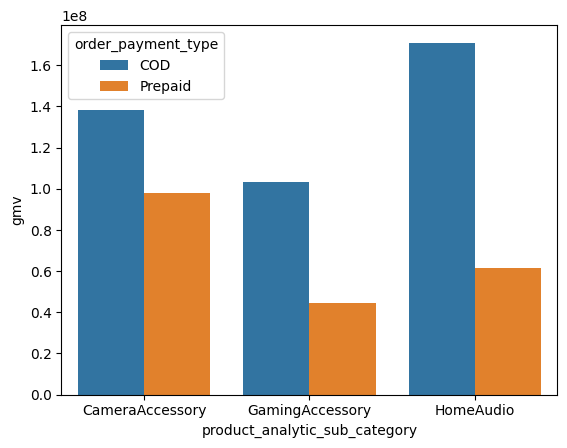

In [65]:
#gmv is our target variable
GMV_Pay = consumerelec_df.groupby(["order_payment_type","product_analytic_sub_category"])['gmv'].sum().reset_index()
sns.barplot(x='product_analytic_sub_category', y='gmv', hue="order_payment_type", data=GMV_Pay)



*   Max revenue for COD order is from the class Home Audio followed by Camera
*   For prepaid orders, the maximum revenue is from Camera Accessory, followed by Home Audio and a slight decrease in the category of Gaming Accessories



<Axes: xlabel='product_analytic_sub_category', ylabel='transaction_count'>

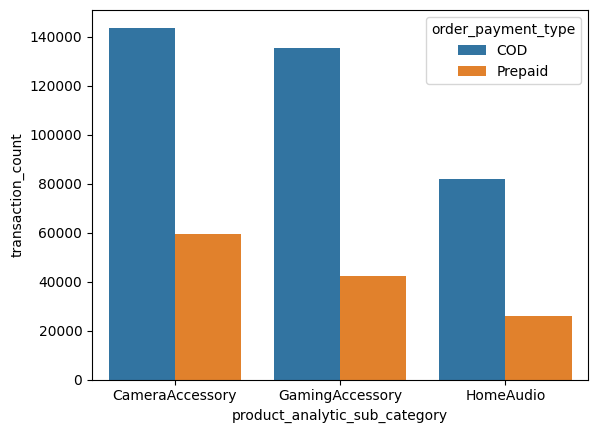

In [66]:
## Order Count vs Payment Type
OC_Payment = consumerelec_df.groupby(["order_payment_type","product_analytic_sub_category"])['gmv'].count().reset_index().rename(columns={'gmv':'transaction_count'})
sns.barplot(x='product_analytic_sub_category', y='transaction_count', hue="order_payment_type", data=OC_Payment)


*   For Camera Accessory , maximum number of orders are by COD mode.
*   For Gaming Accesrsory , maximum orders are again from COD mode.
*   For Home Audio also, maimum orders are from COD mode.

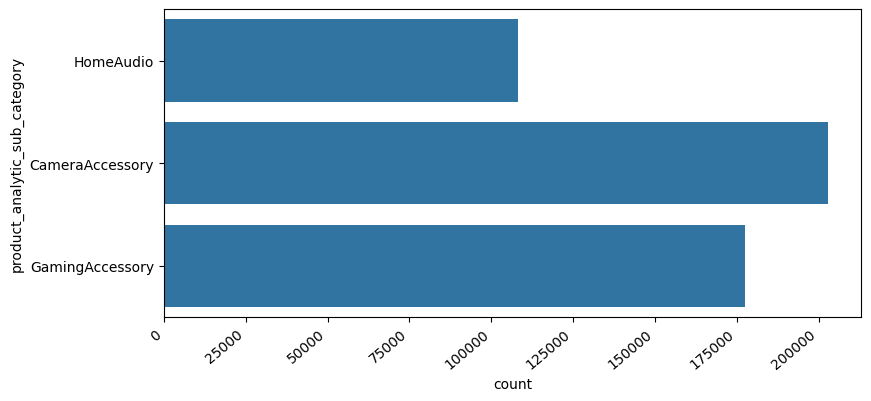

In [67]:
# No of transactions by Sub-Category

plt.figure(figsize = (9,4))
ax = sns.countplot(consumerelec_df['product_analytic_sub_category'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
sns.set_context(font_scale = 1.4)
for p in ax.patches:
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()+20))

Based on our analysis , maximum number of transaction were from Camera Accessory category, then Gaming Accessory , followed by Home Audio category



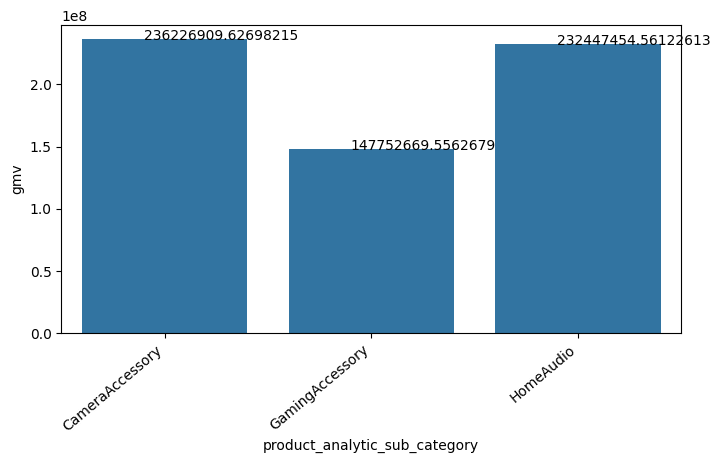

In [68]:
## Total GMV by Sub-Category
plot_gmv =consumerelec_df.groupby('product_analytic_sub_category')['gmv'].sum().reset_index()
plt.figure(figsize = (8,4))
ax = sns.barplot(x='product_analytic_sub_category', y='gmv', data=plot_gmv)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
sns.set_context(font_scale = 1.4)
for p in ax.patches:
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()+20))

The most number of transactions are for Camera Accessory followed by Home Audio & then Gamming Audio



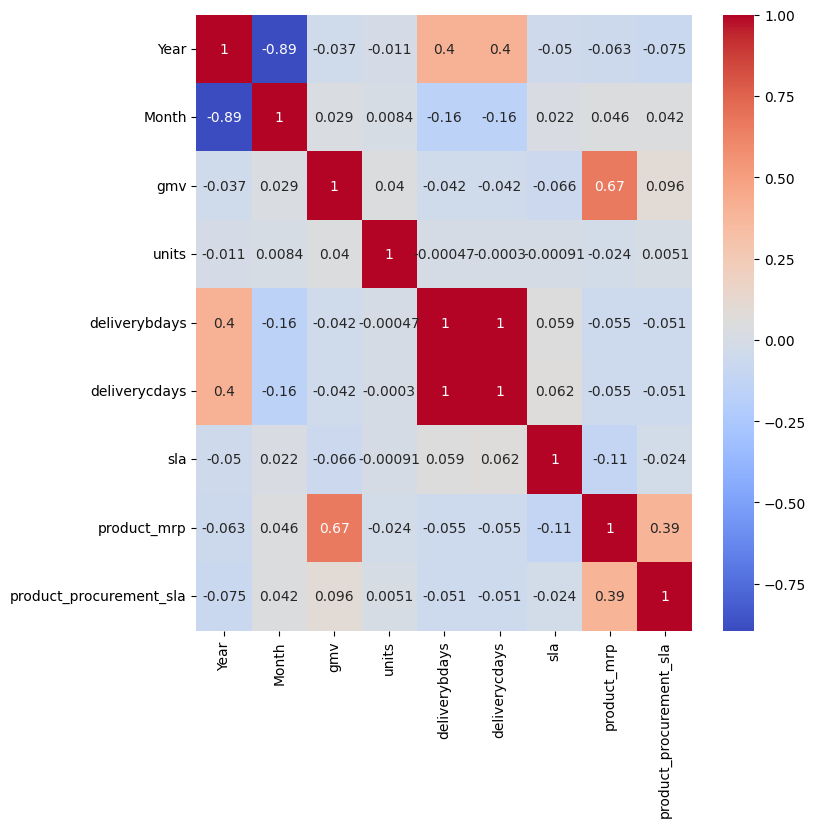

In [69]:
# Drop non-numeric columns temporarily and calculate correlation
corr_matrix = consumerelec_df.select_dtypes(include=['float64', 'int64']).corr()

## checking the correlations
plt.figure(figsize=(8, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

As we can see above, Month & Year is highly correlated|

### Generate week column

In [70]:
# Creating a new column into a specific position in a DataFrame
loc_index = consumerelec_df.columns.get_loc('Month') + 1
consumerelec_df.insert(loc=loc_index,column='Week',value=consumerelec_df['order_date'].dt.strftime("%V"))

consumerelec_df['Year'] = consumerelec_df['Year'].astype('str')
consumerelec_df.head()

,order_date,Year,Month,Week,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,2015-05-19 13:42:09,2015,5,21,146499482,188485029,3149.0,1,0.0,0.0,COD,6,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,6990.0,4
4,2015-06-26 17:27:12,2015,6,26,163409423,207711935,350.0,1,0.0,0.0,COD,5,CameraAccessory,CameraAccessory,CameraAccessory,399.0,3
5,2015-06-26 17:33:10,2015,6,26,163411313,207714163,2800.0,1,0.0,0.0,COD,11,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,3000.0,3
8,2015-07-01 03:35:02,2015,7,27,165165918,209727476,385.0,1,0.0,0.0,Prepaid,10,GamingHardware,GamingAccessory,GamingMouse,699.0,4
17,2015-07-01 08:19:18,2015,7,27,165181041,209744697,1999.0,1,0.0,0.0,Prepaid,1,GamingHardware,GamingAccessory,GamePad,7999.0,3


In [71]:
# Updating the year as 2015 for the week of 53 but belonging to 2016 in accordance with the other data sets
# Updating the month to 12 for consistency in the above rows
# Dropping rows (less in number) with week# 27 as it belongs to the weeks in June 2015
consumerelec_df.loc[(consumerelec_df.Year == '2016') & (consumerelec_df.Week == '53'), 'Year'] = '2015'
consumerelec_df.loc[(consumerelec_df.Year == '2015') & (consumerelec_df.Week == '53'), 'Month'] = 12
consumerelec_df.drop(consumerelec_df[consumerelec_df['Week'] == '27'].index, inplace = True)

In [72]:
consumerelec_df.groupby(['Year', 'Week']).agg({'Month':"count"}).reset_index(drop=False)

,Year,Week,Month
0,2015,21,1
1,2015,26,2
2,2015,28,7815
3,2015,29,8182
4,2015,30,7691
5,2015,31,5348
6,2015,32,9
7,2015,33,4
8,2015,34,2
9,2015,35,2


Drop Insignificant Columns

In [73]:
# Dropping Columns with Single Value or all Different Values

count_df = pd.DataFrame(consumerelec_df.apply(lambda x: len(x.value_counts()), axis=0), columns=['Count'])

drop_columns = list(count_df.loc[(count_df['Count']==1) | (count_df['Count']==len(consumerelec_df.index))].index)

print('Dropping these columns => {}'.format(drop_columns))

consumerelec_df.drop(drop_columns, axis=1, inplace=True)

Dropping these columns => ['order_item_id']


In [74]:
consumerelec_df.head()

,order_date,Year,Month,Week,order_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,2015-05-19 13:42:09,2015,5,21,146499482,3149.0,1,0.0,0.0,COD,6,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,6990.0,4
4,2015-06-26 17:27:12,2015,6,26,163409423,350.0,1,0.0,0.0,COD,5,CameraAccessory,CameraAccessory,CameraAccessory,399.0,3
5,2015-06-26 17:33:10,2015,6,26,163411313,2800.0,1,0.0,0.0,COD,11,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,3000.0,3
293,2015-07-06 05:08:26,2015,7,28,167223837,5398.0,2,0.0,0.0,COD,2,GamingHardware,GamingAccessory,GamePad,4495.0,5
294,2015-07-06 08:15:22,2015,7,28,167234860,4340.0,1,0.0,0.0,Prepaid,1,GamingHardware,GamingAccessory,GamingMouse,5699.0,2


### Creating Column list Price

List Price = GMV/Units



In [75]:
# Creating a new column into a specific position in a DataFrame
loc_indx = consumerelec_df.columns.get_loc('gmv') + 1
consumerelec_df.insert(loc=loc_indx,column='list_price',value = consumerelec_df['gmv'] / consumerelec_df['units'])
consumerelec_df.head()

,order_date,Year,Month,Week,order_id,gmv,list_price,units,deliverybdays,deliverycdays,order_payment_type,sla,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,2015-05-19 13:42:09,2015,5,21,146499482,3149.0,3149.0,1,0.0,0.0,COD,6,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,6990.0,4
4,2015-06-26 17:27:12,2015,6,26,163409423,350.0,350.0,1,0.0,0.0,COD,5,CameraAccessory,CameraAccessory,CameraAccessory,399.0,3
5,2015-06-26 17:33:10,2015,6,26,163411313,2800.0,2800.0,1,0.0,0.0,COD,11,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,3000.0,3
293,2015-07-06 05:08:26,2015,7,28,167223837,5398.0,2699.0,2,0.0,0.0,COD,2,GamingHardware,GamingAccessory,GamePad,4495.0,5
294,2015-07-06 08:15:22,2015,7,28,167234860,4340.0,4340.0,1,0.0,0.0,Prepaid,1,GamingHardware,GamingAccessory,GamingMouse,5699.0,2


Displaying the column values for a few orders when units > 1


In [76]:
consumerelec_df.loc[consumerelec_df['units'] != 1][['gmv','list_price','product_mrp','units']].head()


,gmv,list_price,product_mrp,units
293,5398.0,2699.0,4495.0,2
527,590.0,295.0,500.0,2
629,570.0,285.0,350.0,2
640,570.0,285.0,350.0,2
792,198.0,99.0,599.0,2


### Creating a Payday Flag (+- 1 for salary days)

*If it is nearer to the salary day in Ontario(1st and 15th of every month), we flag the column as 1, else as 0*

In [77]:
consumerelec_df['payday_flag'] = consumerelec_df['order_date'].apply(lambda x:1 if x.strftime('%d') in ('14','15','16','30','31','1','2') else 0)
consumerelec_df.head()

,order_date,Year,Month,Week,order_id,gmv,list_price,units,deliverybdays,deliverycdays,order_payment_type,sla,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag
0,2015-05-19 13:42:09,2015,5,21,146499482,3149.0,3149.0,1,0.0,0.0,COD,6,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,6990.0,4,0
4,2015-06-26 17:27:12,2015,6,26,163409423,350.0,350.0,1,0.0,0.0,COD,5,CameraAccessory,CameraAccessory,CameraAccessory,399.0,3,0
5,2015-06-26 17:33:10,2015,6,26,163411313,2800.0,2800.0,1,0.0,0.0,COD,11,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,3000.0,3,0
293,2015-07-06 05:08:26,2015,7,28,167223837,5398.0,2699.0,2,0.0,0.0,COD,2,GamingHardware,GamingAccessory,GamePad,4495.0,5,0
294,2015-07-06 08:15:22,2015,7,28,167234860,4340.0,4340.0,1,0.0,0.0,Prepaid,1,GamingHardware,GamingAccessory,GamingMouse,5699.0,2,0


### Creating an Occassion Flag

*If it is a Holiday/Occassion in Ontario, we flag the column as 1, else as 0*

The following table lists all the holidays/occassions from 1st July, 2015 to 30th June, 2016**

|Occassion|Day|
|---------|---|
|Canada Day	|July 1, 2015|
|Civic Holiday|	August 3, 2015|
|Labour Day	|September 7, 2015 |
|Thanksgiving|	October 12, 2015|
|Halloween	|October 31, 2015|
|Remembrance Day|	November 11, 2015|
|Christmas Day	|December 25, 2015|
|Boxing Day	|December 26, 2015|
|New Year's Day	|January 1, 2016|
|Islander Day	|February 15, 2016|
|Louis Riel Day	|February 15, 2016|
|Heritage Day	|February 15, 2016|
|Family Day	|February 15, 2016|
|Valentine's Day	|February 14, 2016|
|Leap Day	|February 29, 2016|
|St. Patrick's Day	|March 17, 2016|
|Good Friday	|March 25, 2016|
|Easter Monday	|March 28, 2016|
|Mother's Day	|May 8, 2016|
|Victoria Day	|May 23, 2016|
|Father's Day	|June 19, 2016|
|Aboriginal Day	|June 21, 2016|
|St. Jean Baptiste Day	|June 24, 2016|

**reference link: https://www.statutoryholidays.com/

In [78]:
def holiday_fl(ord_date):
    if ord_date.strftime('%Y') == 2015:
        if ord_date.strftime('%m') == '07' and ord_date.strftime('%d') == '01':
            return 1
        elif ord_date.strftime('%m') == '08' and ord_date.strftime('%d') == '03':
            return 1
        elif ord_date.strftime('%m') == '09' and ord_date.strftime('%d') == '07':
            return 1
        elif ord_date.strftime('%m') == '10' and ord_date.strftime('%d') == '12':
            return 1
        elif ord_date.strftime('%m') == '10' and ord_date.strftime('%d') == '31':
            return 1
        elif ord_date.strftime('%m') == '11' and ord_date.strftime('%d') == '11':
            return 1
        elif ord_date.strftime('%m') == '12' and ord_date.strftime('%d') == '25':
            return 1
        elif ord_date.strftime('%m') == '12' and ord_date.strftime('%d') == '26':
            return 1
        else:
            return 0
    else:
        if ord_date.strftime('%m') == '01' and ord_date.strftime('%d') == '01':
            return 1
        elif ord_date.strftime('%m') == '02' and ord_date.strftime('%d') == '15':
            return 1
        elif ord_date.strftime('%m') == '02' and ord_date.strftime('%d') == '14':
            return 1
        elif ord_date.strftime('%m') == '02' and ord_date.strftime('%d') =='29':
            return 1
        elif ord_date.strftime('%m') == '03' and ord_date.strftime('%d') == '17':
            return 1
        elif ord_date.strftime('%m') == '03' and ord_date.strftime('%d') == '25':
            return 1
        elif ord_date.strftime('%m') == '03' and ord_date.strftime('%d') == '28':
            return 1
        elif ord_date.strftime('%m') == '05' and ord_date.strftime('%d') == '08':
            return 1
        elif ord_date.strftime('%m') == '05' and ord_date.strftime('%d') == '23':
            return 1
        elif ord_date.strftime('%m') == '06' and ord_date.strftime('%d') == '19':
            return 1
        elif ord_date.strftime('%m') == '06' and ord_date.strftime('%d') == '21':
            return 1
        elif ord_date.strftime('%m') == '06' and ord_date.strftime('%d') == '24':
            return 1
        else:
            return 0

In [79]:
consumerelec_df['hld_flag'] = consumerelec_df['order_date'].apply(lambda x:holiday_fl(x))
consumerelec_df.head()

,order_date,Year,Month,Week,order_id,gmv,list_price,units,deliverybdays,deliverycdays,order_payment_type,sla,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag,hld_flag
0,2015-05-19 13:42:09,2015,5,21,146499482,3149.0,3149.0,1,0.0,0.0,COD,6,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,6990.0,4,0,0
4,2015-06-26 17:27:12,2015,6,26,163409423,350.0,350.0,1,0.0,0.0,COD,5,CameraAccessory,CameraAccessory,CameraAccessory,399.0,3,0,0
5,2015-06-26 17:33:10,2015,6,26,163411313,2800.0,2800.0,1,0.0,0.0,COD,11,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,3000.0,3,0,0
293,2015-07-06 05:08:26,2015,7,28,167223837,5398.0,2699.0,2,0.0,0.0,COD,2,GamingHardware,GamingAccessory,GamePad,4495.0,5,0,0
294,2015-07-06 08:15:22,2015,7,28,167234860,4340.0,4340.0,1,0.0,0.0,Prepaid,1,GamingHardware,GamingAccessory,GamingMouse,5699.0,2,0,0


### Creating a column called Product Type - Luxury / Mass_market

*If GMV value is greater than 80 percentile, then luxury, else mass_market*

In [80]:
pd.DataFrame(consumerelec_df['gmv']).describe(percentiles=[.70,.80,.90]).T


,count,mean,std,min,50%,70%,80%,90%,max
gmv,488401.0,1261.6,2358.0,0.0,549.0,1150.0,1849.0,2750.0,148050.0


In [81]:
consumerelec_df['gmv'].quantile(.8)


1849.0

In [82]:
consumerelec_df['product_type'] = consumerelec_df['gmv'].apply(lambda x:'Premium_product' if x >= 1849 else 'mass_market')
consumerelec_df.head()

,order_date,Year,Month,Week,order_id,gmv,list_price,units,deliverybdays,deliverycdays,order_payment_type,sla,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag,hld_flag,product_type
0,2015-05-19 13:42:09,2015,5,21,146499482,3149.0,3149.0,1,0.0,0.0,COD,6,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,6990.0,4,0,0,Premium_product
4,2015-06-26 17:27:12,2015,6,26,163409423,350.0,350.0,1,0.0,0.0,COD,5,CameraAccessory,CameraAccessory,CameraAccessory,399.0,3,0,0,mass_market
5,2015-06-26 17:33:10,2015,6,26,163411313,2800.0,2800.0,1,0.0,0.0,COD,11,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,3000.0,3,0,0,Premium_product
293,2015-07-06 05:08:26,2015,7,28,167223837,5398.0,2699.0,2,0.0,0.0,COD,2,GamingHardware,GamingAccessory,GamePad,4495.0,5,0,0,Premium_product
294,2015-07-06 08:15:22,2015,7,28,167234860,4340.0,4340.0,1,0.0,0.0,Prepaid,1,GamingHardware,GamingAccessory,GamingMouse,5699.0,2,0,0,Premium_product


### Calculating Discount %

#### Discount = (product_mrp - list_price) / product_mrp

In [83]:
# Create a new column
column_loc = consumerelec_df.columns.get_loc('list_price') + 1
consumerelec_df.insert(loc=column_loc, column='Discount%', value = round(100*((consumerelec_df['product_mrp'] - consumerelec_df['list_price']) / consumerelec_df['product_mrp']),2))
consumerelec_df.head()

,order_date,Year,Month,Week,order_id,gmv,list_price,Discount%,units,deliverybdays,deliverycdays,order_payment_type,sla,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag,hld_flag,product_type
0,2015-05-19 13:42:09,2015,5,21,146499482,3149.0,3149.0,55.0,1,0.0,0.0,COD,6,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,6990.0,4,0,0,Premium_product
4,2015-06-26 17:27:12,2015,6,26,163409423,350.0,350.0,12.3,1,0.0,0.0,COD,5,CameraAccessory,CameraAccessory,CameraAccessory,399.0,3,0,0,mass_market
5,2015-06-26 17:33:10,2015,6,26,163411313,2800.0,2800.0,6.7,1,0.0,0.0,COD,11,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,3000.0,3,0,0,Premium_product
293,2015-07-06 05:08:26,2015,7,28,167223837,5398.0,2699.0,40.0,2,0.0,0.0,COD,2,GamingHardware,GamingAccessory,GamePad,4495.0,5,0,0,Premium_product
294,2015-07-06 08:15:22,2015,7,28,167234860,4340.0,4340.0,23.9,1,0.0,0.0,Prepaid,1,GamingHardware,GamingAccessory,GamingMouse,5699.0,2,0,0,Premium_product


Working with mrp, gmv and units


In [84]:
#  Product mrp, gmv and units cannot be 0
consumerelec_df = consumerelec_df[(consumerelec_df['product_mrp']>0) & (consumerelec_df['gmv']>0) & (consumerelec_df['units']>0)]

In [85]:
# mrp*units should be greater or equal to GMV
# mrp*units >= GMV d

consumerelec_df= consumerelec_df[(consumerelec_df.product_mrp*consumerelec_df.units) >= consumerelec_df.gmv]

In [86]:
pd.options.display.float_format = '{:.2f}'.format


## Create Dummy Variables

In [87]:
#create dummy variables for order_payment_type
pay_dummy = pd.get_dummies(consumerelec_df['order_payment_type'], drop_first = True, prefix = 'order_payment_type')

In [88]:
consumerelec_df = pd.concat([consumerelec_df, pay_dummy], axis = 1)
consumerelec_df.drop(['order_payment_type'], axis = 1, inplace = True)
consumerelec_df.head()

,order_date,Year,Month,Week,order_id,gmv,list_price,Discount%,units,deliverybdays,deliverycdays,sla,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag,hld_flag,product_type,order_payment_type_Prepaid
0,2015-05-19 13:42:09,2015,5,21,146499482,3149.00,3149.00,54.95,1,0.00,0.00,6,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,6990.00,4,0,0,Premium_product,False
4,2015-06-26 17:27:12,2015,6,26,163409423,350.00,350.00,12.28,1,0.00,0.00,5,CameraAccessory,CameraAccessory,CameraAccessory,399.00,3,0,0,mass_market,False
5,2015-06-26 17:33:10,2015,6,26,163411313,2800.00,2800.00,6.67,1,0.00,0.00,11,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,3000.00,3,0,0,Premium_product,False
293,2015-07-06 05:08:26,2015,7,28,167223837,5398.00,2699.00,39.96,2,0.00,0.00,2,GamingHardware,GamingAccessory,GamePad,4495.00,5,0,0,Premium_product,False
294,2015-07-06 08:15:22,2015,7,28,167234860,4340.00,4340.00,23.85,1,0.00,0.00,1,GamingHardware,GamingAccessory,GamingMouse,5699.00,2,0,0,Premium_product,True


### Filtering the data from July 2015 to June 2016


In [89]:
consumerelec_df = consumerelec_df[(consumerelec_df['order_date'] >="2015-07-01") & (consumerelec_df['order_date'] <="2016-06-30")]


In [90]:
consumerelec_df.shape


(487033, 21)

In [91]:
#Create Date column without timestamp
consumerelec_df['Date'] = pd.to_datetime(consumerelec_df['order_date'].dt.date)

In [92]:
consumerelec_df.head()

,order_date,Year,Month,Week,order_id,gmv,list_price,Discount%,units,deliverybdays,deliverycdays,sla,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag,hld_flag,product_type,order_payment_type_Prepaid,Date
293,2015-07-06 05:08:26,2015,7,28,167223837,5398.00,2699.00,39.96,2,0.00,0.00,2,GamingHardware,GamingAccessory,GamePad,4495.00,5,0,0,Premium_product,False,2015-07-06
294,2015-07-06 08:15:22,2015,7,28,167234860,4340.00,4340.00,23.85,1,0.00,0.00,1,GamingHardware,GamingAccessory,GamingMouse,5699.00,2,0,0,Premium_product,True,2015-07-06
296,2015-07-06 09:00:55,2015,7,28,167241120,139.00,139.00,53.51,1,0.00,0.00,8,GamingHardware,GamingAccessory,TVOutCableAccessory,299.00,4,0,0,mass_market,True,2015-07-06
303,2015-07-07 00:02:01,2015,7,28,167584636,949.00,949.00,36.73,1,0.00,0.00,9,CameraAccessory,CameraAccessory,Binoculars,1500.00,2,0,0,mass_market,False,2015-07-07
306,2015-07-07 00:03:19,2015,7,28,167584146,4750.00,4750.00,4.98,1,0.00,0.00,6,GamingHardware,GamingAccessory,MotionController,4999.00,2,0,0,Premium_product,False,2015-07-07


In [93]:
# checking product_analytic_category
consumerelec_df['product_analytic_category'].value_counts()

,count
product_analytic_category,
CameraAccessory,202380
GamingHardware,176816
EntertainmentSmall,107837


In [94]:
#checking product_analytic_sub_category
consumerelec_df['product_analytic_sub_category'].value_counts()

,count
product_analytic_sub_category,
CameraAccessory,202380
GamingAccessory,176816
HomeAudio,107837


In [95]:
consumerelec_df['product_analytic_vertical'].value_counts()

,count
product_analytic_vertical,
HomeAudioSpeaker,74621
GamingHeadset,58456
GamePad,49106
Flash,46956
GamingMouse,34087
CameraBattery,32317
CameraTripod,29815
Lens,29392
FMRadio,23816


In [96]:
Total_gmv = sum(consumerelec_df['gmv'])
Total_gmv

614520462.7444761

In [97]:
consumerelec_df.shape


(487033, 22)

In [98]:
gmv_sum = pd.DataFrame(consumerelec_df.groupby('product_analytic_sub_category',as_index=False)['gmv'].sum())
gmv_sum

,product_analytic_sub_category,gmv
0,CameraAccessory,235446843.63
1,GamingAccessory,147203321.56
2,HomeAudio,231870297.56


### Calculate GMV % to derive the marketing spend


In [99]:
# calculate GMV % to derive the marketing spend
gmv_sum['gmv'] = gmv_sum.gmv/Total_gmv
gmv_sum

,product_analytic_sub_category,gmv
0,CameraAccessory,0.38
1,GamingAccessory,0.24
2,HomeAudio,0.38


In [100]:
consumerelec_df['product_analytic_sub_category'].value_counts()


,count
product_analytic_sub_category,
CameraAccessory,202380
GamingAccessory,176816
HomeAudio,107837


In [101]:
consumerelec_df.head()


,order_date,Year,Month,Week,order_id,gmv,list_price,Discount%,units,deliverybdays,deliverycdays,sla,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag,hld_flag,product_type,order_payment_type_Prepaid,Date
293,2015-07-06 05:08:26,2015,7,28,167223837,5398.00,2699.00,39.96,2,0.00,0.00,2,GamingHardware,GamingAccessory,GamePad,4495.00,5,0,0,Premium_product,False,2015-07-06
294,2015-07-06 08:15:22,2015,7,28,167234860,4340.00,4340.00,23.85,1,0.00,0.00,1,GamingHardware,GamingAccessory,GamingMouse,5699.00,2,0,0,Premium_product,True,2015-07-06
296,2015-07-06 09:00:55,2015,7,28,167241120,139.00,139.00,53.51,1,0.00,0.00,8,GamingHardware,GamingAccessory,TVOutCableAccessory,299.00,4,0,0,mass_market,True,2015-07-06
303,2015-07-07 00:02:01,2015,7,28,167584636,949.00,949.00,36.73,1,0.00,0.00,9,CameraAccessory,CameraAccessory,Binoculars,1500.00,2,0,0,mass_market,False,2015-07-07
306,2015-07-07 00:03:19,2015,7,28,167584146,4750.00,4750.00,4.98,1,0.00,0.00,6,GamingHardware,GamingAccessory,MotionController,4999.00,2,0,0,Premium_product,False,2015-07-07


### Reading product list


In [102]:
product_list=pd.read_excel('/content/drive/MyDrive/IIIT-B/Capstone_Project/E-Commerce_Capstone_Dataset/Media data and other information.xlsx',skiprows=1,usecols='B:D')
product_list.columns=['Products', 'Frequency', 'Percent']
product_list.head()

,Products,Frequency,Percent
0,\N,5828,0.35
1,AmplifierReceiver,4056,0.25
2,AudioMP3Player,112892,6.85
3,Binoculars,14599,0.89
4,BoomBox,2879,0.17


In [103]:
#drop product with name \N
product_list.drop(index = 0, inplace = True)
product_list.head()

,Products,Frequency,Percent
1,AmplifierReceiver,4056,0.25
2,AudioMP3Player,112892,6.85
3,Binoculars,14599,0.89
4,BoomBox,2879,0.17
5,Camcorders,987,0.06


### Making holiday information usable


In [104]:
sale_calendar = pd.read_excel('/content/drive/MyDrive/IIIT-B/Capstone_Project/E-Commerce_Capstone_Dataset/Media data and other information.xlsx', sheet_name='Special Sale Calendar', \
                              skiprows=0, skipfooter=2)

sale_calendar.drop(sale_calendar.columns[0], axis=1, inplace = True)

sale_calendar.iloc[1:6, 0] = sale_calendar.iloc[0, 0]
sale_calendar.iloc[7:, 0] = sale_calendar.iloc[6, 0]

sale_calendar.columns=["Year", "Event"]
sale_calendar

,Year,Event
0,2015.00,(18-19th July)
1,2015.00,(15-17th Aug)
2,2015.00,(28-30th Aug)
3,2015.00,(15-17th Oct)
4,2015.00,(7-14th Nov)
5,2015.00,(25th Dec'15 - 3rd Jan'16)
6,2016.00,(20-22 Jan)
7,2016.00,(1-2 Feb)
8,2016.00,(20-21 Feb)
9,2016.00,(14-15 Feb)


In [105]:
#cleaning dataset
sale_calendar = sale_calendar.drop(sale_calendar.index[-1])
#impute NAs with the previous observation
sale_calendar= sale_calendar.ffill()
#Changing datatype of year from float to int
sale_calendar['Year']=sale_calendar['Year'].astype(int)

In [106]:
#Replacing extra chars to ''
sale_calendar['Event']=sale_calendar['Event'].str.replace('th','')
sale_calendar['Event']=sale_calendar['Event'].str.replace('rd','')
sale_calendar['Event']=sale_calendar['Event'].str.replace(')','')
sale_calendar['Event']=sale_calendar['Event'].str.replace('(','')

In [107]:
sale_calendar

,Year,Event
0,2015,18-19 July
1,2015,15-17 Aug
2,2015,28-30 Aug
3,2015,15-17 Oct
4,2015,7-14 Nov
5,2015,25 Dec'15 - 3 Jan'16
6,2016,20-22 Jan
7,2016,1-2 Feb
8,2016,20-21 Feb


In [108]:
#filtering rows
#Getting start day and end day of sale
sale_calendar[['start','end']] = sale_calendar.Event.str.split("-",expand=True)

In [109]:
#Remove leading and trailing spaces
sale_calendar['start']= sale_calendar['start'].str.strip()
sale_calendar['end']= sale_calendar['end'].str.strip()

In [110]:
#Getting start and end month
sale_calendar[['start','start_month']]=sale_calendar.start.str.split(" ",expand=True)
sale_calendar[['end','end_month']]=sale_calendar.end.str.split(" ",expand=True)
sale_calendar['start_month'] = np.where(sale_calendar['start_month'].isna(), sale_calendar['end_month'], sale_calendar['start_month'])

In [111]:
#Dealing with exceptional columns
sale_calendar['start_month']= sale_calendar['start_month'].str.replace('\'15','')
sale_calendar['end_month']= sale_calendar['end_month'].str.replace('\'16','')

Sale year


In [112]:
# sale year
sale_calendar['end_year']= sale_calendar['Year']
sale_calendar['end_year']= np.where(sale_calendar['end_month']=='Jan',2016,sale_calendar['Year'])

In [113]:
# final sale start date and end date
sale_calendar['start_date']=sale_calendar['start']+'-'+ sale_calendar['start_month']+'-'+ sale_calendar['Year'].astype(str)
sale_calendar['end_date']=sale_calendar['end']+'-'+ sale_calendar['end_month']+'-'+sale_calendar['end_year'].astype(str)

In [114]:
#Convert to datetime format
sale_calendar['start_date']=pd.to_datetime(sale_calendar['start_date'], format='mixed')
sale_calendar['end_date']=pd.to_datetime(sale_calendar['end_date'], format='mixed')

In [115]:
# when start date > end date
sale_calendar["start_date"], sale_calendar["end_date"] = np.where(sale_calendar['start_date']>sale_calendar['end_date'],
                                              [sale_calendar['end_date'], sale_calendar['start_date']],
                                              [sale_calendar['start_date'], sale_calendar['end_date']])

days count for sale

In [116]:
#days count for sale
import datetime
sale_calendar['NumDays']=sale_calendar['end_date'] - sale_calendar['start_date'] + datetime.timedelta(days=1)

In [117]:
sale_calendar

,Year,Event,start,end,start_month,end_month,end_year,start_date,end_date,NumDays
0,2015,18-19 July,18,19,July,July,2015,2015-07-18,2015-07-19,2 days
1,2015,15-17 Aug,15,17,Aug,Aug,2015,2015-08-15,2015-08-17,3 days
2,2015,28-30 Aug,28,30,Aug,Aug,2015,2015-08-28,2015-08-30,3 days
3,2015,15-17 Oct,15,17,Oct,Oct,2015,2015-10-15,2015-10-17,3 days
4,2015,7-14 Nov,7,14,Nov,Nov,2015,2015-11-07,2015-11-14,8 days
5,2015,25 Dec'15 - 3 Jan'16,25,3,Dec,Jan,2016,2015-12-25,2016-01-03,10 days
6,2016,20-22 Jan,20,22,Jan,Jan,2016,2016-01-20,2016-01-22,3 days
7,2016,1-2 Feb,1,2,Feb,Feb,2016,2016-02-01,2016-02-02,2 days
8,2016,20-21 Feb,20,21,Feb,Feb,2016,2016-02-20,2016-02-21,2 days


Extract sale dates


In [118]:
#Extarct sale dates
Extract_date=[]
for i in range(0,len(sale_calendar)):
    for j in range(1,(sale_calendar['NumDays'].dt.days)[i]+1):
        Extract_date.append(sale_calendar['start_date'][i] + datetime.timedelta(days=j-1))

In [119]:
Extract_date=pd.DataFrame(Extract_date,columns=['EventDate'])

In [120]:
Extract_date.head()

,EventDate
0,2015-07-18
1,2015-07-19
2,2015-08-15
3,2015-08-16
4,2015-08-17


In [121]:
consumerelec_df = consumerelec_df.merge(Extract_date, how='left',left_on = "Date", right_on = "EventDate")

In [122]:
consumerelec_df.head()

,order_date,Year,Month,Week,order_id,gmv,list_price,Discount%,units,deliverybdays,deliverycdays,sla,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag,hld_flag,product_type,order_payment_type_Prepaid,Date,EventDate
0,2015-07-06 05:08:26,2015,7,28,167223837,5398.00,2699.00,39.96,2,0.00,0.00,2,GamingHardware,GamingAccessory,GamePad,4495.00,5,0,0,Premium_product,False,2015-07-06,NaT
1,2015-07-06 08:15:22,2015,7,28,167234860,4340.00,4340.00,23.85,1,0.00,0.00,1,GamingHardware,GamingAccessory,GamingMouse,5699.00,2,0,0,Premium_product,True,2015-07-06,NaT
2,2015-07-06 09:00:55,2015,7,28,167241120,139.00,139.00,53.51,1,0.00,0.00,8,GamingHardware,GamingAccessory,TVOutCableAccessory,299.00,4,0,0,mass_market,True,2015-07-06,NaT
3,2015-07-07 00:02:01,2015,7,28,167584636,949.00,949.00,36.73,1,0.00,0.00,9,CameraAccessory,CameraAccessory,Binoculars,1500.00,2,0,0,mass_market,False,2015-07-07,NaT
4,2015-07-07 00:03:19,2015,7,28,167584146,4750.00,4750.00,4.98,1,0.00,0.00,6,GamingHardware,GamingAccessory,MotionController,4999.00,2,0,0,Premium_product,False,2015-07-07,NaT


In [123]:
#checking missing values
consumerelec_df.isna().sum()

,0
order_date,0
Year,0
Month,0
Week,0
order_id,0
gmv,0
list_price,0
Discount%,0
units,0
deliverybdays,0


In [124]:
consumerelec_df['special_sales'] = np.where(consumerelec_df.EventDate.isna(),0,1)

In [125]:
consumerelec_df=consumerelec_df.drop('EventDate',axis=1)
consumerelec_df.head()

,order_date,Year,Month,Week,order_id,gmv,list_price,Discount%,units,deliverybdays,deliverycdays,sla,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag,hld_flag,product_type,order_payment_type_Prepaid,Date,special_sales
0,2015-07-06 05:08:26,2015,7,28,167223837,5398.00,2699.00,39.96,2,0.00,0.00,2,GamingHardware,GamingAccessory,GamePad,4495.00,5,0,0,Premium_product,False,2015-07-06,0
1,2015-07-06 08:15:22,2015,7,28,167234860,4340.00,4340.00,23.85,1,0.00,0.00,1,GamingHardware,GamingAccessory,GamingMouse,5699.00,2,0,0,Premium_product,True,2015-07-06,0
2,2015-07-06 09:00:55,2015,7,28,167241120,139.00,139.00,53.51,1,0.00,0.00,8,GamingHardware,GamingAccessory,TVOutCableAccessory,299.00,4,0,0,mass_market,True,2015-07-06,0
3,2015-07-07 00:02:01,2015,7,28,167584636,949.00,949.00,36.73,1,0.00,0.00,9,CameraAccessory,CameraAccessory,Binoculars,1500.00,2,0,0,mass_market,False,2015-07-07,0
4,2015-07-07 00:03:19,2015,7,28,167584146,4750.00,4750.00,4.98,1,0.00,0.00,6,GamingHardware,GamingAccessory,MotionController,4999.00,2,0,0,Premium_product,False,2015-07-07,0


Avearge sales


In [126]:
#avearge sales
consumerelec_df[consumerelec_df['special_sales']==1].gmv.mean()

1309.3470532682904

In [127]:
consumerelec_df[consumerelec_df['special_sales']==0].gmv.mean()

1254.209879485213

In [128]:
consumerelec_df[consumerelec_df['special_sales']==1].gmv.sum()

87362254.08816688

In [129]:
consumerelec_df[consumerelec_df['special_sales']==0].gmv.sum()

527158208.65630937

In [130]:
sale_calendar['NumDays'].dt.days.sum()

36

EDA for sales on special sales day


<Axes: xlabel='Week', ylabel='gmv'>

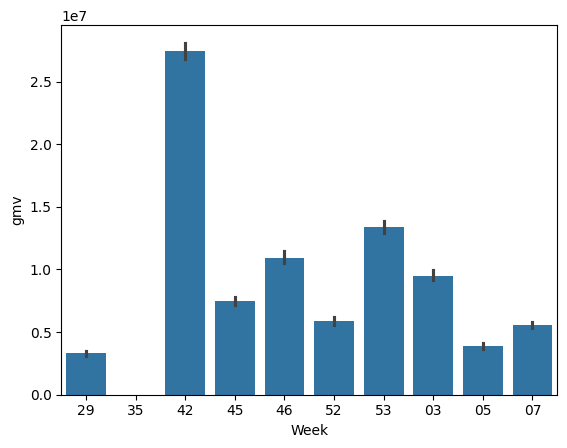

In [131]:
import seaborn as sns
sns.barplot(x = 'Week', y = 'gmv', data = consumerelec_df[consumerelec_df['special_sales']==1], estimator = np.sum)

<Axes: xlabel='Week', ylabel='gmv'>

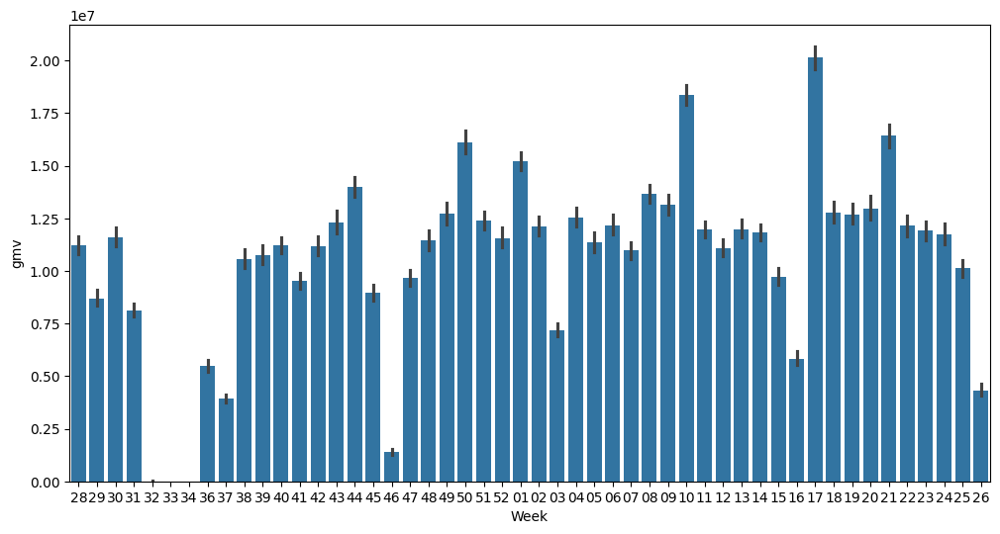

In [132]:
plt.figure(figsize = (12,6))
sns.barplot(x = 'Week', y = 'gmv', data = consumerelec_df[consumerelec_df['special_sales']==0], estimator = np.sum)

### Mapping months to a month's number of weeks


In [133]:
import calendar

def Week_finder_from_Year(year):
        """ will return all the week from selected year """

        import datetime

        WEEK = {'MONDAY':0,'TUESDAY':1,'WEDNESDAY':2,'THURSDAY':3,'FRIDAY':4,'SATURDAY':5,'SUNDAY':6}
        MONTH = {'JANUARY':1,'FEBRUARY':2,'MARCH':3,'APRIL':4,'MAY':5,'JUNE':6,'JULY':7,'AUGUST':8,'SEPTEMBER':9,'OCTOBER':10,'NOVEMBER':11,'DECEMBER':12}

        year = int(year)
        month = MONTH['JANUARY']
        day = WEEK['MONDAY']

        dt = datetime.date(year, month, 1)
        dow_lst = []

        while dt.weekday() != day:
            dt = dt + datetime.timedelta(days = 1)

        lst_month = MONTH.values()

        for mont in lst_month:
         while dt.month == mont:
            dow_lst.append(dt)
            dt = dt + datetime.timedelta(days=7)

        month_number_week = {1:[], 2:[], 3:[], 4:[], 5:[], 6:[], 7:[], 8:[], 9:[], 10:[], 11:[], 12:[]}
        month_name_week = {'Jan':[], 'Feb':[], 'Mar':[], 'Apr':[], 'May':[], 'Jun':[], 'Jul':[], 'Aug':[], 'Sep':[], 'Oct':[], 'Nov':[], 'Dec':[]}

        for each in dow_lst:
            month_number_week[each.month].append(each.isocalendar()[1])
            month_name_week[calendar.month_abbr[each.month]].append(each.isocalendar()[1])

        return month_number_week, month_name_week

In [134]:
dict_number_2015, dict_name_2015 = Week_finder_from_Year(2015)
print(dict_number_2015)
print(dict_name_2015)

{1: [2, 3, 4, 5], 2: [6, 7, 8, 9], 3: [10, 11, 12, 13, 14], 4: [15, 16, 17, 18], 5: [19, 20, 21, 22], 6: [23, 24, 25, 26, 27], 7: [28, 29, 30, 31], 8: [32, 33, 34, 35, 36], 9: [37, 38, 39, 40], 10: [41, 42, 43, 44], 11: [45, 46, 47, 48, 49], 12: [50, 51, 52, 53]}
{'Jan': [2, 3, 4, 5], 'Feb': [6, 7, 8, 9], 'Mar': [10, 11, 12, 13, 14], 'Apr': [15, 16, 17, 18], 'May': [19, 20, 21, 22], 'Jun': [23, 24, 25, 26, 27], 'Jul': [28, 29, 30, 31], 'Aug': [32, 33, 34, 35, 36], 'Sep': [37, 38, 39, 40], 'Oct': [41, 42, 43, 44], 'Nov': [45, 46, 47, 48, 49], 'Dec': [50, 51, 52, 53]}


In [135]:
dict_number_2016, dict_name_2016 =Week_finder_from_Year(2016)
print(dict_number_2016)
print(dict_name_2016)

{1: [1, 2, 3, 4], 2: [5, 6, 7, 8, 9], 3: [10, 11, 12, 13], 4: [14, 15, 16, 17], 5: [18, 19, 20, 21, 22], 6: [23, 24, 25, 26], 7: [27, 28, 29, 30], 8: [31, 32, 33, 34, 35], 9: [36, 37, 38, 39], 10: [40, 41, 42, 43, 44], 11: [45, 46, 47, 48], 12: [49, 50, 51, 52]}
{'Jan': [1, 2, 3, 4], 'Feb': [5, 6, 7, 8, 9], 'Mar': [10, 11, 12, 13], 'Apr': [14, 15, 16, 17], 'May': [18, 19, 20, 21, 22], 'Jun': [23, 24, 25, 26], 'Jul': [27, 28, 29, 30], 'Aug': [31, 32, 33, 34, 35], 'Sep': [36, 37, 38, 39], 'Oct': [40, 41, 42, 43, 44], 'Nov': [45, 46, 47, 48], 'Dec': [49, 50, 51, 52]}


In [136]:
num_weeks_2015 = 0
num_weeks_2016 = 0

for i in dict_number_2015:
    if i >= 7:
        num_weeks_2015 += len(dict_number_2015[i])

for i in dict_number_2016:
    if i <= 6:
        num_weeks_2016 += len(dict_number_2016[i])

total_weeks = num_weeks_2015 + num_weeks_2016
total_weeks

52

There are total of 52 weeks in our dataset. Which is correct & expected.

### Media Investment


In [137]:
media_investment = pd.read_excel("/content/drive/MyDrive/IIIT-B/Capstone_Project/E-Commerce_Capstone_Dataset/Media data and other information.xlsx", sheet_name = 1,skiprows=2,usecols = 'B:M')

In [138]:
media_investment.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.00,7.00,17.06,0.22,2.53,7.41,0.00,1.33,0.55,5.02,NaN,NaN
1,2015.00,8.00,5.06,0.01,1.28,1.06,0.00,0.13,0.07,2.51,NaN,NaN
2,2015.00,9.00,96.25,3.88,1.36,62.79,0.61,16.38,5.04,6.20,NaN,NaN
3,2015.00,10.00,170.16,6.14,12.62,84.67,3.44,24.37,6.97,31.93,NaN,NaN
4,2015.00,11.00,51.22,4.22,1.28,14.17,0.17,19.56,6.60,5.22,NaN,NaN


In [139]:
# Imputing nulls with 0

media_investment['Radio'].fillna(value=0, inplace=True)
media_investment['Other'].fillna(value=0, inplace=True)

media_investment.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.00,7.00,17.06,0.22,2.53,7.41,0.00,1.33,0.55,5.02,0.00,0.00
1,2015.00,8.00,5.06,0.01,1.28,1.06,0.00,0.13,0.07,2.51,0.00,0.00
2,2015.00,9.00,96.25,3.88,1.36,62.79,0.61,16.38,5.04,6.20,0.00,0.00
3,2015.00,10.00,170.16,6.14,12.62,84.67,3.44,24.37,6.97,31.93,0.00,0.00
4,2015.00,11.00,51.22,4.22,1.28,14.17,0.17,19.56,6.60,5.22,0.00,0.00


In [140]:
# Temp DataFrame

temp_media_investment = pd.DataFrame(index=range(total_weeks), columns=['Year', 'Month', 'Week', 'Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'])

temp_media_investment.head()

,Year,Month,Week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


The monthly values are divided by the number of weeks in that month and taken as weekly data



In [141]:
i = 0

for index, row in media_investment.iterrows():

    if row.Year == 2015:

        num_weeks = len(dict_number_2015[row.Month])

        for week in dict_number_2015[row.Month]:

            temp_media_investment.iloc[i].Year = row.Year
            temp_media_investment.iloc[i].Month = row.Month
            temp_media_investment.iloc[i]['Week'] = week
            temp_media_investment.iloc[i]['Total Investment'] = round(row['Total Investment'] / num_weeks, 3)
            temp_media_investment.iloc[i]['TV'] = round(row['TV'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Digital'] = round(row['Digital'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Sponsorship'] = round(row['Sponsorship'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Content Marketing'] = round(row['Content Marketing'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Online marketing'] = round(row['Online marketing'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Affiliates'] = round(row[' Affiliates'] / num_weeks, 3)
            temp_media_investment.iloc[i]['SEM'] = round(row['SEM'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Radio'] = round(row['Radio'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Other'] = round(row['Other'] / num_weeks, 3)

            i+=1

    elif row.Year == 2016:

        num_weeks = len(dict_number_2016[row.Month])

        for week in dict_number_2016[row.Month]:

            temp_media_investment.iloc[i].Year = row.Year
            temp_media_investment.iloc[i].Month = row.Month
            temp_media_investment.iloc[i]['Week'] = week
            temp_media_investment.iloc[i]['Total Investment'] = round(row['Total Investment'] / num_weeks, 3)
            temp_media_investment.iloc[i]['TV'] = round(row['TV'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Digital'] = round(row['Digital'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Sponsorship'] = round(row['Sponsorship'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Content Marketing'] = round(row['Content Marketing'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Online marketing'] = round(row['Online marketing'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Affiliates'] = round(row[' Affiliates'] / num_weeks, 3)
            temp_media_investment.iloc[i]['SEM'] = round(row['SEM'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Radio'] = round(row['Radio'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Other'] = round(row['Other'] / num_weeks, 3)

            i+=1

temp_media_investment.head()

,Year,Month,Week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.00,7.00,28,4.26,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
1,2015.00,7.00,29,4.26,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
2,2015.00,7.00,30,4.26,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
3,2015.00,7.00,31,4.26,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
4,2015.00,8.00,32,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00


In [142]:
temp_media_investment['Week'] = temp_media_investment['Week'].astype('str')

In [143]:
media_investment = temp_media_investment

media_investment.head()

,Year,Month,Week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.00,7.00,28,4.26,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
1,2015.00,7.00,29,4.26,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
2,2015.00,7.00,30,4.26,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
3,2015.00,7.00,31,4.26,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
4,2015.00,8.00,32,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00


In [144]:
# Check for duplicates
media_investment.duplicated('Week').value_counts()

,count
False,52


In [145]:
# Check for nulls
media_investment.isnull().values.any()

False

In [146]:
# Drop Year and Month column

del media_investment['Year']
del media_investment['Month']
media_investment.head()

,Week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,28,4.26,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
1,29,4.26,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
2,30,4.26,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
3,31,4.26,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
4,32,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00


In [147]:
original_column = media_investment.columns[1:]
original_column

Index(['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'], dtype='object')

## Calculating 8-weeks Exponential Moving Average for all Advertising media channels

In [148]:
def Expo_variables(df,var,n):
    for i in var:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_EMA_'+np.str_(n),value=df[i].ewm(span=n, adjust=False).mean())
    return df

In [149]:
media_investment = Expo_variables(media_investment,original_column,8)
media_investment.head()

,Week,Total Investment,Total Investment_EMA_8,TV,TV_EMA_8,Digital,Digital_EMA_8,Sponsorship,Sponsorship_EMA_8,Content Marketing,Content Marketing_EMA_8,Online marketing,Online marketing_EMA_8,Affiliates,Affiliates_EMA_8,SEM,SEM_EMA_8,Radio,Radio_EMA_8,Other,Other_EMA_8
0,28,4.26,4.26,0.05,0.05,0.63,0.63,1.85,1.85,0.00,0.00,0.33,0.33,0.14,0.14,1.26,1.26,0.00,0.00,0.00,0.00
1,29,4.26,4.26,0.05,0.05,0.63,0.63,1.85,1.85,0.00,0.00,0.33,0.33,0.14,0.14,1.26,1.26,0.00,0.00,0.00,0.00
2,30,4.26,4.26,0.05,0.05,0.63,0.63,1.85,1.85,0.00,0.00,0.33,0.33,0.14,0.14,1.26,1.26,0.00,0.00,0.00,0.00
3,31,4.26,4.26,0.05,0.05,0.63,0.63,1.85,1.85,0.00,0.00,0.33,0.33,0.14,0.14,1.26,1.26,0.00,0.00,0.00,0.00
4,32,1.01,3.54,0.00,0.04,0.26,0.55,0.21,1.49,0.00,0.00,0.03,0.26,0.01,0.11,0.50,1.09,0.00,0.00,0.00,0.00


## Calculating 5-weeks Simple Moving Average for all Advertising media channels

In [150]:
def SMA_variable(df,var,n):
    for i in var:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_SMA_'+np.str_(n),value=df[i].rolling(window=n).mean())
    return df

In [151]:
media_investment = SMA_variable(media_investment,original_column,5)
media_investment.head()

,Week,Total Investment,Total Investment_SMA_5,Total Investment_EMA_8,TV,TV_SMA_5,TV_EMA_8,Digital,Digital_SMA_5,Digital_EMA_8,Sponsorship,Sponsorship_SMA_5,Sponsorship_EMA_8,Content Marketing,Content Marketing_SMA_5,Content Marketing_EMA_8,Online marketing,Online marketing_SMA_5,Online marketing_EMA_8,Affiliates,Affiliates_SMA_5,Affiliates_EMA_8,SEM,SEM_SMA_5,SEM_EMA_8,Radio,Radio_SMA_5,Radio_EMA_8,Other,Other_SMA_5,Other_EMA_8
0,28,4.26,NaN,4.26,0.05,NaN,0.05,0.63,NaN,0.63,1.85,NaN,1.85,0.00,NaN,0.00,0.33,NaN,0.33,0.14,NaN,0.14,1.26,NaN,1.26,0.00,NaN,0.00,0.00,NaN,0.00
1,29,4.26,NaN,4.26,0.05,NaN,0.05,0.63,NaN,0.63,1.85,NaN,1.85,0.00,NaN,0.00,0.33,NaN,0.33,0.14,NaN,0.14,1.26,NaN,1.26,0.00,NaN,0.00,0.00,NaN,0.00
2,30,4.26,NaN,4.26,0.05,NaN,0.05,0.63,NaN,0.63,1.85,NaN,1.85,0.00,NaN,0.00,0.33,NaN,0.33,0.14,NaN,0.14,1.26,NaN,1.26,0.00,NaN,0.00,0.00,NaN,0.00
3,31,4.26,NaN,4.26,0.05,NaN,0.05,0.63,NaN,0.63,1.85,NaN,1.85,0.00,NaN,0.00,0.33,NaN,0.33,0.14,NaN,0.14,1.26,NaN,1.26,0.00,NaN,0.00,0.00,NaN,0.00
4,32,1.01,3.61,3.54,0.00,0.04,0.04,0.26,0.56,0.55,0.21,1.53,1.49,0.00,0.00,0.00,0.03,0.27,0.26,0.01,0.11,0.11,0.50,1.11,1.09,0.00,0.00,0.00,0.00,0.00,0.00


## Calculating 3-weeks Simple Moving Average for all Advertising media channels

In [152]:
media_investment = SMA_variable(media_investment,original_column,3)
media_investment.head()

,Week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8
0,28,4.26,NaN,NaN,4.26,0.05,NaN,NaN,0.05,0.63,NaN,NaN,0.63,1.85,NaN,NaN,1.85,0.00,NaN,NaN,0.00,0.33,NaN,NaN,0.33,0.14,NaN,NaN,0.14,1.26,NaN,NaN,1.26,0.00,NaN,NaN,0.00,0.00,NaN,NaN,0.00
1,29,4.26,NaN,NaN,4.26,0.05,NaN,NaN,0.05,0.63,NaN,NaN,0.63,1.85,NaN,NaN,1.85,0.00,NaN,NaN,0.00,0.33,NaN,NaN,0.33,0.14,NaN,NaN,0.14,1.26,NaN,NaN,1.26,0.00,NaN,NaN,0.00,0.00,NaN,NaN,0.00
2,30,4.26,4.26,NaN,4.26,0.05,0.05,NaN,0.05,0.63,0.63,NaN,0.63,1.85,1.85,NaN,1.85,0.00,0.00,NaN,0.00,0.33,0.33,NaN,0.33,0.14,0.14,NaN,0.14,1.26,1.26,NaN,1.26,0.00,0.00,NaN,0.00,0.00,0.00,NaN,0.00
3,31,4.26,4.26,NaN,4.26,0.05,0.05,NaN,0.05,0.63,0.63,NaN,0.63,1.85,1.85,NaN,1.85,0.00,0.00,NaN,0.00,0.33,0.33,NaN,0.33,0.14,0.14,NaN,0.14,1.26,1.26,NaN,1.26,0.00,0.00,NaN,0.00,0.00,0.00,NaN,0.00
4,32,1.01,3.18,3.61,3.54,0.00,0.04,0.04,0.04,0.26,0.51,0.56,0.55,0.21,1.31,1.53,1.49,0.00,0.00,0.00,0.00,0.03,0.23,0.27,0.26,0.01,0.10,0.11,0.11,0.50,1.01,1.11,1.09,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


## Calculating Ad Stock values for all Advertising media

#### Generating TV Ad Stock values

In [153]:
def calculating_ad_stocks(data, engagement_factor):

    """initialize ad stock vectors"""
    TV_ad_stock_vector = []
    Digital_ad_stock_vector = []
    Sponsorship_ad_stock_vector = []
    Content_Marketing_ad_stock_vector = []
    Online_marketing_ad_stock_vector = []
    Affiliates_ad_stock_vector = []
    SEM_ad_stock_vector = []
    Radio_ad_stock_vector = []
    Other_ad_stock_vector = []
    Total_Investment_ad_stock_vector = []

    """initialize ad_stock_value"""
    tv_ad_stock_value = 0
    Digital_ad_stock_value = 0
    Sponsorship_ad_stock_value = 0
    Content_Marketing_ad_stock_value = 0
    Online_marketing_ad_stock_value = 0
    Affiliates_ad_stock_value = 0
    SEM_ad_stock_value = 0
    Radio_ad_stock_value = 0
    Other_ad_stock_value = 0
    Total_Investment_ad_stock_value = 0
    """"The formula for adstock is: At = Xt + adstock rate * At-1."""
    for index, row in data.iterrows():
        tv_ad_stock_value = row['TV'] + engagement_factor * tv_ad_stock_value
        TV_ad_stock_vector.append(tv_ad_stock_value)
        Digital_ad_stock_value = row['Digital'] + engagement_factor * Digital_ad_stock_value
        Digital_ad_stock_vector.append(Digital_ad_stock_value)
        Sponsorship_ad_stock_value = row['Sponsorship'] + engagement_factor * Sponsorship_ad_stock_value
        Sponsorship_ad_stock_vector.append(Sponsorship_ad_stock_value)
        Content_Marketing_ad_stock_value = row['Content Marketing'] + engagement_factor * Content_Marketing_ad_stock_value
        Content_Marketing_ad_stock_vector.append(Content_Marketing_ad_stock_value)
        Online_marketing_ad_stock_value = row['Online marketing'] + engagement_factor * Online_marketing_ad_stock_value
        Online_marketing_ad_stock_vector.append(Online_marketing_ad_stock_value)
        Affiliates_ad_stock_value = row['Affiliates'] + engagement_factor * Affiliates_ad_stock_value
        Affiliates_ad_stock_vector.append(Affiliates_ad_stock_value)
        SEM_ad_stock_value = row['SEM'] + engagement_factor * SEM_ad_stock_value
        SEM_ad_stock_vector.append(SEM_ad_stock_value)
        Radio_ad_stock_value = row['Radio'] + engagement_factor * Radio_ad_stock_value
        Radio_ad_stock_vector.append(Radio_ad_stock_value)
        Other_ad_stock_value = row['Other'] + engagement_factor * Other_ad_stock_value
        Other_ad_stock_vector.append(Other_ad_stock_value)
        Total_Investment_ad_stock_value = row['Total Investment'] + engagement_factor * Total_Investment_ad_stock_value
        Total_Investment_ad_stock_vector.append(Total_Investment_ad_stock_value)


        """add ad stock vector to dataset"""
        loc_index = data.columns.get_loc('TV_EMA_8') + 1
    data.insert(loc=loc_index,column='TV_Ad_Stock',value=TV_ad_stock_vector)
    loc_index = data.columns.get_loc('Digital_EMA_8') + 1
    data.insert(loc=loc_index,column='Digital_Ad_Stock',value=Digital_ad_stock_vector)
    loc_index = data.columns.get_loc('Sponsorship_EMA_8') + 1
    data.insert(loc=loc_index,column='Sponsorship_Ad_Stock',value=Sponsorship_ad_stock_vector)
    loc_index = data.columns.get_loc('Content Marketing_EMA_8') + 1
    data.insert(loc=loc_index,column='Content_Marketing_Ad_Stock',value=Content_Marketing_ad_stock_vector)
    loc_index = data.columns.get_loc('Online marketing_EMA_8') + 1
    data.insert(loc=loc_index,column='Online_marketing_Ad_Stock',value=Online_marketing_ad_stock_vector)
    loc_index = data.columns.get_loc('Affiliates_EMA_8') + 1
    data.insert(loc=loc_index,column='Affiliates_Ad_Stock',value=Affiliates_ad_stock_vector)
    loc_index = data.columns.get_loc('SEM_EMA_8') + 1
    data.insert(loc=loc_index,column='SEM_Ad_Stock',value=SEM_ad_stock_vector)
    loc_index = data.columns.get_loc('Radio_EMA_8') + 1
    data.insert(loc=loc_index,column='Radio_Ad_Stock',value=Radio_ad_stock_vector)
    loc_index = data.columns.get_loc('Other_EMA_8') + 1
    data.insert(loc=loc_index,column='Other_Ad_Stock',value=Other_ad_stock_vector)
    loc_index = data.columns.get_loc('Total Investment_EMA_8') + 1
    data.insert(loc=loc_index,column='Total_Investment_Ad_Stock',value=Total_Investment_ad_stock_vector)

    return data

#### Assuming the value of Adstock rate(engagement factor)

In [154]:
media_investment = calculating_ad_stocks(data=media_investment, engagement_factor=0.6)
media_investment.head(10)

,Week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock
0,28,4.26,NaN,NaN,4.26,4.26,0.05,NaN,NaN,0.05,0.05,0.63,NaN,NaN,0.63,0.63,1.85,NaN,NaN,1.85,1.85,0.00,NaN,NaN,0.00,0.00,0.33,NaN,NaN,0.33,0.33,0.14,NaN,NaN,0.14,0.14,1.26,NaN,NaN,1.26,1.26,0.00,NaN,NaN,0.00,0.00,0.00,NaN,NaN,0.00,0.00
1,29,4.26,NaN,NaN,4.26,6.82,0.05,NaN,NaN,0.05,0.09,0.63,NaN,NaN,0.63,1.01,1.85,NaN,NaN,1.85,2.97,0.00,NaN,NaN,0.00,0.00,0.33,NaN,NaN,0.33,0.53,0.14,NaN,NaN,0.14,0.22,1.26,NaN,NaN,1.26,2.01,0.00,NaN,NaN,0.00,0.00,0.00,NaN,NaN,0.00,0.00
2,30,4.26,4.26,NaN,4.26,8.36,0.05,0.05,NaN,0.05,0.11,0.63,0.63,NaN,0.63,1.24,1.85,1.85,NaN,1.85,3.63,0.00,0.00,NaN,0.00,0.00,0.33,0.33,NaN,0.33,0.65,0.14,0.14,NaN,0.14,0.27,1.26,1.26,NaN,1.26,2.46,0.00,0.00,NaN,0.00,0.00,0.00,0.00,NaN,0.00,0.00
3,31,4.26,4.26,NaN,4.26,9.28,0.05,0.05,NaN,0.05,0.12,0.63,0.63,NaN,0.63,1.38,1.85,1.85,NaN,1.85,4.03,0.00,0.00,NaN,0.00,0.00,0.33,0.33,NaN,0.33,0.72,0.14,0.14,NaN,0.14,0.30,1.26,1.26,NaN,1.26,2.73,0.00,0.00,NaN,0.00,0.00,0.00,0.00,NaN,0.00,0.00
4,32,1.01,3.18,3.61,3.54,6.58,0.00,0.04,0.04,0.04,0.07,0.26,0.51,0.56,0.55,1.08,0.21,1.31,1.53,1.49,2.63,0.00,0.00,0.00,0.00,0.00,0.03,0.23,0.27,0.26,0.46,0.01,0.10,0.11,0.11,0.19,0.50,1.01,1.11,1.09,2.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
5,33,1.01,2.10,2.96,2.98,4.96,0.00,0.02,0.03,0.03,0.04,0.26,0.38,0.48,0.48,0.91,0.21,0.76,1.20,1.21,1.79,0.00,0.00,0.00,0.00,0.00,0.03,0.13,0.21,0.21,0.30,0.01,0.06,0.09,0.09,0.13,0.50,0.75,0.95,0.96,1.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
6,34,1.01,1.01,2.31,2.54,3.99,0.00,0.00,0.02,0.03,0.03,0.26,0.26,0.41,0.43,0.80,0.21,0.21,0.87,0.99,1.29,0.00,0.00,0.00,0.00,0.00,0.03,0.03,0.15,0.17,0.21,0.01,0.01,0.06,0.07,0.09,0.50,0.50,0.80,0.86,1.58,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
7,35,1.01,1.01,1.66,2.20,3.41,0.00,0.00,0.01,0.02,0.02,0.26,0.26,0.33,0.39,0.74,0.21,0.21,0.54,0.81,0.99,0.00,0.00,0.00,0.00,0.00,0.03,0.03,0.09,0.14,0.15,0.01,0.01,0.04,0.06,0.07,0.50,0.50,0.65,0.78,1.45,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
8,36,1.01,1.01,1.01,1.94,3.06,0.00,0.00,0.00,0.02,0.01,0.26,0.26,0.26,0.36,0.70,0.21,0.21,0.21,0.68,0.80,0.00,0.00,0.00,0.00,0.00,0.03,0.03,0.03,0.11,0.12,0.01,0.01,0.01,0.05,0.06,0.50,0.50,0.50,0.72,1.37,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
9,37,24.06,8.70,5.62,6.86,25.90,0.97,0.32,0.19,0.23,0.98,0.34,0.28,0.27,0.36,0.76,15.70,5.37,3.31,4.02,16.18,0.15,0.05,0.03,0.03,0.15,4.09,1.38,0.84,1.00,4.16,1.26,0.43,0.26,0.32,1.29,1.55,0.85,0.71,0.90,2.37,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [155]:
media_investment.fillna(value=0, inplace=True)
media_investment.head(10)

,Week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock
0,28,4.26,0.00,0.00,4.26,4.26,0.05,0.00,0.00,0.05,0.05,0.63,0.00,0.00,0.63,0.63,1.85,0.00,0.00,1.85,1.85,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.33,0.14,0.00,0.00,0.14,0.14,1.26,0.00,0.00,1.26,1.26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,29,4.26,0.00,0.00,4.26,6.82,0.05,0.00,0.00,0.05,0.09,0.63,0.00,0.00,0.63,1.01,1.85,0.00,0.00,1.85,2.97,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.53,0.14,0.00,0.00,0.14,0.22,1.26,0.00,0.00,1.26,2.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,30,4.26,4.26,0.00,4.26,8.36,0.05,0.05,0.00,0.05,0.11,0.63,0.63,0.00,0.63,1.24,1.85,1.85,0.00,1.85,3.63,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.65,0.14,0.14,0.00,0.14,0.27,1.26,1.26,0.00,1.26,2.46,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,31,4.26,4.26,0.00,4.26,9.28,0.05,0.05,0.00,0.05,0.12,0.63,0.63,0.00,0.63,1.38,1.85,1.85,0.00,1.85,4.03,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.72,0.14,0.14,0.00,0.14,0.30,1.26,1.26,0.00,1.26,2.73,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4,32,1.01,3.18,3.61,3.54,6.58,0.00,0.04,0.04,0.04,0.07,0.26,0.51,0.56,0.55,1.08,0.21,1.31,1.53,1.49,2.63,0.00,0.00,0.00,0.00,0.00,0.03,0.23,0.27,0.26,0.46,0.01,0.10,0.11,0.11,0.19,0.50,1.01,1.11,1.09,2.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
5,33,1.01,2.10,2.96,2.98,4.96,0.00,0.02,0.03,0.03,0.04,0.26,0.38,0.48,0.48,0.91,0.21,0.76,1.20,1.21,1.79,0.00,0.00,0.00,0.00,0.00,0.03,0.13,0.21,0.21,0.30,0.01,0.06,0.09,0.09,0.13,0.50,0.75,0.95,0.96,1.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
6,34,1.01,1.01,2.31,2.54,3.99,0.00,0.00,0.02,0.03,0.03,0.26,0.26,0.41,0.43,0.80,0.21,0.21,0.87,0.99,1.29,0.00,0.00,0.00,0.00,0.00,0.03,0.03,0.15,0.17,0.21,0.01,0.01,0.06,0.07,0.09,0.50,0.50,0.80,0.86,1.58,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
7,35,1.01,1.01,1.66,2.20,3.41,0.00,0.00,0.01,0.02,0.02,0.26,0.26,0.33,0.39,0.74,0.21,0.21,0.54,0.81,0.99,0.00,0.00,0.00,0.00,0.00,0.03,0.03,0.09,0.14,0.15,0.01,0.01,0.04,0.06,0.07,0.50,0.50,0.65,0.78,1.45,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
8,36,1.01,1.01,1.01,1.94,3.06,0.00,0.00,0.00,0.02,0.01,0.26,0.26,0.26,0.36,0.70,0.21,0.21,0.21,0.68,0.80,0.00,0.00,0.00,0.00,0.00,0.03,0.03,0.03,0.11,0.12,0.01,0.01,0.01,0.05,0.06,0.50,0.50,0.50,0.72,1.37,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
9,37,24.06,8.70,5.62,6.86,25.90,0.97,0.32,0.19,0.23,0.98,0.34,0.28,0.27,0.36,0.76,15.70,5.37,3.31,4.02,16.18,0.15,0.05,0.03,0.03,0.15,4.09,1.38,0.84,1.00,4.16,1.26,0.43,0.26,0.32,1.29,1.55,0.85,0.71,0.90,2.37,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [156]:
media_investment.shape

(52, 51)

## NPS Score

##### We will generate weekly data from Year and Month for the nps score data

In [157]:
net_promoter_scr = pd.read_excel('/content/drive/MyDrive/IIIT-B/Capstone_Project/E-Commerce_Capstone_Dataset/Media data and other information.xlsx', sheet_name='Monthly NPS Score', \
                              skiprows=0)
net_promoter_scr.columns.values[0]='score'
net_promoter_scr

,score,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16
0,NPS,54.60,59.99,46.93,44.40,47.00,45.80,47.09,50.33,49.02,51.83,47.31,50.52
1,Stock Index,1177.00,1206.00,1101.00,1210.00,1233.00,1038.00,1052.00,1222.00,1015.00,1242.00,1228.00,1194.00


##### Getting the dataset into suitable format

In [158]:
# reset index
net_promoter_scr.reset_index(drop=True, inplace=True)

# Transpose the dataframe
net_promoter_scr = net_promoter_scr.T

# reset index
net_promoter_scr.reset_index(drop=False, inplace=True)

# renaming columns
net_promoter_scr.columns = ['Month', 'NPS', 'Stock Index']
net_promoter_scr.drop(net_promoter_scr.index[0], inplace=True)
net_promoter_scr

,Month,NPS,Stock Index
1,July'15,54.60,1177.00
2,Aug'15,59.99,1206.00
3,Sept'15,46.93,1101.00
4,Oct'15,44.40,1210.00
5,Nov'15,47.00,1233.00
6,Dec'15,45.80,1038.00
7,Jan'16,47.09,1052.00
8,Feb'16,50.33,1222.00
9,Mar'16,49.02,1015.00
10,Apr'16,51.83,1242.00


For each week of a month, we use the same NPS Score and Stock Index values as the NPS Score and Stock Index for the whole month



In [159]:
# Temp DataFrame
temp_nps = pd.DataFrame(index=range(total_weeks), columns=['Year', 'Month', 'Week', 'NPS', 'Stock Index'])
temp_nps

,Year,Month,Week,NPS,Stock Index
0,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN


In [160]:
import re
i = 0

for index, row in net_promoter_scr.iterrows():

    if '15' in row['Month']:

        month = re.split("[']", row['Month'])[0][0:3]

        for week in dict_name_2015[month]:

            temp_nps.iloc[i].Year = 2015
            temp_nps.iloc[i].Month = month
            temp_nps.iloc[i].Week = week
            temp_nps.iloc[i].NPS = row['NPS']
            temp_nps.iloc[i]['Stock Index'] = row['Stock Index']

            i+=1

    elif '16' in row['Month']:

        month = re.split("[']", row['Month'])[0][0:3]

        for week in dict_name_2016[month]:

            temp_nps.iloc[i].Year = 2016
            temp_nps.iloc[i].Month = month
            temp_nps.iloc[i].Week = week
            temp_nps.iloc[i].NPS = row['NPS']
            temp_nps.iloc[i]['Stock Index'] = row['Stock Index']

            i+=1

temp_nps.head()

,Year,Month,Week,NPS,Stock Index
0,2015,Jul,28,54.60,1177.00
1,2015,Jul,29,54.60,1177.00
2,2015,Jul,30,54.60,1177.00
3,2015,Jul,31,54.60,1177.00
4,2015,Aug,32,59.99,1206.00


In [161]:
temp_nps['Week'] = temp_nps['Week'].astype('str')


In [162]:
net_promoter_scr = temp_nps
net_promoter_scr

,Year,Month,Week,NPS,Stock Index
0,2015,Jul,28,54.60,1177.00
1,2015,Jul,29,54.60,1177.00
2,2015,Jul,30,54.60,1177.00
3,2015,Jul,31,54.60,1177.00
4,2015,Aug,32,59.99,1206.00
5,2015,Aug,33,59.99,1206.00
6,2015,Aug,34,59.99,1206.00
7,2015,Aug,35,59.99,1206.00
8,2015,Aug,36,59.99,1206.00
9,2015,Sep,37,46.93,1101.00


In [163]:
net_promoter_scr.duplicated('Week').value_counts()

,count
False,52


NO Duplicates found

In [164]:
net_promoter_scr.isnull().values.any()


False

In [165]:
# Dropp Year and Month columns

del net_promoter_scr['Year']
del net_promoter_scr['Month']

In [166]:
nps_original_col = net_promoter_scr.columns[1:]
nps_original_col

Index(['NPS', 'Stock Index'], dtype='object')

In [167]:
net_promoter_scr.head()

,Week,NPS,Stock Index
0,28,54.60,1177.00
1,29,54.60,1177.00
2,30,54.60,1177.00
3,31,54.60,1177.00
4,32,59.99,1206.00


## Calculating 5-weeks Simple Moving Average for NPS and Stock_Index

In [168]:
net_promoter_scr = SMA_variable(net_promoter_scr,nps_original_col,5)
net_promoter_scr.head()

,Week,NPS,NPS_SMA_5,Stock Index,Stock Index_SMA_5
0,28,54.60,NaN,1177.00,NaN
1,29,54.60,NaN,1177.00,NaN
2,30,54.60,NaN,1177.00,NaN
3,31,54.60,NaN,1177.00,NaN
4,32,59.99,55.68,1206.00,1182.80


## Calculating 3-weeks Simple Moving Average for NPS and Stock_Index

In [169]:
net_promoter_scr = SMA_variable(net_promoter_scr,nps_original_col,3)
net_promoter_scr.head()

,Week,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5
0,28,54.60,NaN,NaN,1177.00,NaN,NaN
1,29,54.60,NaN,NaN,1177.00,NaN,NaN
2,30,54.60,54.60,NaN,1177.00,1177.00,NaN
3,31,54.60,54.60,NaN,1177.00,1177.00,NaN
4,32,59.99,56.40,55.68,1206.00,1186.67,1182.80


In [170]:
net_promoter_scr.fillna(value=0, inplace=True)
net_promoter_scr.head()

,Week,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5
0,28,54.60,0.00,0.00,1177.00,0.00,0.00
1,29,54.60,0.00,0.00,1177.00,0.00,0.00
2,30,54.60,54.60,0.00,1177.00,1177.00,0.00
3,31,54.60,54.60,0.00,1177.00,1177.00,0.00
4,32,59.99,56.40,55.68,1206.00,1186.67,1182.80


Distribution of the numeric columns


#############
order_date
#############


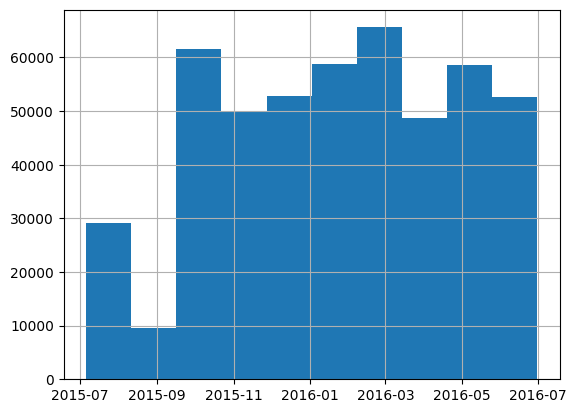

#############
Month
#############


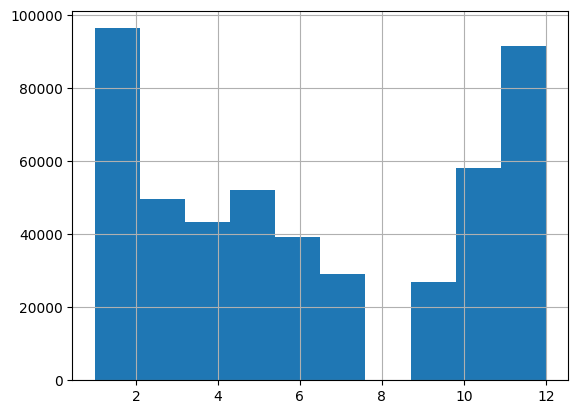

#############
gmv
#############


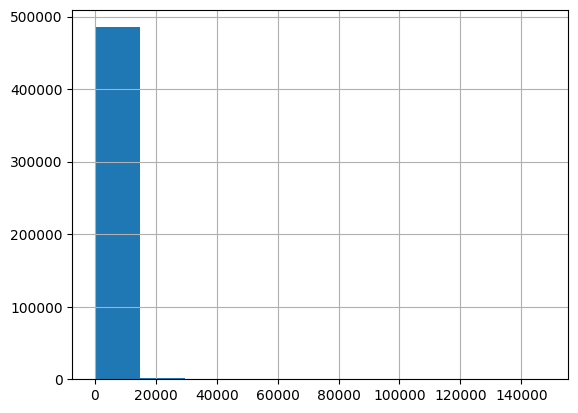

#############
list_price
#############


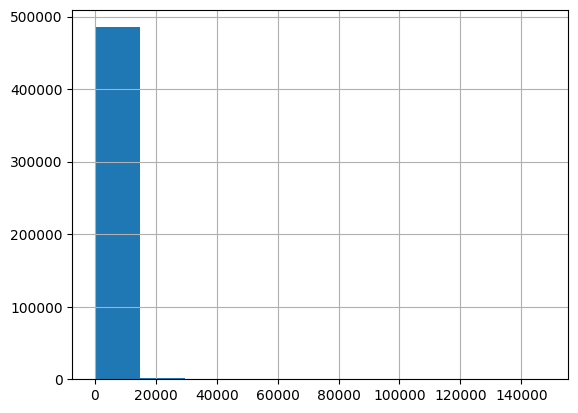

#############
Discount%
#############


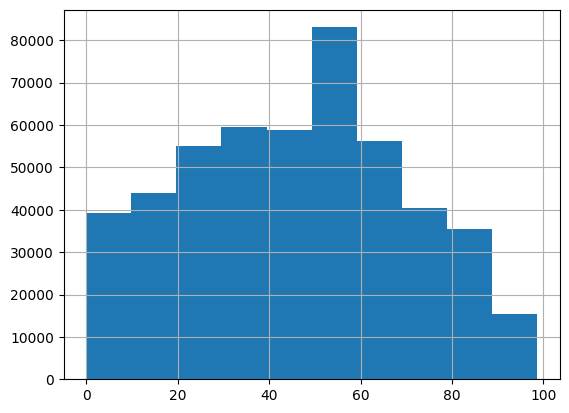

#############
units
#############


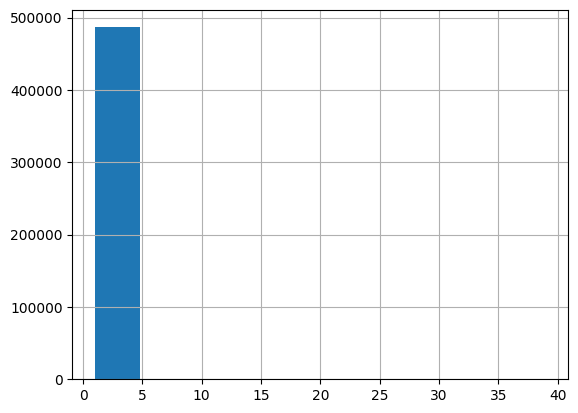

#############
deliverybdays
#############


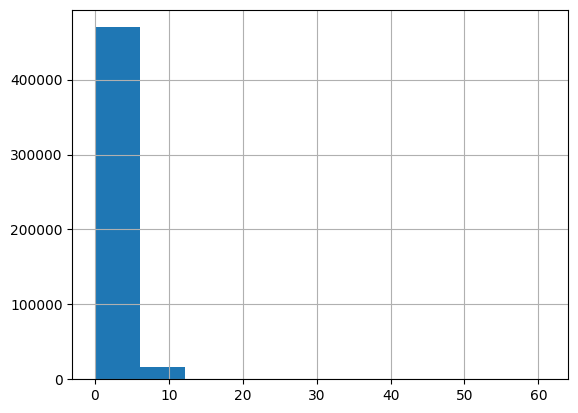

#############
deliverycdays
#############


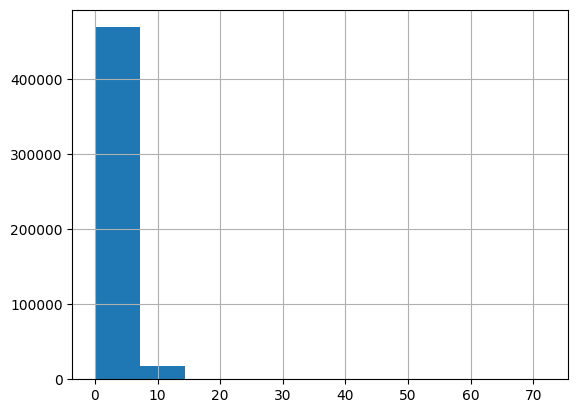

#############
sla
#############


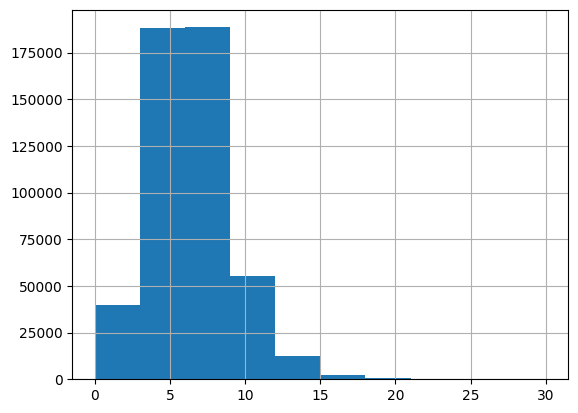

#############
product_mrp
#############


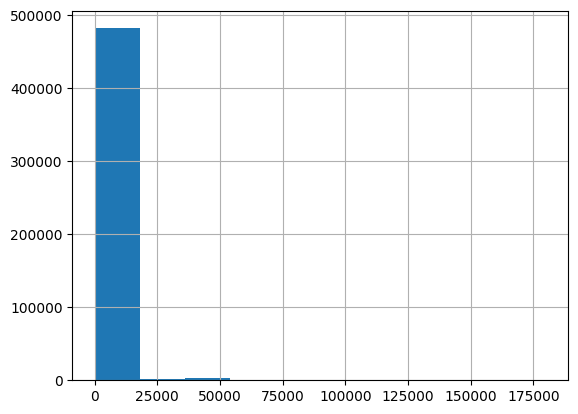

#############
product_procurement_sla
#############


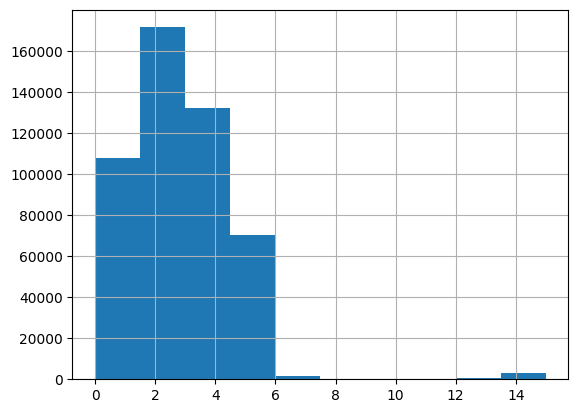

#############
payday_flag
#############


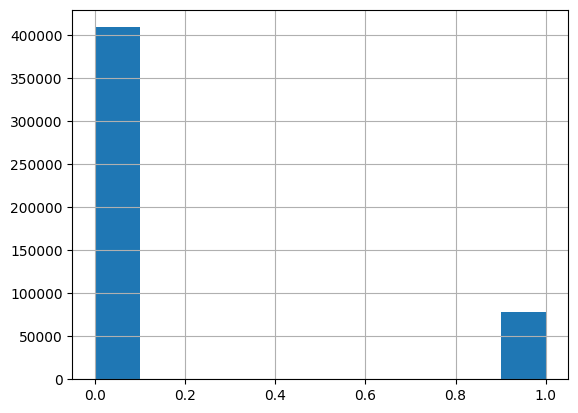

#############
hld_flag
#############


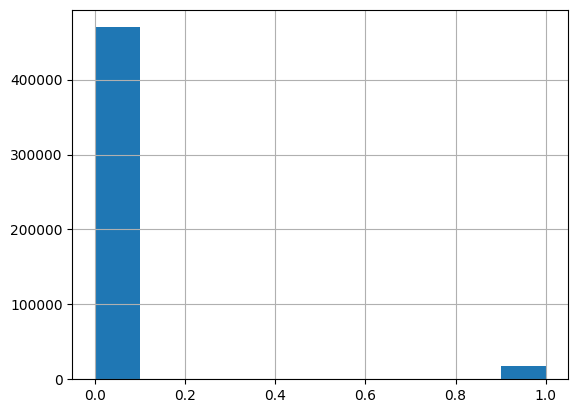

#############
Date
#############


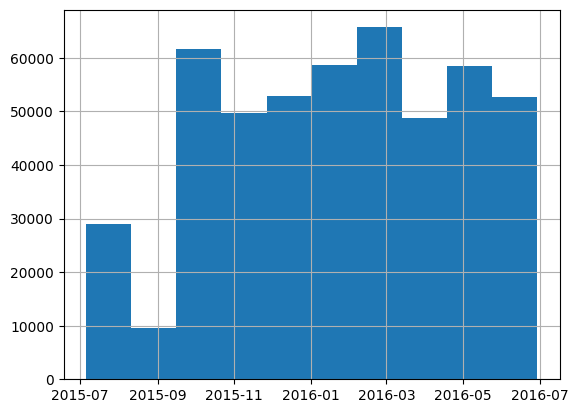

#############
special_sales
#############


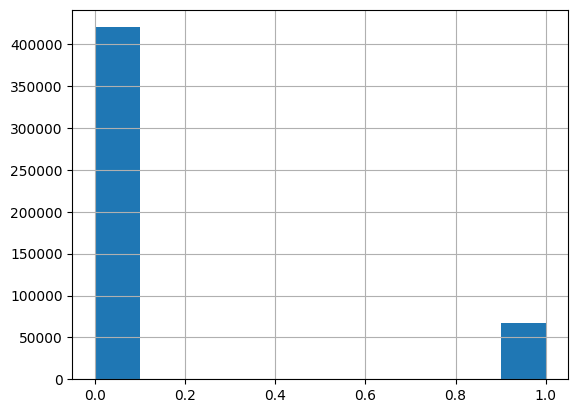

In [171]:
for col in consumerelec_df.describe().columns:
    print('#############')
    print(col)
    print('#############')
    consumerelec_df[col].hist()
    plt.show()

In [172]:
cat_var = [cname for cname in consumerelec_df.columns if
                                consumerelec_df[cname].dtype == "object"]

consumerelec_df[cat_var].describe().T

,count,unique,top,freq
Year,487033,2,2016,281010
Week,487033,52,42,28536
order_id,487033,486268,171370369,6
product_analytic_category,487033,3,CameraAccessory,202380
product_analytic_sub_category,487033,3,CameraAccessory,202380
product_analytic_vertical,487033,50,HomeAudioSpeaker,74621
product_type,487033,2,mass_market,389571


### EDA-Part-2


### Comparing Distribution of Discount% for product types - Premium_products and mass_market


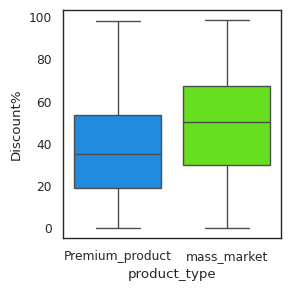

In [173]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(3, 3), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

sns.boxplot(x='product_type', y='Discount%', palette='gist_rainbow_r', data=consumerelec_df)
# plot legend

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

The median discount percentage offered for luxury items is less compared to that of Mass Market Products.

*This is a known trend among luxury products or luxury brands to offer limited or no discounts to retain the exclusivity of their products.*

### Displaying trend of NPS and Stock Index by week

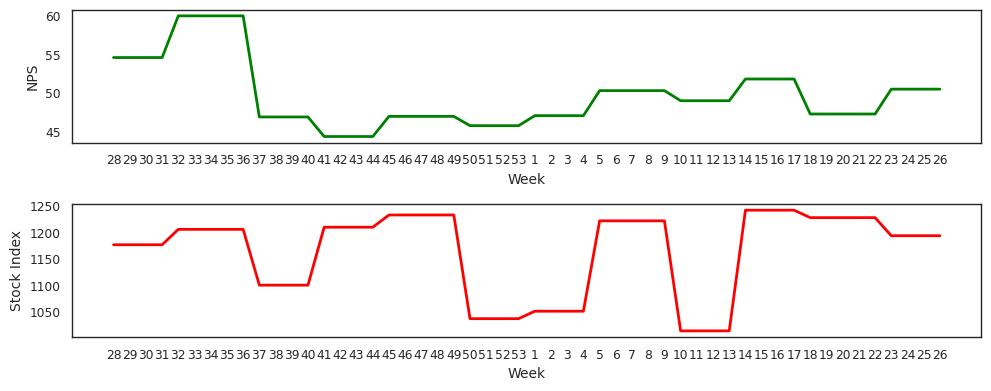

In [174]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 4), dpi=100, facecolor='w', edgecolor='b', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(2, 1, 1)
plt.plot(net_promoter_scr.iloc[:,0], net_promoter_scr.iloc[:,1], 'g-', linewidth=2)
plt.xlabel('Week', fontsize=10);
plt.ylabel('NPS', fontsize=10);

# subplot 2
plt.subplot(2, 1, 2)
plt.plot(net_promoter_scr.iloc[:,0], net_promoter_scr.iloc[:,4], 'r-', linewidth=2)
plt.xlabel('Week', fontsize=10);
plt.ylabel('Stock Index', fontsize=10);

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

Consumer NPS score is highest in weeks 32 – 35 , which coincides with the time when maximum discounts were being offered.



### Displaying trend of various Media Channel Investments by week

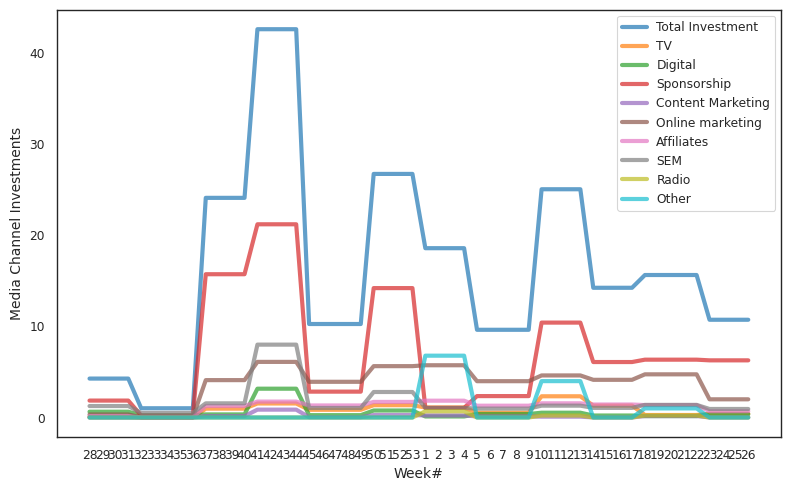

In [175]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(8, 5), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(1, 1, 1)
plt.plot(media_investment.iloc[:,0], media_investment.iloc[:,1::5], linewidth=3, alpha = 0.7)
plt.xlabel('Week#', fontsize=10)
plt.ylabel('Media Channel Investments', fontsize=10)
plt.legend(media_investment.iloc[:,1::5])
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

*Over the past year, bulk of the Ad Investment has been made in Sponsorships followed by Online Marketing & Search Engine Marketing(specially during Thanksgiving).*



### Average Revenue from Holiday/Non-holiday days for the 3 product subcategories

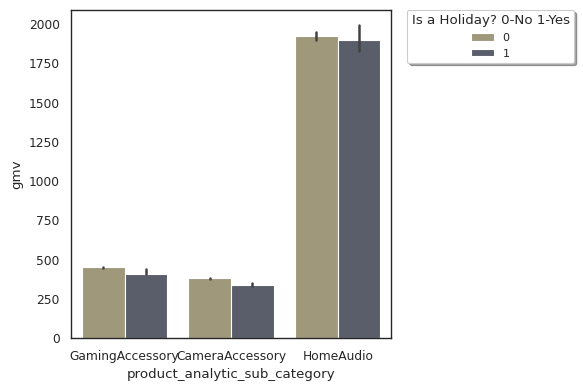

In [176]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(6,4), dpi=100, facecolor='w', edgecolor='k', frameon=True)
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

sns.barplot(y='gmv', x='product_analytic_sub_category', hue ='hld_flag', \
            palette='cividis_r', data=consumerelec_df, estimator=np.median)

# plot legend
plt.legend(frameon=True, fontsize='small', shadow=True, title='Is a Holiday? 0-No 1-Yes', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

The average(median) revenue for 3 product sub categories from holiday and non-holiday days are more or less comparable.

### No of items(Premium_product/Mass-market) sold per 3 product subcategories

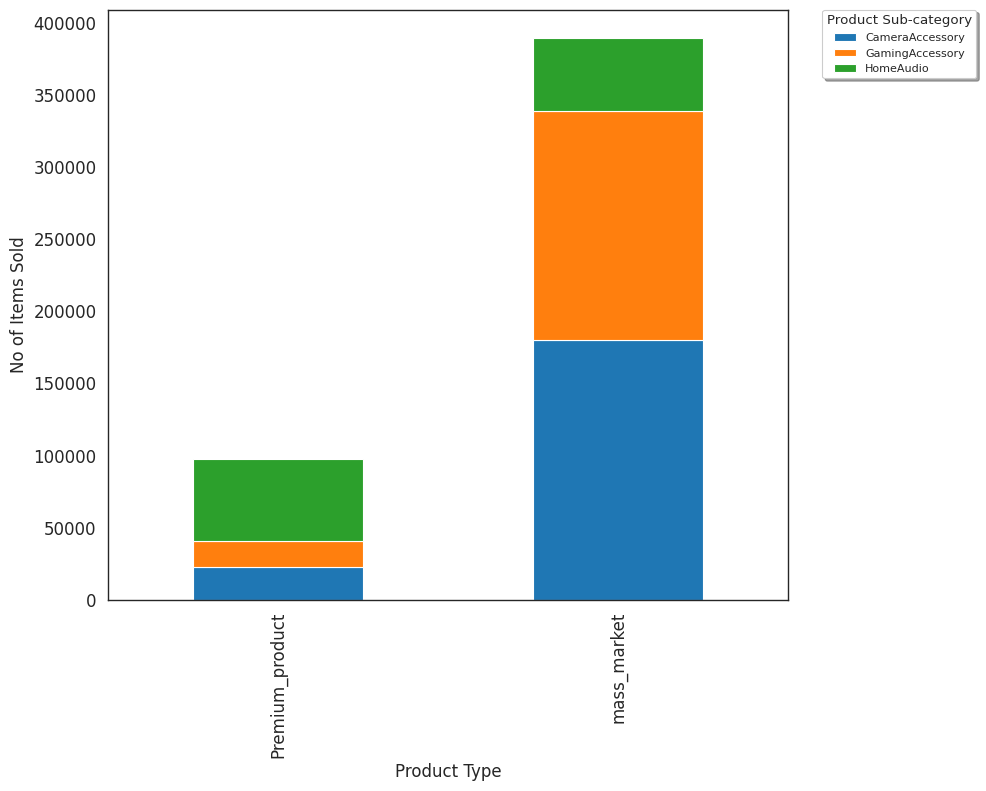

In [177]:
consumerelec_df.groupby(["product_type", "product_analytic_sub_category"]).size().unstack().plot(kind='bar', stacked=True, figsize=(10,8), fontsize = 12)
# plot x axis label
plt.xlabel('Product Type', fontsize = 12)
# plot y axis label
plt.ylabel('No of Items Sold', fontsize = 12)
# plot legend
plt.legend(frameon=True, fontsize='small', shadow=True, title='Product Sub-category', \
           bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

#### From the above graph, we have the following observations:
 - Most of the units sold belonged to the mass market category.
 - Among mass market products sold, Camera and Gaming Accessories related products were sold the most.
 - Home Audio products were the most popular among the premium products sold

### Total items sold per 3 product subcategories per Month

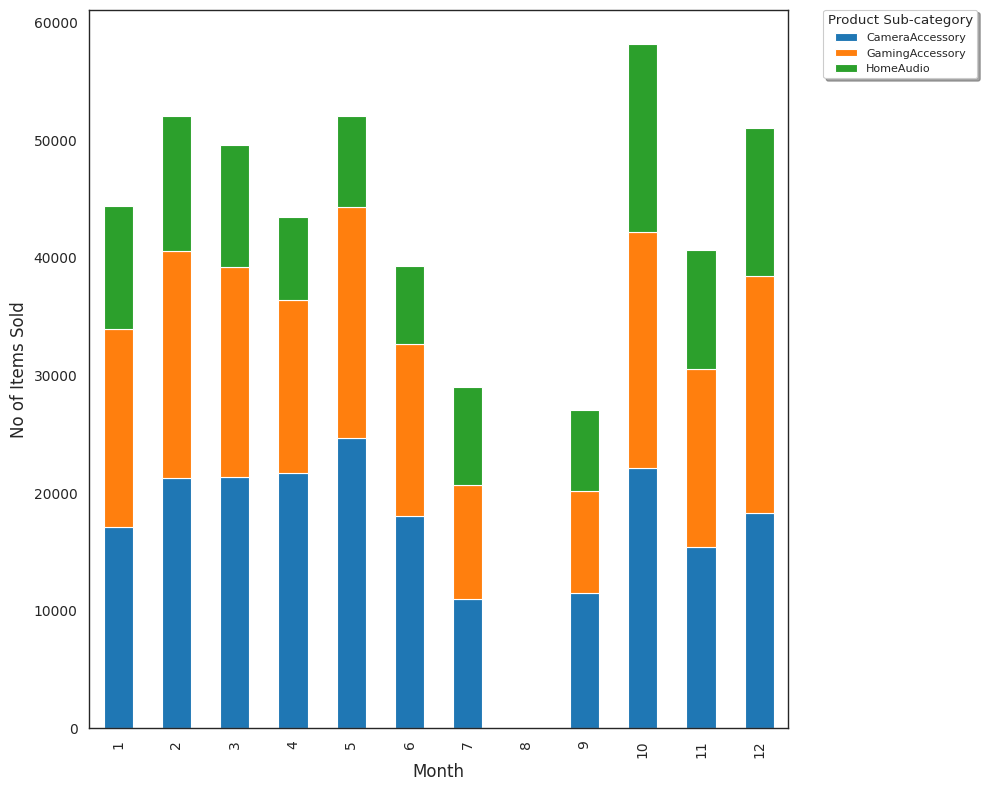

In [178]:
consumerelec_df.groupby(["Month", "product_analytic_sub_category"]).size().unstack().plot(kind='bar', stacked=True, figsize=(10,8), fontsize = 10)
# plot x axis label
plt.xlabel('Month', fontsize = 12)
# plot y axis label
plt.ylabel('No of Items Sold', fontsize = 12)
# plot legend
plt.legend(frameon=True, fontsize='small', shadow=True, title='Product Sub-category', \
           bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)


# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

### Total items sold per 3 product subcategories per Week

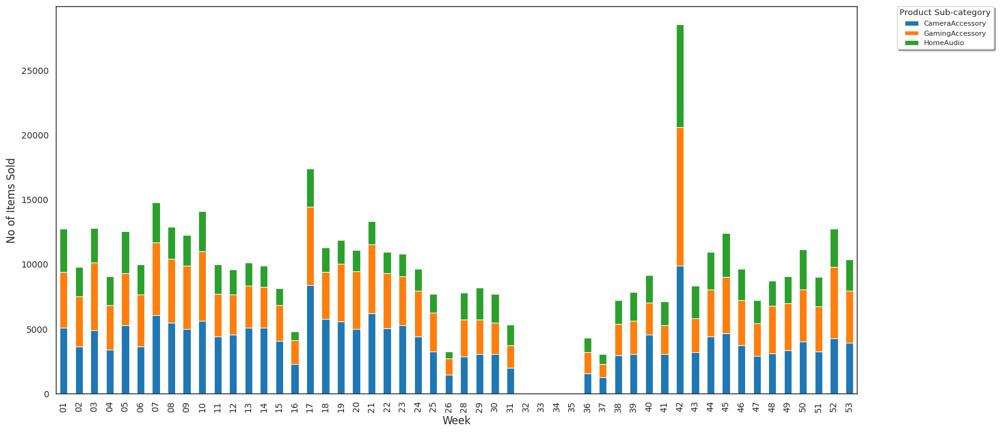

In [179]:
consumerelec_df.groupby(["Week", "product_analytic_sub_category"]).size().unstack().plot(kind='bar', stacked=True, figsize=(16,7), fontsize = 10)
# plot x axis label
plt.xlabel('Week', fontsize = 12)
# plot y axis label
plt.ylabel('No of Items Sold', fontsize = 12)
# plot legend
plt.legend(frameon=True, fontsize='small', shadow=True, title='Product Sub-category', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

#### The sale on the 42nd week (`Thanksgiving week`) is maximum. Overall, October has seen most no of items being sold.

### Top 10 Product Verticals which brought the Maximum Revenue for 3 product sub-categories

In [180]:
highest_gmv = pd.DataFrame(consumerelec_df.groupby(['product_analytic_sub_category','product_analytic_vertical'])['gmv'].sum().sort_values(ascending=False).reset_index()).head(10)
highest_gmv['product_in_category'] = highest_gmv[['product_analytic_vertical','product_analytic_sub_category']].apply(lambda x: ' in '.join(x), axis=1)
highest_gmv.head(20)

,product_analytic_sub_category,product_analytic_vertical,gmv,product_in_category
0,HomeAudio,HomeAudioSpeaker,182694666.56,HomeAudioSpeaker in HomeAudio
1,CameraAccessory,Lens,99963875.00,Lens in CameraAccessory
2,GamingAccessory,GamePad,57289220.71,GamePad in GamingAccessory
3,GamingAccessory,GamingHeadset,31026410.28,GamingHeadset in GamingAccessory
4,CameraAccessory,Binoculars,25687142.50,Binoculars in CameraAccessory
5,GamingAccessory,GamingMouse,24911758.99,GamingMouse in GamingAccessory
6,CameraAccessory,CameraBattery,21571027.76,CameraBattery in CameraAccessory
7,CameraAccessory,Flash,21436374.00,Flash in CameraAccessory
8,HomeAudio,FMRadio,21427877.00,FMRadio in HomeAudio
9,CameraAccessory,CameraBag,21219153.00,CameraBag in CameraAccessory


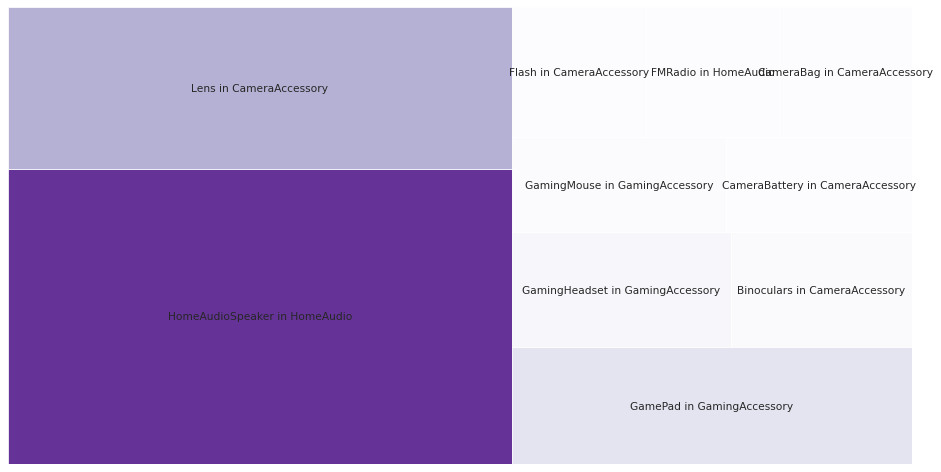

In [181]:
!pip install squarify
import squarify    # pip install squarify (algorithm for treemap)
# Create a dataset:
import matplotlib
my_values=list(highest_gmv['gmv'])

plt.figure(figsize=(12,6), dpi=80, facecolor='w', edgecolor='k')
# create a color palette, mapped to these values
cmap = matplotlib.cm.Purples
mini=min(my_values)
maxi=max(my_values)
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
colors = [cmap(norm(value)) for value in my_values]

# Change color
squarify.plot(sizes=my_values, alpha=.8, label=highest_gmv['product_in_category'],color=colors)
plt.axis('off')

# Show graphic
plt.tight_layout()
plt.show()

Homeaudiospeaker in homeaudio brought the largest revenue followed by lens in cameraaccessory & gamepad in gamingaccessory.

### Top 10 Product Verticals with most no of sales for 3 product sub-categories

In [182]:
large_sales = pd.DataFrame(consumerelec_df.groupby(['product_analytic_sub_category','product_analytic_vertical'])['units'].count().sort_values(ascending=False).reset_index()).head(10)
large_sales['product_in_category'] = large_sales[['product_analytic_vertical','product_analytic_sub_category']].apply(lambda x: ' in '.join(x), axis=1)
large_sales.head(20)

,product_analytic_sub_category,product_analytic_vertical,units,product_in_category
0,HomeAudio,HomeAudioSpeaker,74621,HomeAudioSpeaker in HomeAudio
1,GamingAccessory,GamingHeadset,58456,GamingHeadset in GamingAccessory
2,GamingAccessory,GamePad,49106,GamePad in GamingAccessory
3,CameraAccessory,Flash,46956,Flash in CameraAccessory
4,GamingAccessory,GamingMouse,34087,GamingMouse in GamingAccessory
5,CameraAccessory,CameraBattery,32317,CameraBattery in CameraAccessory
6,CameraAccessory,CameraTripod,29815,CameraTripod in CameraAccessory
7,CameraAccessory,Lens,29392,Lens in CameraAccessory
8,HomeAudio,FMRadio,23816,FMRadio in HomeAudio
9,CameraAccessory,CameraBag,14897,CameraBag in CameraAccessory


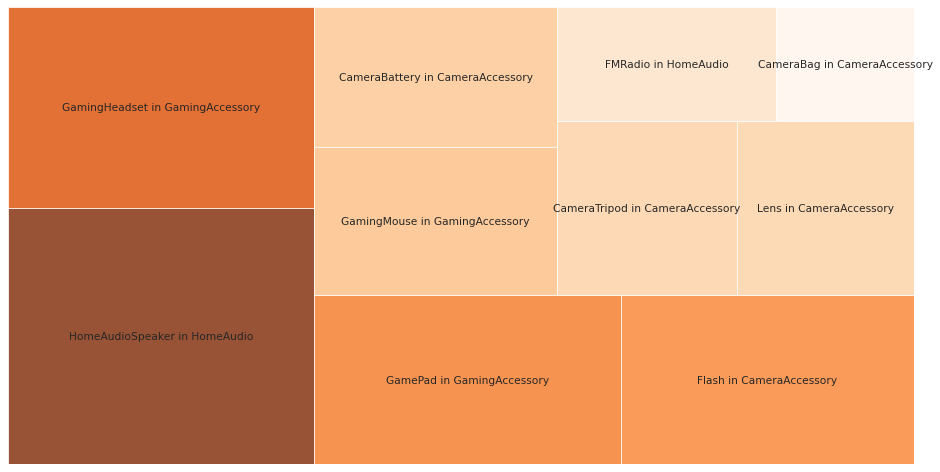

In [183]:
import squarify    # pip install squarify (algorithm for treemap)
# Create a dataset:
my_values=list(large_sales['units'])

plt.figure(figsize=(12,6), dpi=80, facecolor='w', edgecolor='k')
# create a color palette, mapped to these values
cmap = matplotlib.cm.Oranges
mini=min(my_values)
maxi=max(my_values)
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
colors = [cmap(norm(value)) for value in my_values]

# Change color
squarify.plot(sizes=my_values, alpha=.8, label=large_sales['product_in_category'],color=colors)
plt.axis('off')

# Show graphic
plt.tight_layout()
plt.show()

Homeaudiospeaker in homeaudio had the most no of sales followed by gamingheadset & gamepad in gamingaccessory.


### Comparison of Trends of Revenue Discount% & Total Media Investment over the weeks

In [184]:
# Segmenting the Discount% into various bins

def discount_binning(df,cut_points,label_names):
    column_index = df.columns.get_loc('Discount%') + 1
    df.insert(loc=column_index,column='Discount Bins',value=pd.cut(df['Discount%'],cut_points,labels=label_names, include_lowest=True))
    return df

cut_points = [0,10,20,30,40,50,60,70,80,90,100]
label_names = ["Below 10%","Between 10-20%","Between 20-30%","Between 30-40%","Between 40-50%","Between 50-60%", \
              "Between 60-70%","Between 70-80%","Between 80-90%","Between 90-100%"]

product_sub = discount_binning(consumerelec_df,cut_points,label_names)
product_sub.head()


,order_date,Year,Month,Week,order_id,gmv,list_price,Discount%,Discount Bins,units,deliverybdays,deliverycdays,sla,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag,hld_flag,product_type,order_payment_type_Prepaid,Date,special_sales
0,2015-07-06 05:08:26,2015,7,28,167223837,5398.00,2699.00,39.96,Between 30-40%,2,0.00,0.00,2,GamingHardware,GamingAccessory,GamePad,4495.00,5,0,0,Premium_product,False,2015-07-06,0
1,2015-07-06 08:15:22,2015,7,28,167234860,4340.00,4340.00,23.85,Between 20-30%,1,0.00,0.00,1,GamingHardware,GamingAccessory,GamingMouse,5699.00,2,0,0,Premium_product,True,2015-07-06,0
2,2015-07-06 09:00:55,2015,7,28,167241120,139.00,139.00,53.51,Between 50-60%,1,0.00,0.00,8,GamingHardware,GamingAccessory,TVOutCableAccessory,299.00,4,0,0,mass_market,True,2015-07-06,0
3,2015-07-07 00:02:01,2015,7,28,167584636,949.00,949.00,36.73,Between 30-40%,1,0.00,0.00,9,CameraAccessory,CameraAccessory,Binoculars,1500.00,2,0,0,mass_market,False,2015-07-07,0
4,2015-07-07 00:03:19,2015,7,28,167584146,4750.00,4750.00,4.98,Below 10%,1,0.00,0.00,6,GamingHardware,GamingAccessory,MotionController,4999.00,2,0,0,Premium_product,False,2015-07-07,0


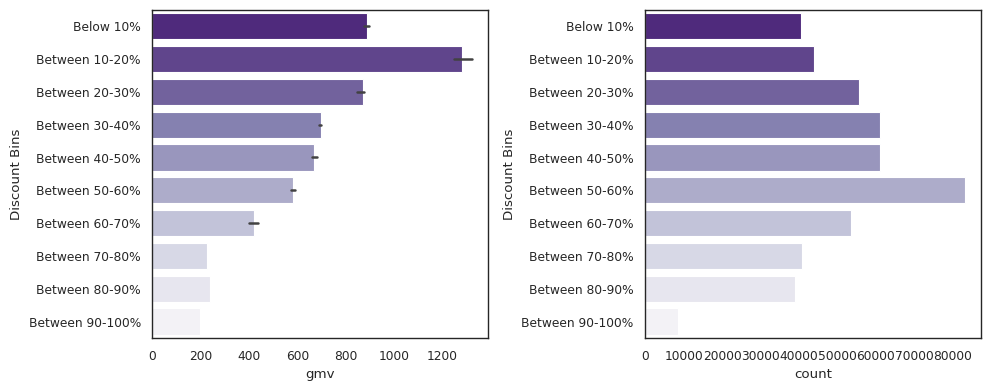

In [185]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10,4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(1, 2, 1)
sns.barplot(x='gmv', y='Discount Bins', palette='Purples_r', data=consumerelec_df, estimator=np.median)

# subplot 2
plt.subplot(1, 2, 2)
sns.countplot(y='Discount Bins', palette='Purples_r', data=consumerelec_df)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()


*   Median Revenue is maximum when Average discount% is between 10-20%. But beyond that, average revenue slowly starts to decline.
*   The sales on the other hand shows a steady increase with increase in Discount percentage till it peaks at 50-60% after which it starts to fall again.


*This shows that at higher discount, although the sales are good, the revenue collapses signifying a loss for the company. An average discount of 10-20% is the most profitable for the company.*

### Percentage of items sold at different Discount% segments


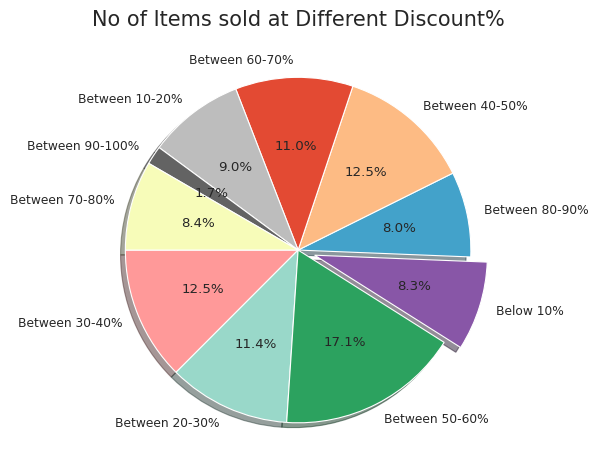

In [186]:
from collections import Counter

labels, values = zip(*Counter(consumerelec_df["Discount Bins"]).items())
colors = ["#ff9999", "#99d8c9", "#2ca25f", "#8856a7","#43a2ca","#fdbb84","#e34a33","#bdbdbd","#636363","#f7fcb9"]
piechart_df = (pd.DataFrame(list(values),list(labels)))
piechart_df = piechart_df.reset_index()

fig = plt.figure(figsize=[6,6])

plt.pie(piechart_df[0],labels=piechart_df["index"],startangle=180,explode=(0,0,0,0.1,0,0,0,0,0,0),autopct="%1.1f%%", \
        shadow=True, colors=colors)
plt.tight_layout()
plt.title("No of Items sold at Different Discount%", fontsize=15)
plt.show()

Most of the sales take place when Discount% is between 50-60%.


## Outlier Treatment

In [187]:
consumerelec_df.head()

,order_date,Year,Month,Week,order_id,gmv,list_price,Discount%,Discount Bins,units,deliverybdays,deliverycdays,sla,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag,hld_flag,product_type,order_payment_type_Prepaid,Date,special_sales
0,2015-07-06 05:08:26,2015,7,28,167223837,5398.00,2699.00,39.96,Between 30-40%,2,0.00,0.00,2,GamingHardware,GamingAccessory,GamePad,4495.00,5,0,0,Premium_product,False,2015-07-06,0
1,2015-07-06 08:15:22,2015,7,28,167234860,4340.00,4340.00,23.85,Between 20-30%,1,0.00,0.00,1,GamingHardware,GamingAccessory,GamingMouse,5699.00,2,0,0,Premium_product,True,2015-07-06,0
2,2015-07-06 09:00:55,2015,7,28,167241120,139.00,139.00,53.51,Between 50-60%,1,0.00,0.00,8,GamingHardware,GamingAccessory,TVOutCableAccessory,299.00,4,0,0,mass_market,True,2015-07-06,0
3,2015-07-07 00:02:01,2015,7,28,167584636,949.00,949.00,36.73,Between 30-40%,1,0.00,0.00,9,CameraAccessory,CameraAccessory,Binoculars,1500.00,2,0,0,mass_market,False,2015-07-07,0
4,2015-07-07 00:03:19,2015,7,28,167584146,4750.00,4750.00,4.98,Below 10%,1,0.00,0.00,6,GamingHardware,GamingAccessory,MotionController,4999.00,2,0,0,Premium_product,False,2015-07-07,0


In [188]:
consumerelec_df.dtypes


,0
order_date,datetime64[ns]
Year,object
Month,int64
Week,object
order_id,object
gmv,float64
list_price,float64
Discount%,float64
Discount Bins,category
units,int64


In [189]:
# GMV
consumerelec_df.gmv.describe()

,gmv
count,487033.00
mean,1261.76
std,2356.13
min,10.00
25%,296.00
50%,549.00
75%,1490.00
max,148050.00


GMV varies from min = 10 to max = 148050



<Axes: xlabel='gmv'>

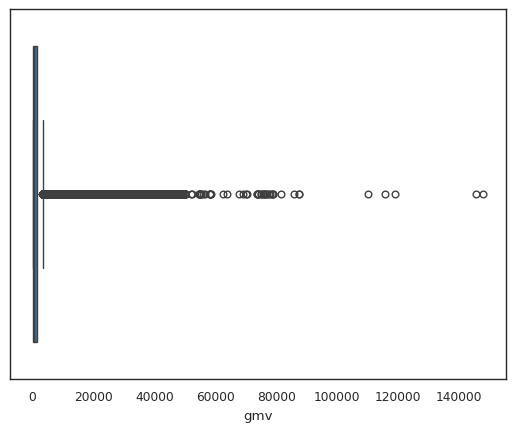

In [190]:
sns.boxplot(x='gmv', data = consumerelec_df, orient = 'vertical')


<Axes: xlabel='gmv'>

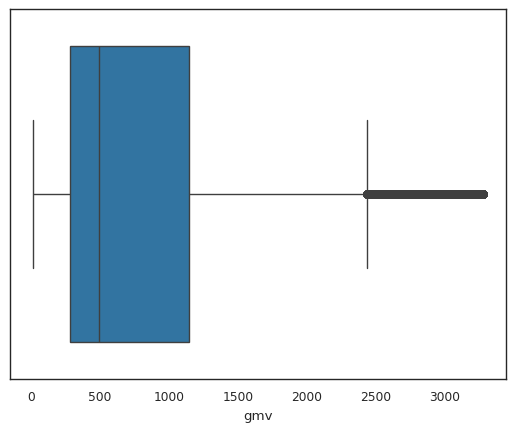

In [191]:
dummy = consumerelec_df.copy()
q1 = dummy['gmv'].quantile(0.25)
q3 = dummy['gmv'].quantile(0.75)
iqr = q3 - q1
dummy = dummy[(dummy['gmv'] > q1 - 1.5*iqr) & (dummy['gmv'] < q3 + 1.5*iqr)]

sns.boxplot(x='gmv', data = dummy, orient = 'vertical')

In [192]:
quantile=[0,0.5,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,1]
consumerelec_df.gmv.quantile(quantile)

,gmv
0.00,10.00
0.50,549.00
0.10,199.00
0.15,238.00
0.20,265.00
0.25,296.00
0.30,325.00
0.35,350.00
0.40,399.00
0.45,475.00


50% Values below 645-Detected outliers



<Axes: xlabel='units'>

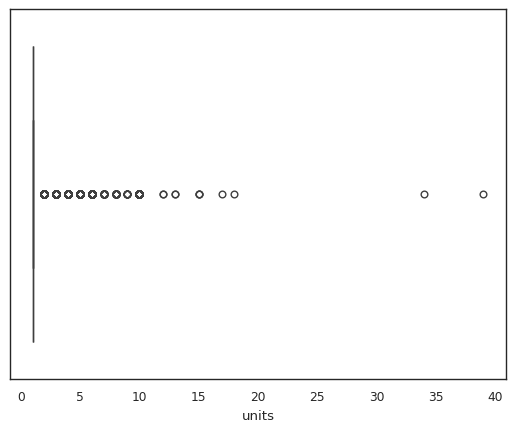

In [193]:
#Units
sns.boxplot(x='units', data = consumerelec_df, orient = 'vertical')

In [194]:
consumerelec_df['sla'].describe()


,sla
count,487033.00
mean,5.90
std,2.69
min,0.00
25%,4.00
50%,6.00
75%,7.00
max,30.00


<Axes: xlabel='sla'>

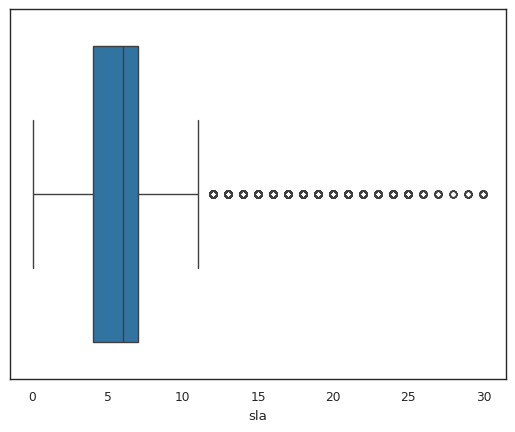

In [195]:
sns.boxplot(x='sla', data = consumerelec_df, orient = 'vertical')


In [196]:
# Product MRP:
consumerelec_df.product_mrp.describe()

,product_mrp
count,487033.00
mean,2471.34
std,4671.65
min,79.00
25%,766.00
50%,1200.00
75%,2742.00
max,180000.00


<Axes: xlabel='product_mrp'>

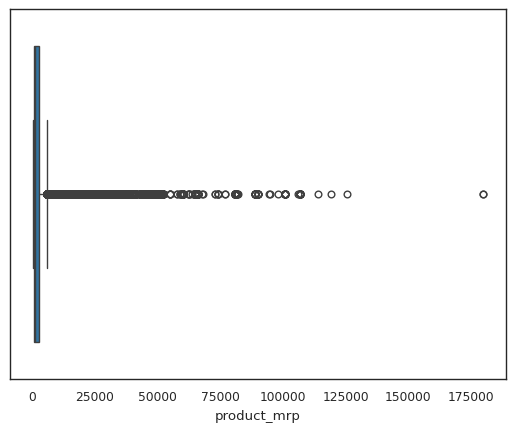

In [197]:
sns.boxplot(x='product_mrp', data =consumerelec_df, orient = 'vertical')

In [198]:
consumerelec_df.product_mrp.quantile(quantile)


,product_mrp
0.00,79.00
0.50,1200.00
0.10,410.00
0.15,500.00
0.20,599.00
0.25,766.00
0.30,800.00
0.35,899.00
0.40,950.00
0.45,1000.00


<Axes: xlabel='Discount%'>

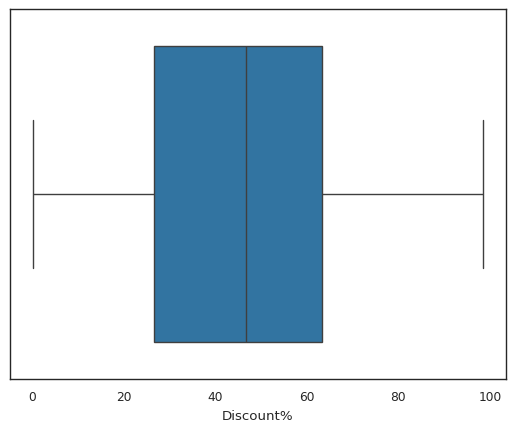

In [199]:
sns.boxplot(x='Discount%', data =consumerelec_df, orient = 'vertical')


In [200]:
consumerelec_df['Discount%'].quantile(quantile)


,Discount%
0.00,0.00
0.50,46.64
0.10,12.24
0.15,17.81
0.20,22.21
0.25,26.48
0.30,30.73
0.35,34.69
0.40,38.97
0.45,42.34


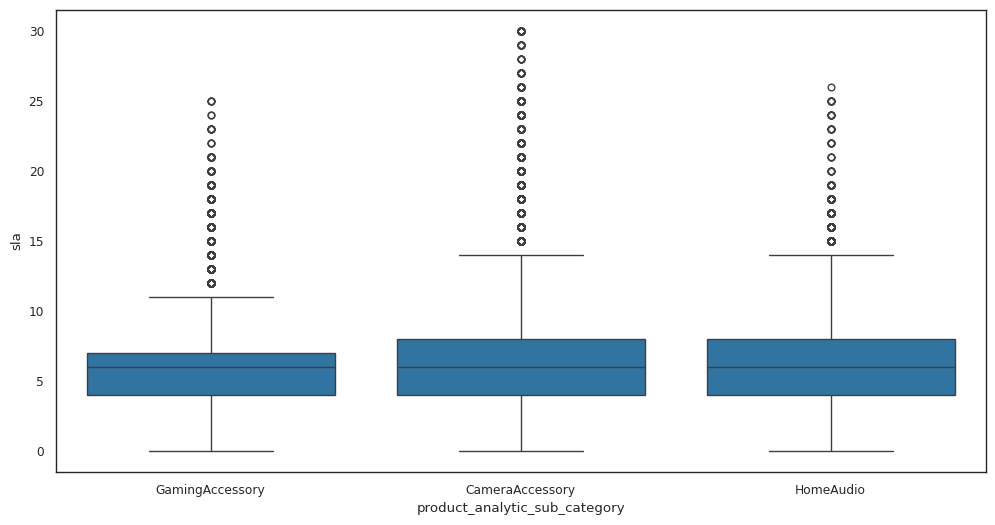

In [201]:
#SLA distribution of different sub-categories of products
plt.figure(figsize = (12,6))
b1 = sns.boxplot(data=consumerelec_df, x = 'product_analytic_sub_category', y = 'sla')

In [202]:
consumerelec_df.sla.mean()


5.904552668915659

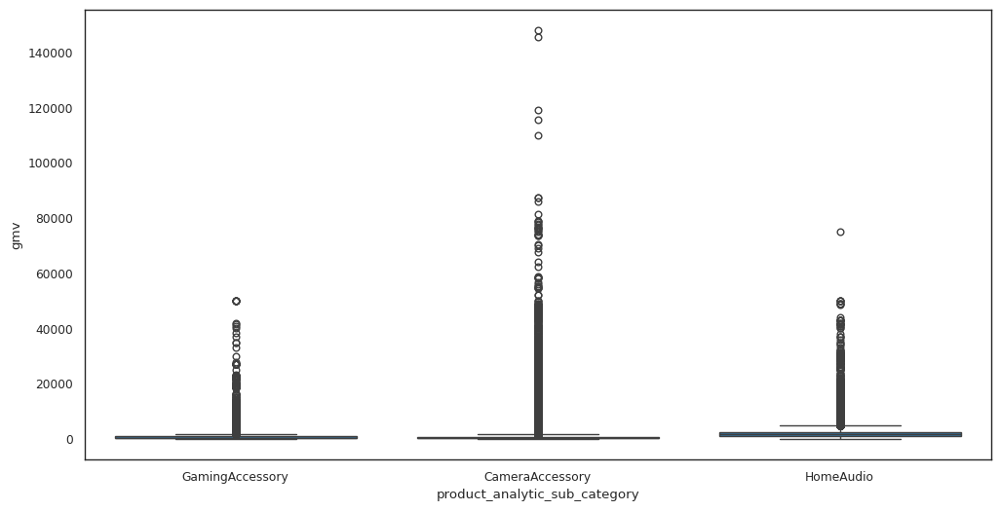

In [203]:
# GMV Distribution for product category
plt.figure(figsize = (12,6))
b2 = sns.boxplot(data=consumerelec_df,x ='product_analytic_sub_category', y='gmv')

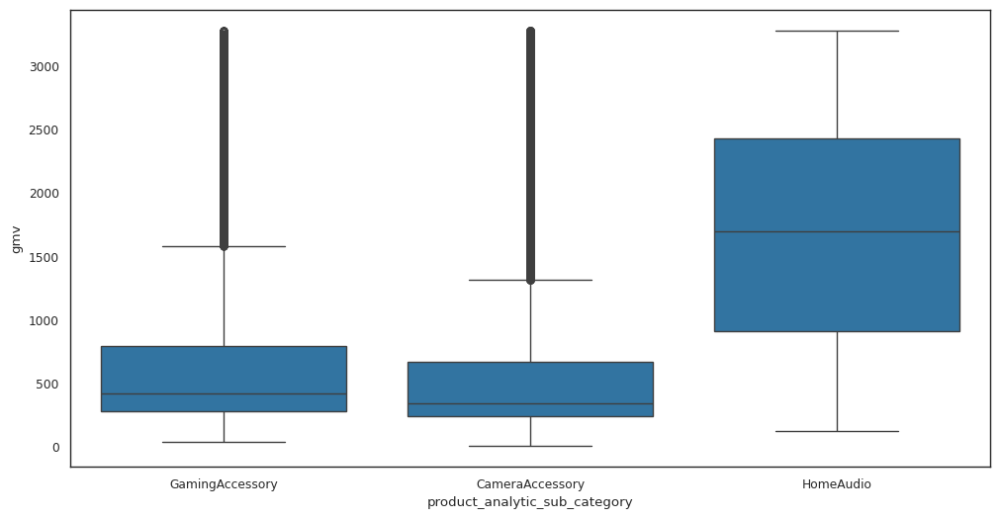

In [204]:
# GMV Distribution for product category
plt.figure(figsize = (12,6))
b2 = sns.boxplot(data=dummy,x ='product_analytic_sub_category', y='gmv')

Mean GMV values remained the same for all three sub-categories. We see a lot of outliers in the category CameraAccessory



In [205]:
C1 = consumerelec_df[consumerelec_df['product_analytic_sub_category'] == "CameraAccessory"].groupby('Week',as_index=False)[['Discount%']].mean()
C1['product_analytic_subtype'] = "CameraAccessory"
C1

,Week,Discount%,product_analytic_subtype
0,01,49.74,CameraAccessory
1,02,49.00,CameraAccessory
2,03,48.26,CameraAccessory
3,04,44.09,CameraAccessory
4,05,51.69,CameraAccessory
5,06,46.17,CameraAccessory
6,07,47.82,CameraAccessory
7,08,53.45,CameraAccessory
8,09,48.54,CameraAccessory
9,10,50.47,CameraAccessory


In [206]:
C2 = consumerelec_df[consumerelec_df['product_analytic_sub_category'] == "GamingAccessory"].groupby('Week',as_index=False)[['Discount%']].mean()
C2['product_analytic_subtype'] = "GamingAccessory"
C2

,Week,Discount%,product_analytic_subtype
0,01,47.10,GamingAccessory
1,02,44.62,GamingAccessory
2,03,45.51,GamingAccessory
3,04,43.66,GamingAccessory
4,05,44.51,GamingAccessory
5,06,47.10,GamingAccessory
6,07,50.14,GamingAccessory
7,08,49.69,GamingAccessory
8,09,47.82,GamingAccessory
9,10,47.09,GamingAccessory


In [207]:
C3 = consumerelec_df[consumerelec_df['product_analytic_sub_category'] == "HomeAudio"].groupby('Week',as_index=False)[['Discount%']].mean()
C3['product_analytic_subtype'] = "HomeAudio"
C3

,Week,Discount%,product_analytic_subtype
0,01,44.57,HomeAudio
1,02,39.07,HomeAudio
2,03,39.92,HomeAudio
3,04,37.74,HomeAudio
4,05,42.53,HomeAudio
5,06,38.39,HomeAudio
6,07,42.05,HomeAudio
7,08,36.60,HomeAudio
8,09,34.31,HomeAudio
9,10,40.11,HomeAudio


In [208]:
# Compare  mean gmv for normal days vs days on which there are holiday promotions
consumerelec_df.groupby('special_sales',as_index=False)[['gmv']].mean()

,special_sales,gmv
0,0,1254.21
1,1,1309.35


<Axes: xlabel='gmv'>

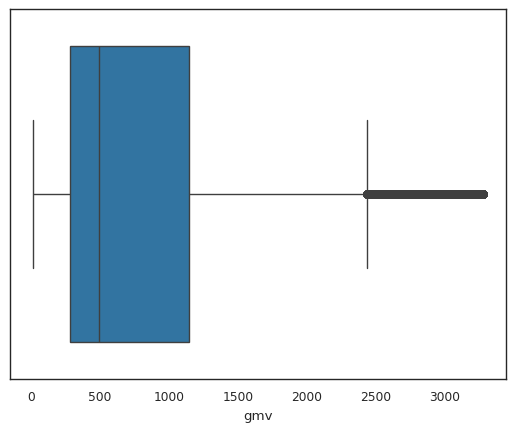

In [209]:
#outliear treatment for gmv values
q1 = consumerelec_df['gmv'].quantile(0.25)
q3 = consumerelec_df['gmv'].quantile(0.75)
iqr = q3 - q1
consumerelec_df =consumerelec_df[(consumerelec_df['gmv'] > q1 - 1.5*iqr) & (consumerelec_df['gmv'] < q3 + 1.5*iqr)]

sns.boxplot(x='gmv', data = consumerelec_df, orient = 'vertical')

<Axes: xlabel='sla'>

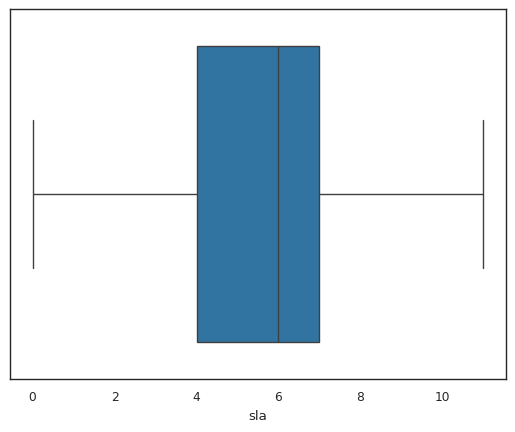

In [210]:
#outliear treatment for sla values
q1 = consumerelec_df['sla'].quantile(0.25)
q3 = consumerelec_df['sla'].quantile(0.75)
iqr = q3 - q1
consumerelec_df= consumerelec_df[(consumerelec_df['sla'] > q1 - 1.5*iqr) & (consumerelec_df['sla'] < q3 + 1.5*iqr)]

sns.boxplot(x='sla', data = consumerelec_df, orient = 'vertical')

<Axes: xlabel='product_mrp'>

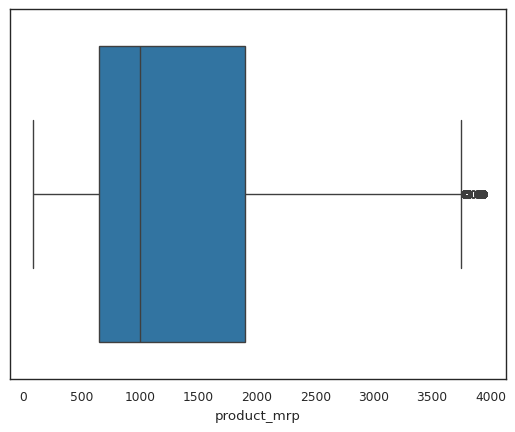

In [211]:
# product_mrp values
q1 = consumerelec_df['product_mrp'].quantile(0.25)
q3 = consumerelec_df['product_mrp'].quantile(0.75)
iqr = q3 - q1
consumerelec_df = consumerelec_df[(consumerelec_df['product_mrp'] > q1 - 1.5*iqr) & (consumerelec_df['product_mrp'] < q3 + 1.5*iqr)]

sns.boxplot(x='product_mrp', data = consumerelec_df, orient = 'vertical')

In [212]:
numeric_column = consumerelec_df.select_dtypes(exclude = ['object', 'datetime64[ns]']).columns
numeric_column

Index(['Month', 'gmv', 'list_price', 'Discount%', 'Discount Bins', 'units', 'deliverybdays', 'deliverycdays', 'sla', 'product_mrp', 'product_procurement_sla', 'payday_flag', 'hld_flag', 'order_payment_type_Prepaid', 'special_sales'], dtype='object')

<Axes: xlabel='product_procurement_sla'>

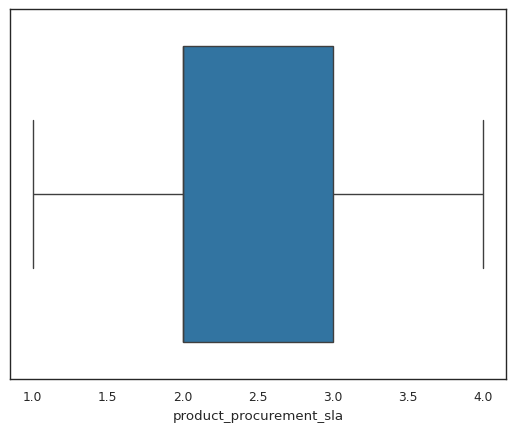

In [213]:
# product_procurement_sla value outlier treatment
q1 = consumerelec_df['product_procurement_sla'].quantile(0.25)
q3 = consumerelec_df['product_procurement_sla'].quantile(0.75)
iqr = q3 - q1
consumerelec_df = consumerelec_df[(consumerelec_df['product_procurement_sla'] > q1 - 1.5*iqr) & (consumerelec_df['product_procurement_sla'] < q3 + 1.5*iqr)]

sns.boxplot(x='product_procurement_sla', data = consumerelec_df, orient = 'vertical')

## Climate Data - Climate 2015


We will generate weekly data from date for the climate data of 2015



In [214]:
climate_data_2015 = pd.read_excel('/content/drive/MyDrive/IIIT-B/Capstone_Project/E-Commerce_Capstone_Dataset/ONTARIO-2015.xlsx', skiprows=24)

In [215]:
climate_data_2015.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2015-01-01,2015,1,1,†,0.00,NaN,-8.50,NaN,-4.30,NaN,22.30,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,NaN,NaN,NaN,NaN
1,2015-01-02,2015,1,2,†,3.00,NaN,-3.00,NaN,0.00,NaN,18.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,NaN,NaN,NaN,NaN
2,2015-01-03,2015,1,3,†,2.50,NaN,-4.00,NaN,-0.80,NaN,18.80,NaN,0.00,NaN,24.00,NaN,0.00,NaN,24.00,NaN,0.00,NaN,NaN,NaN,NaN,NaN
3,2015-01-04,2015,1,4,†,2.50,NaN,0.00,NaN,1.30,NaN,16.70,NaN,0.00,NaN,0.00,NaN,1.00,NaN,1.00,NaN,0.00,NaN,NaN,NaN,NaN,NaN
4,2015-01-05,2015,1,5,†,-10.00,NaN,-13.50,NaN,-11.80,NaN,29.80,NaN,0.00,NaN,0.00,NaN,3.00,NaN,3.00,NaN,1.00,NaN,NaN,NaN,NaN,NaN


In [216]:
climate_data_2015.columns

Index(['Date/Time', 'Year', 'Month', 'Day', 'Data Quality', 'Max Temp (°C)', 'Max Temp Flag', 'Min Temp (°C)', 'Min Temp Flag', 'Mean Temp (°C)', 'Mean Temp Flag', 'Heat Deg Days (°C)', 'Heat Deg Days Flag', 'Cool Deg Days (°C)', 'Cool Deg Days Flag', 'Total Rain (mm)', 'Total Rain Flag', 'Total Snow (cm)', 'Total Snow Flag', 'Total Precip (mm)', 'Total Precip Flag', 'Snow on Grnd (cm)', 'Snow on Grnd Flag', 'Dir of Max Gust (10s deg)', 'Dir of Max Gust Flag', 'Spd of Max Gust (km/h)', 'Spd of Max Gust Flag'], dtype='object')

In [217]:
# Dropping the columns with all nulls
climate_data_2015.dropna(axis=1, thresh=1, inplace=True)
climate_data_2015.reset_index(drop=True, inplace=True)
climate_data_2015.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag
0,2015-01-01,2015,1,1,†,0.00,NaN,-8.50,NaN,-4.30,NaN,22.30,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN
1,2015-01-02,2015,1,2,†,3.00,NaN,-3.00,NaN,0.00,NaN,18.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN
2,2015-01-03,2015,1,3,†,2.50,NaN,-4.00,NaN,-0.80,NaN,18.80,NaN,0.00,NaN,24.00,NaN,0.00,NaN,24.00,NaN,0.00,NaN
3,2015-01-04,2015,1,4,†,2.50,NaN,0.00,NaN,1.30,NaN,16.70,NaN,0.00,NaN,0.00,NaN,1.00,NaN,1.00,NaN,0.00,NaN
4,2015-01-05,2015,1,5,†,-10.00,NaN,-13.50,NaN,-11.80,NaN,29.80,NaN,0.00,NaN,0.00,NaN,3.00,NaN,3.00,NaN,1.00,NaN


In [218]:
climate_data_2015.columns

Index(['Date/Time', 'Year', 'Month', 'Day', 'Data Quality', 'Max Temp (°C)', 'Max Temp Flag', 'Min Temp (°C)', 'Min Temp Flag', 'Mean Temp (°C)', 'Mean Temp Flag', 'Heat Deg Days (°C)', 'Heat Deg Days Flag', 'Cool Deg Days (°C)', 'Cool Deg Days Flag', 'Total Rain (mm)', 'Total Rain Flag', 'Total Snow (cm)', 'Total Snow Flag', 'Total Precip (mm)', 'Total Precip Flag', 'Snow on Grnd (cm)', 'Snow on Grnd Flag'], dtype='object')

In [219]:
drop_cols = []

for col in climate_data_2015.columns:
    if 'Flag' in col:
        print(climate_data_2015[col].value_counts())
        print()
        drop_cols.append(col)

drop_cols.append('Data Quality')

climate_data_2015.drop(drop_cols, axis=1, inplace=True)

print(climate_data_2015.columns)

Max Temp Flag
M    13
Name: count, dtype: int64

Min Temp Flag
M    39
Name: count, dtype: int64

Mean Temp Flag
M    39
Name: count, dtype: int64

Heat Deg Days Flag
M    39
Name: count, dtype: int64

Cool Deg Days Flag
M    39
Name: count, dtype: int64

Total Rain Flag
T    7
Name: count, dtype: int64

Total Snow Flag
T    9
Name: count, dtype: int64

Total Precip Flag
T    12
Name: count, dtype: int64

Snow on Grnd Flag
T    2
Name: count, dtype: int64

Index(['Date/Time', 'Year', 'Month', 'Day', 'Max Temp (°C)', 'Min Temp (°C)', 'Mean Temp (°C)', 'Heat Deg Days (°C)', 'Cool Deg Days (°C)', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)'], dtype='object')


In [220]:
# Formatting column names
climate_data_2015.columns = [col.replace(' (°C)','').strip() for col in climate_data_2015.columns]
climate_data_2015.columns

Index(['Date/Time', 'Year', 'Month', 'Day', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)'], dtype='object')

In [221]:
climate_data_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date/Time          365 non-null    datetime64[ns]
 1   Year               365 non-null    int64         
 2   Month              365 non-null    int64         
 3   Day                365 non-null    int64         
 4   Max Temp           216 non-null    float64       
 5   Min Temp           190 non-null    float64       
 6   Mean Temp          190 non-null    float64       
 7   Heat Deg Days      190 non-null    float64       
 8   Cool Deg Days      190 non-null    float64       
 9   Total Rain (mm)    229 non-null    float64       
 10  Total Snow (cm)    229 non-null    float64       
 11  Total Precip (mm)  229 non-null    float64       
 12  Snow on Grnd (cm)  229 non-null    float64       
dtypes: datetime64[ns](1), float64(9), int64(3)
memory usage: 37.2 KB


In [222]:
# Dropping rows where all the columns have nulls

cols = ['Max Temp',
 'Min Temp',
 'Mean Temp',
 'Heat Deg Days',
 'Cool Deg Days',
 'Total Rain (mm)',
 'Total Snow (cm)',
 'Total Precip (mm)',
 'Snow on Grnd (cm)']

climate_data_2015.dropna(subset=cols, inplace=True)

climate_data_2015.reset_index(drop=True, inplace=True)

climate_data_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 190 entries, 0 to 189
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date/Time          190 non-null    datetime64[ns]
 1   Year               190 non-null    int64         
 2   Month              190 non-null    int64         
 3   Day                190 non-null    int64         
 4   Max Temp           190 non-null    float64       
 5   Min Temp           190 non-null    float64       
 6   Mean Temp          190 non-null    float64       
 7   Heat Deg Days      190 non-null    float64       
 8   Cool Deg Days      190 non-null    float64       
 9   Total Rain (mm)    190 non-null    float64       
 10  Total Snow (cm)    190 non-null    float64       
 11  Total Precip (mm)  190 non-null    float64       
 12  Snow on Grnd (cm)  190 non-null    float64       
dtypes: datetime64[ns](1), float64(9), int64(3)
memory usage: 19.4 KB


In [223]:
# Extract week from the date field

climate_data_2015['Week'] = climate_data_2015['Date/Time'].dt.isocalendar().week
climate_data_2015['Week'] = climate_data_2015['Week'].astype(str).str.lstrip('0')
climate_data_2015.head()

,Date/Time,Year,Month,Day,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Week
0,2015-01-01,2015,1,1,0.00,-8.50,-4.30,22.30,0.00,0.00,0.00,0.00,0.00,1
1,2015-01-02,2015,1,2,3.00,-3.00,0.00,18.00,0.00,0.00,0.00,0.00,0.00,1
2,2015-01-03,2015,1,3,2.50,-4.00,-0.80,18.80,0.00,24.00,0.00,24.00,0.00,1
3,2015-01-04,2015,1,4,2.50,0.00,1.30,16.70,0.00,0.00,1.00,1.00,0.00,1
4,2015-01-05,2015,1,5,-10.00,-13.50,-11.80,29.80,0.00,0.00,3.00,3.00,1.00,2


In [224]:
# Extracting data from July to Dec month

climate_data_2015 = climate_data_2015[climate_data_2015['Month'] >= 7]
climate_data_2015.reset_index(drop=True, inplace=True)

climate_data_2015.head()

,Date/Time,Year,Month,Day,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Week
0,2015-07-01,2015,7,1,24.50,17.00,20.80,0.00,2.80,0.00,0.00,0.00,0.00,27
1,2015-07-02,2015,7,2,24.00,14.00,19.00,0.00,1.00,0.00,0.00,0.00,0.00,27
2,2015-07-03,2015,7,3,25.00,10.00,17.50,0.50,0.00,0.00,0.00,0.00,0.00,27
3,2015-07-04,2015,7,4,26.00,11.00,18.50,0.00,0.50,0.00,0.00,0.00,0.00,27
4,2015-07-05,2015,7,5,28.00,14.00,21.00,0.00,3.00,0.00,0.00,0.00,0.00,27


In [225]:
climate_data_2015.sort_values(by=['Week'], ascending = True, inplace = True)

In [226]:
# week data
climate_data_2015 = climate_data_2015.groupby(['Week']).agg({'Max Temp':"max", 'Min Temp':"min", 'Mean Temp':"mean", 'Heat Deg Days':"mean", 'Cool Deg Days':"mean", 'Total Rain (mm)':"mean", 'Total Snow (cm)':"mean", 'Total Precip (mm)':"mean", 'Snow on Grnd (cm)':"mean"}).reset_index(drop=False)
climate_data_2015.head()

,Week,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,27,28.00,10.00,19.36,0.10,1.46,0.00,0.00,0.00,0.00
1,28,28.00,12.50,20.10,0.28,2.38,4.42,0.00,4.42,0.00
2,29,33.00,11.00,23.18,0.00,5.18,1.40,0.00,1.40,0.00
3,30,31.50,14.50,23.06,0.00,5.06,1.08,0.00,1.08,0.00
4,31,33.50,16.00,24.57,0.00,6.57,4.63,0.00,4.63,0.00


In [227]:
# Drop 27th week data -belonging to June 2015
climate_data_2015.drop(climate_data_2015[climate_data_2015['Week'] == '27'].index, inplace = True)

In [228]:
climate_data_2015.duplicated().any()

False

## Climate Data - Climate 2016


We will generate weekly data from date for the climate data of 2016



In [229]:
# Skipping the first 24 rows while reading the data to ignore the metadata
climate_2016 = pd.read_excel('/content/drive/MyDrive/IIIT-B/Capstone_Project/E-Commerce_Capstone_Dataset/ONTARIO-2016.xlsx', skiprows=24)


In [230]:
climate_2016

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2016-01-01,2016,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-01-02,2016,1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-01-03,2016,1,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-01-04,2016,1,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-01-05,2016,1,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2016-01-06,2016,1,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,2016-01-07,2016,1,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,2016-01-08,2016,1,8,†,7.00,NaN,-14.00,NaN,-3.50,NaN,21.50,NaN,0.00,NaN,9.00,NaN,0.00,NaN,9.00,NaN,0.00,NaN,NaN,NaN,NaN,NaN
8,2016-01-09,2016,1,9,†,11.00,NaN,3.00,NaN,7.00,NaN,11.00,NaN,0.00,NaN,14.60,NaN,0.00,T,14.60,NaN,0.00,NaN,NaN,NaN,NaN,NaN
9,2016-01-10,2016,1,10,†,-1.50,NaN,-5.00,NaN,-3.30,NaN,21.30,NaN,0.00,NaN,0.00,NaN,7.00,NaN,7.00,NaN,0.00,T,NaN,NaN,NaN,NaN


In [231]:
climate_2016.columns


Index(['Date/Time', 'Year', 'Month', 'Day', 'Data Quality', 'Max Temp (°C)', 'Max Temp Flag', 'Min Temp (°C)', 'Min Temp Flag', 'Mean Temp (°C)', 'Mean Temp Flag', 'Heat Deg Days (°C)', 'Heat Deg Days Flag', 'Cool Deg Days (°C)', 'Cool Deg Days Flag', 'Total Rain (mm)', 'Total Rain Flag', 'Total Snow (cm)', 'Total Snow Flag', 'Total Precip (mm)', 'Total Precip Flag', 'Snow on Grnd (cm)', 'Snow on Grnd Flag', 'Dir of Max Gust (10s deg)', 'Dir of Max Gust Flag', 'Spd of Max Gust (km/h)', 'Spd of Max Gust Flag'], dtype='object')

In [232]:
# Dropping the columns with all nulls

climate_2016.dropna(axis=1, thresh=1, inplace=True)
climate_2016.reset_index(drop=True, inplace=True)
climate_2016.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag
0,2016-01-01,2016,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-01-02,2016,1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-01-03,2016,1,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-01-04,2016,1,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-01-05,2016,1,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [233]:
climate_2016.columns

Index(['Date/Time', 'Year', 'Month', 'Day', 'Data Quality', 'Max Temp (°C)', 'Max Temp Flag', 'Min Temp (°C)', 'Min Temp Flag', 'Mean Temp (°C)', 'Mean Temp Flag', 'Heat Deg Days (°C)', 'Heat Deg Days Flag', 'Cool Deg Days (°C)', 'Cool Deg Days Flag', 'Total Rain (mm)', 'Total Rain Flag', 'Total Snow (cm)', 'Total Snow Flag', 'Total Precip (mm)', 'Total Precip Flag', 'Snow on Grnd (cm)', 'Snow on Grnd Flag'], dtype='object')

In [234]:
# Dropping columns with only one distinct value

drop_cols = []

for col in climate_2016.columns:
    if 'Flag' in col:
        print(climate_2016[col].value_counts())
        print()
        drop_cols.append(col)

drop_cols.append('Data Quality')

climate_2016.drop(drop_cols, axis=1, inplace=True)

print(climate_2016.columns)

Max Temp Flag
M    1
Name: count, dtype: int64

Min Temp Flag
M    8
Name: count, dtype: int64

Mean Temp Flag
M    8
Name: count, dtype: int64

Heat Deg Days Flag
M    8
Name: count, dtype: int64

Cool Deg Days Flag
M    8
Name: count, dtype: int64

Total Rain Flag
T    3
Name: count, dtype: int64

Total Snow Flag
T    7
Name: count, dtype: int64

Total Precip Flag
T    7
Name: count, dtype: int64

Snow on Grnd Flag
T    6
Name: count, dtype: int64

Index(['Date/Time', 'Year', 'Month', 'Day', 'Max Temp (°C)', 'Min Temp (°C)', 'Mean Temp (°C)', 'Heat Deg Days (°C)', 'Cool Deg Days (°C)', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)'], dtype='object')


In [235]:
# Formatting column names

climate_2016.columns = [col.replace(' (°C)','').strip() for col in climate_2016.columns]

climate_2016.columns

Index(['Date/Time', 'Year', 'Month', 'Day', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)'], dtype='object')

In [236]:
climate_2016.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date/Time          366 non-null    datetime64[ns]
 1   Year               366 non-null    int64         
 2   Month              366 non-null    int64         
 3   Day                366 non-null    int64         
 4   Max Temp           226 non-null    float64       
 5   Min Temp           219 non-null    float64       
 6   Mean Temp          219 non-null    float64       
 7   Heat Deg Days      219 non-null    float64       
 8   Cool Deg Days      219 non-null    float64       
 9   Total Rain (mm)    227 non-null    float64       
 10  Total Snow (cm)    227 non-null    float64       
 11  Total Precip (mm)  227 non-null    float64       
 12  Snow on Grnd (cm)  227 non-null    float64       
dtypes: datetime64[ns](1), float64(9), int64(3)
memory usage: 37.3 KB


In [237]:
# Dropping rows where all the columns have nulls

cols = ['Max Temp',
 'Min Temp',
 'Mean Temp',
 'Heat Deg Days',
 'Cool Deg Days',
 'Total Rain (mm)',
 'Total Snow (cm)',
 'Total Precip (mm)',
 'Snow on Grnd (cm)']

climate_2016.dropna(subset=cols, inplace=True)

climate_2016.reset_index(drop=True, inplace=True)

climate_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 0 to 218
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date/Time          219 non-null    datetime64[ns]
 1   Year               219 non-null    int64         
 2   Month              219 non-null    int64         
 3   Day                219 non-null    int64         
 4   Max Temp           219 non-null    float64       
 5   Min Temp           219 non-null    float64       
 6   Mean Temp          219 non-null    float64       
 7   Heat Deg Days      219 non-null    float64       
 8   Cool Deg Days      219 non-null    float64       
 9   Total Rain (mm)    219 non-null    float64       
 10  Total Snow (cm)    219 non-null    float64       
 11  Total Precip (mm)  219 non-null    float64       
 12  Snow on Grnd (cm)  219 non-null    float64       
dtypes: datetime64[ns](1), float64(9), int64(3)
memory usage: 22.4 KB


In [238]:
# Extracting week # from the date field and formatting it

climate_2016['Week'] = climate_2016['Date/Time'].dt.isocalendar().week
climate_2016['Week'] = climate_2016['Week'].astype(str).str.lstrip('0')
climate_2016.head()

,Date/Time,Year,Month,Day,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Week
0,2016-01-08,2016,1,8,7.00,-14.00,-3.50,21.50,0.00,9.00,0.00,9.00,0.00,1
1,2016-01-09,2016,1,9,11.00,3.00,7.00,11.00,0.00,14.60,0.00,14.60,0.00,1
2,2016-01-10,2016,1,10,-1.50,-5.00,-3.30,21.30,0.00,0.00,7.00,7.00,0.00,1
3,2016-01-12,2016,1,12,-5.00,-12.00,-8.50,26.50,0.00,0.00,0.00,0.00,12.00,2
4,2016-01-14,2016,1,14,2.50,-10.50,-4.00,22.00,0.00,0.00,0.00,0.00,11.00,2


In [239]:
# Extract Jan to June month data
climate_2016 = climate_2016[climate_2016['Month'] <= 6]
climate_2016.reset_index(drop=True, inplace=True)
climate_2016.head()

,Date/Time,Year,Month,Day,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Week
0,2016-01-08,2016,1,8,7.00,-14.00,-3.50,21.50,0.00,9.00,0.00,9.00,0.00,1
1,2016-01-09,2016,1,9,11.00,3.00,7.00,11.00,0.00,14.60,0.00,14.60,0.00,1
2,2016-01-10,2016,1,10,-1.50,-5.00,-3.30,21.30,0.00,0.00,7.00,7.00,0.00,1
3,2016-01-12,2016,1,12,-5.00,-12.00,-8.50,26.50,0.00,0.00,0.00,0.00,12.00,2
4,2016-01-14,2016,1,14,2.50,-10.50,-4.00,22.00,0.00,0.00,0.00,0.00,11.00,2


In [240]:
climate_2016.sort_values(by=['Week'], ascending = True, inplace = True)

In [241]:
# Get week data
climate_2016 = climate_2016.groupby(['Week']).agg({'Max Temp':"max", 'Min Temp':"min", 'Mean Temp':"mean", 'Heat Deg Days':"mean", 'Cool Deg Days':"mean", 'Total Rain (mm)':"mean", 'Total Snow (cm)':"mean", 'Total Precip (mm)':"mean", 'Snow on Grnd (cm)':"mean"}).reset_index(drop=False)
climate_2016.head()

,Week,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,1,11.00,-14.00,0.07,17.93,0.00,7.87,2.33,10.20,0.00
1,10,20.00,-2.00,10.17,7.83,0.00,9.00,0.00,9.00,0.00
2,11,16.00,-2.50,8.90,9.10,0.00,0.50,0.00,0.50,0.00
3,12,20.50,-3.50,5.72,12.28,0.00,12.80,0.00,12.80,0.00
4,13,16.00,-5.00,6.87,11.13,0.00,2.83,0.54,3.37,0.00


In [242]:
climate_2016.duplicated().any()

False

In [243]:
climate_2016.isnull().values.any()

False

##Concatenating Climate Datasets


In [244]:
climate_merge_df = pd.concat([climate_data_2015, climate_2016], axis = 0)


In [245]:
climate_merge_df.shape

(51, 10)

In [246]:
climate_merge_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 51 entries, 1 to 24
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Week               51 non-null     object 
 1   Max Temp           51 non-null     float64
 2   Min Temp           51 non-null     float64
 3   Mean Temp          51 non-null     float64
 4   Heat Deg Days      51 non-null     float64
 5   Cool Deg Days      51 non-null     float64
 6   Total Rain (mm)    51 non-null     float64
 7   Total Snow (cm)    51 non-null     float64
 8   Total Precip (mm)  51 non-null     float64
 9   Snow on Grnd (cm)  51 non-null     float64
dtypes: float64(9), object(1)
memory usage: 4.4+ KB


In [247]:
climate_merge_df.head()

,Week,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
1,28,28.00,12.50,20.10,0.28,2.38,4.42,0.00,4.42,0.00
2,29,33.00,11.00,23.18,0.00,5.18,1.40,0.00,1.40,0.00
3,30,31.50,14.50,23.06,0.00,5.06,1.08,0.00,1.08,0.00
4,31,33.50,16.00,24.57,0.00,6.57,4.63,0.00,4.63,0.00
5,32,28.50,15.00,21.65,0.00,3.65,0.35,0.00,0.35,0.00


In [248]:
climate_merge_df.Week.unique()

array(['28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38',
       '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49',
       '50', '51', '52', '53', '1', '10', '11', '12', '13', '14', '15',
       '16', '17', '18', '19', '2', '20', '21', '22', '23', '24', '25',
       '26', '4', '5', '6', '7', '8', '9'], dtype=object)

##Extracting 3 separate dataframes for 3 product subcategories - camera accessory, home audio and gaming accessory


In [249]:
consumerelec_df.shape

(331424, 24)

In [250]:
consumerelec_df['product_analytic_sub_category'].value_counts()


,count
product_analytic_sub_category,
CameraAccessory,149618
GamingAccessory,133413
HomeAudio,48393


In [251]:
Camera_accessory_df = consumerelec_df[consumerelec_df.product_analytic_sub_category == "CameraAccessory"]
gaming_accessory_df = consumerelec_df[consumerelec_df.product_analytic_sub_category == "GamingAccessory"]
Home_audio_df = consumerelec_df[consumerelec_df.product_analytic_sub_category == "HomeAudio"]

print('No of rows in cameraaccessory_df: {}'.format(Camera_accessory_df.shape[0]))
print('No of rows in gamingaccessory_df: {}'.format(gaming_accessory_df.shape[0]))
print('No of rows in homeaudio_df: {}'.format(Home_audio_df.shape[0]))

No of rows in cameraaccessory_df: 149618
No of rows in gamingaccessory_df: 133413
No of rows in homeaudio_df: 48393


###Categorical variable(product_analytic_vertical) with multiple levels, creating dummy features (one-hot encoded)


In [252]:
# Creating dummy variables for the remaining categorical variable
dummy1 = pd.get_dummies(Camera_accessory_df[['product_analytic_vertical']], prefix='product_vertical', drop_first=True)
dummy2 = pd.get_dummies(gaming_accessory_df[['product_analytic_vertical']], prefix='product_vertical', drop_first=True)
dummy3 = pd.get_dummies(Home_audio_df[['product_analytic_vertical']], prefix='product_vertical', drop_first=True)

# Adding the results to the original dataframes
Camera_accessory_df = pd.concat([Camera_accessory_df, dummy1], axis=1)
gaming_accessory_df = pd.concat([gaming_accessory_df, dummy2], axis=1)
Home_audio_df= pd.concat([Home_audio_df, dummy3], axis=1)

Drop the repeated variable


In [253]:
# removing columns
Camera_accessory_df = Camera_accessory_df.drop('product_analytic_vertical', axis=1)
gaming_accessory_df = gaming_accessory_df.drop('product_analytic_vertical', axis=1)
Home_audio_df = Home_audio_df.drop('product_analytic_vertical', axis=1)

print('Shape of cameraaccessory_df: {}'.format(Camera_accessory_df.shape))
print('Shape of gamingaccessory_df: {}'.format(gaming_accessory_df.shape))
print('Shape of homeaudio_df: {}'.format(Home_audio_df.shape))

Shape of cameraaccessory_df: (149618, 44)
Shape of gamingaccessory_df: (133413, 37)
Shape of homeaudio_df: (48393, 30)


Checking the no of unique values in the columns of the 3 new dataframes


In [254]:
# Unique value frequencies
unique_values = pd.DataFrame(Camera_accessory_df.apply(lambda x: len(x.value_counts(dropna=False)), axis=0), \
                             columns=['Unique Value Count']).sort_values(by='Unique Value Count', ascending=True)
unique_values['dtype'] = pd.DataFrame(Camera_accessory_df.dtypes)
unique_values.head()

,Unique Value Count,dtype
product_analytic_sub_category,1,object
product_analytic_category,1,object
product_vertical_Telescope,2,bool
product_vertical_Strap,2,bool
special_sales,2,int64


In [255]:
# Unique value frequencies
unique_values = pd.DataFrame(gaming_accessory_df.apply(lambda x: len(x.value_counts(dropna=False)), axis=0), \
                             columns=['Unique Value Count']).sort_values(by='Unique Value Count', ascending=True)
unique_values['dtype'] = pd.DataFrame(gaming_accessory_df.dtypes)
unique_values.head()

,Unique Value Count,dtype
product_analytic_sub_category,1,object
product_analytic_category,1,object
hld_flag,2,int64
special_sales,2,int64
product_vertical_GameControlMount,2,bool


In [256]:
# Unique value frequencies
unique_values = pd.DataFrame(Home_audio_df.apply(lambda x: len(x.value_counts(dropna=False)), axis=0), \
                             columns=['Unique Value Count']).sort_values(by='Unique Value Count', ascending=True)
unique_values['dtype'] = pd.DataFrame(Home_audio_df.dtypes)
unique_values.head()

,Unique Value Count,dtype
product_analytic_sub_category,1,object
product_analytic_category,1,object
product_vertical_HomeAudioSpeaker,2,bool
product_vertical_HiFiSystem,2,bool
product_vertical_FMRadio,2,bool


Thus we see that in all 3 dataframes, columns 'product_analytic_category' & 'product_analytic_sub_category' have only 1 unique value. Hence we will drop these 2 columns from the 3 dataframes.



In [257]:
print('Null values in cameraaccessory_df: {}'.format(Camera_accessory_df.isnull().values.any()))
print('Null values in gamingaccessory_df: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Null values in homeaudio_df: {}'.format(Home_audio_df.isnull().values.any()))

Null values in cameraaccessory_df: False
Null values in gamingaccessory_df: False
Null values in homeaudio_df: False


In [258]:
Camera_accessory_df.head()

,order_date,Year,Month,Week,order_id,gmv,list_price,Discount%,Discount Bins,units,deliverybdays,deliverycdays,sla,product_analytic_category,product_analytic_sub_category,product_mrp,product_procurement_sla,payday_flag,hld_flag,product_type,order_payment_type_Prepaid,Date,special_sales,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Telescope
3,2015-07-07 00:02:01,2015,7,28,167584636,949.00,949.00,36.73,Between 30-40%,1,0.00,0.00,9,CameraAccessory,CameraAccessory,1500.00,2,0,0,mass_market,False,2015-07-07,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5,2015-07-07 00:06:12,2015,7,28,167585915,985.00,985.00,50.50,Between 50-60%,1,0.00,0.00,8,CameraAccessory,CameraAccessory,1990.00,1,0,0,mass_market,False,2015-07-07,0,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
10,2015-07-07 00:15:53,2015,7,28,167588327,388.00,388.00,61.16,Between 60-70%,1,0.00,0.00,9,CameraAccessory,CameraAccessory,999.00,3,0,0,mass_market,False,2015-07-07,0,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
13,2015-07-07 00:23:11,2015,7,28,167582094,799.00,799.00,46.73,Between 40-50%,1,0.00,0.00,4,CameraAccessory,CameraAccessory,1500.00,2,0,0,mass_market,True,2015-07-07,0,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False
15,2015-07-07 00:41:13,2015,7,28,167421015,1360.00,1360.00,31.97,Between 30-40%,1,0.00,0.00,5,CameraAccessory,CameraAccessory,1999.00,3,0,0,mass_market,True,2015-07-07,0,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


Converting some binary variables to numeric format


In [259]:
Camera_accessory_df['is_mass_market'] = Camera_accessory_df['product_type'].apply(lambda x:1 if x=='mass_market' else 0)
gaming_accessory_df['is_mass_market'] = gaming_accessory_df['product_type'].apply(lambda x:1 if x=='mass_market' else 0)
Home_audio_df['is_mass_market'] = Home_audio_df['product_type'].apply(lambda x:1 if x=='mass_market' else 0)

In [260]:
Camera_accessory_df.head()


,order_date,Year,Month,Week,order_id,gmv,list_price,Discount%,Discount Bins,units,deliverybdays,deliverycdays,sla,product_analytic_category,product_analytic_sub_category,product_mrp,product_procurement_sla,payday_flag,hld_flag,product_type,order_payment_type_Prepaid,Date,special_sales,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Telescope,is_mass_market
3,2015-07-07 00:02:01,2015,7,28,167584636,949.00,949.00,36.73,Between 30-40%,1,0.00,0.00,9,CameraAccessory,CameraAccessory,1500.00,2,0,0,mass_market,False,2015-07-07,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,1
5,2015-07-07 00:06:12,2015,7,28,167585915,985.00,985.00,50.50,Between 50-60%,1,0.00,0.00,8,CameraAccessory,CameraAccessory,1990.00,1,0,0,mass_market,False,2015-07-07,0,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,1
10,2015-07-07 00:15:53,2015,7,28,167588327,388.00,388.00,61.16,Between 60-70%,1,0.00,0.00,9,CameraAccessory,CameraAccessory,999.00,3,0,0,mass_market,False,2015-07-07,0,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,1
13,2015-07-07 00:23:11,2015,7,28,167582094,799.00,799.00,46.73,Between 40-50%,1,0.00,0.00,4,CameraAccessory,CameraAccessory,1500.00,2,0,0,mass_market,True,2015-07-07,0,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,1
15,2015-07-07 00:41:13,2015,7,28,167421015,1360.00,1360.00,31.97,Between 30-40%,1,0.00,0.00,5,CameraAccessory,CameraAccessory,1999.00,3,0,0,mass_market,True,2015-07-07,0,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,1


###Week level data


In [261]:
Camera_accessory_df = Camera_accessory_df.groupby(['Week']).agg({'gmv':"sum",'Discount%':'mean','deliverybdays': "mean", \
                                          'deliverycdays':'mean','sla':'mean', 'product_procurement_sla':'mean', \
                                          'payday_flag':'sum','product_mrp':"mean",'order_payment_type_Prepaid':"sum" , 'is_mass_market':'sum', \
                                          'product_vertical_CameraAccessory':'sum', 'hld_flag': "sum", 'special_sales': 'sum', \
                                          'product_vertical_CameraBag':'sum', 'product_vertical_CameraBattery':'sum', \
                                          'product_vertical_CameraBatteryCharger':'sum', 'product_vertical_CameraBatteryGrip': \
                                          'sum','product_vertical_CameraEyeCup':'sum','product_vertical_CameraFilmRolls':'sum', \
                                          'product_vertical_CameraHousing':'sum', \
                                          'product_vertical_CameraMicrophone':'sum','product_vertical_CameraMount':'sum', \
                                          'product_vertical_CameraRemoteControl':'sum', 'product_vertical_CameraTripod':'sum', \
                                          'product_vertical_ExtensionTube':'sum', 'product_vertical_Filter':'sum', \
                                          'product_vertical_Flash':'sum','product_vertical_FlashShoeAdapter':'sum', \
                                          'product_vertical_Lens':'sum','product_vertical_ReflectorUmbrella':'sum', \
                                          'product_vertical_Softbox':'sum','product_vertical_Strap':'sum', \
                                          'product_vertical_Telescope':'sum'}) \
.reset_index(drop=False)
Camera_accessory_df.shape

(49, 34)

In [262]:
gaming_accessory_df.head()


,order_date,Year,Month,Week,order_id,gmv,list_price,Discount%,Discount Bins,units,deliverybdays,deliverycdays,sla,product_analytic_category,product_analytic_sub_category,product_mrp,product_procurement_sla,payday_flag,hld_flag,product_type,order_payment_type_Prepaid,Date,special_sales,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_JoystickGamingWheel,product_vertical_MotionController,product_vertical_TVOutCableAccessory,is_mass_market
2,2015-07-06 09:00:55,2015,7,28,167241120,139.00,139.00,53.51,Between 50-60%,1,0.00,0.00,8,GamingHardware,GamingAccessory,299.00,4,0,0,mass_market,True,2015-07-06,0,False,False,False,False,False,False,False,False,False,False,False,False,False,True,1
9,2015-07-07 00:13:12,2015,7,28,167588031,289.00,289.00,42.08,Between 40-50%,1,0.00,0.00,4,GamingHardware,GamingAccessory,499.00,2,0,0,mass_market,False,2015-07-07,0,False,True,False,False,False,False,False,False,False,False,False,False,False,False,1
11,2015-07-07 00:17:42,2015,7,28,167588334,351.00,351.00,41.40,Between 40-50%,1,0.00,0.00,9,GamingHardware,GamingAccessory,599.00,1,0,0,mass_market,False,2015-07-07,0,False,True,False,False,False,False,False,False,False,False,False,False,False,False,1
14,2015-07-07 00:30:55,2015,7,28,167590413,1610.00,1610.00,19.50,Between 10-20%,1,0.00,0.00,4,GamingHardware,GamingAccessory,2000.00,3,0,0,mass_market,True,2015-07-07,0,False,False,False,False,False,True,False,False,False,False,False,False,False,False,1
24,2015-07-07 00:55:28,2015,7,28,167594655,145.00,145.00,42.00,Between 40-50%,1,0.00,0.00,10,GamingHardware,GamingAccessory,250.00,4,0,0,mass_market,False,2015-07-07,0,False,False,False,False,False,False,False,False,False,False,False,False,False,True,1


In [263]:
gaming_accessory_df=gaming_accessory_df.groupby(['Week']).agg({'gmv':"sum", 'Discount%':"mean", 'deliverybdays':"mean", \
                                                               'deliverycdays':"mean",'sla':"mean",'product_procurement_sla': \
                                                                "mean", 'payday_flag':"sum", 'hld_flag':"sum", 'order_payment_type_Prepaid':"sum", \
                                                               'is_mass_market':"sum",'product_vertical_GameControlMount':"sum", \
                                                               'product_vertical_GamePad':"sum",'product_mrp':"mean", 'special_sales': 'sum', \
                                                               'product_vertical_GamingAccessoryKit':"sum",\
                                                               'product_vertical_GamingAdapter':"sum", \
                                                               'product_vertical_GamingChargingStation':"sum", \
                                                               'product_vertical_GamingHeadset':"sum", \
                                                               'product_vertical_GamingKeyboard':"sum", \
                                                               'product_vertical_GamingMemoryCard':"sum", \
                                                               'product_vertical_GamingMouse':"sum", \
                                                               'product_vertical_GamingMousePad':"sum", \
                                                               'product_vertical_GamingSpeaker':"sum",  \
                                                               'product_vertical_JoystickGamingWheel':"sum", \
                                                               'product_vertical_MotionController':"sum", \
                                                               'product_vertical_TVOutCableAccessory':"sum"})\
.reset_index(drop=False)
gaming_accessory_df.shape

(52, 27)

In [264]:
Home_audio_df.head()

,order_date,Year,Month,Week,order_id,gmv,list_price,Discount%,Discount Bins,units,deliverybdays,deliverycdays,sla,product_analytic_category,product_analytic_sub_category,product_mrp,product_procurement_sla,payday_flag,hld_flag,product_type,order_payment_type_Prepaid,Date,special_sales,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_SoundMixer,product_vertical_VoiceRecorder,is_mass_market
7,2015-07-07 00:07:25,2015,7,28,167584527,1555.00,1555.00,22.21,Between 20-30%,1,0.00,0.00,6,EntertainmentSmall,HomeAudio,1999.00,1,0,0,mass_market,False,2015-07-07,0,False,False,False,False,True,False,False,1
17,2015-07-07 00:48:59,2015,7,28,167591429,1555.00,1555.00,22.21,Between 20-30%,1,0.00,0.00,9,EntertainmentSmall,HomeAudio,1999.00,1,0,0,mass_market,False,2015-07-07,0,False,False,False,False,True,False,False,1
27,2015-07-07 00:59:51,2015,7,28,167594393,1750.00,1750.00,28.57,Between 20-30%,1,0.00,0.00,11,EntertainmentSmall,HomeAudio,2450.00,1,0,0,mass_market,False,2015-07-07,0,False,False,False,False,True,False,False,1
31,2015-07-07 01:02:42,2015,7,28,167595380,1845.00,1845.00,51.18,Between 50-60%,1,0.00,0.00,6,EntertainmentSmall,HomeAudio,3779.00,1,0,0,mass_market,True,2015-07-07,0,False,False,False,False,True,False,False,1
37,2015-07-07 01:16:51,2015,7,28,167597321,1299.00,1299.00,31.60,Between 30-40%,1,0.00,0.00,8,EntertainmentSmall,HomeAudio,1899.00,2,0,0,mass_market,True,2015-07-07,0,False,False,True,False,False,False,False,1


In [265]:
Home_audio_df = Home_audio_df.groupby(['Week']).agg({'gmv':"sum",'Discount%':'mean','deliverybdays': \
                                                   'mean','deliverycdays':'mean','sla':'mean','product_procurement_sla':'mean',\
                                                   'payday_flag':'sum', 'hld_flag': "sum", 'order_payment_type_Prepaid':"sum", \
                                                   'is_mass_market':'sum', 'special_sales': 'sum', \
                                                   'product_vertical_Dock':'sum', 'product_vertical_DockingStation':'sum', \
                                                   'product_vertical_FMRadio':'sum', 'product_vertical_HiFiSystem':'sum', \
                                                   'product_vertical_HomeAudioSpeaker':'sum', 'product_mrp':"mean", \
                                                   'product_vertical_SoundMixer':'sum','product_vertical_VoiceRecorder':'sum'})\
.reset_index(drop=False)
Home_audio_df.shape

(49, 20)

###Calculate Payday week & Holiday week


In [266]:
Camera_accessory_df['pay_week'] = Camera_accessory_df['payday_flag'].apply(lambda x:1 if x > 0 else 0)
gaming_accessory_df['payd_week'] = gaming_accessory_df['payday_flag'].apply(lambda x:1 if x > 0 else 0)
Home_audio_df['pay_week'] = Home_audio_df['payday_flag'].apply(lambda x:1 if x > 0 else 0)

Camera_accessory_df['holiday_week'] = Camera_accessory_df['hld_flag'].apply(lambda x:1 if x > 0 else 0)
gaming_accessory_df['holiday_week'] = gaming_accessory_df['hld_flag'].apply(lambda x:1 if x > 0 else 0)
Home_audio_df['holiday_week'] = Home_audio_df['hld_flag'].apply(lambda x:1 if x > 0 else 0)

Camera_accessory_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,payday_flag,product_mrp,order_payment_type_Prepaid,is_mass_market,product_vertical_CameraAccessory,hld_flag,special_sales,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Telescope,pay_week,holiday_week
0,01,1745943.00,52.46,0.00,0.00,5.54,2.33,0,1060.58,611,3658,37,0,0,191,310,193,1,2,27,0,0,14,57,552,1,147,1608,0,371,0,0,20,24,0,0
1,02,1351984.00,51.67,0.00,0.00,6.22,2.13,1013,1130.48,489,2620,38,0,0,177,264,178,2,2,32,0,0,10,67,429,2,153,876,0,272,0,0,26,15,1,0
2,03,1790360.00,51.42,0.00,0.00,5.99,2.36,0,1041.44,752,3654,35,0,2256,195,334,264,3,1,38,0,0,14,55,294,2,165,1725,0,379,0,0,30,27,0,0
3,04,1362635.00,46.26,0.00,0.00,6.37,2.12,743,1116.21,458,2347,38,0,0,231,373,165,1,0,25,0,0,14,53,264,2,144,536,0,348,0,0,24,24,1,0
4,05,1863865.00,53.76,0.00,0.00,6.04,2.26,0,1081.28,718,3907,42,0,865,230,560,193,2,1,29,0,0,23,60,379,3,188,1658,0,360,0,0,22,34,0,0


In [267]:
drop_columns = ['payday_flag','hld_flag']
Camera_accessory_df = Camera_accessory_df.drop(drop_columns, axis=1)
gaming_accessory_df = gaming_accessory_df.drop(drop_columns, axis=1)
Home_audio_df = Home_audio_df.drop(drop_columns, axis=1)

Camera_accessory_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,product_mrp,order_payment_type_Prepaid,is_mass_market,product_vertical_CameraAccessory,special_sales,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Telescope,pay_week,holiday_week
0,01,1745943.00,52.46,0.00,0.00,5.54,2.33,1060.58,611,3658,37,0,191,310,193,1,2,27,0,0,14,57,552,1,147,1608,0,371,0,0,20,24,0,0
1,02,1351984.00,51.67,0.00,0.00,6.22,2.13,1130.48,489,2620,38,0,177,264,178,2,2,32,0,0,10,67,429,2,153,876,0,272,0,0,26,15,1,0
2,03,1790360.00,51.42,0.00,0.00,5.99,2.36,1041.44,752,3654,35,2256,195,334,264,3,1,38,0,0,14,55,294,2,165,1725,0,379,0,0,30,27,0,0
3,04,1362635.00,46.26,0.00,0.00,6.37,2.12,1116.21,458,2347,38,0,231,373,165,1,0,25,0,0,14,53,264,2,144,536,0,348,0,0,24,24,1,0
4,05,1863865.00,53.76,0.00,0.00,6.04,2.26,1081.28,718,3907,42,865,230,560,193,2,1,29,0,0,23,60,379,3,188,1658,0,360,0,0,22,34,0,0


In [268]:
print('Shape of cameraaccessory_df: {}'.format(Camera_accessory_df.shape))
print('Shape of gamingaccessory_df: {}'.format(gaming_accessory_df.shape))
print('Shape of homeaudio_df: {}'.format(Home_audio_df.shape))

Shape of cameraaccessory_df: (49, 34)
Shape of gamingaccessory_df: (52, 27)
Shape of homeaudio_df: (49, 20)


##Merging of dataFrames


In [269]:
# Formatting pre merge
Camera_accessory_df.Week = Camera_accessory_df.Week.apply(lambda x: x.lstrip('0'))
gaming_accessory_df.Week = gaming_accessory_df.Week.apply(lambda x: x.lstrip('0'))
Home_audio_df.Week = Home_audio_df.Week.apply(lambda x: x.lstrip('0'))

In [270]:
# Taking an left join on Week column

Camera_accessory_df = pd.merge(Camera_accessory_df, media_investment, how='left', on='Week')
gaming_accessory_df = pd.merge(gaming_accessory_df, media_investment, how='left', on='Week')
Home_audio_df  = pd.merge(Home_audio_df, media_investment, how='left', on='Week')

print('Null values in Camera_accessory_df: {}'.format(Camera_accessory_df.isnull().values.any()))
print('Null values in gaming_accessory_df: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Null values in Home_audio_df: {}'.format(Home_audio_df.isnull().values.any()))

Null values in Camera_accessory_df: False
Null values in gaming_accessory_df: False
Null values in Home_audio_df: False


In [271]:
print('Shape of Camera_accessory_df: {}'.format(Camera_accessory_df.shape))
print('Shape of gaming_accessory_df: {}'.format(gaming_accessory_df.shape))
print('Shape of Home_audio_df: {}'.format(Home_audio_df.shape))

Shape of Camera_accessory_df: (49, 84)
Shape of gaming_accessory_df: (52, 77)
Shape of Home_audio_df: (49, 70)


Merging Net Promoter Score Data Set


In [272]:
Camera_accessory_df = pd.merge(Camera_accessory_df, net_promoter_scr, how='left', on='Week')
gaming_accessory_df = pd.merge(gaming_accessory_df, net_promoter_scr, how='left', on='Week')
Homeaudio_df = pd.merge(Home_audio_df, net_promoter_scr, how='left', on='Week')

print('Null values in cameraaccessory_df: {}'.format(Camera_accessory_df.isnull().values.any()))
print('Null values in gamingaccessory_df: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Null values in homeaudio_df: {}'.format(Home_audio_df.isnull().values.any()))

Null values in cameraaccessory_df: False
Null values in gamingaccessory_df: False
Null values in homeaudio_df: False


In [273]:
print('Shape of cameraaccessory_df: {}'.format(Camera_accessory_df.shape))
print('Shape of gamingaccessory_df: {}'.format(gaming_accessory_df.shape))
print('Shape of homeaudio_df: {}'.format(Homeaudio_df.shape))

Shape of cameraaccessory_df: (49, 90)
Shape of gamingaccessory_df: (52, 83)
Shape of homeaudio_df: (49, 76)


Merge Climate Data


In [274]:
Camera_accessory_df = pd.merge(Camera_accessory_df, climate_merge_df, how='left', on='Week')
gaming_accessory_df = pd.merge(gaming_accessory_df, climate_merge_df, how='left', on='Week')
Homeaudio_df = pd.merge(Homeaudio_df, climate_merge_df, how='left', on='Week')

print('Null values in Camera_accessory_df: {}'.format(Camera_accessory_df.isnull().values.any()))
print('Null values in gaming_accessory_df : {}'.format(gaming_accessory_df.isnull().values.any()))
print('Null values in Homeaudio_df: {}'.format(Homeaudio_df.isnull().values.any()))

Null values in Camera_accessory_df: True
Null values in gaming_accessory_df : True
Null values in Homeaudio_df: True


In [275]:
print('No of rows with null values in cameraaccessory_df:{}'.format(Camera_accessory_df[Camera_accessory_df.isnull().any(axis=1)].shape))
print('No of rows with null values in gamingaccessory_df:{}'.format(gaming_accessory_df[gaming_accessory_df.isnull().any(axis=1)].shape))
print('No of rows with null values in homeaudio_df:{}'.format(Homeaudio_df[Homeaudio_df.isnull().any(axis=1)].shape))

No of rows with null values in cameraaccessory_df:(1, 99)
No of rows with null values in gamingaccessory_df:(1, 92)
No of rows with null values in homeaudio_df:(1, 85)


Since the number of rows with nulls is only 1, we will drop them



In [276]:
cols = ['Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)']

Camera_accessory_df.dropna(subset=cols, inplace=True)
gaming_accessory_df.dropna(subset=cols, inplace=True)
Homeaudio_df.dropna(subset=cols, inplace=True)

In [277]:
print('Null values in cameraaccessory_df: {}'.format(Camera_accessory_df.isnull().values.any()))
print('Null values in gamingaccessory_df: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Null values in homeaudio_df: {}'.format(Homeaudio_df.isnull().values.any()))

Null values in cameraaccessory_df: False
Null values in gamingaccessory_df: False
Null values in homeaudio_df: False


In [278]:
print('Shape of cameraaccessory_df: {}'.format(Camera_accessory_df.shape))
print('Shape of gamingaccessory_df: {}'.format(gaming_accessory_df.shape))
print('Shape of homeaudio_df: {}'.format(Homeaudio_df.shape))

Shape of cameraaccessory_df: (48, 99)
Shape of gamingaccessory_df: (51, 92)
Shape of homeaudio_df: (48, 85)


In [279]:
Camera_accessory_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,product_mrp,order_payment_type_Prepaid,is_mass_market,product_vertical_CameraAccessory,special_sales,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Telescope,pay_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,1,1745943.00,52.46,0.00,0.00,5.54,2.33,1060.58,611,3658,37,0,191,310,193,1,2,27,0,0,14,57,552,1,147,1608,0,371,0,0,20,24,0,0,18.55,23.97,25.06,22.03,55.83,1.09,1.26,1.30,1.18,3.03,0.11,0.55,0.64,0.63,1.20,1.05,9.80,11.55,9.19,20.37,0.23,0.25,0.26,0.24,0.59,5.72,5.66,5.65,5.23,13.86,1.84,1.75,1.73,1.63,4.33,1.05,2.21,2.45,2.27,4.99,0.68,0.23,0.14,0.15,0.68,6.77,2.26,1.35,1.51,6.77,47.09,46.23,46.06,1052.00,1042.67,1040.80,11.00,-14.00,0.07,17.93,0.00,7.87,2.33,10.20,0.00
1,2,1351984.00,51.67,0.00,0.00,6.22,2.13,1130.48,489,2620,38,0,177,264,178,2,2,32,0,0,10,67,429,2,153,876,0,272,0,0,26,15,1,0,18.55,21.26,23.43,21.25,52.05,1.09,1.18,1.25,1.16,2.91,0.11,0.33,0.51,0.51,0.84,1.05,5.43,8.93,7.38,13.27,0.23,0.24,0.25,0.23,0.58,5.72,5.69,5.67,5.34,14.04,1.84,1.80,1.76,1.68,4.44,1.05,1.63,2.10,2.00,4.05,0.68,0.45,0.27,0.27,1.08,6.77,4.52,2.71,2.68,10.84,47.09,46.66,46.32,1052.00,1047.33,1043.60,4.50,-12.00,-3.73,21.73,0.00,2.53,0.00,2.53,10.33
3,4,1362635.00,46.26,0.00,0.00,6.37,2.12,1116.21,458,2347,38,0,231,373,165,1,0,25,0,0,14,53,264,2,144,536,0,348,0,0,24,24,1,0,18.55,18.55,20.18,20.19,48.41,1.09,1.09,1.15,1.13,2.80,0.11,0.11,0.24,0.36,0.48,1.05,1.05,3.68,4.88,6.46,0.23,0.23,0.23,0.23,0.57,5.72,5.72,5.71,5.49,14.21,1.84,1.84,1.82,1.74,4.55,1.05,1.05,1.40,1.62,3.14,0.68,0.68,0.54,0.43,1.47,6.77,6.77,5.42,4.29,14.74,47.09,47.09,46.83,1052.00,1052.00,1049.20,5.50,-9.00,-1.80,19.80,0.00,0.00,0.00,0.00,0.00
4,5,1863865.00,53.76,0.00,0.00,6.04,2.26,1081.28,718,3907,42,865,230,560,193,2,1,29,0,0,23,60,379,3,188,1658,0,360,0,0,22,34,0,0,9.61,15.57,16.76,17.84,38.66,0.52,0.90,0.98,1.00,2.20,0.38,0.20,0.17,0.36,0.67,2.35,1.48,1.31,4.32,6.22,0.12,0.19,0.20,0.21,0.46,3.98,5.14,5.38,5.16,12.51,1.29,1.66,1.73,1.64,4.02,0.97,1.03,1.04,1.48,2.86,0.00,0.45,0.54,0.33,0.88,0.00,4.52,5.42,3.34,8.84,50.33,48.17,47.74,1222.00,1108.67,1086.00,13.00,-5.50,3.20,14.80,0.00,3.40,0.00,3.40,0.00
5,6,1436882.00,48.45,0.00,0.00,6.06,2.14,1124.24,533,2631,39,0,228,508,151,0,1,23,0,0,17,60,381,4,165,592,0,326,0,0,31,24,1,1,9.61,12.59,14.97,16.01,32.81,0.52,0.71,0.86,0.89,1.84,0.38,0.29,0.22,0.37,0.79,2.35,1.91,1.57,3.88,6.08,0.12,0.15,0.18,0.19,0.40,3.98,4.56,5.03,4.90,11.48,1.29,1.48,1.62,1.57,3.71,0.97,1.00,1.02,1.37,

Sorting of Week-based data frames from July 2015 to June 2016


In [280]:
# String to Int

Camera_accessory_df['Week'] = Camera_accessory_df['Week'].astype('int64')
gaming_accessory_df['Week'] = gaming_accessory_df['Week'].astype('int64')
Homeaudio_df['Week'] = Homeaudio_df['Week'].astype('int64')

In [281]:
cameraaccessory_df1 = Camera_accessory_df.loc[Camera_accessory_df['Week'] >= 28]
cameraaccessory_df2 = Camera_accessory_df.loc[Camera_accessory_df['Week'] < 28]

gamingaccessory_df1 = gaming_accessory_df.loc[gaming_accessory_df['Week'] >= 28]
gamingaccessory_df2 = gaming_accessory_df.loc[gaming_accessory_df['Week'] < 28]

homeaudio_df1 = Homeaudio_df.loc[Homeaudio_df['Week'] >= 28]
homeaudio_df2 = Homeaudio_df.loc[Homeaudio_df['Week'] < 28]

Camera_accessory_df = pd.concat([cameraaccessory_df1, cameraaccessory_df2])
gaming_accessory_df = pd.concat([gamingaccessory_df1, gamingaccessory_df2])
Homeaudio_df = pd.concat([homeaudio_df1, homeaudio_df2])

gaming_accessory_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,order_payment_type_Prepaid,is_mass_market,product_vertical_GameControlMount,product_vertical_GamePad,product_mrp,special_sales,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_JoystickGamingWheel,product_vertical_MotionController,product_vertical_TVOutCableAccessory,payd_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
26,28,1019727.00,42.15,0.00,0.00,5.52,2.48,390,1431,0,621,1169.77,0,81,37,0,108,375,26,184,40,0,4,10,66,0,0,4.26,0.00,0.00,4.26,4.26,0.05,0.00,0.00,0.05,0.05,0.63,0.00,0.00,0.63,0.63,1.85,0.00,0.00,1.85,1.85,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.33,0.14,0.00,0.00,0.14,0.14,1.26,0.00,0.00,1.26,1.26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,28.00,12.50,20.10,0.28,2.38,4.42,0.00,4.42,0.00
27,29,968786.36,47.07,0.00,0.00,5.12,2.46,437,1775,0,1235,860.06,512,120,37,0,95,148,24,121,29,0,7,5,82,1,0,4.26,0.00,0.00,4.26,6.82,0.05,0.00,0.00,0.05,0.09,0.63,0.00,0.00,0.63,1.01,1.85,0.00,0.00,1.85,2.97,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.53,0.14,0.00,0.00,0.14,0.22,1.26,0.00,0.00,1.26,2.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,33.00,11.00,23.18,0.00,5.18,1.40,0.00,1.40,0.00
28,30,936947.00,38.60,0.00,0.00,5.49,2.25,304,1341,0,740,1047.04,0,143,26,0,104,149,24,122,42,0,7,7,84,0,0,4.26,4.26,0.00,4.26,8.36,0.05,0.05,0.00,0.05,0.11,0.63,0.63,0.00,0.63,1.24,1.85,1.85,0.00,1.85,3.63,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.65,0.14,0.14,0.00,0.14,0.27,1.26,1.26,0.00,1.26,2.46,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,31.50,14.50,23.06,0.00,5.06,1.08,0.00,1.08,0.00
29,31,711721.00,38.72,0.01,0.01,5.82,2.25,171,875,0,489,1117.11,0,93,24,0,131,62,10,77,22,1,9,6,66,1,0,4.26,4.26,0.00,4.26,9.28,0.05,0.05,0.00,0.05,0.12,0.63,0.63,0.00,0.63,1.38,1.85,1.85,0.00,1.85,4.03,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.72,0.14,0.14,0.00,0.14,0.30,1.26,1.26,0.00,1.26,2.73,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,33.50,16.00,24.57,0.00,6.57,4.63,0.00,4.63,0.00
30,32,1441.00,56.28,0.00,0.00,7.00,2.67,1,3,0,2,891.67,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1.01,3.18,3.61,3.54,6.58,0.00,0.04,0.04,0.04,0.07,0.26,0.51,0.56,0.55,1.08,0.21,1.31,1.53,1.49,2.63,0.00,0.00,0.00,0.00,0.00,0.03,0.23,0.27,0.26,0.46,0.01,0.10,0.11,0.11,0.19,0.50,1.01,1.11,1.09,2.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,59.99,56.40,55.68,1206.00,1186.67,1182.80,28.50,15.00,21.65,0.00,3.65,0.35,0.00,0.35,0.00


In [282]:
Camera_accessory_df.fillna(value=0, inplace=True)
gaming_accessory_df.fillna(value=0, inplace=True)
Homeaudio_df.fillna(value=0, inplace=True)

Camera_accessory_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,product_mrp,order_payment_type_Prepaid,is_mass_market,product_vertical_CameraAccessory,special_sales,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Telescope,pay_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
26,28,1088715.00,45.59,0.00,0.00,6.36,2.08,1143.14,566,1734,39,0,260,349,167,7,0,0,0,0,3,70,349,0,164,8,0,263,0,0,13,4,0,0,4.26,0.00,0.00,4.26,4.26,0.05,0.00,0.00,0.05,0.05,0.63,0.00,0.00,0.63,0.63,1.85,0.00,0.00,1.85,1.85,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.33,0.14,0.00,0.00,0.14,0.14,1.26,0.00,0.00,1.26,1.26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,28.00,12.50,20.10,0.28,2.38,4.42,0.00,4.42,0.00
27,29,1203752.00,47.02,0.00,0.00,6.06,2.10,1197.19,649,2005,31,578,284,428,179,4,0,0,0,0,10,85,408,0,142,11,0,293,0,0,22,15,1,0,4.26,0.00,0.00,4.26,6.82,0.05,0.00,0.00,0.05,0.09,0.63,0.00,0.00,0.63,1.01,1.85,0.00,0.00,1.85,2.97,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.53,0.14,0.00,0.00,0.14,0.22,1.26,0.00,0.00,1.26,2.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,33.00,11.00,23.18,0.00,5.18,1.40,0.00,1.40,0.00
28,30,1183338.00,44.83,0.00,0.00,6.17,2.12,1162.70,606,1991,43,0,223,455,218,4,0,0,0,0,7,68,370,0,148,7,0,325,0,0,21,23,0,0,4.26,4.26,0.00,4.26,8.36,0.05,0.05,0.00,0.05,0.11,0.63,0.63,0.00,0.63,1.24,1.85,1.85,0.00,1.85,3.63,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.65,0.14,0.14,0.00,0.14,0.27,1.26,1.26,0.00,1.26,2.46,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,31.50,14.50,23.06,0.00,5.06,1.08,0.00,1.08,0.00
29,31,813136.00,44.89,0.00,0.00,6.08,2.14,1161.87,380,1342,39,0,148,296,148,2,0,0,0,0,2,52,297,0,76,9,0,181,0,0,23,11,1,0,4.26,4.26,0.00,4.26,9.28,0.05,0.05,0.00,0.05,0.12,0.63,0.63,0.00,0.63,1.38,1.85,1.85,0.00,1.85,4.03,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.72,0.14,0.14,0.00,0.14,0.30,1.26,1.26,0.00,1.26,2.73,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,33.50,16.00,24.57,0.00,6.57,4.63,0.00,4.63,0.00
30,32,1399.00,17.26,0.00,0.00,7.67,4.00,716.67,2,3,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1.01,3.18,3.61,3.54,6.58,0.00,0.04,0.04,0.04,0.07,0.26,0.51,0.56,0.55,1.08,0.21,1.31,1.53,1.49,2.63,0.00,0.00,0.00,0.00,0.00,0.03,0.23,0.27,0.26,0.46,0.01,0.10,0.11,0.11,0.19,0.50,1.01,1.11,1.09,2.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,59.99,56.40,55.68,1206.00,1186.67,1182.80,28

In [283]:
print('Shape of cameraaccessory_df: {}'.format(Camera_accessory_df.shape))
print('Shape of gamingaccessory_df: {}'.format(gaming_accessory_df.shape))
print('Shape of homeaudio_df: {}'.format(Homeaudio_df.shape))

Shape of cameraaccessory_df: (48, 99)
Shape of gamingaccessory_df: (51, 92)
Shape of homeaudio_df: (48, 85)


###Relationship between Revenue and Advertisement Spends


In [284]:
# Check the data types of the columns used for plotting
print(Camera_accessory_df[['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing',
                           'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other', 'gmv']].dtypes)

Total Investment      object
TV                    object
Digital               object
Sponsorship           object
Content Marketing     object
Online marketing      object
Affiliates            object
SEM                   object
Radio                 object
Other                 object
gmv                  float64
dtype: object


In [285]:
# List of columns to convert to numeric
cols_to_convert = ['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing',
                   'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other', 'gmv']

# Convert to numeric, setting errors='coerce' will turn non-numeric values into NaN
Camera_accessory_df[cols_to_convert] = Camera_accessory_df[cols_to_convert].apply(pd.to_numeric, errors='coerce')
gaming_accessory_df[cols_to_convert] = gaming_accessory_df[cols_to_convert].apply(pd.to_numeric, errors='coerce')
Homeaudio_df[cols_to_convert] = Homeaudio_df[cols_to_convert].apply(pd.to_numeric, errors='coerce')

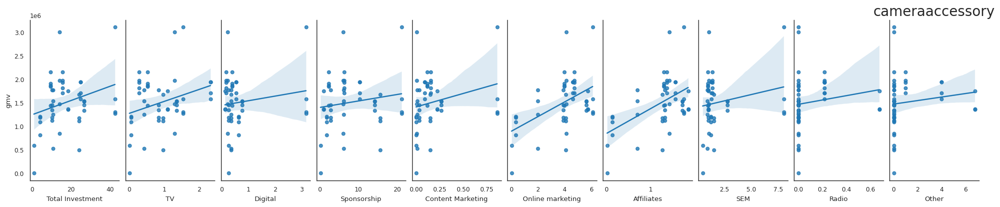

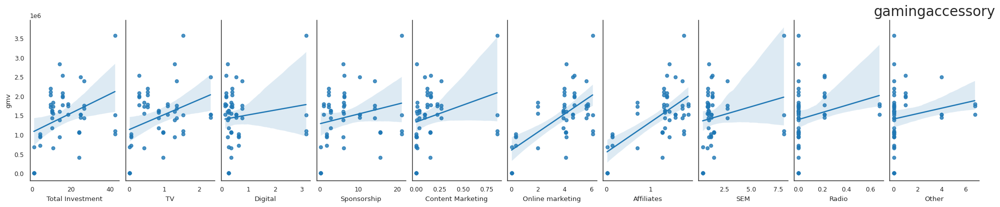

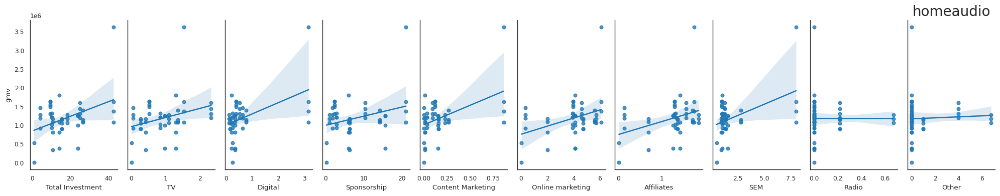

In [286]:
# Slightly alter the figure size to make it more horizontal.
#plt.figure(figsize=(10,4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster


sns.pairplot(Camera_accessory_df, x_vars=['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', \
                                      'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'], \
             y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('cameraaccessory', fontsize = 20)

sns.pairplot(gaming_accessory_df, x_vars=['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', \
                                      'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'], \
             y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('gamingaccessory', fontsize = 20)

sns.pairplot(Homeaudio_df, x_vars=['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', \
                                      'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'], \
             y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('homeaudio', fontsize = 20)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

In [287]:
Camera_accessory_df.drop(['Week'], axis = 1, inplace = True)
gaming_accessory_df.drop(['Week'], axis = 1, inplace = True)
Homeaudio_df.drop(['Week'], axis = 1, inplace = True)

In [288]:
Camera_accessory_org_df = Camera_accessory_df.copy()
gaming_accessory_org_df = gaming_accessory_df.copy()
Homeaudio_org_df = Homeaudio_df.copy()

# Step 4 - Model Building


# Liner Regression Model

In [289]:
#Function to calculate the elasticity of the important KPIs
def calculateElasticity(df_train, gmv, coefficient_df):
    elasticity = []
    for i in coefficient_df.feature:
        feature_mean = df_train[i].mean()
        elasticity.append((((coefficient_df.loc[coefficient_df['feature']==i]['coefficient'].mean())*feature_mean)/gmv.mean()))
    coefficient_df['elasticity'] = pd.Series(elasticity)
    return coefficient_df

## Building Linear Regression Model for HomeAudio


In [290]:
# Split the datafram into train and test sets
from sklearn.model_selection import train_test_split

In [291]:
np.random.seed(0)
df_train, df_test = train_test_split(Homeaudio_df, train_size = 0.7, test_size = 0.3, random_state = 100)

####Rescaling the Features


In [292]:
Homeaudio_df.columns

Index(['gmv', 'Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'order_payment_type_Prepaid', 'is_mass_market', 'special_sales', 'product_vertical_Dock', 'product_vertical_DockingStation', 'product_vertical_FMRadio', 'product_vertical_HiFiSystem', 'product_vertical_HomeAudioSpeaker', 'product_mrp', 'product_vertical_SoundMixer', 'product_vertical_VoiceRecorder', 'pay_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship', 'Sponsorship_SMA_3', 'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', 'Content Marketing_SMA_3', 'Content Marketing_SMA_5', 'Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock', 'Online marketing', 'Online marketing_SMA_3', 'Online marketing_SMA_5',
    

In [293]:
from sklearn.preprocessing import MinMaxScaler

In [294]:
scaler = MinMaxScaler()

In [295]:
num_vars = ['gmv', 'Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'order_payment_type_Prepaid', 'is_mass_market', 'special_sales',
'product_vertical_Dock', 'product_vertical_DockingStation',
'product_vertical_FMRadio', 'product_vertical_HiFiSystem', 'product_vertical_HomeAudioSpeaker',
'product_mrp', 'product_vertical_SoundMixer', 'product_vertical_VoiceRecorder',
'pay_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3',
'Total Investment_SMA_5', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock',
'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3',
'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship',
'Sponsorship_SMA_3', 'Sponsorship_SMA_5', 'Sponsorship_EMA_8',
'Sponsorship_Ad_Stock', 'Content Marketing', 'Content Marketing_SMA_3',
'Content Marketing_SMA_5', 'Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock', 'Online marketing',
'Online marketing_SMA_3', 'Online marketing_SMA_5', 'Online marketing_EMA_8',
'Online_marketing_Ad_Stock', 'Affiliates', 'Affiliates_SMA_3',
'Affiliates_SMA_5', 'Affiliates_EMA_8', 'Affiliates_Ad_Stock', 'SEM',
'SEM_SMA_3', 'SEM_SMA_5', 'SEM_EMA_8', 'SEM_Ad_Stock', 'Radio',
'Radio_SMA_3', 'Radio_SMA_5', 'Radio_EMA_8', 'Radio_Ad_Stock', 'Other',
'Other_SMA_3', 'Other_SMA_5', 'Other_EMA_8', 'Other_Ad_Stock', 'NPS',
'NPS_SMA_3', 'NPS_SMA_5', 'Stock Index', 'Stock Index_SMA_3',
'Stock Index_SMA_5', 'Max Temp', 'Min Temp', 'Mean Temp',
'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)',
 'Total Precip (mm)', 'Snow on Grnd (cm)']

In [296]:
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])

df_train.head()

df_test[num_vars] = scaler.fit_transform(df_test[num_vars])

In [297]:
df_train.describe()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,order_payment_type_Prepaid,is_mass_market,special_sales,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_mrp,product_vertical_SoundMixer,product_vertical_VoiceRecorder,pay_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00
mean,0.65,0.73,0.22,0.22,0.41,0.56,0.29,0.66,0.08,0.50,0.28,0.62,0.45,0.67,0.14,0.06,0.32,0.45,0.27,0.41,0.43,0.46,0.47,0.41,0.40,0.42,0.44,0.51,0.44,0.17,0.21,0.24,0.23,0.18,0.37,0.39,0.40,0.39,0.36,0.20,0.21,0.26,0.30,0.23,0.65,0.66,0.69,0.67,0.68,0.69,0.69,0.68,0.67,0.67,0.19,0.25,0.29,0.20,0.18,0.13,0.12,0.15,0.19,0.14,0.14,0.13,0.16,0.20,0.15,0.29,0.84,0.79,0.62,0.90,0.85,0.55,0.60,0.58,0.32,0.21,0.20,0.14,0.19,0.06
std,0.19,0.18,0.37,0.37,0.17,0.28,0.20,0.20,0.23,0.27,0.23,0.20,0.20,0.22,0.17,0.24,0.24,0.51,0.45,0.26,0.24,0.25,0.24,0.23,0.26,0.26,0.27,0.28,0.26,0.27,0.24,0.27,0.25,0.24,0.31,0.28,0.27,0.25,0.26,0.28,0.25,0.27,0.25,0.24,0.30,0.28,0.30,0.30,0.29,0.29,0.28,0.29,0.30,0.29,0.27,0.23,0.26,0.27,0.25,0.30,0.23,0.24,0.24,0.23,0.31,0.25,0.26,0.27,0.25,0.23,0.16,0.26,0.36,0.17,0.28,0.30,0.27,0.30,0.31,0.33,0.26,0.31,0.24,0.19
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.60,0.69,0.00,0.00,0.36,0.38,0.21,0.61,0.00,0.33,0.14,0.55,0.31,0.54,0.07,0.00,0.17,0.00,0.00,0.22,0.29,0.35,0.35,0.28,0.18,0.22,0.23,0.31,0.26,0.05,0.09,0.09,0.07,0.06,0.10,0.13,0.25,0.31,0.22,0.01,0.07,0.10,0.12,0.08,0.64,0.64,0.64,0.60,0.61,0.68,0.68,0.60,0.56,0.59,0.07,0.13,0.17,0.03,0.04,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.82,0.83,0.16,0.88,0.87,0.31,0.41,0.30,0.02,0.00,0.03,0.00,0.02,0.00
50%,0.65,0.75,0.00,0.00,0.43,0.50,0.23,0.69,0.00,0.47,0.19,0.63,0.45,0.69,0.11,0.00,0.22,0.00,0.00,0.35,0.39,0.43,0.47,0.42,0.42,0.44,0.51,0.59,0.50,0.08,0.12,0.14,0.14,0.09,0.29,0.30,0.36,0.35,0.30,0.14,0.14,0.17,0.21,0.17,0.68,0.73,0.76,0.80,0.76,0.74,0.77,0.80,0.79,0.78,0.10,0.16,0.19,0.05,0.07,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.19,0.84,0.86,0.79,0.95,0.93,0.62,0.63,0.57,0.28,0.00,0.09,0.00,0.11,0.00
75%,0.73,0.84,0.42,0.42,0.48,0.8

Dividing into X and Y sets for the model building


In [298]:
y_train = df_train.pop('gmv')
X_train = df_train

In [299]:
import statsmodels.api as sm
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn import metrics

####Building the first model with all the features


In [300]:
# Instantiate
lm = LinearRegression()

# Fit a line
lm.fit(X_train, y_train)

LinearRegression()

In [301]:
# Print the coefficients and intercept
print(lm.coef_)
print(lm.intercept_)

[ 6.41812510e-02  3.20408325e-03  2.85180734e-03 -9.39601756e-02
 -5.03373645e-02  4.44944174e-02  2.05731692e-01 -1.46712299e-02
  1.41418017e-03 -4.10733949e-02  1.81401235e-01  1.61258727e-01
  2.77884070e-01  6.50349409e-02  1.08055705e-02  1.98793544e-01
  4.29827945e-05  2.49420677e-02 -5.67472327e-04 -1.22601131e-02
  2.24206672e-02  8.73354724e-03  1.04768154e-02 -5.72877461e-02
 -5.13449885e-02 -2.00455854e-02 -4.38869130e-02 -4.15591521e-02
 -2.27278454e-02  3.55547337e-02  1.78796326e-02 -1.00009575e-02
  2.02032045e-02  3.91689469e-02 -1.08608377e-03  3.06119732e-02
  3.68969864e-03  2.02396704e-02 -1.52702433e-02  2.67114616e-02
  4.34329348e-02  2.63085261e-02  3.02642777e-02 -2.05664706e-02
 -3.99982339e-02  3.39480145e-02  1.51159002e-02 -2.79446083e-03
 -2.93254736e-02 -3.58655442e-02  3.30280049e-02  1.37995580e-02
 -3.79823636e-03 -3.56157028e-02 -2.97074014e-03 -1.41467288e-03
 -2.99004930e-02 -6.06181074e-03 -3.11187160e-02 -4.42254937e-02
 -1.35179508e-02  5.94904

### Model Building Using RFE


In [302]:
# Import RFE
from sklearn.feature_selection import RFE


lm = LinearRegression()

lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=20)             # running RFE
rfe = rfe.fit(X_train, y_train)


# Print the boolean results
print(rfe.support_)
print(rfe.ranking_)

[False False False  True False False False False False False  True  True
  True  True False  True False False False False  True False False False
 False False False False  True  True False False False  True False  True
 False False False  True  True False False  True  True  True False False
 False False  True False False False False False False False False False
 False  True False False False False False False False False False False
 False  True  True False False False False False False False False]
[19 52 58  1 20  4  2 27 59  9  1  1  1  1 41  1 64 23 63 36  1 47 39 21
 29 11  8 18  1  1 45 46 37  1 62  1 53 25 28  1  1 15 31  1  1  1 30 56
  5 40  1 35 54 16 57 60 33 50 26 14 38  1 61 42  6 55  7 44  3 13 10 22
 49  1  1 48 24 17 32 34 12 51 43]


In [303]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('Discount%', False, 19),
 ('deliverybdays', False, 52),
 ('deliverycdays', False, 58),
 ('sla', True, 1),
 ('product_procurement_sla', False, 20),
 ('order_payment_type_Prepaid', False, 4),
 ('is_mass_market', False, 2),
 ('special_sales', False, 27),
 ('product_vertical_Dock', False, 59),
 ('product_vertical_DockingStation', False, 9),
 ('product_vertical_FMRadio', True, 1),
 ('product_vertical_HiFiSystem', True, 1),
 ('product_vertical_HomeAudioSpeaker', True, 1),
 ('product_mrp', True, 1),
 ('product_vertical_SoundMixer', False, 41),
 ('product_vertical_VoiceRecorder', True, 1),
 ('pay_week', False, 64),
 ('holiday_week', False, 23),
 ('Total Investment', False, 63),
 ('Total Investment_SMA_3', False, 36),
 ('Total Investment_SMA_5', True, 1),
 ('Total Investment_EMA_8', False, 47),
 ('Total_Investment_Ad_Stock', False, 39),
 ('TV', False, 21),
 ('TV_SMA_3', False, 29),
 ('TV_SMA_5', False, 11),
 ('TV_EMA_8', False, 8),
 ('TV_Ad_Stock', False, 18),
 ('Digital', True, 1),
 ('Digita

In [304]:
col = X_train.columns[rfe.support_]
col

Index(['sla', 'product_vertical_FMRadio', 'product_vertical_HiFiSystem', 'product_vertical_HomeAudioSpeaker', 'product_mrp', 'product_vertical_VoiceRecorder', 'Total Investment_SMA_5', 'Digital', 'Digital_SMA_3', 'Sponsorship', 'Sponsorship_SMA_5', 'Content Marketing_SMA_3', 'Content Marketing_SMA_5', 'Online marketing', 'Online marketing_SMA_3', 'Online marketing_SMA_5', 'Affiliates_SMA_5', 'Radio_EMA_8', 'Stock Index_SMA_5', 'Max Temp'], dtype='object')

In [305]:
X_train.columns[~rfe.support_]

Index(['Discount%', 'deliverybdays', 'deliverycdays', 'product_procurement_sla', 'order_payment_type_Prepaid', 'is_mass_market', 'special_sales', 'product_vertical_Dock', 'product_vertical_DockingStation', 'product_vertical_SoundMixer', 'pay_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship_SMA_3', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', 'Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock', 'Online marketing_EMA_8', 'Online_marketing_Ad_Stock', 'Affiliates', 'Affiliates_SMA_3', 'Affiliates_EMA_8', 'Affiliates_Ad_Stock', 'SEM', 'SEM_SMA_3', 'SEM_SMA_5', 'SEM_EMA_8', 'SEM_Ad_Stock', 'Radio', 'Radio_SMA_3', 'Radio_SMA_5', 'Radio_Ad_Stock', 'Other', 'Other_SMA_3', 'Other_SMA_5', 'Other_EMA_8', 'Other_Ad_Stock', 'NPS', 'NPS_SMA_3', 'NPS_SMA_5', 'Stock Index',
       '

Building model using statsmodel, for the detailed statistic


In [306]:
# Import statsmodels
import statsmodels.api as sm

In [307]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [308]:
# Adding a constant variable
import statsmodels.api as sm
X_train_rfe = sm.add_constant(X_train_rfe)

In [309]:
lm = sm.OLS(y_train,X_train_rfe).fit()   # Running the linear model

In [310]:
lm.params

,0
const,0.31
sla,-0.15
product_vertical_FMRadio,0.36
product_vertical_HiFiSystem,0.10
product_vertical_HomeAudioSpeaker,0.41
product_mrp,0.11
product_vertical_VoiceRecorder,0.17
Total Investment_SMA_5,-0.77
Digital,-0.14
Digital_SMA_3,-0.10


In [311]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     811.1
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           8.12e-16
Time:                        17:17:29   Log-Likelihood:                 127.62
No. Observations:                  33   AIC:                            -213.2
Df Residuals:                      12   BIC:                            -181.8
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [312]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [313]:
#Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
17,Affiliates_SMA_5,2244.11
16,Online marketing_SMA_5,1874.42
7,Total Investment_SMA_5,815.33
0,const,533.57
11,Sponsorship_SMA_5,350.15
13,Content Marketing_SMA_5,173.31
15,Online marketing_SMA_3,132.03
12,Content Marketing_SMA_3,93.72
9,Digital_SMA_3,55.09
14,Online marketing,40.33


In [314]:
# drop Digital_SMA_3 due to high p-value
X_train_rfe.drop('Digital_SMA_3', axis = 1, inplace = True)

In [315]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model with 9 variables
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                0.28
sla                                 -0.15
product_vertical_FMRadio             0.38
product_vertical_HiFiSystem          0.11
product_vertical_HomeAudioSpeaker    0.41
product_mrp                          0.12
product_vertical_VoiceRecorder       0.15
Total Investment_SMA_5              -0.78
Digital                             -0.15
Sponsorship                          0.15
Sponsorship_SMA_5                    0.40
Content Marketing_SMA_3              0.15
Content Marketing_SMA_5              0.22
Online marketing                    -0.03
Online marketing_SMA_3              -0.26
Online marketing_SMA_5               0.34
Affiliates_SMA_5                     0.01
Radio_EMA_8                          0.07
Stock Index_SMA_5                   -0.14
Max Temp                            -0.10
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                

In [316]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs

vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
16,Affiliates_SMA_5,1864.00
15,Online marketing_SMA_5,1399.55
7,Total Investment_SMA_5,815.01
0,const,459.51
10,Sponsorship_SMA_5,349.87
12,Content Marketing_SMA_5,164.64
14,Online marketing_SMA_3,131.40
11,Content Marketing_SMA_3,42.31
13,Online marketing,35.73
9,Sponsorship,28.13


In [317]:
X_train_rfe.drop('Affiliates_SMA_5', axis = 1, inplace = True)

In [318]:
X_train_rfe = sm.add_constant(X_train_rfe)

# Fitting the model with 8 variables
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)
print(lm.summary())

const                                0.28
sla                                 -0.15
product_vertical_FMRadio             0.38
product_vertical_HiFiSystem          0.11
product_vertical_HomeAudioSpeaker    0.41
product_mrp                          0.12
product_vertical_VoiceRecorder       0.15
Total Investment_SMA_5              -0.77
Digital                             -0.15
Sponsorship                          0.15
Sponsorship_SMA_5                    0.39
Content Marketing_SMA_3              0.15
Content Marketing_SMA_5              0.22
Online marketing                    -0.03
Online marketing_SMA_3              -0.26
Online marketing_SMA_5               0.34
Radio_EMA_8                          0.07
Stock Index_SMA_5                   -0.14
Max Temp                            -0.10
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                       

In [319]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs

vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,447.71
7,Total Investment_SMA_5,268.01
14,Online marketing_SMA_3,131.12
15,Online marketing_SMA_5,114.47
10,Sponsorship_SMA_5,113.15
12,Content Marketing_SMA_5,70.30
11,Content Marketing_SMA_3,42.03
13,Online marketing,28.12
8,Digital,22.53
9,Sponsorship,22.46


In [320]:
X_train_rfe.drop('Total Investment_SMA_5', axis = 1, inplace = True)

In [321]:
X_train_rfe = sm.add_constant(X_train_rfe)
# Fitting the model with 8 variables
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)
print(lm.summary())

const                                0.15
sla                                 -0.04
product_vertical_FMRadio             0.31
product_vertical_HiFiSystem          0.05
product_vertical_HomeAudioSpeaker    0.57
product_mrp                         -0.04
product_vertical_VoiceRecorder       0.09
Digital                             -0.04
Sponsorship                          0.05
Sponsorship_SMA_5                   -0.05
Content Marketing_SMA_3              0.13
Content Marketing_SMA_5             -0.03
Online marketing                    -0.06
Online marketing_SMA_3              -0.22
Online marketing_SMA_5               0.16
Radio_EMA_8                         -0.01
Stock Index_SMA_5                   -0.03
Max Temp                            -0.03
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                

In [322]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,305.12
13,Online marketing_SMA_3,130.14
14,Online marketing_SMA_5,93.49
10,Content Marketing_SMA_3,41.78
11,Content Marketing_SMA_5,38.55
12,Online marketing,27.61
8,Sponsorship,15.78
2,product_vertical_FMRadio,15.19
7,Digital,15.08
5,product_mrp,13.53


In [323]:
X_train_rfe.drop('Online marketing_SMA_3', axis = 1, inplace = True)

In [324]:
X_train_rfe = sm.add_constant(X_train_rfe)

# Fitting the model with 8 variables
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)
print(lm.summary())

const                                0.15
sla                                 -0.07
product_vertical_FMRadio             0.29
product_vertical_HiFiSystem          0.05
product_vertical_HomeAudioSpeaker    0.58
product_mrp                         -0.03
product_vertical_VoiceRecorder       0.10
Digital                              0.01
Sponsorship                          0.03
Sponsorship_SMA_5                   -0.06
Content Marketing_SMA_3              0.04
Content Marketing_SMA_5              0.03
Online marketing                    -0.12
Online marketing_SMA_5               0.02
Radio_EMA_8                         -0.02
Stock Index_SMA_5                   -0.02
Max Temp                            -0.03
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squa

In [325]:
#Create a dataframe that will contain the names of all the feature variables and their respective VIFs

vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,304.30
11,Content Marketing_SMA_5,29.92
13,Online marketing_SMA_5,27.66
10,Content Marketing_SMA_3,23.37
12,Online marketing,18.40
2,product_vertical_FMRadio,14.66
8,Sponsorship,14.17
5,product_mrp,13.47
9,Sponsorship_SMA_5,11.40
7,Digital,8.77


In [326]:
X_train_rfe.drop('Content Marketing_SMA_5', axis = 1, inplace = True)

In [327]:
X_train_rfe = sm.add_constant(X_train_rfe)

# Fitting the model with 8 variables
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)
print(lm.summary())

const                                0.15
sla                                 -0.07
product_vertical_FMRadio             0.30
product_vertical_HiFiSystem          0.05
product_vertical_HomeAudioSpeaker    0.58
product_mrp                         -0.03
product_vertical_VoiceRecorder       0.08
Digital                              0.02
Sponsorship                          0.02
Sponsorship_SMA_5                   -0.05
Content Marketing_SMA_3              0.06
Online marketing                    -0.12
Online marketing_SMA_5               0.03
Radio_EMA_8                         -0.02
Stock Index_SMA_5                   -0.01
Max Temp                            -0.03
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     197

In [328]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs

vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,301.37
12,Online marketing_SMA_5,23.48
11,Online marketing,15.95
10,Content Marketing_SMA_3,14.58
5,product_mrp,13.45
2,product_vertical_FMRadio,12.85
8,Sponsorship,10.03
9,Sponsorship_SMA_5,9.03
7,Digital,8.43
4,product_vertical_HomeAudioSpeaker,8.08


In [329]:
X_train_rfe.drop('Content Marketing_SMA_3', axis = 1, inplace = True)

In [330]:
X_train_rfe = sm.add_constant(X_train_rfe)

# Fitting the model with 8 variables
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)
print(lm.summary())

const                                0.11
sla                                 -0.05
product_vertical_FMRadio             0.30
product_vertical_HiFiSystem          0.03
product_vertical_HomeAudioSpeaker    0.61
product_mrp                         -0.02
product_vertical_VoiceRecorder       0.07
Digital                              0.04
Sponsorship                          0.01
Sponsorship_SMA_5                   -0.03
Online marketing                    -0.13
Online marketing_SMA_5               0.05
Radio_EMA_8                         -0.01
Stock Index_SMA_5                   -0.01
Max Temp                            -0.02
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     209.6
Date:                Sun, 16 Mar 2025  

In [331]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs

vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,184.56
11,Online marketing_SMA_5,21.34
10,Online marketing,15.91
5,product_mrp,13.35
2,product_vertical_FMRadio,12.80
8,Sponsorship,9.77
9,Sponsorship_SMA_5,7.24
1,sla,6.97
14,Max Temp,5.90
13,Stock Index_SMA_5,5.39


In [332]:
X_train_rfe.drop('Online marketing_SMA_5', axis = 1, inplace = True)

In [333]:
X_train_rfe = sm.add_constant(X_train_rfe)

# Fitting the model with 8 variables
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)
print(lm.summary())

const                                0.13
sla                                 -0.06
product_vertical_FMRadio             0.30
product_vertical_HiFiSystem          0.03
product_vertical_HomeAudioSpeaker    0.62
product_mrp                         -0.04
product_vertical_VoiceRecorder       0.07
Digital                              0.05
Sponsorship                         -0.00
Sponsorship_SMA_5                   -0.01
Online marketing                    -0.11
Radio_EMA_8                         -0.01
Stock Index_SMA_5                    0.01
Max Temp                            -0.03
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     228.4
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           5.25e-18
Ti

In [334]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs

vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,148.24
10,Online marketing,13.32
5,product_mrp,12.63
2,product_vertical_FMRadio,12.59
1,sla,6.81
8,Sponsorship,6.34
13,Max Temp,4.91
9,Sponsorship_SMA_5,4.71
4,product_vertical_HomeAudioSpeaker,4.54
7,Digital,4.42


In [335]:
X_train_rfe.drop('Online marketing', axis = 1, inplace = True)

In [336]:
X_train_rfe = sm.add_constant(X_train_rfe)

# Fitting the model with 8 variables
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)
print(lm.summary())

const                                0.08
sla                                 -0.11
product_vertical_FMRadio             0.38
product_vertical_HiFiSystem         -0.01
product_vertical_HomeAudioSpeaker    0.60
product_mrp                          0.06
product_vertical_VoiceRecorder       0.06
Digital                              0.05
Sponsorship                         -0.04
Sponsorship_SMA_5                   -0.05
Radio_EMA_8                         -0.04
Stock Index_SMA_5                   -0.02
Max Temp                            -0.00
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     192.6
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           6.25e-18
Time:                        17:17:30   Log-

In [337]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs

vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,122.82
5,product_mrp,9.42
2,product_vertical_FMRadio,9.35
1,sla,6.03
4,product_vertical_HomeAudioSpeaker,4.41
7,Digital,4.41
8,Sponsorship,4.32
12,Max Temp,4.21
6,product_vertical_VoiceRecorder,3.77
9,Sponsorship_SMA_5,3.42


In [338]:
X_train_rfe.drop('product_vertical_FMRadio', axis = 1, inplace = True)

In [339]:
X_train_rfe = sm.add_constant(X_train_rfe)

# Fitting the model with 8 variables
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)
print(lm.summary())

const                                0.05
sla                                  0.17
product_vertical_HiFiSystem          0.03
product_vertical_HomeAudioSpeaker    0.71
product_mrp                         -0.30
product_vertical_VoiceRecorder       0.19
Digital                              0.12
Sponsorship                         -0.09
Sponsorship_SMA_5                   -0.05
Radio_EMA_8                         -0.07
Stock Index_SMA_5                    0.01
Max Temp                             0.09
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.975
Model:                            OLS   Adj. R-squared:                  0.961
Method:                 Least Squares   F-statistic:                     72.98
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.49e-14
Time:                        17:17:30   Log-Likelihood:                 69.206
No. Obs

In [340]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs

vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,120.81
7,Sponsorship,4.03
6,Digital,3.70
4,product_mrp,3.69
3,product_vertical_HomeAudioSpeaker,3.58
8,Sponsorship_SMA_5,3.42
9,Radio_EMA_8,3.16
10,Stock Index_SMA_5,2.98
2,product_vertical_HiFiSystem,2.87
11,Max Temp,2.80


In [341]:
X_train_rfe.drop('product_vertical_HiFiSystem', axis = 1, inplace = True)

In [342]:
X_train_rfe = sm.add_constant(X_train_rfe)
# Fitting the model with 8 variables
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)
print(lm.summary())

const                                0.06
sla                                  0.16
product_vertical_HomeAudioSpeaker    0.73
product_mrp                         -0.30
product_vertical_VoiceRecorder       0.19
Digital                              0.13
Sponsorship                         -0.09
Sponsorship_SMA_5                   -0.06
Radio_EMA_8                         -0.08
Stock Index_SMA_5                    0.01
Max Temp                             0.09
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.974
Model:                            OLS   Adj. R-squared:                  0.962
Method:                 Least Squares   F-statistic:                     82.49
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.51e-15
Time:                        17:17:30   Log-Likelihood:                 68.894
No. Observations:                  33   AIC:     

In [343]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,115.24
6,Sponsorship,3.92
3,product_mrp,3.69
5,Digital,3.62
7,Sponsorship_SMA_5,3.27
9,Stock Index_SMA_5,2.97
8,Radio_EMA_8,2.67
10,Max Temp,2.56
1,sla,2.51
2,product_vertical_HomeAudioSpeaker,2.49


In [344]:
X_train_rfe.drop('Max Temp', axis = 1, inplace = True)

In [345]:
X_train_rfe = sm.add_constant(X_train_rfe)

# Fitting the model with 8 variables
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)
print(lm.summary())

const                                0.20
sla                                  0.10
product_vertical_HomeAudioSpeaker    0.67
product_mrp                         -0.27
product_vertical_VoiceRecorder       0.22
Digital                              0.12
Sponsorship                         -0.08
Sponsorship_SMA_5                   -0.05
Radio_EMA_8                         -0.13
Stock Index_SMA_5                   -0.03
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.967
Model:                            OLS   Adj. R-squared:                  0.954
Method:                 Least Squares   F-statistic:                     74.13
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           7.58e-15
Time:                        17:17:30   Log-Likelihood:                 64.783
No. Observations:                  33   AIC:                            -109.6
Df Residuals

In [346]:
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,39.14
6,Sponsorship,3.86
5,Digital,3.60
3,product_mrp,3.59
7,Sponsorship_SMA_5,3.25
9,Stock Index_SMA_5,2.41
1,sla,2.08
8,Radio_EMA_8,2.07
4,product_vertical_VoiceRecorder,1.97
2,product_vertical_HomeAudioSpeaker,1.94


In [347]:
X_train_rfe.drop('Stock Index_SMA_5', axis = 1, inplace = True)

In [348]:
X_train_rfe = sm.add_constant(X_train_rfe)

# Fitting the model with 8 variables
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)
print(lm.summary())

const                                0.18
sla                                  0.10
product_vertical_HomeAudioSpeaker    0.68
product_mrp                         -0.28
product_vertical_VoiceRecorder       0.21
Digital                              0.13
Sponsorship                         -0.09
Sponsorship_SMA_5                   -0.07
Radio_EMA_8                         -0.14
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.966
Model:                            OLS   Adj. R-squared:                  0.954
Method:                 Least Squares   F-statistic:                     84.89
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.03e-15
Time:                        17:17:30   Log-Likelihood:                 64.388
No. Observations:                  33   AIC:                            -110.8
Df Residuals:                      24   BIC:          

In [349]:
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,33.79
3,product_mrp,3.41
6,Sponsorship,3.26
5,Digital,2.92
1,sla,2.08
7,Sponsorship_SMA_5,2.08
2,product_vertical_HomeAudioSpeaker,1.89
8,Radio_EMA_8,1.87
4,product_vertical_VoiceRecorder,1.74


In [350]:
X_train_rfe.drop('product_mrp', axis = 1, inplace = True)

In [351]:
X_train_rfe = sm.add_constant(X_train_rfe)

# Fitting the model with 8 variables
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)
print(lm.summary())

const                                0.11
sla                                 -0.04
product_vertical_HomeAudioSpeaker    0.77
product_vertical_VoiceRecorder       0.19
Digital                              0.07
Sponsorship                         -0.03
Sponsorship_SMA_5                   -0.02
Radio_EMA_8                         -0.11
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.948
Model:                            OLS   Adj. R-squared:                  0.933
Method:                 Least Squares   F-statistic:                     65.12
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.81e-14
Time:                        17:17:30   Log-Likelihood:                 57.446
No. Observations:                  33   AIC:                            -98.89
Df Residuals:                      25   BIC:                            -86.92
Df Model:        

In [352]:
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,24.73
5,Sponsorship,2.63
4,Digital,2.40
7,Radio_EMA_8,1.81
6,Sponsorship_SMA_5,1.74
3,product_vertical_VoiceRecorder,1.68
2,product_vertical_HomeAudioSpeaker,1.20
1,sla,1.19


Elasticity

In [353]:
coefficients_df = pd.DataFrame(pd.DataFrame(lm.params)[1:]).reset_index()
coefficients_df.columns = ['feature','coefficient']
elasticity_data = calculateElasticity(X_train_rfe, y_train, coefficients_df)

<Axes: xlabel='elasticity', ylabel='feature'>

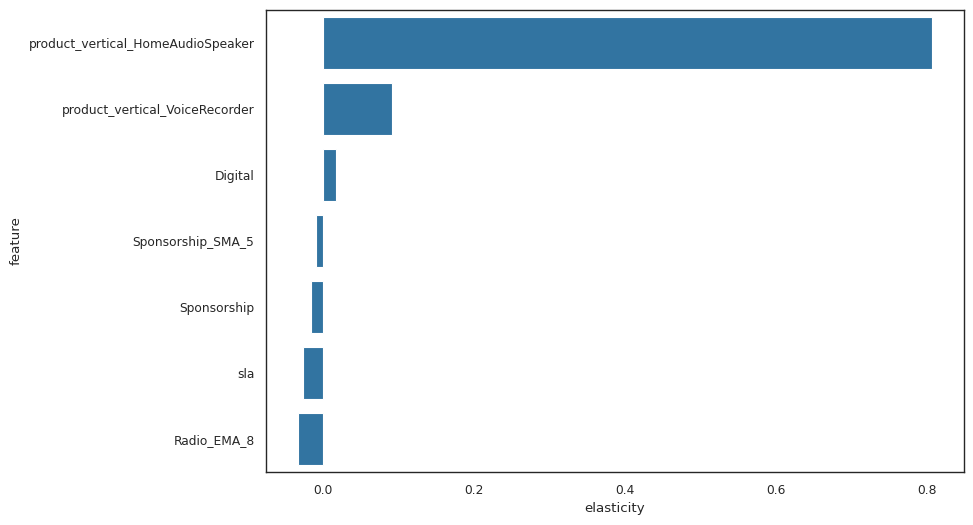

In [354]:
plt.figure(figsize = (9,6))
sns.barplot(x = 'elasticity',y ='feature',data = elasticity_data.sort_values('elasticity', ascending = False))

### Model Evaluation


In [355]:
X_train_rfe.columns

Index(['const', 'sla', 'product_vertical_HomeAudioSpeaker', 'product_vertical_VoiceRecorder', 'Digital', 'Sponsorship', 'Sponsorship_SMA_5', 'Radio_EMA_8'], dtype='object')

In [356]:
drop_columns_list = list(set(num_vars) - set(list(X_train_rfe.columns)))
print(drop_columns_list)

['Affiliates_SMA_3', 'deliverybdays', 'Total Investment_EMA_8', 'NPS_SMA_5', 'Heat Deg Days', 'Total_Investment_Ad_Stock', 'Online marketing_EMA_8', 'Snow on Grnd (cm)', 'NPS_SMA_3', 'product_procurement_sla', 'Sponsorship_EMA_8', 'Content Marketing_SMA_5', 'Affiliates_EMA_8', 'Total Investment', 'holiday_week', 'TV_EMA_8', 'product_vertical_FMRadio', 'SEM_SMA_5', 'Stock Index_SMA_5', 'is_mass_market', 'SEM_EMA_8', 'Discount%', 'Digital_SMA_5', 'Total Precip (mm)', 'SEM_SMA_3', 'order_payment_type_Prepaid', 'SEM_Ad_Stock', 'Online marketing', 'SEM', 'Other_SMA_5', 'Other_SMA_3', 'special_sales', 'Sponsorship_Ad_Stock', 'Radio_SMA_3', 'Digital_SMA_3', 'Online marketing_SMA_5', 'Stock Index', 'Radio', 'Sponsorship_SMA_3', 'Max Temp', 'Radio_SMA_5', 'Other_Ad_Stock', 'TV_SMA_5', 'Total Investment_SMA_3', 'Online marketing_SMA_3', 'Digital_EMA_8', 'product_vertical_DockingStation', 'Stock Index_SMA_3', 'Content Marketing_SMA_3', 'Total Snow (cm)', 'Total Investment_SMA_5', 'Other_EMA_8', '

In [357]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

folds = KFold(n_splits = 10, shuffle = True, random_state = 100)
lm=LinearRegression()
scores = cross_val_score(lm, X_train_rfe, y_train, scoring='r2', cv=folds)
scores

array([ 0.34261709, -0.14705532,  0.96609764,  0.95351153,  0.7590609 ,
        0.87457673,  0.00285305,  0.66655387, -0.87803399,  0.91429432])

In [358]:
y_pred = cross_val_predict(lm, X_train_rfe, y_train, cv=folds)

In [359]:
mse = mean_squared_error(y_train, y_pred)
r_squared = r2_score(y_train, y_pred)
print('Mean_Squared_Error :' ,mse)
print('r_square_value :',r_squared)

Mean_Squared_Error : 0.005358669360038876
r_square_value : 0.8453028904590499


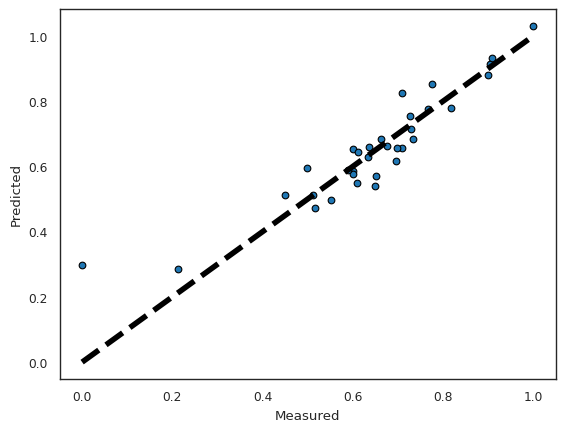

In [360]:
fig, ax = plt.subplots()
ax.scatter(y_train, y_pred, edgecolors=(0, 0, 0))
ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

##Building Linear Regression Model for Camera Accessory


In [361]:
np.random.seed(0)
df_train, df_test = train_test_split(Camera_accessory_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [362]:
Camera_accessory_df.columns

Index(['gmv', 'Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'product_mrp', 'order_payment_type_Prepaid', 'is_mass_market', 'product_vertical_CameraAccessory', 'special_sales', 'product_vertical_CameraBag', 'product_vertical_CameraBattery', 'product_vertical_CameraBatteryCharger', 'product_vertical_CameraBatteryGrip', 'product_vertical_CameraEyeCup', 'product_vertical_CameraFilmRolls', 'product_vertical_CameraHousing', 'product_vertical_CameraMicrophone', 'product_vertical_CameraMount', 'product_vertical_CameraRemoteControl', 'product_vertical_CameraTripod', 'product_vertical_ExtensionTube', 'product_vertical_Filter', 'product_vertical_Flash', 'product_vertical_FlashShoeAdapter', 'product_vertical_Lens', 'product_vertical_ReflectorUmbrella', 'product_vertical_Softbox', 'product_vertical_Strap', 'product_vertical_Telescope', 'pay_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8',
    

In [363]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [364]:
num_vars = ['gmv', 'Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'product_mrp', 'order_payment_type_Prepaid', 'is_mass_market', 'product_vertical_CameraAccessory', 'special_sales', 'product_vertical_CameraBag', 'product_vertical_CameraBattery', 'product_vertical_CameraBatteryCharger', 'product_vertical_CameraBatteryGrip', 'product_vertical_CameraEyeCup', 'product_vertical_CameraFilmRolls', 'product_vertical_CameraHousing', 'product_vertical_CameraMicrophone', 'product_vertical_CameraMount', 'product_vertical_CameraRemoteControl', 'product_vertical_CameraTripod', 'product_vertical_ExtensionTube', 'product_vertical_Filter', 'product_vertical_Flash', 'product_vertical_FlashShoeAdapter', 'product_vertical_Lens', 'product_vertical_ReflectorUmbrella', 'product_vertical_Softbox', 'product_vertical_Strap', 'product_vertical_Telescope', 'pay_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8',
       'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship', 'Sponsorship_SMA_3', 'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', 'Content Marketing_SMA_3', 'Content Marketing_SMA_5', 'Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock', 'Online marketing', 'Online marketing_SMA_3', 'Online marketing_SMA_5', 'Online marketing_EMA_8', 'Online_marketing_Ad_Stock', 'Affiliates', 'Affiliates_SMA_3', 'Affiliates_SMA_5', 'Affiliates_EMA_8', 'Affiliates_Ad_Stock', 'SEM', 'SEM_SMA_3', 'SEM_SMA_5', 'SEM_EMA_8', 'SEM_Ad_Stock', 'Radio', 'Radio_SMA_3', 'Radio_SMA_5', 'Radio_EMA_8', 'Radio_Ad_Stock', 'Other', 'Other_SMA_3', 'Other_SMA_5', 'Other_EMA_8', 'Other_Ad_Stock', 'NPS', 'NPS_SMA_3', 'NPS_SMA_5', 'Stock Index', 'Stock Index_SMA_3', 'Stock Index_SMA_5', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days', 'Cool Deg Days',
       'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)']

In [365]:
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])

In [366]:
df_train.head()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,product_mrp,order_payment_type_Prepaid,is_mass_market,product_vertical_CameraAccessory,special_sales,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Telescope,pay_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
13,0.65,0.87,0.97,0.98,0.35,0.04,0.67,1.00,0.64,0.43,0.00,0.56,0.60,0.55,0.25,0.25,0.36,0.00,0.80,0.59,0.56,0.29,0.25,0.45,0.63,0.00,0.58,0.00,0.00,0.54,0.58,0.00,0.00,0.32,0.50,0.59,0.53,0.46,0.56,0.85,1.00,0.94,0.85,0.03,0.13,0.18,0.11,0.08,0.28,0.42,0.47,0.37,0.37,0.01,0.08,0.11,0.16,0.08,0.68,0.73,0.79,0.80,0.75,0.77,0.82,0.84,0.84,0.81,0.07,0.15,0.19,0.04,0.06,0.00,0.22,0.32,0.33,0.20,0.00,0.39,0.59,0.54,0.36,0.48,0.89,0.89,1.00,0.88,0.86,0.31,0.28,0.27,0.66,0.00,0.18,0.18,0.18,0.00
11,0.57,0.77,0.07,0.07,0.25,0.06,0.48,0.27,0.56,0.57,0.00,0.49,0.96,0.75,0.75,0.17,0.31,0.00,0.40,0.69,0.60,0.20,0.75,0.42,0.51,0.00,0.40,0.00,0.00,0.59,0.58,0.00,1.00,0.58,0.59,0.49,0.53,0.52,1.00,1.00,0.76,0.90,0.93,0.14,0.17,0.18,0.13,0.12,0.49,0.49,0.36,0.35,0.40,0.11,0.11,0.14,0.21,0.13,0.76,0.76,0.76,0.81,0.77,0.84,0.84,0.80,0.85,0.82,0.11,0.16,0.17,0.04,0.07,0.32,0.32,0.24,0.40,0.31,0.59,0.59,0.44,0.63,0.55,0.30,0.87,0.89,0.00,0.82,0.89,0.57,0.43,0.41,0.49,0.00,1.00,0.00,0.82,0.00
33,0.39,0.62,0.00,0.00,0.59,0.08,0.60,0.13,0.30,0.88,0.00,0.52,0.39,0.21,0.00,0.00,0.13,0.00,0.00,0.15,0.88,0.20,0.25,0.54,0.07,0.00,0.43,0.00,0.00,0.21,0.29,1.00,0.00,0.56,0.39,0.26,0.24,0.36,0.42,0.28,0.18,0.21,0.29,0.07,0.10,0.11,0.07,0.06,0.74,0.50,0.32,0.33,0.48,0.18,0.12,0.09,0.10,0.13,0.67,0.45,0.29,0.27,0.44,0.68,0.46,0.28,0.26,0.42,0.14,0.15,0.14,0.00,0.06,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.91,0.98,0.38,0.91,0.94,0.78,0.91,0.87,0.00,0.39,0.09,0.00,0.07,0.00
23,0.51,0.87,0.96,0.96,0.28,0.06,0.49,0.15,0.54,0.73,0.00,0.75,0.41,0.49,0.00,1.00,0.64,0.67,0.00,0.10,0.44,0.10,0.00,0.47,0.54,0.00,0.99,0.00,0.25,0.50,0.50,1.00,1.00,0.23,0.29,0.35,0.35,0.26,0.18,0.16,0.16,0.29,0.18,0.08,0.09,0.09,0.03,0.05,0.29,0.30,0.31,0.31,0.27,0.01,0.07,0.14,0.14,0.08,0.32,0.48,0.64,0.63,0.50,0.37,0.50,0.60,0.61,0.49,0.06,0.14,0.18,0.03,0.04,0.00,0.11,0.24,0.25,0.13,0.00,0.05,0.11,0.14,0.06,0.39,0.88,0.87,0.79,0.97,0.98,0.94,0.78,0.90,0.02,0.57,0.09,0.00,0.07,0.00
46,0.44,0.60,0.00,0.00,0.63,0.11,0.60,0.12,0.33,0.45,0.00,0.56,0.53,0.33,0.25,0.08,0.29,0.00,0.00,0.26,0.46,0.18,0.50,0.41,0.12,0.00,0.46,0.00,0.00,0.34,0.44,1.00,0.00,0.62,0.50,0.43,0.58,0.51,0.58,0.51,0.49,0.63,0.56,0.21,0.19,0.18,0.30,0.19,0.67,0.49,0.37,0

In [367]:
df_test[num_vars] = scaler.fit_transform(df_test[num_vars])

In [368]:
df_train.describe()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,product_mrp,order_payment_type_Prepaid,is_mass_market,product_vertical_CameraAccessory,special_sales,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Telescope,pay_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00
mean,0.50,0.73,0.24,0.25,0.43,0.10,0.58,0.21,0.46,0.64,0.09,0.55,0.51,0.41,0.31,0.18,0.30,0.11,0.11,0.33,0.62,0.24,0.27,0.52,0.35,0.06,0.51,0.00,0.08,0.40,0.40,0.45,0.27,0.41,0.43,0.46,0.47,0.41,0.40,0.42,0.44,0.51,0.44,0.17,0.21,0.24,0.23,0.18,0.37,0.39,0.40,0.39,0.36,0.20,0.21,0.26,0.30,0.23,0.65,0.66,0.69,0.67,0.68,0.69,0.69,0.68,0.67,0.67,0.19,0.25,0.29,0.20,0.18,0.13,0.12,0.15,0.19,0.14,0.14,0.13,0.16,0.20,0.15,0.29,0.84,0.79,0.62,0.90,0.85,0.55,0.60,0.58,0.32,0.21,0.20,0.14,0.19,0.06
std,0.16,0.17,0.41,0.41,0.18,0.17,0.15,0.21,0.19,0.20,0.25,0.18,0.20,0.22,0.28,0.26,0.21,0.26,0.24,0.24,0.21,0.16,0.34,0.16,0.32,0.24,0.20,0.00,0.19,0.17,0.23,0.51,0.45,0.26,0.24,0.25,0.24,0.23,0.26,0.26,0.27,0.28,0.26,0.27,0.24,0.27,0.25,0.24,0.31,0.28,0.27,0.25,0.26,0.28,0.25,0.27,0.25,0.24,0.30,0.28,0.30,0.30,0.29,0.29,0.28,0.29,0.30,0.29,0.27,0.23,0.26,0.27,0.25,0.30,0.23,0.24,0.24,0.23,0.31,0.25,0.26,0.27,0.25,0.23,0.16,0.26,0.36,0.17,0.28,0.30,0.27,0.30,0.31,0.33,0.26,0.31,0.24,0.19
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.42,0.66,0.00,0.00,0.34,0.04,0.53,0.12,0.33,0.55,0.00,0.48,0.41,0.27,0.00,0.00,0.21,0.00,0.00,0.15,0.52,0.18,0.00,0.47,0.07,0.00,0.42,0.00,0.00,0.31,

###Dividing into X and Y sets for the model building


In [369]:
y_train = df_train.pop('gmv')
X_train = df_train

In [370]:
import statsmodels.api as sm
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [371]:
#Building the first model with all the features
# Instantiate
lm = LinearRegression()

# Fit a line
lm.fit(X_train, y_train)

LinearRegression()

In [372]:
# Print the coefficients and intercept
print(lm.coef_)
print(lm.intercept_)

[ 3.41530256e-02 -7.45077061e-03 -9.50371080e-03 -6.87997543e-02
  2.61944198e-02  2.73291128e-02  5.15573960e-02  1.24642891e-01
  2.83938889e-02 -2.12809797e-02  9.32901422e-02  9.98910222e-02
  6.26874691e-02  1.02011634e-02 -8.95865975e-04 -4.73507098e-02
  7.21864636e-03  2.62991222e-02  6.07595047e-02  2.63509584e-02
  1.13722854e-01  2.57003839e-02  7.35969249e-02  1.56514481e-01
 -8.31216392e-02  5.69024230e-02  0.00000000e+00 -5.70389236e-02
  7.84576195e-02  2.58842492e-02  1.04665330e-02 -2.16875391e-02
 -1.71958684e-02 -2.83920089e-04  1.54912450e-02 -2.14115296e-03
  4.52567368e-03 -8.18196139e-03 -2.46601708e-02  3.66953657e-03
 -1.40254636e-02 -1.09513664e-02  3.96954579e-04  6.28826560e-03
  5.68991679e-05 -1.69846689e-02  2.51063650e-03 -4.89050174e-02
  2.45850463e-02  1.90182513e-02  5.01387725e-03  1.15177196e-02
  6.71450902e-03  3.51321534e-03  8.75909508e-03 -5.59854553e-03
  6.43463262e-03  2.62281491e-02 -3.18384874e-02  2.46487171e-02
  4.90024092e-04  2.39377

####Model Building Using RFE


In [373]:
# Import RFE
from sklearn.feature_selection import RFE

In [374]:
lm = LinearRegression()

lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=20)             # running RFE
rfe = rfe.fit(X_train, y_train)

In [375]:
# Print the boolean results
print(rfe.support_)
print(rfe.ranking_)

[False False False  True False False False  True False  True  True False
  True False False  True False False False  True False False  True  True
  True False False  True False False False False False False False False
 False False False False  True False False False False False False  True
 False False False False False False False False False False False False
 False False  True False  True False False False False False False False
 False  True False False False False False False False False False False
 False False False False False False False  True False False  True  True
  True]
[13 50  3  1 16 10  2  1  5  1  1 12  1 41 70  1 51 20 22  1  4 28  1  1
  1 11 78  1 15 18 37 34 29 74 24 66 56 52 25 59  1 38 73 48 76 40 63  1
 33 27 49 17 54 60 39 57 43 19 21  6 72 64  1 23  1 61 44 67 77 55 45 65
 30  1 75 62 32 36  7 58 46  8 31 35 69 26 68 53 14 42 47  1 71  9  1  1
  1]


In [376]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))


[('Discount%', False, 13),
 ('deliverybdays', False, 50),
 ('deliverycdays', False, 3),
 ('sla', True, 1),
 ('product_procurement_sla', False, 16),
 ('product_mrp', False, 10),
 ('order_payment_type_Prepaid', False, 2),
 ('is_mass_market', True, 1),
 ('product_vertical_CameraAccessory', False, 5),
 ('special_sales', True, 1),
 ('product_vertical_CameraBag', True, 1),
 ('product_vertical_CameraBattery', False, 12),
 ('product_vertical_CameraBatteryCharger', True, 1),
 ('product_vertical_CameraBatteryGrip', False, 41),
 ('product_vertical_CameraEyeCup', False, 70),
 ('product_vertical_CameraFilmRolls', True, 1),
 ('product_vertical_CameraHousing', False, 51),
 ('product_vertical_CameraMicrophone', False, 20),
 ('product_vertical_CameraMount', False, 22),
 ('product_vertical_CameraRemoteControl', True, 1),
 ('product_vertical_CameraTripod', False, 4),
 ('product_vertical_ExtensionTube', False, 28),
 ('product_vertical_Filter', True, 1),
 ('product_vertical_Flash', True, 1),
 ('product_ver

In [377]:
col = X_train.columns[rfe.support_]
col

Index(['sla', 'is_mass_market', 'special_sales', 'product_vertical_CameraBag', 'product_vertical_CameraBatteryCharger', 'product_vertical_CameraFilmRolls', 'product_vertical_CameraRemoteControl', 'product_vertical_Filter', 'product_vertical_Flash', 'product_vertical_FlashShoeAdapter', 'product_vertical_Softbox', 'TV_EMA_8', 'Sponsorship', 'Affiliates', 'Affiliates_SMA_5', 'Radio_SMA_3', 'Heat Deg Days', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)'], dtype='object')

In [378]:
X_train.columns[~rfe.support_]


Index(['Discount%', 'deliverybdays', 'deliverycdays', 'product_procurement_sla', 'product_mrp', 'order_payment_type_Prepaid', 'product_vertical_CameraAccessory', 'product_vertical_CameraBattery', 'product_vertical_CameraBatteryGrip', 'product_vertical_CameraEyeCup', 'product_vertical_CameraHousing', 'product_vertical_CameraMicrophone', 'product_vertical_CameraMount', 'product_vertical_CameraTripod', 'product_vertical_ExtensionTube', 'product_vertical_Lens', 'product_vertical_ReflectorUmbrella', 'product_vertical_Strap', 'product_vertical_Telescope', 'pay_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship_SMA_3', 'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', 'Content Marketing_SMA_3', 'Content Marketing_SMA_5',


####Building model using statsmodel, for the detailed statistic


In [379]:
import statsmodels.api as sm

In [380]:
X_train_rfe = X_train[col]

In [381]:
X_train_rfe = sm.add_constant(X_train_rfe)

In [382]:
lm = sm.OLS(y_train,X_train_rfe).fit()

In [383]:
lm.params

,0
const,0.08
sla,-0.08
is_mass_market,0.64
special_sales,-0.04
product_vertical_CameraBag,0.07
product_vertical_CameraBatteryCharger,0.07
product_vertical_CameraFilmRolls,-0.09
product_vertical_CameraRemoteControl,0.06
product_vertical_Filter,0.09
product_vertical_Flash,0.03


In [384]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     1041.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.82e-16
Time:                        17:17:33   Log-Likelihood:                 136.22
No. Observations:                  33   AIC:                            -230.4
Df Residuals:                      12   BIC:                            -199.0
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

In [385]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,112.01
2,is_mass_market,43.98
9,product_vertical_Flash,31.92
15,Affiliates_SMA_5,25.90
14,Affiliates,18.67
12,TV_EMA_8,17.64
17,Heat Deg Days,14.08
8,product_vertical_Filter,12.75
5,product_vertical_CameraBatteryCharger,8.78
13,Sponsorship,8.75


In [386]:
X_train_rfe.drop('product_vertical_Flash', axis = 1, inplace = True)


In [387]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                    0.07
sla                                     -0.07
is_mass_market                           0.69
special_sales                           -0.03
product_vertical_CameraBag               0.08
product_vertical_CameraBatteryCharger    0.06
product_vertical_CameraFilmRolls        -0.08
product_vertical_CameraRemoteControl     0.06
product_vertical_Filter                  0.07
product_vertical_FlashShoeAdapter       -0.06
product_vertical_Softbox                -0.09
TV_EMA_8                                -0.04
Sponsorship                             -0.04
Affiliates                               0.07
Affiliates_SMA_5                         0.04
Radio_SMA_3                             -0.09
Heat Deg Days                            0.08
Total Snow (cm)                         -0.05
Total Precip (mm)                       -0.05
Snow on Grnd (cm)                       -0.05
dtype: float64
                            OLS Regression Results               

In [388]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,53.16
14,Affiliates_SMA_5,23.43
13,Affiliates,18.07
2,is_mass_market,14.48
11,TV_EMA_8,14.02
16,Heat Deg Days,10.45
8,product_vertical_Filter,10.42
12,Sponsorship,8.46
5,product_vertical_CameraBatteryCharger,8.02
4,product_vertical_CameraBag,7.01


In [389]:
X_train_rfe.drop('Affiliates_SMA_5', axis = 1, inplace = True)

In [390]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model with 9 variables
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                    0.07
sla                                     -0.06
is_mass_market                           0.69
special_sales                           -0.03
product_vertical_CameraBag               0.09
product_vertical_CameraBatteryCharger    0.05
product_vertical_CameraFilmRolls        -0.06
product_vertical_CameraRemoteControl     0.06
product_vertical_Filter                  0.07
product_vertical_FlashShoeAdapter       -0.06
product_vertical_Softbox                -0.09
TV_EMA_8                                -0.02
Sponsorship                             -0.04
Affiliates                               0.09
Radio_SMA_3                             -0.08
Heat Deg Days                            0.08
Total Snow (cm)                         -0.04
Total Precip (mm)                       -0.05
Snow on Grnd (cm)                       -0.05
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                  

In [391]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,51.95
13,Affiliates,14.76
2,is_mass_market,14.30
8,product_vertical_Filter,10.42
15,Heat Deg Days,10.39
12,Sponsorship,8.45
11,TV_EMA_8,7.74
4,product_vertical_CameraBag,6.92
5,product_vertical_CameraBatteryCharger,6.46
7,product_vertical_CameraRemoteControl,5.44


In [392]:
X_train_rfe.drop('product_vertical_CameraBag', axis = 1, inplace = True)

In [393]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model with 9 variables
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                    0.09
sla                                     -0.07
is_mass_market                           0.66
special_sales                           -0.04
product_vertical_CameraBatteryCharger    0.07
product_vertical_CameraFilmRolls        -0.04
product_vertical_CameraRemoteControl     0.08
product_vertical_Filter                  0.14
product_vertical_FlashShoeAdapter       -0.07
product_vertical_Softbox                -0.07
TV_EMA_8                                -0.04
Sponsorship                             -0.06
Affiliates                               0.08
Radio_SMA_3                             -0.09
Heat Deg Days                            0.10
Total Snow (cm)                         -0.06
Total Precip (mm)                       -0.05
Snow on Grnd (cm)                       -0.07
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998

In [394]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,42.68
12,Affiliates,14.67
2,is_mass_market,13.50
14,Heat Deg Days,8.71
11,Sponsorship,7.49
10,TV_EMA_8,7.33
7,product_vertical_Filter,7.07
4,product_vertical_CameraBatteryCharger,6.16
13,Radio_SMA_3,4.91
6,product_vertical_CameraRemoteControl,4.85


In [395]:
X_train_rfe.drop('Heat Deg Days', axis = 1, inplace = True)

In [396]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                    0.07
sla                                     -0.04
is_mass_market                           0.69
special_sales                           -0.01
product_vertical_CameraBatteryCharger    0.06
product_vertical_CameraFilmRolls        -0.06
product_vertical_CameraRemoteControl     0.02
product_vertical_Filter                  0.17
product_vertical_FlashShoeAdapter       -0.07
product_vertical_Softbox                -0.08
TV_EMA_8                                 0.00
Sponsorship                             -0.05
Affiliates                               0.09
Radio_SMA_3                             -0.05
Total Snow (cm)                         -0.01
Total Precip (mm)                       -0.04
Snow on Grnd (cm)                       -0.03
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. 

In [397]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,41.58
12,Affiliates,14.61
2,is_mass_market,13.22
11,Sponsorship,7.37
7,product_vertical_Filter,6.83
10,TV_EMA_8,6.37
4,product_vertical_CameraBatteryCharger,6.15
13,Radio_SMA_3,4.17
6,product_vertical_CameraRemoteControl,3.42
15,Total Precip (mm),2.81


In [398]:
X_train_rfe.drop('TV_EMA_8', axis = 1, inplace = True)

In [399]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                    0.07
sla                                     -0.04
is_mass_market                           0.69
special_sales                           -0.01
product_vertical_CameraBatteryCharger    0.06
product_vertical_CameraFilmRolls        -0.06
product_vertical_CameraRemoteControl     0.02
product_vertical_Filter                  0.17
product_vertical_FlashShoeAdapter       -0.07
product_vertical_Softbox                -0.08
Sponsorship                             -0.05
Affiliates                               0.09
Radio_SMA_3                             -0.05
Total Snow (cm)                         -0.01
Total Precip (mm)                       -0.04
Snow on Grnd (cm)                       -0.03
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.988
Method:     

In [400]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,39.80
2,is_mass_market,13.22
7,product_vertical_Filter,6.23
10,Sponsorship,6.16
11,Affiliates,5.59
4,product_vertical_CameraBatteryCharger,4.89
12,Radio_SMA_3,3.78
6,product_vertical_CameraRemoteControl,3.41
14,Total Precip (mm),2.79
5,product_vertical_CameraFilmRolls,2.65


In [401]:
X_train_rfe.drop('product_vertical_Softbox', axis = 1, inplace = True)

In [402]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                    0.07
sla                                     -0.04
is_mass_market                           0.62
special_sales                           -0.01
product_vertical_CameraBatteryCharger    0.07
product_vertical_CameraFilmRolls        -0.06
product_vertical_CameraRemoteControl     0.01
product_vertical_Filter                  0.24
product_vertical_FlashShoeAdapter       -0.07
Sponsorship                             -0.04
Affiliates                               0.08
Radio_SMA_3                             -0.03
Total Snow (cm)                         -0.01
Total Precip (mm)                       -0.02
Snow on Grnd (cm)                       -0.03
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.981
Method:                 Least Squares   F-statistic:      

In [403]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,39.36
2,is_mass_market,11.59
9,Sponsorship,6.08
10,Affiliates,5.50
7,product_vertical_Filter,5.21
4,product_vertical_CameraBatteryCharger,4.89
11,Radio_SMA_3,3.69
6,product_vertical_CameraRemoteControl,3.38
5,product_vertical_CameraFilmRolls,2.65
13,Total Precip (mm),2.61


In [404]:
X_train_rfe.drop('product_vertical_Filter', axis = 1, inplace = True)

In [405]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                    0.07
sla                                     -0.02
is_mass_market                           0.73
special_sales                            0.01
product_vertical_CameraBatteryCharger    0.08
product_vertical_CameraFilmRolls        -0.08
product_vertical_CameraRemoteControl     0.09
product_vertical_FlashShoeAdapter       -0.07
Sponsorship                             -0.05
Affiliates                               0.11
Radio_SMA_3                             -0.04
Total Snow (cm)                          0.00
Total Precip (mm)                       -0.06
Snow on Grnd (cm)                       -0.03
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.978
Model:                            OLS   Adj. R-squared:                  0.964
Method:                 Least Squares   F-statistic:                     66.24
Date:                Sun,

In [406]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,39.36
2,is_mass_market,9.82
8,Sponsorship,6.04
9,Affiliates,5.27
4,product_vertical_CameraBatteryCharger,4.86
10,Radio_SMA_3,3.69
5,product_vertical_CameraFilmRolls,2.57
7,product_vertical_FlashShoeAdapter,2.51
6,product_vertical_CameraRemoteControl,2.29
12,Total Precip (mm),2.25


In [407]:
X_train_rfe.drop('Snow on Grnd (cm)', axis = 1, inplace = True)

In [408]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                    0.07
sla                                     -0.02
is_mass_market                           0.74
special_sales                            0.01
product_vertical_CameraBatteryCharger    0.08
product_vertical_CameraFilmRolls        -0.09
product_vertical_CameraRemoteControl     0.09
product_vertical_FlashShoeAdapter       -0.07
Sponsorship                             -0.04
Affiliates                               0.10
Radio_SMA_3                             -0.04
Total Snow (cm)                          0.00
Total Precip (mm)                       -0.06
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.978
Model:                            OLS   Adj. R-squared:                  0.965
Method:                 Least Squares   F-statistic:                     73.60
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           7

In [409]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,38.76
2,is_mass_market,9.67
8,Sponsorship,5.59
9,Affiliates,5.00
4,product_vertical_CameraBatteryCharger,4.86
10,Radio_SMA_3,3.67
5,product_vertical_CameraFilmRolls,2.55
7,product_vertical_FlashShoeAdapter,2.49
12,Total Precip (mm),2.24
11,Total Snow (cm),2.21


In [410]:
X_train_rfe.drop('Total Precip (mm)', axis = 1, inplace = True)

In [411]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                    0.06
sla                                     -0.01
is_mass_market                           0.74
special_sales                            0.02
product_vertical_CameraBatteryCharger    0.06
product_vertical_CameraFilmRolls        -0.07
product_vertical_CameraRemoteControl     0.09
product_vertical_FlashShoeAdapter       -0.04
Sponsorship                             -0.02
Affiliates                               0.08
Radio_SMA_3                             -0.02
Total Snow (cm)                         -0.02
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.974
Model:                            OLS   Adj. R-squared:                  0.961
Method:                 Least Squares   F-statistic:                     72.34
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.82e-14
Time:                        17:17:34 

In [412]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,37.07
2,is_mass_market,9.67
8,Sponsorship,5.15
4,product_vertical_CameraBatteryCharger,4.61
9,Affiliates,4.55
10,Radio_SMA_3,3.36
5,product_vertical_CameraFilmRolls,2.34
6,product_vertical_CameraRemoteControl,2.17
7,product_vertical_FlashShoeAdapter,2.00
11,Total Snow (cm),1.94


In [413]:
X_train_rfe.drop('Total Snow (cm)', axis = 1, inplace = True)

In [414]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                    0.06
sla                                     -0.01
is_mass_market                           0.74
special_sales                            0.03
product_vertical_CameraBatteryCharger    0.06
product_vertical_CameraFilmRolls        -0.06
product_vertical_CameraRemoteControl     0.09
product_vertical_FlashShoeAdapter       -0.04
Sponsorship                             -0.00
Affiliates                               0.07
Radio_SMA_3                             -0.00
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.974
Model:                            OLS   Adj. R-squared:                  0.962
Method:                 Least Squares   F-statistic:                     81.81
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.92e-15
Time:                        17:17:35   Log-Likelihood:                 73.246
No. O

In [415]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,36.74
2,is_mass_market,9.67
4,product_vertical_CameraBatteryCharger,4.61
8,Sponsorship,3.38
9,Affiliates,3.37
10,Radio_SMA_3,2.73
5,product_vertical_CameraFilmRolls,2.31
6,product_vertical_CameraRemoteControl,2.16
7,product_vertical_FlashShoeAdapter,1.98
1,sla,1.81


In [416]:
X_train_rfe.drop('product_vertical_CameraRemoteControl', axis = 1, inplace = True)

In [417]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                    0.07
sla                                      0.01
is_mass_market                           0.83
special_sales                            0.04
product_vertical_CameraBatteryCharger    0.04
product_vertical_CameraFilmRolls        -0.09
product_vertical_FlashShoeAdapter       -0.05
Sponsorship                              0.02
Affiliates                               0.06
Radio_SMA_3                             -0.01
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.968
Model:                            OLS   Adj. R-squared:                  0.955
Method:                 Least Squares   F-statistic:                     76.26
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           5.54e-15
Time:                        17:17:35   Log-Likelihood:                 69.720
No. Observations:                  33   AIC:       

In [418]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,35.31
2,is_mass_market,7.90
4,product_vertical_CameraBatteryCharger,4.55
8,Affiliates,3.36
7,Sponsorship,3.01
9,Radio_SMA_3,2.72
5,product_vertical_CameraFilmRolls,2.13
6,product_vertical_FlashShoeAdapter,1.97
1,sla,1.76
3,special_sales,1.31


In [419]:
X_train_rfe.drop('product_vertical_CameraFilmRolls', axis = 1, inplace = True)

In [420]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                    0.07
sla                                      0.02
is_mass_market                           0.73
special_sales                            0.04
product_vertical_CameraBatteryCharger    0.07
product_vertical_FlashShoeAdapter       -0.05
Sponsorship                              0.00
Affiliates                               0.09
Radio_SMA_3                             -0.04
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.962
Model:                            OLS   Adj. R-squared:                  0.949
Method:                 Least Squares   F-statistic:                     74.94
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.32e-15
Time:                        17:17:35   Log-Likelihood:                 66.891
No. Observations:                  33   AIC:                            -115.8
Df Residuals:     

In [421]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,35.31
2,is_mass_market,5.78
4,product_vertical_CameraBatteryCharger,4.31
7,Affiliates,3.07
6,Sponsorship,2.76
8,Radio_SMA_3,2.41
5,product_vertical_FlashShoeAdapter,1.95
1,sla,1.75
3,special_sales,1.28


##### Elasticity

In [422]:
coefficients_df = pd.DataFrame(pd.DataFrame(lm.params)[1:]).reset_index()
coefficients_df.columns = ['feature','coefficient']
elasticity_data = calculateElasticity(X_train_rfe, y_train, coefficients_df)

<Axes: xlabel='elasticity', ylabel='feature'>

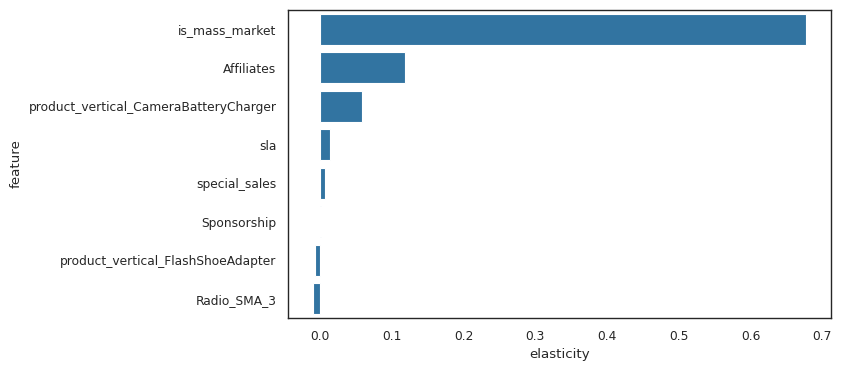

In [423]:
plt.figure(figsize = (7,4))
sns.barplot(x = 'elasticity',y ='feature',data = elasticity_data.sort_values('elasticity', ascending = False))

Model Evaluation


In [424]:
X_train_rfe.columns

Index(['const', 'sla', 'is_mass_market', 'special_sales', 'product_vertical_CameraBatteryCharger', 'product_vertical_FlashShoeAdapter', 'Sponsorship', 'Affiliates', 'Radio_SMA_3'], dtype='object')

In [425]:
drop_columns_list = list(set(num_vars) - set(list(X_train_rfe.columns)))
print(drop_columns_list)

['Affiliates_SMA_3', 'deliverybdays', 'Total Investment_EMA_8', 'NPS_SMA_5', 'Heat Deg Days', 'Digital', 'Total_Investment_Ad_Stock', 'Online marketing_EMA_8', 'Snow on Grnd (cm)', 'NPS_SMA_3', 'product_procurement_sla', 'Sponsorship_EMA_8', 'Content Marketing_SMA_5', 'Affiliates_EMA_8', 'Total Investment', 'holiday_week', 'TV_EMA_8', 'SEM_SMA_5', 'Stock Index_SMA_5', 'SEM_EMA_8', 'Discount%', 'Digital_SMA_5', 'Total Precip (mm)', 'SEM_SMA_3', 'order_payment_type_Prepaid', 'product_vertical_Filter', 'product_vertical_Lens', 'SEM_Ad_Stock', 'product_vertical_CameraBattery', 'product_vertical_CameraHousing', 'Online marketing', 'SEM', 'Other_SMA_5', 'Other_SMA_3', 'Sponsorship_Ad_Stock', 'Digital_SMA_3', 'Online marketing_SMA_5', 'Stock Index', 'Radio', 'Sponsorship_SMA_3', 'Max Temp', 'Radio_SMA_5', 'Other_Ad_Stock', 'TV_SMA_5', 'Total Investment_SMA_3', 'Online marketing_SMA_3', 'Digital_EMA_8', 'product_vertical_ExtensionTube', 'product_vertical_ReflectorUmbrella', 'product_vertical_C

In [426]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

In [427]:
folds = KFold(n_splits = 10, shuffle = True, random_state = 100)
lm=LinearRegression()
scores = cross_val_score(lm, X_train_rfe, y_train, scoring='r2', cv=folds)
scores

array([0.04684575, 0.91450679, 0.79528986, 0.95590226, 0.962298  ,
       0.71164932, 0.92627282, 0.7409423 , 0.67823046, 0.53902563])

In [428]:
y_pred = cross_val_predict(lm, X_train_rfe, y_train, cv=folds)

In [429]:
mse = mean_squared_error(y_train, y_pred)
r_squared = r2_score(y_train, y_pred)
print('Mean_Squared_Error :' ,mse)
print('r_square_value :',r_squared)

Mean_Squared_Error : 0.002779030920106705
r_square_value : 0.8947213594424965


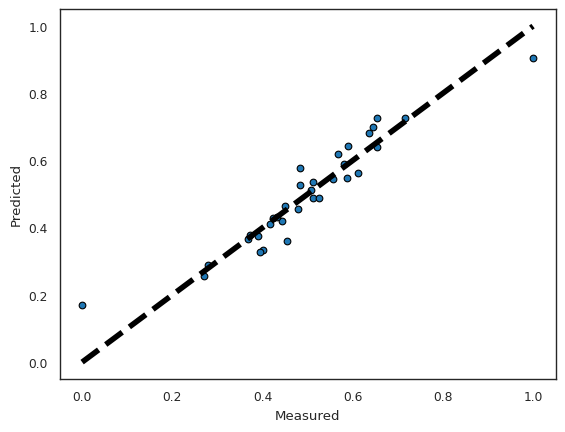

In [430]:
fig, ax = plt.subplots()
ax.scatter(y_train, y_pred, edgecolors=(0, 0, 0))
ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

## Building Linear Regression Model for Gaming Accessory

In [431]:
np.random.seed(0)
df_train, df_test = train_test_split(gaming_accessory_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [432]:
gaming_accessory_df.columns

Index(['gmv', 'Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'order_payment_type_Prepaid', 'is_mass_market', 'product_vertical_GameControlMount', 'product_vertical_GamePad', 'product_mrp', 'special_sales', 'product_vertical_GamingAccessoryKit', 'product_vertical_GamingAdapter', 'product_vertical_GamingChargingStation', 'product_vertical_GamingHeadset', 'product_vertical_GamingKeyboard', 'product_vertical_GamingMemoryCard', 'product_vertical_GamingMouse', 'product_vertical_GamingMousePad', 'product_vertical_GamingSpeaker', 'product_vertical_JoystickGamingWheel', 'product_vertical_MotionController', 'product_vertical_TVOutCableAccessory', 'payd_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship',
       'Spo

In [433]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()


In [434]:
num_vars = ['gmv', 'Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'order_payment_type_Prepaid', 'is_mass_market', 'product_vertical_GameControlMount',
'product_vertical_GamePad', 'product_mrp', 'special_sales', 'product_vertical_GamingAccessoryKit', 'product_vertical_GamingAdapter', 'product_vertical_GamingChargingStation',
'product_vertical_GamingHeadset', 'product_vertical_GamingKeyboard', 'product_vertical_GamingMemoryCard', 'product_vertical_GamingMouse', 'product_vertical_GamingMousePad', 'product_vertical_GamingSpeaker', 'product_vertical_JoystickGamingWheel', 'product_vertical_MotionController',
'product_vertical_TVOutCableAccessory', 'payd_week', 'holiday_week', 'Total Investment',
'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8',
'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital',
'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship','Sponsorship_SMA_3', 'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', 'Content Marketing_SMA_3', 'Content Marketing_SMA_5', 'Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock',
'Online marketing', 'Online marketing_SMA_3', 'Online marketing_SMA_5', 'Online marketing_EMA_8', 'Online_marketing_Ad_Stock', 'Affiliates', 'Affiliates_SMA_3', 'Affiliates_SMA_5',
'Affiliates_EMA_8', 'Affiliates_Ad_Stock', 'SEM', 'SEM_SMA_3', 'SEM_SMA_5', 'SEM_EMA_8',
'SEM_Ad_Stock', 'Radio', 'Radio_SMA_3', 'Radio_SMA_5', 'Radio_EMA_8', 'Radio_Ad_Stock', 'Other',
'Other_SMA_3', 'Other_SMA_5', 'Other_EMA_8', 'Other_Ad_Stock', 'NPS', 'NPS_SMA_3', 'NPS_SMA_5',
'Stock Index', 'Stock Index_SMA_3', 'Stock Index_SMA_5', 'Max Temp', 'Min Temp', 'Mean Temp',
'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)',
'Snow on Grnd (cm)']

In [435]:
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])

In [436]:
df_train.head()
df_test[num_vars] = scaler.fit_transform(df_test[num_vars])

In [437]:
df_train.describe()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,order_payment_type_Prepaid,is_mass_market,product_vertical_GameControlMount,product_vertical_GamePad,product_mrp,special_sales,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_JoystickGamingWheel,product_vertical_MotionController,product_vertical_TVOutCableAccessory,payd_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00
mean,0.42,0.39,0.26,0.26,0.49,0.19,0.22,0.38,0.03,0.53,0.60,0.05,0.53,0.50,0.14,0.47,0.22,0.17,0.17,0.25,0.15,0.27,0.38,0.50,0.51,0.17,0.40,0.39,0.41,0.45,0.40,0.37,0.36,0.43,0.52,0.42,0.19,0.20,0.21,0.22,0.18,0.37,0.35,0.35,0.39,0.35,0.21,0.20,0.22,0.27,0.22,0.62,0.61,0.63,0.63,0.63,0.64,0.63,0.63,0.62,0.63,0.21,0.24,0.26,0.24,0.21,0.11,0.13,0.16,0.18,0.14,0.11,0.12,0.16,0.18,0.14,0.32,0.80,0.75,0.68,0.92,0.86,0.60,0.63,0.65,0.25,0.26,0.20,0.06,0.21,0.04
std,0.21,0.23,0.41,0.41,0.18,0.18,0.20,0.20,0.17,0.22,0.19,0.18,0.22,0.23,0.27,0.32,0.18,0.21,0.17,0.18,0.24,0.31,0.26,0.21,0.51,0.38,0.29,0.25,0.26,0.25,0.25,0.28,0.25,0.29,0.31,0.27,0.30,0.25,0.26,0.25,0.26,0.32,0.29,0.28,0.25,0.27,0.30,0.27,0.26,0.25,0.26,0.33,0.32,0.34,0.33,0.32,0.32,0.32,0.33,0.32,0.31,0.30,0.24,0.25,0.25,0.25,0.25,0.23,0.27,0.26,0.23,0.26,0.24,0.27,0.26,0.24,0.28,0.15,0.24,0.34,0.17,0.27,0.30,0.24,0.28,0.28,0.35,0.25,0.23,0.25,0.17
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.29,0.18,0.00,0.00,0.42,0.08,0.11,0.24,0.00,0.44,0.54,0.00,0.41,0.40,0.00,0.17,0.11,0.04,0.10,0.14,0.00,0.08,0.18,0.41,0.00,0.00,0.22,0.25,0.29,0.37,0.29,0.12,0.14,0.17,0.33,0.20,0.04,0.07,0.08,0.07,0.04,0.10,0.11,0.15,0.23,0.15,0.01,0.03,0.05,0.10,0.05,0.48,0.46,0.56,0.52,0.48,0.53,0.48,0.54,0.51,0.48,0.07,0.13,0.15,0.09,0.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.78,0.77,0.38,0.92,0.90,0.38,0.44,0.49,0.01,0.00,0.02,0.00,0.03,0.00
50%,0.43,0.

Dividing into X and Y sets for the model building


In [438]:
y_train = df_train.pop('gmv')
X_train = df_train

####Building the first model with all the features


In [439]:
# Instantiate
lm = LinearRegression()

In [440]:
# Fit a line
lm.fit(X_train, y_train)

LinearRegression()

In [441]:
# Print the coefficients and intercept
print(lm.coef_)
print(lm.intercept_)

[ 0.00035469 -0.02557317 -0.02744373 -0.00970639  0.06195219  0.08341713
  0.1227447  -0.02578986  0.12166555  0.10269828  0.09533551  0.07284959
  0.05312523  0.03784064  0.1774399   0.07337342 -0.02620264  0.1153542
  0.03847692  0.03997294  0.04418438  0.00399174  0.06105395 -0.0012144
  0.02331298  0.00490905 -0.016197    0.00152503 -0.00799108 -0.00170985
  0.05495388 -0.03361649 -0.04457084 -0.01918038  0.00101413  0.00486134
 -0.02109234  0.0084037  -0.01146978  0.00471326  0.00062708 -0.0127479
 -0.0006208  -0.01841398 -0.00698614 -0.01864866  0.00216153  0.0422576
  0.01531619  0.0101827  -0.01894006  0.02566773  0.02860344  0.01458904
  0.01641848 -0.00298222  0.02830229  0.02035026  0.01486533  0.0216002
 -0.01291297 -0.01895479  0.00931462 -0.01273612 -0.00170279  0.00577138
 -0.03149619 -0.00909783  0.01550757 -0.01311335  0.04083818 -0.04536783
 -0.02762894  0.0122519  -0.01017064 -0.01091256  0.02001422 -0.00632562
  0.026888    0.02381524 -0.00207784 -0.03468363 -0.0028

Model Building Using RFE


In [442]:
# Import RFE
from sklearn.feature_selection import RFE

In [443]:
lm = LinearRegression()

lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=20)             # running RFE
rfe = rfe.fit(X_train, y_train)

In [444]:
# Print the boolean results
print(rfe.support_)
print(rfe.ranking_)

[False False  True False  True False  True  True False  True  True False
  True False False  True False  True False False  True False  True False
 False False  True False False False False  True  True False False False
 False False False False False False False False False False False  True
 False False False False  True False False False False  True False False
 False False False False False False False False False False False  True
 False False False False False False False False False False False False
 False  True False  True False False]
[71 21  1 40  1  2  1  1  6  1  1 13  1 17  5  1 15  1 22 11  1 58  1 67
 12 52  1 65 47 63 14  1  1 37 68 57 27 51 48 54 70 38 69 23 44 18 61  1
 34 43 10 26  1 30 29 59 25  1 16  3 46 32 49 42 62 55 24 45 33 39  9  1
 19 36 35  4 31 50 20  8 64  7 66 56 53  1 60  1 41 28]


In [445]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('Discount%', False, 71),
 ('deliverybdays', False, 21),
 ('deliverycdays', True, 1),
 ('sla', False, 40),
 ('product_procurement_sla', True, 1),
 ('order_payment_type_Prepaid', False, 2),
 ('is_mass_market', True, 1),
 ('product_vertical_GameControlMount', True, 1),
 ('product_vertical_GamePad', False, 6),
 ('product_mrp', True, 1),
 ('special_sales', True, 1),
 ('product_vertical_GamingAccessoryKit', False, 13),
 ('product_vertical_GamingAdapter', True, 1),
 ('product_vertical_GamingChargingStation', False, 17),
 ('product_vertical_GamingHeadset', False, 5),
 ('product_vertical_GamingKeyboard', True, 1),
 ('product_vertical_GamingMemoryCard', False, 15),
 ('product_vertical_GamingMouse', True, 1),
 ('product_vertical_GamingMousePad', False, 22),
 ('product_vertical_GamingSpeaker', False, 11),
 ('product_vertical_JoystickGamingWheel', True, 1),
 ('product_vertical_MotionController', False, 58),
 ('product_vertical_TVOutCableAccessory', True, 1),
 ('payd_week', False, 67),
 ('holiday_

In [446]:
col = X_train.columns[rfe.support_]
col

Index(['deliverycdays', 'product_procurement_sla', 'is_mass_market', 'product_vertical_GameControlMount', 'product_mrp', 'special_sales', 'product_vertical_GamingAdapter', 'product_vertical_GamingKeyboard', 'product_vertical_GamingMouse', 'product_vertical_JoystickGamingWheel', 'product_vertical_TVOutCableAccessory', 'Total Investment_SMA_3', 'TV_SMA_3', 'TV_SMA_5', 'Content Marketing_SMA_5', 'Online marketing_SMA_5', 'Affiliates_SMA_5', 'Other_SMA_3', 'Cool Deg Days', 'Total Snow (cm)'], dtype='object')

In [447]:
X_train.columns[~rfe.support_]


Index(['Discount%', 'deliverybdays', 'sla', 'order_payment_type_Prepaid', 'product_vertical_GamePad', 'product_vertical_GamingAccessoryKit', 'product_vertical_GamingChargingStation', 'product_vertical_GamingHeadset', 'product_vertical_GamingMemoryCard', 'product_vertical_GamingMousePad', 'product_vertical_GamingSpeaker', 'product_vertical_MotionController', 'payd_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_5', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock', 'TV', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship', 'Sponsorship_SMA_3', 'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', 'Content Marketing_SMA_3', 'Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock', 'Online marketing', 'Online marketing_SMA_3', 'Online marketing_EMA_8', 'Online_marketing_Ad_Stock', 'Affiliates', 'Affiliates_SMA_3', 'Affiliates_EMA_8', 'Affiliates_Ad_Stock', 'SEM',
   

In [448]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [449]:
# Adding a constant variable
import statsmodels.api as sm
X_train_rfe = sm.add_constant(X_train_rfe)

In [450]:
lm = sm.OLS(y_train,X_train_rfe).fit()   # Running the linear model

In [451]:
lm.params

,0
const,-0.15
deliverycdays,-0.05
product_procurement_sla,0.13
is_mass_market,0.74
product_vertical_GameControlMount,-0.04
product_mrp,0.18
special_sales,-0.20
product_vertical_GamingAdapter,0.06
product_vertical_GamingKeyboard,0.12
product_vertical_GamingMouse,0.18


In [452]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1757.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.81e-20
Time:                        17:17:38   Log-Likelihood:                 142.78
No. Observations:                  35   AIC:                            -243.6
Df Residuals:                      14   BIC:                            -210.9
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [453]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
17,Affiliates_SMA_5,3175.90
16,Online marketing_SMA_5,2857.64
0,const,190.38
14,TV_SMA_5,48.24
10,product_vertical_JoystickGamingWheel,47.69
15,Content Marketing_SMA_5,41.10
1,deliverycdays,33.75
9,product_vertical_GamingMouse,32.92
13,TV_SMA_3,28.76
12,Total Investment_SMA_3,23.75


In [454]:
X_train_rfe.drop('Other_SMA_3', axis = 1, inplace = True)

In [455]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                  -0.13
deliverycdays                          -0.00
product_procurement_sla                 0.11
is_mass_market                          0.78
product_vertical_GameControlMount      -0.02
product_mrp                             0.18
special_sales                          -0.23
product_vertical_GamingAdapter          0.09
product_vertical_GamingKeyboard         0.03
product_vertical_GamingMouse            0.28
product_vertical_JoystickGamingWheel   -0.02
product_vertical_TVOutCableAccessory    0.08
Total Investment_SMA_3                 -0.04
TV_SMA_3                                0.02
TV_SMA_5                               -0.06
Content Marketing_SMA_5                 0.03
Online marketing_SMA_5                  0.02
Affiliates_SMA_5                       -0.01
Cool Deg Days                           0.03
Total Snow (cm)                        -0.02
dtype: float64
                            OLS Regression Results                            
Dep. V

In [456]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
17,Affiliates_SMA_5,2403.70
16,Online marketing_SMA_5,2359.01
0,const,159.79
14,TV_SMA_5,43.67
15,Content Marketing_SMA_5,34.46
10,product_vertical_JoystickGamingWheel,28.50
13,TV_SMA_3,25.40
9,product_vertical_GamingMouse,22.71
12,Total Investment_SMA_3,20.72
3,is_mass_market,18.37


In [457]:
X_train_rfe.drop('Online marketing_SMA_5', axis = 1, inplace = True)

In [458]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                  -0.13
deliverycdays                          -0.00
product_procurement_sla                 0.11
is_mass_market                          0.78
product_vertical_GameControlMount      -0.02
product_mrp                             0.18
special_sales                          -0.23
product_vertical_GamingAdapter          0.09
product_vertical_GamingKeyboard         0.03
product_vertical_GamingMouse            0.28
product_vertical_JoystickGamingWheel   -0.02
product_vertical_TVOutCableAccessory    0.08
Total Investment_SMA_3                 -0.04
TV_SMA_3                                0.02
TV_SMA_5                               -0.06
Content Marketing_SMA_5                 0.04
Affiliates_SMA_5                        0.02
Cool Deg Days                           0.03
Total Snow (cm)                        -0.02
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared: 

In [459]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,141.09
14,TV_SMA_5,29.13
13,TV_SMA_3,25.39
9,product_vertical_GamingMouse,21.86
10,product_vertical_JoystickGamingWheel,19.63
12,Total Investment_SMA_3,17.27
3,is_mass_market,17.24
1,deliverycdays,16.14
16,Affiliates_SMA_5,13.27
6,special_sales,11.38


In [460]:
X_train_rfe.drop('TV_SMA_3', axis = 1, inplace = True)

In [461]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                  -0.13
deliverycdays                          -0.00
product_procurement_sla                 0.11
is_mass_market                          0.78
product_vertical_GameControlMount      -0.02
product_mrp                             0.18
special_sales                          -0.23
product_vertical_GamingAdapter          0.10
product_vertical_GamingKeyboard         0.03
product_vertical_GamingMouse            0.28
product_vertical_JoystickGamingWheel   -0.02
product_vertical_TVOutCableAccessory    0.08
Total Investment_SMA_3                 -0.03
TV_SMA_5                               -0.04
Content Marketing_SMA_5                 0.03
Affiliates_SMA_5                        0.02
Cool Deg Days                           0.04
Total Snow (cm)                        -0.02
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:           

In [462]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,133.27
9,product_vertical_GamingMouse,21.83
10,product_vertical_JoystickGamingWheel,19.49
3,is_mass_market,16.94
13,TV_SMA_5,16.14
1,deliverycdays,15.50
15,Affiliates_SMA_5,13.18
12,Total Investment_SMA_3,11.96
6,special_sales,11.26
14,Content Marketing_SMA_5,9.10


In [463]:
X_train_rfe.drop('product_vertical_GamingMouse', axis = 1, inplace = True)

In [464]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                  -0.09
deliverycdays                          -0.02
product_procurement_sla                 0.07
is_mass_market                          0.88
product_vertical_GameControlMount      -0.02
product_mrp                             0.12
special_sales                          -0.08
product_vertical_GamingAdapter          0.05
product_vertical_GamingKeyboard         0.07
product_vertical_JoystickGamingWheel    0.04
product_vertical_TVOutCableAccessory    0.07
Total Investment_SMA_3                 -0.04
TV_SMA_5                                0.02
Content Marketing_SMA_5                 0.05
Affiliates_SMA_5                        0.01
Cool Deg Days                           0.03
Total Snow (cm)                        -0.03
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:       

In [465]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,117.28
9,product_vertical_JoystickGamingWheel,16.49
1,deliverycdays,14.98
14,Affiliates_SMA_5,13.12
12,TV_SMA_5,13.12
3,is_mass_market,12.78
11,Total Investment_SMA_3,11.82
13,Content Marketing_SMA_5,8.90
15,Cool Deg Days,8.25
7,product_vertical_GamingAdapter,6.76


In [466]:
X_train_rfe.drop('deliverycdays', axis = 1, inplace = True)

In [467]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                  -0.09
product_procurement_sla                 0.07
is_mass_market                          0.89
product_vertical_GameControlMount      -0.02
product_mrp                             0.12
special_sales                          -0.08
product_vertical_GamingAdapter          0.05
product_vertical_GamingKeyboard         0.06
product_vertical_JoystickGamingWheel    0.01
product_vertical_TVOutCableAccessory    0.07
Total Investment_SMA_3                 -0.03
TV_SMA_5                                0.00
Content Marketing_SMA_5                 0.05
Affiliates_SMA_5                        0.01
Cool Deg Days                           0.03
Total Snow (cm)                        -0.03
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Leas

In [468]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,116.69
13,Affiliates_SMA_5,13.05
2,is_mass_market,11.83
10,Total Investment_SMA_3,10.73
11,TV_SMA_5,9.65
12,Content Marketing_SMA_5,8.90
14,Cool Deg Days,8.02
6,product_vertical_GamingAdapter,6.57
4,product_mrp,5.79
7,product_vertical_GamingKeyboard,5.11


In [469]:
X_train_rfe.drop('Cool Deg Days', axis = 1, inplace = True)

In [470]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                  -0.07
product_procurement_sla                 0.06
is_mass_market                          0.89
product_vertical_GameControlMount      -0.02
product_mrp                             0.13
special_sales                          -0.08
product_vertical_GamingAdapter          0.05
product_vertical_GamingKeyboard         0.07
product_vertical_JoystickGamingWheel    0.01
product_vertical_TVOutCableAccessory    0.07
Total Investment_SMA_3                 -0.04
TV_SMA_5                               -0.01
Content Marketing_SMA_5                 0.06
Affiliates_SMA_5                       -0.01
Total Snow (cm)                        -0.03
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     

In [471]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,80.17
2,is_mass_market,11.57
13,Affiliates_SMA_5,11.41
10,Total Investment_SMA_3,10.49
12,Content Marketing_SMA_5,8.27
11,TV_SMA_5,7.47
6,product_vertical_GamingAdapter,6.50
4,product_mrp,5.40
5,special_sales,4.88
7,product_vertical_GamingKeyboard,4.42


In [472]:
X_train_rfe.drop('is_mass_market', axis = 1, inplace = True)

In [473]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                  -0.21
product_procurement_sla                 0.20
product_vertical_GameControlMount       0.02
product_mrp                             0.37
special_sales                           0.26
product_vertical_GamingAdapter          0.30
product_vertical_GamingKeyboard         0.22
product_vertical_JoystickGamingWheel    0.02
product_vertical_TVOutCableAccessory    0.21
Total Investment_SMA_3                 -0.25
TV_SMA_5                               -0.26
Content Marketing_SMA_5                 0.19
Affiliates_SMA_5                        0.34
Total Snow (cm)                        -0.11
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.932
Model:                            OLS   Adj. R-squared:                  0.889
Method:                 Least Squares   F-statistic:                     22.03
Date:                Sun, 16 Mar 2025  

In [474]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,72.90
9,Total Investment_SMA_3,9.48
11,Content Marketing_SMA_5,7.82
12,Affiliates_SMA_5,6.81
10,TV_SMA_5,5.63
5,product_vertical_GamingAdapter,5.31
3,product_mrp,4.64
6,product_vertical_GamingKeyboard,4.18
1,product_procurement_sla,3.76
4,special_sales,3.55


In [475]:
X_train_rfe.drop('TV_SMA_5', axis = 1, inplace = True)

In [476]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                  -0.18
product_procurement_sla                 0.19
product_vertical_GameControlMount       0.05
product_mrp                             0.37
special_sales                           0.33
product_vertical_GamingAdapter          0.20
product_vertical_GamingKeyboard         0.16
product_vertical_JoystickGamingWheel    0.11
product_vertical_TVOutCableAccessory    0.27
Total Investment_SMA_3                 -0.38
Content Marketing_SMA_5                 0.27
Affiliates_SMA_5                        0.19
Total Snow (cm)                        -0.10
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.908
Model:                            OLS   Adj. R-squared:                  0.858
Method:                 Least Squares   F-statistic:                     18.15
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.09e-08
Time:

In [477]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,72.26
9,Total Investment_SMA_3,8.39
10,Content Marketing_SMA_5,7.38
5,product_vertical_GamingAdapter,4.81
3,product_mrp,4.64
11,Affiliates_SMA_5,4.56
6,product_vertical_GamingKeyboard,4.07
1,product_procurement_sla,3.76
4,special_sales,3.40
8,product_vertical_TVOutCableAccessory,2.24


In [478]:
X_train_rfe.drop('Total Investment_SMA_3', axis = 1, inplace = True)

In [479]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                  -0.13
product_procurement_sla                 0.13
product_vertical_GameControlMount       0.01
product_mrp                             0.25
special_sales                           0.27
product_vertical_GamingAdapter          0.15
product_vertical_GamingKeyboard         0.24
product_vertical_JoystickGamingWheel    0.14
product_vertical_TVOutCableAccessory    0.19
Content Marketing_SMA_5                 0.01
Affiliates_SMA_5                        0.16
Total Snow (cm)                         0.01
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.883
Model:                            OLS   Adj. R-squared:                  0.827
Method:                 Least Squares   F-statistic:                     15.76
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.41e-08
Time:                        17:17:38   Log-Likeli

In [480]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,69.75
5,product_vertical_GamingAdapter,4.71
10,Affiliates_SMA_5,4.42
3,product_mrp,4.16
6,product_vertical_GamingKeyboard,3.86
1,product_procurement_sla,3.65
4,special_sales,3.27
9,Content Marketing_SMA_5,2.94
8,product_vertical_TVOutCableAccessory,1.98
7,product_vertical_JoystickGamingWheel,1.90


In [481]:
X_train_rfe.drop('product_procurement_sla', axis = 1, inplace = True)

In [482]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                  -0.04
product_vertical_GameControlMount       0.01
product_mrp                             0.17
special_sales                           0.32
product_vertical_GamingAdapter          0.15
product_vertical_GamingKeyboard         0.21
product_vertical_JoystickGamingWheel    0.13
product_vertical_TVOutCableAccessory    0.17
Content Marketing_SMA_5                -0.03
Affiliates_SMA_5                        0.17
Total Snow (cm)                         0.01
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.880
Model:                            OLS   Adj. R-squared:                  0.829
Method:                 Least Squares   F-statistic:                     17.52
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.06e-08
Time:                        17:17:39   Log-Likelihood:                 42.817
No. Observations

In [483]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,16.05
4,product_vertical_GamingAdapter,4.68
9,Affiliates_SMA_5,4.27
5,product_vertical_GamingKeyboard,3.69
2,product_mrp,2.75
3,special_sales,2.70
8,Content Marketing_SMA_5,2.15
7,product_vertical_TVOutCableAccessory,1.93
6,product_vertical_JoystickGamingWheel,1.82
10,Total Snow (cm),1.11


In [484]:
X_train_rfe.drop('product_vertical_GamingAdapter', axis = 1, inplace = True)

In [485]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                  -0.05
product_vertical_GameControlMount      -0.00
product_mrp                             0.19
special_sales                           0.30
product_vertical_GamingKeyboard         0.28
product_vertical_JoystickGamingWheel    0.14
product_vertical_TVOutCableAccessory    0.22
Content Marketing_SMA_5                -0.04
Affiliates_SMA_5                        0.22
Total Snow (cm)                         0.01
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.874
Model:                            OLS   Adj. R-squared:                  0.829
Method:                 Least Squares   F-statistic:                     19.27
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.88e-09
Time:                        17:17:39   Log-Likelihood:                 42.030
No. Observations:                  35   AIC:                 

In [486]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,16.02
8,Affiliates_SMA_5,3.10
4,product_vertical_GamingKeyboard,3.02
2,product_mrp,2.72
3,special_sales,2.66
7,Content Marketing_SMA_5,2.14
5,product_vertical_JoystickGamingWheel,1.78
6,product_vertical_TVOutCableAccessory,1.60
9,Total Snow (cm),1.11
1,product_vertical_GameControlMount,1.06


In [487]:
X_train_rfe.drop('product_vertical_JoystickGamingWheel', axis = 1, inplace = True)

In [488]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                  -0.09
product_vertical_GameControlMount      -0.03
product_mrp                             0.31
special_sales                           0.25
product_vertical_GamingKeyboard         0.36
product_vertical_TVOutCableAccessory    0.21
Content Marketing_SMA_5                -0.05
Affiliates_SMA_5                        0.22
Total Snow (cm)                        -0.02
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.850
Model:                            OLS   Adj. R-squared:                  0.804
Method:                 Least Squares   F-statistic:                     18.40
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           7.00e-09
Time:                        17:17:39   Log-Likelihood:                 38.970
No. Observations:                  35   AIC:                            -59.94
Df Residuals:              

In [489]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,14.33
7,Affiliates_SMA_5,3.10
4,product_vertical_GamingKeyboard,2.86
3,special_sales,2.59
2,product_mrp,2.19
6,Content Marketing_SMA_5,2.14
5,product_vertical_TVOutCableAccessory,1.60
8,Total Snow (cm),1.07
1,product_vertical_GameControlMount,1.04


In [490]:
X_train_rfe.drop('product_vertical_TVOutCableAccessory', axis = 1, inplace = True)

In [491]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                               -0.05
product_vertical_GameControlMount   -0.04
product_mrp                          0.34
special_sales                        0.22
product_vertical_GamingKeyboard      0.48
Content Marketing_SMA_5             -0.03
Affiliates_SMA_5                     0.25
Total Snow (cm)                     -0.02
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.821
Model:                            OLS   Adj. R-squared:                  0.775
Method:                 Least Squares   F-statistic:                     17.69
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.42e-08
Time:                        17:17:39   Log-Likelihood:                 35.886
No. Observations:                  35   AIC:                            -55.77
Df Residuals:                      27   BIC:                            -43.33
Df Model:        

In [492]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,13.06
6,Affiliates_SMA_5,3.00
3,special_sales,2.57
4,product_vertical_GamingKeyboard,2.48
2,product_mrp,2.16
5,Content Marketing_SMA_5,2.13
7,Total Snow (cm),1.07
1,product_vertical_GameControlMount,1.04


In [493]:
X_train_rfe.drop('Total Snow (cm)', axis = 1, inplace = True)

In [494]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                               -0.05
product_vertical_GameControlMount   -0.04
product_mrp                          0.34
special_sales                        0.23
product_vertical_GamingKeyboard      0.48
Content Marketing_SMA_5             -0.03
Affiliates_SMA_5                     0.25
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.820
Model:                            OLS   Adj. R-squared:                  0.782
Method:                 Least Squares   F-statistic:                     21.32
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.01e-09
Time:                        17:17:39   Log-Likelihood:                 35.834
No. Observations:                  35   AIC:                            -57.67
Df Residuals:                      28   BIC:                            -46.78
Df Model:                           6                      

In [495]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,12.97
6,Affiliates_SMA_5,2.91
3,special_sales,2.57
4,product_vertical_GamingKeyboard,2.48
2,product_mrp,2.14
5,Content Marketing_SMA_5,2.13
1,product_vertical_GameControlMount,1.03


In [496]:
X_train_rfe.drop('product_mrp', axis = 1, inplace = True)

In [497]:
X_train_rfe= sm.add_constant(X_train_rfe)

# Fitting the model
lm = sm.OLS(y_train, X_train_rfe).fit()
print(lm.params)

print(lm.summary())

const                                0.06
product_vertical_GameControlMount   -0.05
special_sales                        0.17
product_vertical_GamingKeyboard      0.57
Content Marketing_SMA_5             -0.15
Affiliates_SMA_5                     0.41
dtype: float64
                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.773
Model:                            OLS   Adj. R-squared:                  0.734
Method:                 Least Squares   F-statistic:                     19.72
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.53e-08
Time:                        17:17:39   Log-Likelihood:                 31.712
No. Observations:                  35   AIC:                            -51.42
Df Residuals:                      29   BIC:                            -42.09
Df Model:                           5                                         
Covariance Type:      

In [498]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,6.59
2,special_sales,2.51
3,product_vertical_GamingKeyboard,2.35
4,Content Marketing_SMA_5,1.69
5,Affiliates_SMA_5,1.54
1,product_vertical_GameControlMount,1.03


Elasticity


In [499]:
coefficients_df = pd.DataFrame(pd.DataFrame(lm.params)[1:]).reset_index()
coefficients_df.columns = ['feature','coefficient']
elasticity_data = calculateElasticity(X_train_rfe, y_train, coefficients_df)

<Axes: xlabel='elasticity', ylabel='feature'>

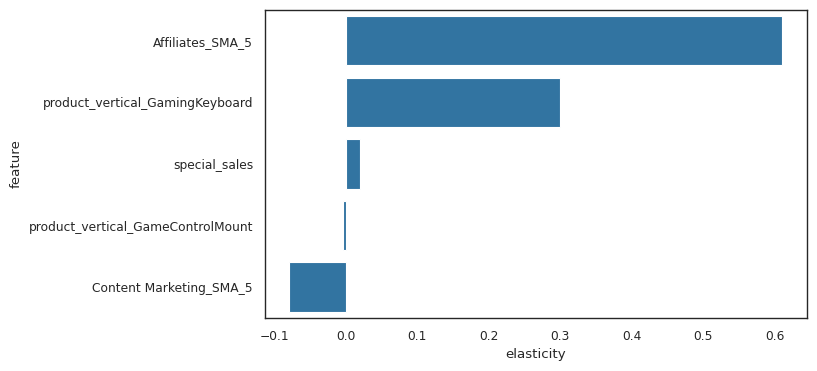

In [500]:
plt.figure(figsize = (7,4))
sns.barplot(x = 'elasticity',y ='feature',data = elasticity_data.sort_values('elasticity', ascending = False))

Model Evaluation


In [501]:
X_train_rfe.columns

Index(['const', 'product_vertical_GameControlMount', 'special_sales', 'product_vertical_GamingKeyboard', 'Content Marketing_SMA_5', 'Affiliates_SMA_5'], dtype='object')

In [502]:
drop_columns_list = list(set(num_vars) - set(list(X_train_rfe.columns)))
print(drop_columns_list)

['Affiliates_SMA_3', 'deliverybdays', 'Total Investment_EMA_8', 'NPS_SMA_5', 'Heat Deg Days', 'product_vertical_GamingChargingStation', 'product_vertical_GamingMouse', 'Digital', 'Total_Investment_Ad_Stock', 'Online marketing_EMA_8', 'Snow on Grnd (cm)', 'product_vertical_GamingAdapter', 'product_procurement_sla', 'Sponsorship_EMA_8', 'NPS_SMA_3', 'product_vertical_TVOutCableAccessory', 'Affiliates_EMA_8', 'Total Investment', 'holiday_week', 'TV_EMA_8', 'SEM_SMA_5', 'Stock Index_SMA_5', 'is_mass_market', 'SEM_EMA_8', 'Discount%', 'Digital_SMA_5', 'Total Precip (mm)', 'SEM_SMA_3', 'order_payment_type_Prepaid', 'payd_week', 'SEM_Ad_Stock', 'Online marketing', 'SEM', 'Other_SMA_5', 'Other_SMA_3', 'product_vertical_GamingAccessoryKit', 'Sponsorship', 'Sponsorship_Ad_Stock', 'Radio_SMA_3', 'Digital_SMA_3', 'Online marketing_SMA_5', 'Stock Index', 'Radio', 'Sponsorship_SMA_3', 'Max Temp', 'Radio_SMA_5', 'product_vertical_GamingSpeaker', 'TV_SMA_5', 'Total Investment_SMA_3', 'Other_Ad_Stock',

In [503]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

In [504]:
folds = KFold(n_splits = 10, shuffle = True, random_state = 100)
lm=LinearRegression()
scores = cross_val_score(lm, X_train_rfe, y_train, scoring='r2', cv=folds)
scores

array([-0.47410268,  0.91049223, -0.05657147,  0.89146558,  0.84667432,
       -1.83805677, -0.04457123,  0.38817304,  0.08157555,  0.51050019])

In [505]:
y_pred = cross_val_predict(lm, X_train_rfe, y_train, cv=folds)

In [506]:
mse = mean_squared_error(y_train, y_pred)
r_squared = r2_score(y_train, y_pred)
print('Mean_Squared_Error :' ,mse)
print('r_square_value :',r_squared)

Mean_Squared_Error : 0.016700796608379944
r_square_value : 0.6031021744599101


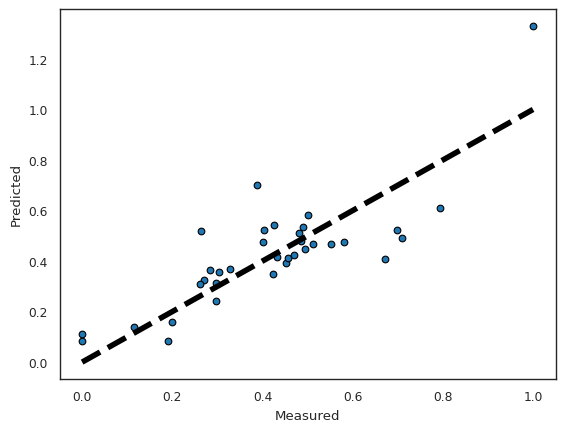

In [507]:
fig, ax = plt.subplots()
ax.scatter(y_train, y_pred, edgecolors=(0, 0, 0))
ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

#Multiplicative Model


In [508]:
# Making copy of dataframes from the original ones
cam_mul_df = Camera_accessory_org_df.copy()
gam_mul_df = gaming_accessory_org_df.copy()
home_mul_df = Homeaudio_org_df.copy()
home_mul_df.head()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,order_payment_type_Prepaid,is_mass_market,special_sales,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_mrp,product_vertical_SoundMixer,product_vertical_VoiceRecorder,pay_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
26,1185712.00,30.67,0.00,0.00,7.00,1.95,213,793,0,24,1,334,8,541,1958.61,0,2,0,0,4.26,0.00,0.00,4.26,4.26,0.05,0.00,0.00,0.05,0.05,0.63,0.00,0.00,0.63,0.63,1.85,0.00,0.00,1.85,1.85,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.33,0.14,0.00,0.00,0.14,0.14,1.26,0.00,0.00,1.26,1.26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,28.00,12.50,20.10,0.28,2.38,4.42,0.00,4.42,0.00
27,1471962.00,30.37,0.00,0.00,6.71,1.78,243,936,297,36,0,374,19,657,2016.77,0,7,1,0,4.26,0.00,0.00,4.26,6.82,0.05,0.00,0.00,0.05,0.09,0.63,0.00,0.00,0.63,1.01,1.85,0.00,0.00,1.85,2.97,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.53,0.14,0.00,0.00,0.14,0.22,1.26,0.00,0.00,1.26,2.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,33.00,11.00,23.18,0.00,5.18,1.40,0.00,1.40,0.00
28,1275392.00,28.88,0.00,0.00,6.82,1.80,191,909,0,40,0,394,16,544,1896.30,0,1,0,0,4.26,4.26,0.00,4.26,8.36,0.05,0.05,0.00,0.05,0.11,0.63,0.63,0.00,0.63,1.24,1.85,1.85,0.00,1.85,3.63,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.65,0.14,0.14,0.00,0.14,0.27,1.26,1.26,0.00,1.26,2.46,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,31.50,14.50,23.06,0.00,5.06,1.08,0.00,1.08,0.00
29,920394.00,28.04,0.00,0.00,6.83,1.76,145,650,0,39,0,281,6,388,1919.25,0,0,1,0,4.26,4.26,0.00,4.26,9.28,0.05,0.05,0.00,0.05,0.12,0.63,0.63,0.00,0.63,1.38,1.85,1.85,0.00,1.85,4.03,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.72,0.14,0.14,0.00,0.14,0.30,1.26,1.26,0.00,1.26,2.73,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,33.50,16.00,24.57,0.00,6.57,4.63,0.00,4.63,0.00
30,2599.00,16.13,0.00,0.00,9.00,2.00,1,0,0,0,0,0,0,1,3099.00,0,0,0,0,1.01,3.18,3.61,3.54,6.58,0.00,0.04,0.04,0.04,0.07,0.26,0.51,0.56,0.55,1.08,0.21,1.31,1.53,1.49,2.63,0.00,0.00,0.00,0.00,0.00,0.03,0.23,0.27,0.26,0.46,0.01,0.10,0.11,0.11,0.19,0.50,1.01,1.11,1.09,2.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,59.99,56.40,55.68,1206.00,1186.67,1182.80,28.50,15.00,21.65,0.00,3.65,0.35,0.00,0.35,0.00


In [509]:
# Checking for percentage of null values

total = pd.DataFrame(home_mul_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(home_mul_df.isnull().sum()/home_mul_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
gmv,0,0.00
Affiliates_Ad_Stock,0,0.00
Radio_SMA_5,0,0.00
Radio_SMA_3,0,0.00
Radio,0,0.00


Take the Logarithm of both the Dependent and the independent variables

After taking log, all 0 values will be transformed to inf. Retransforming these values to 0.



In [510]:
cam_mul_df = cam_mul_df.applymap(lambda x: np.log(x))
cam_mul_df = cam_mul_df.replace([np.inf, -np.inf], 0)
cam_mul_df = cam_mul_df.replace(np.nan, 0)

gam_mul_df = gam_mul_df.applymap(lambda x: np.log(x))
gam_mul_df = gam_mul_df.replace([np.inf, -np.inf], 0)
gam_mul_df = gam_mul_df.replace(np.nan, 0)

home_mul_df = home_mul_df.applymap(lambda x: np.log(x))
home_mul_df = home_mul_df.replace([np.inf, -np.inf], 0)
home_mul_df = home_mul_df.replace(np.nan, 0)

home_mul_df.head()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,order_payment_type_Prepaid,is_mass_market,special_sales,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_mrp,product_vertical_SoundMixer,product_vertical_VoiceRecorder,pay_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
26,13.99,3.42,0.00,0.00,1.95,0.67,5.36,6.68,0.00,3.18,0.00,5.81,2.08,6.29,7.58,0.00,0.69,0.00,0.00,1.45,0.00,0.00,1.45,1.45,-2.92,0.00,0.00,-2.92,-2.92,-0.46,0.00,0.00,-0.46,-0.46,0.62,0.00,0.00,0.62,0.62,0.00,0.00,0.00,0.00,0.00,-1.10,0.00,0.00,-1.10,-1.10,-1.99,0.00,0.00,-1.99,-1.99,0.23,0.00,0.00,0.23,0.23,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.00,0.00,0.00,7.07,0.00,0.00,3.33,2.53,3.00,-1.26,0.87,1.49,0.00,1.49,0.00
27,14.20,3.41,0.00,0.00,1.90,0.58,5.49,6.84,5.69,3.58,0.00,5.92,2.94,6.49,7.61,0.00,1.95,0.00,0.00,1.45,0.00,0.00,1.45,1.92,-2.92,0.00,0.00,-2.92,-2.45,-0.46,0.00,0.00,-0.46,0.01,0.62,0.00,0.00,0.62,1.09,0.00,0.00,0.00,0.00,0.00,-1.10,0.00,0.00,-1.10,-0.63,-1.99,0.00,0.00,-1.99,-1.52,0.23,0.00,0.00,0.23,0.70,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.00,0.00,0.00,7.07,0.00,0.00,3.50,2.40,3.14,0.00,1.65,0.34,0.00,0.34,0.00
28,14.06,3.36,0.00,0.00,1.92,0.59,5.25,6.81,0.00,3.69,0.00,5.98,2.77,6.30,7.55,0.00,0.00,0.00,0.00,1.45,1.45,0.00,1.45,2.12,-2.92,-2.92,0.00,-2.92,-2.25,-0.46,-0.46,0.00,-0.46,0.22,0.62,0.62,0.00,0.62,1.29,0.00,0.00,0.00,0.00,0.00,-1.10,-1.10,0.00,-1.10,-0.43,-1.99,-1.99,0.00,-1.99,-1.31,0.23,0.23,0.00,0.23,0.90,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.00,4.00,0.00,7.07,7.07,0.00,3.45,2.67,3.14,0.00,1.62,0.08,0.00,0.08,0.00
29,13.73,3.33,0.00,0.00,1.92,0.57,4.98,6.48,0.00,3.66,0.00,5.64,1.79,5.96,7.56,0.00,0.00,0.00,0.00,1.45,1.45,0.00,1.45,2.23,-2.92,-2.92,0.00,-2.92,-2.14,-0.46,-0.46,0.00,-0.46,0.32,0.62,0.62,0.00,0.62,1.39,0.00,0.00,0.00,0.00,0.00,-1.10,-1.10,0.00,-1.10,-0.33,-1.99,-1.99,0.00,-1.99,-1.21,0.23,0.23,0.00,0.23,1.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.00,4.00,0.00,7.07,7.07,0.00,3.51,2.77,3.20,0.00,1.88,1.53,0.00,1.53,0.00
30,7.86,2.78,0.00,0.00,2.20,0.69,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.04,0.00,0.00,0.00,0.00,0.01,1.16,1.28,1.26,1.88,-6.91,-3.32,-3.14,-3.16,-2.64,-1.36,-0.68,-0.58,-0.60,0.08,-1.55,0.27,0.42,0.40,0.97,0.00,0.00,0.00,0.00,0.00,-3.65,-1.47,-1.31,-1.33,-0.78,-4.20,-2.34,-2.18,-2.21,-1.64,-0.69,0.00,0.10,0.08,0.76,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.09,4.03,4.02,7.10,7.08,7.08,3.35,2.71,3.08,0.00,1.29,-1.05,0.00,-1.05,0.00


##Camera Accessory - Multiplicative model


Splitting the Dataframe into Training and Testing Sets


In [511]:
from sklearn.model_selection import train_test_split
np.random.seed(0)
df_train, df_test = train_test_split(cam_mul_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [512]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

In [513]:
cam_mul_df.columns


Index(['gmv', 'Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'product_mrp', 'order_payment_type_Prepaid', 'is_mass_market', 'product_vertical_CameraAccessory', 'special_sales', 'product_vertical_CameraBag', 'product_vertical_CameraBattery', 'product_vertical_CameraBatteryCharger', 'product_vertical_CameraBatteryGrip', 'product_vertical_CameraEyeCup', 'product_vertical_CameraFilmRolls', 'product_vertical_CameraHousing', 'product_vertical_CameraMicrophone', 'product_vertical_CameraMount', 'product_vertical_CameraRemoteControl', 'product_vertical_CameraTripod', 'product_vertical_ExtensionTube', 'product_vertical_Filter', 'product_vertical_Flash', 'product_vertical_FlashShoeAdapter', 'product_vertical_Lens', 'product_vertical_ReflectorUmbrella', 'product_vertical_Softbox', 'product_vertical_Strap', 'product_vertical_Telescope', 'pay_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8',
    

In [514]:
num_vars=['gmv', 'Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'product_mrp', 'order_payment_type_Prepaid', 'is_mass_market', 'product_vertical_CameraAccessory', 'special_sales', 'product_vertical_CameraBag', 'product_vertical_CameraBattery', 'product_vertical_CameraBatteryCharger', 'product_vertical_CameraBatteryGrip', 'product_vertical_CameraEyeCup', 'product_vertical_CameraFilmRolls', 'product_vertical_CameraHousing', 'product_vertical_CameraMicrophone', 'product_vertical_CameraMount', 'product_vertical_CameraRemoteControl', 'product_vertical_CameraTripod', 'product_vertical_ExtensionTube', 'product_vertical_Filter', 'product_vertical_Flash', 'product_vertical_FlashShoeAdapter', 'product_vertical_Lens', 'product_vertical_ReflectorUmbrella', 'product_vertical_Softbox', 'product_vertical_Strap', 'product_vertical_Telescope', 'pay_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8',
       'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship', 'Sponsorship_SMA_3', 'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', 'Content Marketing_SMA_3', 'Content Marketing_SMA_5', 'Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock', 'Online marketing', 'Online marketing_SMA_3', 'Online marketing_SMA_5', 'Online marketing_EMA_8', 'Online_marketing_Ad_Stock', 'Affiliates', 'Affiliates_SMA_3', 'Affiliates_SMA_5', 'Affiliates_EMA_8', 'Affiliates_Ad_Stock', 'SEM', 'SEM_SMA_3', 'SEM_SMA_5', 'SEM_EMA_8', 'SEM_Ad_Stock', 'Radio', 'Radio_SMA_3', 'Radio_SMA_5', 'Radio_EMA_8', 'Radio_Ad_Stock', 'Other', 'Other_SMA_3', 'Other_SMA_5', 'Other_EMA_8', 'Other_Ad_Stock', 'NPS', 'NPS_SMA_3', 'NPS_SMA_5', 'Stock Index', 'Stock Index_SMA_3', 'Stock Index_SMA_5', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days', 'Cool Deg Days',
       'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)']
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_test[num_vars] = scaler.fit_transform(df_test[num_vars])

In [515]:
# assigning x_traim amd y_train values
y_train = df_train.pop('gmv')
X_train = df_train

In [516]:
# Running RFE for selecting top 20 features
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=20)             # running RFE
rfe = rfe.fit(X_train, y_train)

In [517]:
# selecting the top 20 features given by rfe
col = X_train.columns[rfe.support_]
col

Index(['Discount%', 'order_payment_type_Prepaid', 'is_mass_market', 'product_vertical_CameraAccessory', 'product_vertical_CameraBattery', 'product_vertical_CameraBatteryCharger', 'product_vertical_CameraEyeCup', 'product_vertical_CameraMicrophone', 'product_vertical_Filter', 'product_vertical_Flash', 'product_vertical_Strap', 'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Content Marketing', 'Online marketing_SMA_5', 'Affiliates_SMA_5', 'NPS', 'Max Temp', 'Mean Temp', 'Heat Deg Days'], dtype='object')

In [518]:
# neglecting the features other than top 20 features given by rfe
X_train.columns[~rfe.support_]

Index(['deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'product_mrp', 'special_sales', 'product_vertical_CameraBag', 'product_vertical_CameraBatteryGrip', 'product_vertical_CameraFilmRolls', 'product_vertical_CameraHousing', 'product_vertical_CameraMount', 'product_vertical_CameraRemoteControl', 'product_vertical_CameraTripod', 'product_vertical_ExtensionTube', 'product_vertical_FlashShoeAdapter', 'product_vertical_Lens', 'product_vertical_ReflectorUmbrella', 'product_vertical_Softbox', 'product_vertical_Telescope', 'pay_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship', 'Sponsorship_SMA_3', 'Sponsorship_Ad_Stock', 'Content Marketing_SMA_3', 'Content Marketing_SMA_5', 'Content Marketing_EMA_8',
       'Content_Marketi

In [519]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [520]:
# Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     6534.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.00e-21
Time:                        17:17:41   Log-Likelihood:                 167.17
No. Observations:                  33   AIC:                            -292.3
Df Residuals:                      12   BIC:                            -260.9
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,3358.42
3,is_mass_market,2319.62
1,Discount%,273.63
15,Online marketing_SMA_5,270.19
5,product_vertical_CameraBattery,245.73
9,product_vertical_Filter,192.27
6,product_vertical_CameraBatteryCharger,135.44
13,Sponsorship_EMA_8,123.93
16,Affiliates_SMA_5,110.61
10,product_vertical_Flash,89.34


In [521]:
# Let's drop featuree with highest p-value
X_train_rfe = X_train_rfe.drop(["is_mass_market"], axis = 1)

In [522]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)

lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())


                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     4405.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.02e-21
Time:                        17:17:41   Log-Likelihood:                 158.50
No. Observations:                  33   AIC:                            -277.0
Df Residuals:                      13   BIC:                            -247.1
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

In [523]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,1997.87
5,product_vertical_CameraBatteryCharger,124.82
4,product_vertical_CameraBattery,108.74
12,Sponsorship_EMA_8,99.44
14,Online marketing_SMA_5,90.65
11,Sponsorship_SMA_5,60.01
16,NPS,55.39
15,Affiliates_SMA_5,45.01
10,product_vertical_Strap,39.62
8,product_vertical_Filter,38.92


In [524]:
# Let's drop feature  with highest p-value
X_train_rfe = X_train_rfe.drop(["Online marketing_SMA_5"], axis = 1)

In [525]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)

lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())


                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     369.0
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.16e-15
Time:                        17:17:41   Log-Likelihood:                 115.50
No. Observations:                  33   AIC:                            -193.0
Df Residuals:                      14   BIC:                            -164.6
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

In [526]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,1336.59
5,product_vertical_CameraBatteryCharger,116.41
4,product_vertical_CameraBattery,108.11
12,Sponsorship_EMA_8,97.92
11,Sponsorship_SMA_5,59.04
15,NPS,39.61
8,product_vertical_Filter,38.71
10,product_vertical_Strap,36.26
2,order_payment_type_Prepaid,26.13
3,product_vertical_CameraAccessory,19.38


In [527]:
# Let's remove feature with highest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_CameraBatteryCharger"], axis = 1)

In [528]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     389.0
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           9.46e-17
Time:                        17:17:41   Log-Likelihood:                 114.29
No. Observations:                  33   AIC:                            -192.6
Df Residuals:                      15   BIC:                            -165.7
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [529]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,1332.35
11,Sponsorship_EMA_8,70.41
4,product_vertical_CameraBattery,62.01
10,Sponsorship_SMA_5,49.36
7,product_vertical_Filter,38.47
14,NPS,33.94
9,product_vertical_Strap,31.48
2,order_payment_type_Prepaid,25.99
3,product_vertical_CameraAccessory,17.85
8,product_vertical_Flash,17.03


In [530]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_CameraBattery"], axis = 1)

In [531]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     238.0
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           5.89e-16
Time:                        17:17:41   Log-Likelihood:                 104.15
No. Observations:                  33   AIC:                            -174.3
Df Residuals:                      16   BIC:                            -148.9
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [532]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,1204.48
10,Sponsorship_EMA_8,65.59
9,Sponsorship_SMA_5,35.43
13,NPS,31.03
6,product_vertical_Filter,29.42
8,product_vertical_Strap,25.33
2,order_payment_type_Prepaid,23.25
3,product_vertical_CameraAccessory,17.83
7,product_vertical_Flash,16.94
1,Discount%,15.18


In [533]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_Flash"], axis = 1)

In [534]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     268.4
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.62e-17
Time:                        17:17:41   Log-Likelihood:                 104.07
No. Observations:                  33   AIC:                            -176.1
Df Residuals:                      17   BIC:                            -152.2
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [535]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,775.26
9,Sponsorship_EMA_8,59.53
8,Sponsorship_SMA_5,34.95
6,product_vertical_Filter,28.77
2,order_payment_type_Prepaid,21.62
7,product_vertical_Strap,21.32
12,NPS,20.30
3,product_vertical_CameraAccessory,16.48
1,Discount%,15.05
15,Heat Deg Days,12.01


In [536]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Sponsorship_EMA_8"], axis = 1)

In [537]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     285.9
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.53e-18
Time:                        17:17:41   Log-Likelihood:                 103.03
No. Observations:                  33   AIC:                            -176.1
Df Residuals:                      18   BIC:                            -153.6
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [538]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,712.35
6,product_vertical_Filter,28.70
7,product_vertical_Strap,21.26
2,order_payment_type_Prepaid,21.01
3,product_vertical_CameraAccessory,16.43
1,Discount%,13.84
11,NPS,13.78
14,Heat Deg Days,11.91
10,Affiliates_SMA_5,10.88
8,Sponsorship_SMA_5,9.30


In [539]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_CameraAccessory"], axis = 1)

In [540]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())


                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     307.0
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.25e-19
Time:                        17:17:42   Log-Likelihood:                 102.10
No. Observations:                  33   AIC:                            -176.2
Df Residuals:                      19   BIC:                            -155.3
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [541]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,569.63
2,order_payment_type_Prepaid,19.87
5,product_vertical_Filter,18.70
6,product_vertical_Strap,18.68
10,NPS,13.61
1,Discount%,12.78
9,Affiliates_SMA_5,10.36
7,Sponsorship_SMA_5,8.83
13,Heat Deg Days,8.20
11,Max Temp,4.57


In [542]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Max Temp"], axis = 1)

In [543]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     338.5
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.34e-20
Time:                        17:17:42   Log-Likelihood:                 101.55
No. Observations:                  33   AIC:                            -177.1
Df Residuals:                      20   BIC:                            -157.6
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [544]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,560.43
2,order_payment_type_Prepaid,19.85
5,product_vertical_Filter,18.68
6,product_vertical_Strap,18.66
1,Discount%,12.77
10,NPS,12.76
9,Affiliates_SMA_5,10.26
7,Sponsorship_SMA_5,7.90
12,Heat Deg Days,6.23
11,Mean Temp,3.61


In [545]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Content Marketing"], axis = 1)

In [546]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     373.8
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.68e-21
Time:                        17:17:42   Log-Likelihood:                 100.95
No. Observations:                  33   AIC:                            -177.9
Df Residuals:                      21   BIC:                            -159.9
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [547]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,310.25
2,order_payment_type_Prepaid,19.79
5,product_vertical_Filter,18.31
6,product_vertical_Strap,18.20
1,Discount%,12.30
8,Affiliates_SMA_5,9.23
9,NPS,9.11
11,Heat Deg Days,5.43
7,Sponsorship_SMA_5,4.96
10,Mean Temp,3.59


In [548]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["NPS"], axis = 1)

In [549]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     332.7
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.31e-21
Time:                        17:17:42   Log-Likelihood:                 96.711
No. Observations:                  33   AIC:                            -171.4
Df Residuals:                      22   BIC:                            -155.0
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [550]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,104.33
6,product_vertical_Strap,18.05
2,order_payment_type_Prepaid,15.96
5,product_vertical_Filter,11.96
1,Discount%,11.91
8,Affiliates_SMA_5,9.22
10,Heat Deg Days,5.18
9,Mean Temp,3.58
4,product_vertical_CameraMicrophone,3.03
3,product_vertical_CameraEyeCup,2.76


In [551]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["order_payment_type_Prepaid"], axis = 1)

In [552]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     375.0
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           9.05e-23
Time:                        17:17:42   Log-Likelihood:                 96.215
No. Observations:                  33   AIC:                            -172.4
Df Residuals:                      23   BIC:                            -157.5
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [553]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,104.24
5,product_vertical_Strap,17.61
4,product_vertical_Filter,10.32
1,Discount%,10.05
7,Affiliates_SMA_5,9.03
9,Heat Deg Days,5.16
8,Mean Temp,3.58
2,product_vertical_CameraEyeCup,2.76
6,Sponsorship_SMA_5,1.65
3,product_vertical_CameraMicrophone,1.48


In [554]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Sponsorship_SMA_5"], axis = 1)

In [555]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     439.9
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.16e-24
Time:                        17:17:42   Log-Likelihood:                 96.206
No. Observations:                  33   AIC:                            -174.4
Df Residuals:                      24   BIC:                            -160.9
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [556]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,99.68
5,product_vertical_Strap,12.93
4,product_vertical_Filter,9.71
1,Discount%,9.64
6,Affiliates_SMA_5,7.90
8,Heat Deg Days,5.02
7,Mean Temp,3.25
2,product_vertical_CameraEyeCup,2.52
3,product_vertical_CameraMicrophone,1.44


In [557]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_CameraEyeCup"], axis = 1)

In [558]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     417.9
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.85e-24
Time:                        17:17:42   Log-Likelihood:                 92.508
No. Observations:                  33   AIC:                            -169.0
Df Residuals:                      25   BIC:                            -157.0
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [559]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,96.94
4,product_vertical_Strap,10.04
1,Discount%,8.73
5,Affiliates_SMA_5,7.79
3,product_vertical_Filter,6.72
7,Heat Deg Days,4.65
6,Mean Temp,3.04
2,product_vertical_CameraMicrophone,1.43


In [560]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Mean Temp"], axis = 1)

In [561]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     405.8
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.10e-24
Time:                        17:17:42   Log-Likelihood:                 88.871
No. Observations:                  33   AIC:                            -163.7
Df Residuals:                      26   BIC:                            -153.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [562]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,31.54
4,product_vertical_Strap,9.76
1,Discount%,8.37
5,Affiliates_SMA_5,7.79
3,product_vertical_Filter,6.67
6,Heat Deg Days,2.41
2,product_vertical_CameraMicrophone,1.41


In [563]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Heat Deg Days"], axis = 1)

In [564]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     500.7
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.01e-25
Time:                        17:17:42   Log-Likelihood:                 88.709
No. Observations:                  33   AIC:                            -165.4
Df Residuals:                      27   BIC:                            -156.4
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [565]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,31.09
4,product_vertical_Strap,9.65
1,Discount%,7.80
3,product_vertical_Filter,6.55
5,Affiliates_SMA_5,3.95
2,product_vertical_CameraMicrophone,1.19


In [566]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_Strap"], axis = 1)

In [567]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     609.8
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           8.73e-27
Time:                        17:17:42   Log-Likelihood:                 87.689
No. Observations:                  33   AIC:                            -165.4
Df Residuals:                      28   BIC:                            -157.9
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [568]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,31.09
3,product_vertical_Filter,6.03
1,Discount%,4.65
4,Affiliates_SMA_5,3.70
2,product_vertical_CameraMicrophone,1.05


In [569]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_CameraMicrophone"], axis = 1)

In [570]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     725.2
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.33e-27
Time:                        17:17:43   Log-Likelihood:                 85.254
No. Observations:                  33   AIC:                            -162.5
Df Residuals:                      29   BIC:                            -156.5
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

In [571]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,31.03
2,product_vertical_Filter,5.90
1,Discount%,4.50
3,Affiliates_SMA_5,3.68


In [572]:
X_train_rfe.columns

Index(['Discount%', 'product_vertical_Filter', 'Affiliates_SMA_5'], dtype='object')

In [574]:
drop_columns_list = list(set(num_vars) - set(list(X_train_rfe.columns)))
print(drop_columns_list)

['Affiliates_SMA_3', 'deliverybdays', 'Total Investment_EMA_8', 'NPS_SMA_5', 'Heat Deg Days', 'Digital', 'Total_Investment_Ad_Stock', 'Online marketing_EMA_8', 'product_vertical_FlashShoeAdapter', 'Snow on Grnd (cm)', 'NPS_SMA_3', 'product_procurement_sla', 'Sponsorship_EMA_8', 'Content Marketing_SMA_5', 'Affiliates_EMA_8', 'Total Investment', 'holiday_week', 'TV_EMA_8', 'SEM_SMA_5', 'Stock Index_SMA_5', 'is_mass_market', 'SEM_EMA_8', 'Digital_SMA_5', 'Total Precip (mm)', 'SEM_SMA_3', 'order_payment_type_Prepaid', 'product_vertical_Lens', 'SEM_Ad_Stock', 'product_vertical_CameraBattery', 'product_vertical_CameraHousing', 'Online marketing', 'SEM', 'Other_SMA_5', 'Other_SMA_3', 'Sponsorship', 'special_sales', 'Sponsorship_Ad_Stock', 'Radio_SMA_3', 'Digital_SMA_3', 'Online marketing_SMA_5', 'Stock Index', 'Radio', 'Sponsorship_SMA_3', 'Max Temp', 'Radio_SMA_5', 'Other_Ad_Stock', 'TV_SMA_5', 'Total Investment_SMA_3', 'Online marketing_SMA_3', 'Digital_EMA_8', 'product_vertical_CameraBatte

In [575]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

folds = KFold(n_splits = 10, shuffle = True, random_state = 100)
lm=LinearRegression()
scores = cross_val_score(lm, X_train_rfe, y_train, scoring='r2', cv=folds)
scores

array([-1.06521323,  0.77995856,  0.57978503,  0.6813078 , -0.1610239 ,
        0.13854694,  0.57313246,  0.80415688, -0.85074997, -0.0741066 ])

In [576]:
y_pred = cross_val_predict(lm, X_train_rfe, y_train, cv=folds)

In [577]:
mse = mean_squared_error(y_train, y_pred)
r_squared = r2_score(y_train, y_pred)
print('Mean_Squared_Error :' ,mse)
print('r_square_value :',r_squared)

Mean_Squared_Error : 0.0033692305093476742
r_square_value : 0.8672534401540695


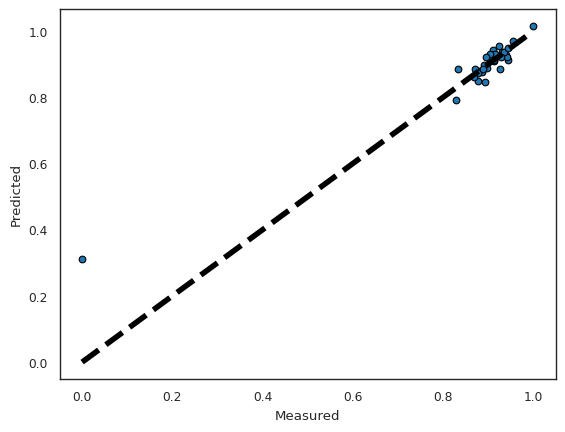

In [578]:
fig, ax = plt.subplots()
ax.scatter(y_train, y_pred, edgecolors=(0, 0, 0))
ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

Elasticity Analysis


In [579]:
coefficients_df = pd.DataFrame(pd.DataFrame(lr.params)[1:]).reset_index()
coefficients_df.columns = ['feature','coefficient']
elasticity_data = calculateElasticity(X_train_rfe, y_train, coefficients_df)

<Axes: xlabel='elasticity', ylabel='feature'>

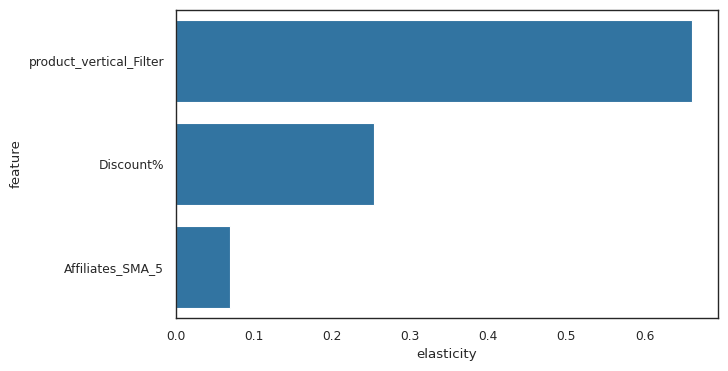

In [580]:
plt.figure(figsize = (7,4))
sns.barplot(x = 'elasticity',y ='feature',data = elasticity_data.sort_values('elasticity', ascending = False))

## Gaming Accessory - Multiplicative model

Splitting the Dataframe into Training and Testing Sets


In [581]:
from sklearn.model_selection import train_test_split
np.random.seed(0)
df_train, df_test = train_test_split(gam_mul_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [582]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [583]:
gam_mul_df.columns

Index(['gmv', 'Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'order_payment_type_Prepaid', 'is_mass_market', 'product_vertical_GameControlMount', 'product_vertical_GamePad', 'product_mrp', 'special_sales', 'product_vertical_GamingAccessoryKit', 'product_vertical_GamingAdapter', 'product_vertical_GamingChargingStation', 'product_vertical_GamingHeadset', 'product_vertical_GamingKeyboard', 'product_vertical_GamingMemoryCard', 'product_vertical_GamingMouse', 'product_vertical_GamingMousePad', 'product_vertical_GamingSpeaker', 'product_vertical_JoystickGamingWheel', 'product_vertical_MotionController', 'product_vertical_TVOutCableAccessory', 'payd_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship',
       'Spo

In [584]:
num_vars=['gmv', 'Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'order_payment_type_Prepaid', 'is_mass_market', 'product_vertical_GameControlMount', 'product_vertical_GamePad', 'product_mrp', 'special_sales', 'product_vertical_GamingAccessoryKit', 'product_vertical_GamingAdapter', 'product_vertical_GamingChargingStation', 'product_vertical_GamingHeadset', 'product_vertical_GamingKeyboard', 'product_vertical_GamingMemoryCard', 'product_vertical_GamingMouse', 'product_vertical_GamingMousePad', 'product_vertical_GamingSpeaker', 'product_vertical_JoystickGamingWheel', 'product_vertical_MotionController', 'product_vertical_TVOutCableAccessory', 'payd_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship', 'Sponsorship_SMA_3', 'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock',
'Content Marketing', 'Content Marketing_SMA_3', 'Content Marketing_SMA_5', 'Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock', 'Online marketing', 'Online marketing_SMA_3', 'Online marketing_SMA_5',
'Online marketing_EMA_8', 'Online_marketing_Ad_Stock', 'Affiliates', 'Affiliates_SMA_3',
'Affiliates_SMA_5', 'Affiliates_EMA_8', 'Affiliates_Ad_Stock', 'SEM', 'SEM_SMA_3', 'SEM_SMA_5',
'SEM_EMA_8', 'SEM_Ad_Stock', 'Radio', 'Radio_SMA_3', 'Radio_SMA_5', 'Radio_EMA_8', 'Radio_Ad_Stock',
'Other', 'Other_SMA_3', 'Other_SMA_5', 'Other_EMA_8', 'Other_Ad_Stock', 'NPS', 'NPS_SMA_3', 'NPS_SMA_5',
'Stock Index', 'Stock Index_SMA_3', 'Stock Index_SMA_5', 'Max Temp', 'Min Temp', 'Mean Temp',
'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)',
'Snow on Grnd (cm)']

In [585]:
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_test[num_vars] = scaler.fit_transform(df_test[num_vars])

In [586]:
# assigning x_traim amd y_train values
y_train = df_train.pop('gmv')
X_train = df_train

In [587]:
# Running RFE for selecting top 20 features
lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression()

In [588]:
rfe = RFE(lm, n_features_to_select=20)             # running RFE
rfe = rfe.fit(X_train, y_train)

In [589]:
# selecting the top 20 features given by rfe
col = X_train.columns[rfe.support_]
col

Index(['sla', 'product_procurement_sla', 'is_mass_market', 'product_vertical_GamePad', 'product_mrp', 'product_vertical_GamingAccessoryKit', 'product_vertical_GamingAdapter', 'product_vertical_GamingHeadset', 'product_vertical_GamingMemoryCard', 'product_vertical_JoystickGamingWheel', 'product_vertical_TVOutCableAccessory', 'TV_SMA_3', 'TV_SMA_5', 'Sponsorship_SMA_5', 'Content Marketing_EMA_8', 'Online marketing', 'Online_marketing_Ad_Stock', 'Affiliates_SMA_5', 'NPS_SMA_5', 'Heat Deg Days'], dtype='object')

In [590]:
# neglecting the features other than top 20 features given by rfe
X_train.columns[~rfe.support_]

Index(['Discount%', 'deliverybdays', 'deliverycdays', 'order_payment_type_Prepaid', 'product_vertical_GameControlMount', 'special_sales', 'product_vertical_GamingChargingStation', 'product_vertical_GamingKeyboard', 'product_vertical_GamingMouse', 'product_vertical_GamingMousePad', 'product_vertical_GamingSpeaker', 'product_vertical_MotionController', 'payd_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock', 'TV', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship', 'Sponsorship_SMA_3', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', 'Content Marketing_SMA_3', 'Content Marketing_SMA_5', 'Content_Marketing_Ad_Stock', 'Online marketing_SMA_3', 'Online marketing_SMA_5', 'Online marketing_EMA_8', 'Affiliates', 'Affiliates_SMA_3', 'Affiliates_EMA_8', 'Affiliates_Ad_Stock', 'SEM', 'SEM_SMA_3', 'SEM_SMA_5',
  

In [591]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [592]:
# Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     2049.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           6.18e-21
Time:                        17:17:44   Log-Likelihood:                 145.85
No. Observations:                  35   AIC:                            -249.7
Df Residuals:                      14   BIC:                            -217.0
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,5380.89
3,is_mass_market,1429.43
17,Online_marketing_Ad_Stock,951.21
4,product_vertical_GamePad,609.15
18,Affiliates_SMA_5,325.96
8,product_vertical_GamingHeadset,305.74
19,NPS_SMA_5,193.49
16,Online marketing,172.99
13,TV_SMA_5,148.93
6,product_vertical_GamingAccessoryKit,141.74


In [593]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["is_mass_market"], axis = 1)

In [594]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     1001.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           6.56e-20
Time:                        17:17:44   Log-Likelihood:                 131.23
No. Observations:                  35   AIC:                            -222.5
Df Residuals:                      15   BIC:                            -191.3
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [595]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,5223.96
16,Online_marketing_Ad_Stock,936.38
17,Affiliates_SMA_5,323.86
3,product_vertical_GamePad,225.03
18,NPS_SMA_5,190.31
15,Online marketing,161.34
12,TV_SMA_5,142.84
5,product_vertical_GamingAccessoryKit,133.33
10,product_vertical_TVOutCableAccessory,96.85
6,product_vertical_GamingAdapter,63.16


In [596]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Online_marketing_Ad_Stock"], axis = 1)

In [597]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     749.8
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.93e-20
Time:                        17:17:44   Log-Likelihood:                 124.09
No. Observations:                  35   AIC:                            -210.2
Df Residuals:                      16   BIC:                            -180.6
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [598]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,2532.69
3,product_vertical_GamePad,225.02
12,TV_SMA_5,141.49
5,product_vertical_GamingAccessoryKit,127.41
16,Affiliates_SMA_5,99.33
10,product_vertical_TVOutCableAccessory,82.79
15,Online marketing,56.88
6,product_vertical_GamingAdapter,53.80
7,product_vertical_GamingHeadset,51.03
17,NPS_SMA_5,48.41


In [599]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["TV_SMA_5"], axis = 1)

In [600]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     842.5
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.67e-21
Time:                        17:17:44   Log-Likelihood:                 124.07
No. Observations:                  35   AIC:                            -212.1
Df Residuals:                      17   BIC:                            -184.1
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [601]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,1126.44
3,product_vertical_GamePad,199.01
5,product_vertical_GamingAccessoryKit,125.31
10,product_vertical_TVOutCableAccessory,74.00
15,Affiliates_SMA_5,62.29
14,Online marketing,54.72
7,product_vertical_GamingHeadset,49.46
6,product_vertical_GamingAdapter,45.90
11,TV_SMA_3,43.46
12,Sponsorship_SMA_5,22.69


In [602]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Affiliates_SMA_5"], axis = 1)

In [603]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     889.1
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           9.33e-23
Time:                        17:17:44   Log-Likelihood:                 122.96
No. Observations:                  35   AIC:                            -211.9
Df Residuals:                      18   BIC:                            -185.5
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [604]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,577.68
3,product_vertical_GamePad,124.00
5,product_vertical_GamingAccessoryKit,111.16
10,product_vertical_TVOutCableAccessory,73.15
7,product_vertical_GamingHeadset,43.25
6,product_vertical_GamingAdapter,42.04
14,Online marketing,34.72
11,TV_SMA_3,22.72
12,Sponsorship_SMA_5,19.02
9,product_vertical_JoystickGamingWheel,12.92


In [605]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Online marketing"], axis = 1)

In [606]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     992.8
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.10e-24
Time:                        17:17:45   Log-Likelihood:                 122.81
No. Observations:                  35   AIC:                            -213.6
Df Residuals:                      19   BIC:                            -188.7
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [607]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,563.54
5,product_vertical_GamingAccessoryKit,109.34
3,product_vertical_GamePad,95.26
10,product_vertical_TVOutCableAccessory,53.54
6,product_vertical_GamingAdapter,40.31
7,product_vertical_GamingHeadset,39.89
11,TV_SMA_3,19.78
12,Sponsorship_SMA_5,16.59
9,product_vertical_JoystickGamingWheel,12.83
14,NPS_SMA_5,9.87


In [608]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["TV_SMA_3"], axis = 1)

In [609]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     1106.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.01e-25
Time:                        17:17:45   Log-Likelihood:                 122.60
No. Observations:                  35   AIC:                            -215.2
Df Residuals:                      20   BIC:                            -191.9
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [610]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,361.52
5,product_vertical_GamingAccessoryKit,80.49
3,product_vertical_GamePad,71.71
10,product_vertical_TVOutCableAccessory,47.79
7,product_vertical_GamingHeadset,39.63
6,product_vertical_GamingAdapter,27.93
9,product_vertical_JoystickGamingWheel,9.11
13,NPS_SMA_5,6.52
2,product_procurement_sla,5.82
4,product_mrp,5.39


In [611]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamePad"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     389.1
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           5.61e-22
Time:                        17:17:45   Log-Likelihood:                 102.21
No. Observations:                  35   AIC:                            -176.4
Df Residuals:                      21   BIC:                            -154.7
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,289.50
4,product_vertical_GamingAccessoryKit,75.81
6,product_vertical_GamingHeadset,38.55
5,product_vertical_GamingAdapter,27.28
9,product_vertical_TVOutCableAccessory,22.79
8,product_vertical_JoystickGamingWheel,8.43
12,NPS_SMA_5,6.38
2,product_procurement_sla,5.65
7,product_vertical_GamingMemoryCard,4.97
3,product_mrp,4.92


In [612]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Sponsorship_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     435.4
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.02e-23
Time:                        17:17:45   Log-Likelihood:                 101.97
No. Observations:                  35   AIC:                            -177.9
Df Residuals:                      22   BIC:                            -157.7
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,282.80
4,product_vertical_GamingAccessoryKit,55.48
6,product_vertical_GamingHeadset,29.70
5,product_vertical_GamingAdapter,27.18
9,product_vertical_TVOutCableAccessory,20.13
8,product_vertical_JoystickGamingWheel,8.32
2,product_procurement_sla,5.58
7,product_vertical_GamingMemoryCard,4.91
3,product_mrp,4.73
12,Heat Deg Days,4.16


In [613]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_procurement_sla"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     366.5
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.21e-23
Time:                        17:17:45   Log-Likelihood:                 96.674
No. Observations:                  35   AIC:                            -169.3
Df Residuals:                      23   BIC:                            -150.7
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,157.68
3,product_vertical_GamingAccessoryKit,47.11
5,product_vertical_GamingHeadset,28.44
4,product_vertical_GamingAdapter,26.71
8,product_vertical_TVOutCableAccessory,18.58
7,product_vertical_JoystickGamingWheel,8.30
6,product_vertical_GamingMemoryCard,4.27
2,product_mrp,4.12
11,Heat Deg Days,3.99
9,Content Marketing_EMA_8,3.75


In [614]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamingAdapter"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     414.4
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.37e-24
Time:                        17:17:45   Log-Likelihood:                 96.415
No. Observations:                  35   AIC:                            -170.8
Df Residuals:                      24   BIC:                            -153.7
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,152.47
3,product_vertical_GamingAccessoryKit,34.82
4,product_vertical_GamingHeadset,27.27
7,product_vertical_TVOutCableAccessory,18.43
6,product_vertical_JoystickGamingWheel,7.89
2,product_mrp,4.11
5,product_vertical_GamingMemoryCard,3.69
8,Content Marketing_EMA_8,3.69
9,NPS_SMA_5,3.66
10,Heat Deg Days,3.19


In [615]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamingHeadset"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     292.3
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.80e-23
Time:                        17:17:45   Log-Likelihood:                 87.810
No. Observations:                  35   AIC:                            -155.6
Df Residuals:                      25   BIC:                            -140.1
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,126.33
3,product_vertical_GamingAccessoryKit,27.84
6,product_vertical_TVOutCableAccessory,17.91
5,product_vertical_JoystickGamingWheel,7.44
2,product_mrp,3.63
7,Content Marketing_EMA_8,3.41
4,product_vertical_GamingMemoryCard,3.22
9,Heat Deg Days,2.74
8,NPS_SMA_5,2.36
1,sla,1.33


In [616]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["NPS_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     340.9
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.59e-24
Time:                        17:17:45   Log-Likelihood:                 87.760
No. Observations:                  35   AIC:                            -157.5
Df Residuals:                      26   BIC:                            -143.5
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,94.28
3,product_vertical_GamingAccessoryKit,23.01
6,product_vertical_TVOutCableAccessory,16.81
5,product_vertical_JoystickGamingWheel,5.69
2,product_mrp,3.45
7,Content Marketing_EMA_8,3.34
4,product_vertical_GamingMemoryCard,3.17
8,Heat Deg Days,2.08
1,sla,1.31


In [617]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Heat Deg Days"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     332.3
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.70e-24
Time:                        17:17:45   Log-Likelihood:                 84.349
No. Observations:                  35   AIC:                            -152.7
Df Residuals:                      27   BIC:                            -140.3
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,93.08
3,product_vertical_GamingAccessoryKit,22.53
6,product_vertical_TVOutCableAccessory,16.64
5,product_vertical_JoystickGamingWheel,4.47
2,product_mrp,3.25
7,Content Marketing_EMA_8,3.20
4,product_vertical_GamingMemoryCard,2.70
1,sla,1.30


In [618]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_JoystickGamingWheel"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     387.1
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.36e-25
Time:                        17:17:45   Log-Likelihood:                 83.693
No. Observations:                  35   AIC:                            -153.4
Df Residuals:                      28   BIC:                            -142.5
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,85.54
3,product_vertical_GamingAccessoryKit,17.67
5,product_vertical_TVOutCableAccessory,15.49
2,product_mrp,2.98
4,product_vertical_GamingMemoryCard,2.21
6,Content Marketing_EMA_8,2.08
1,sla,1.30


In [619]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Content Marketing_EMA_8"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     448.3
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.61e-26
Time:                        17:17:45   Log-Likelihood:                 82.471
No. Observations:                  35   AIC:                            -152.9
Df Residuals:                      29   BIC:                            -143.6
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,46.05
3,product_vertical_GamingAccessoryKit,13.47
5,product_vertical_TVOutCableAccessory,11.67
4,product_vertical_GamingMemoryCard,2.21
2,product_mrp,1.95
1,sla,1.30


In [620]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamingMemoryCard"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     467.5
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.49e-26
Time:                        17:17:45   Log-Likelihood:                 78.760
No. Observations:                  35   AIC:                            -147.5
Df Residuals:                      30   BIC:                            -139.7
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,43.03
3,product_vertical_GamingAccessoryKit,13.12
4,product_vertical_TVOutCableAccessory,11.45
2,product_mrp,1.91
1,sla,1.21


In [621]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_TVOutCableAccessory"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.971
Model:                            OLS   Adj. R-squared:                  0.968
Method:                 Least Squares   F-statistic:                     343.0
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           7.52e-24
Time:                        17:17:46   Log-Likelihood:                 67.974
No. Observations:                  35   AIC:                            -127.9
Df Residuals:                      31   BIC:                            -121.7
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,41.04
3,product_vertical_GamingAccessoryKit,2.15
2,product_mrp,1.88
1,sla,1.20


In [622]:
X_train_rfe.columns

Index(['sla', 'product_mrp', 'product_vertical_GamingAccessoryKit'], dtype='object')

In [623]:
drop_columns_list = list(set(num_vars) - set(list(X_train_rfe.columns)))
print(drop_columns_list)

['Affiliates_SMA_3', 'deliverybdays', 'Total Investment_EMA_8', 'NPS_SMA_5', 'Heat Deg Days', 'product_vertical_GamingChargingStation', 'product_vertical_GamingMouse', 'Digital', 'Total_Investment_Ad_Stock', 'Online marketing_EMA_8', 'Snow on Grnd (cm)', 'product_vertical_GamingAdapter', 'product_vertical_GameControlMount', 'product_procurement_sla', 'Sponsorship_EMA_8', 'NPS_SMA_3', 'product_vertical_TVOutCableAccessory', 'Affiliates_EMA_8', 'Total Investment', 'Content Marketing_SMA_5', 'holiday_week', 'TV_EMA_8', 'SEM_SMA_5', 'Stock Index_SMA_5', 'is_mass_market', 'SEM_EMA_8', 'Discount%', 'Digital_SMA_5', 'Total Precip (mm)', 'SEM_SMA_3', 'order_payment_type_Prepaid', 'payd_week', 'SEM_Ad_Stock', 'Online marketing', 'SEM', 'Other_SMA_5', 'Other_SMA_3', 'Sponsorship', 'special_sales', 'Sponsorship_Ad_Stock', 'Radio_SMA_3', 'Digital_SMA_3', 'Online marketing_SMA_5', 'Stock Index', 'Radio', 'Sponsorship_SMA_3', 'Max Temp', 'Radio_SMA_5', 'product_vertical_GamingSpeaker', 'TV_SMA_5', '

In [624]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

folds = KFold(n_splits = 10, shuffle = True, random_state = 100)
lm=LinearRegression()
scores = cross_val_score(lm, X_train_rfe, y_train, scoring='r2', cv=folds)
scores

array([ 0.17363351,  0.74823603,  0.65375507,  0.99297805,  0.96836104,
        0.17946376, -1.38107163,  0.38654706, -0.33149193, -2.81573778])

In [625]:
y_pred = cross_val_predict(lm, X_train_rfe, y_train, cv=folds)

In [626]:
mse = mean_squared_error(y_train, y_pred)
r_squared = r2_score(y_train, y_pred)
print('Mean_Squared_Error :' ,mse)
print('r_square_value :',r_squared)

Mean_Squared_Error : 0.0016672025435193745
r_square_value : 0.9595000120302519


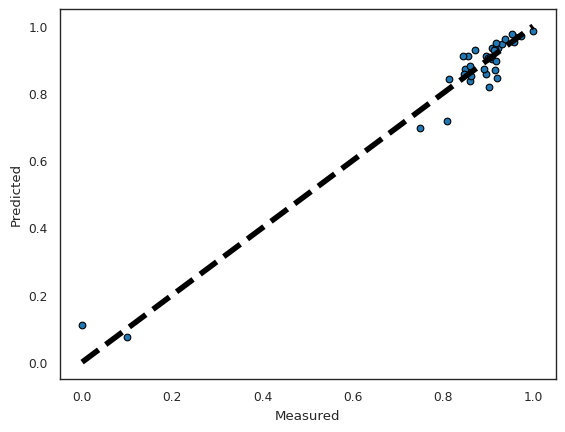

In [627]:
fig, ax = plt.subplots()
ax.scatter(y_train, y_pred, edgecolors=(0, 0, 0))
ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

Elasticity Analysis


In [628]:
coefficients_df = pd.DataFrame(pd.DataFrame(lr.params)[1:]).reset_index()
coefficients_df.columns = ['feature','coefficient']
elasticity_data = calculateElasticity(X_train_rfe, y_train, coefficients_df)

<Axes: xlabel='elasticity', ylabel='feature'>

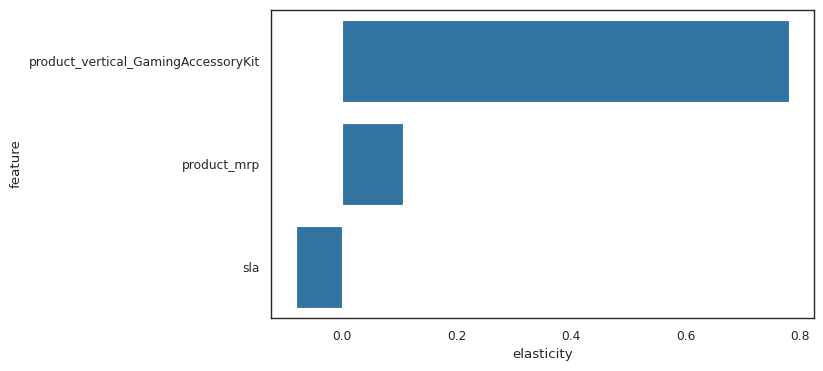

In [629]:
plt.figure(figsize = (7,4))
sns.barplot(x = 'elasticity',y ='feature',data = elasticity_data.sort_values('elasticity', ascending = False))

##Home Audio - Multiplicative model

In [630]:
#Splitting the Dataframe into Training and Testing Sets
from sklearn.model_selection import train_test_split
np.random.seed(0)
df_train, df_test = train_test_split(home_mul_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [631]:
#Rescaling the Features
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

In [632]:
home_mul_df.columns

Index(['gmv', 'Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'order_payment_type_Prepaid', 'is_mass_market', 'special_sales', 'product_vertical_Dock', 'product_vertical_DockingStation', 'product_vertical_FMRadio', 'product_vertical_HiFiSystem', 'product_vertical_HomeAudioSpeaker', 'product_mrp', 'product_vertical_SoundMixer', 'product_vertical_VoiceRecorder', 'pay_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship', 'Sponsorship_SMA_3', 'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', 'Content Marketing_SMA_3', 'Content Marketing_SMA_5', 'Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock', 'Online marketing', 'Online marketing_SMA_3', 'Online marketing_SMA_5',
    

In [633]:
num_vars=['gmv', 'Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'order_payment_type_Prepaid', 'is_mass_market', 'special_sales', 'product_vertical_Dock', 'product_vertical_DockingStation', 'product_vertical_FMRadio', 'product_vertical_HiFiSystem', 'product_vertical_HomeAudioSpeaker', 'product_mrp', 'product_vertical_SoundMixer',
'product_vertical_VoiceRecorder', 'pay_week', 'holiday_week', 'Total Investment',
'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8',
'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock',
'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship',
 'Sponsorship_SMA_3', 'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock',
 'Content Marketing', 'Content Marketing_SMA_3', 'Content Marketing_SMA_5', 'Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock', 'Online marketing', 'Online marketing_SMA_3', 'Online marketing_SMA_5',
 'Online marketing_EMA_8', 'Online_marketing_Ad_Stock', 'Affiliates', 'Affiliates_SMA_3',
 'Affiliates_SMA_5', 'Affiliates_EMA_8', 'Affiliates_Ad_Stock', 'SEM', 'SEM_SMA_3', 'SEM_SMA_5',
 'SEM_EMA_8', 'SEM_Ad_Stock', 'Radio', 'Radio_SMA_3', 'Radio_SMA_5', 'Radio_EMA_8', 'Radio_Ad_Stock',
 'Other', 'Other_SMA_3', 'Other_SMA_5', 'Other_EMA_8', 'Other_Ad_Stock', 'NPS', 'NPS_SMA_3', 'NPS_SMA_5',
 'Stock Index', 'Stock Index_SMA_3', 'Stock Index_SMA_5', 'Max Temp', 'Min Temp', 'Mean Temp',
 'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)',
 'Snow on Grnd (cm)']

In [634]:
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_test[num_vars] = scaler.fit_transform(df_test[num_vars])

In [635]:
# assigning x_traim amd y_train values
y_train = df_train.pop('gmv')
X_train = df_train

In [636]:
# Running RFE for selecting top 20 features
lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression()

In [637]:
rfe = RFE(lm, n_features_to_select=20)             # running RFE
rfe = rfe.fit(X_train, y_train)

In [638]:
# selecting the top 20 features given by rfe
col = X_train.columns[rfe.support_]
col

Index(['order_payment_type_Prepaid', 'is_mass_market', 'product_vertical_FMRadio', 'product_vertical_HomeAudioSpeaker', 'TV_SMA_5', 'Digital_SMA_3', 'Online marketing', 'Online marketing_SMA_5', 'Affiliates', 'SEM', 'Radio_Ad_Stock', 'NPS', 'NPS_SMA_5', 'Stock Index_SMA_5', 'Mean Temp', 'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)'], dtype='object')

In [639]:
# neglecting the features other than top 20 features given by rfe
X_train.columns[~rfe.support_]

Index(['Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'special_sales', 'product_vertical_Dock', 'product_vertical_DockingStation', 'product_vertical_HiFiSystem', 'product_mrp', 'product_vertical_SoundMixer', 'product_vertical_VoiceRecorder', 'pay_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship', 'Sponsorship_SMA_3', 'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', 'Content Marketing_SMA_3', 'Content Marketing_SMA_5', 'Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock', 'Online marketing_SMA_3', 'Online marketing_EMA_8', 'Online_marketing_Ad_Stock', 'Affiliates_SMA_3', 'Affiliates_SMA_5', 'Affiliates_EMA_8', 'Affiliates_Ad_Stock', 'SEM_SMA_3', 'SEM_SMA_5', 'SEM_EMA_8', 'SEM_Ad_Stock',
      

In [640]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [641]:
# Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

In [642]:
lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     4386.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.27e-20
Time:                        17:17:47   Log-Likelihood:                 159.43
No. Observations:                  33   AIC:                            -276.9
Df Residuals:                      12   BIC:                            -245.4
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
14,Stock Index_SMA_5,9445.14
13,NPS_SMA_5,8182.75
0,const,5836.93
2,is_mass_market,5451.70
9,Affiliates,4582.03
7,Online marketing,4075.23
4,product_vertical_HomeAudioSpeaker,1542.97
3,product_vertical_FMRadio,1364.57
1,order_payment_type_Prepaid,227.30
12,NPS,211.75


In [643]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Stock Index_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     2036.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.54e-19
Time:                        17:17:47   Log-Likelihood:                 144.61
No. Observations:                  33   AIC:                            -249.2
Df Residuals:                      13   BIC:                            -219.3
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
2,is_mass_market,5340.67
9,Affiliates,4409.09
7,Online marketing,4055.62
0,const,4008.96
4,product_vertical_HomeAudioSpeaker,1508.54
3,product_vertical_FMRadio,1308.78
1,order_payment_type_Prepaid,157.69
12,NPS,112.78
13,NPS_SMA_5,93.66
19,Total Precip (mm),62.02


In [644]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["is_mass_market"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     2292.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.32e-21
Time:                        17:17:47   Log-Likelihood:                 144.44
No. Observations:                  33   AIC:                            -250.9
Df Residuals:                      14   BIC:                            -222.5
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
6,Online marketing,3802.85
0,const,3679.00
8,Affiliates,3626.53
3,product_vertical_HomeAudioSpeaker,182.17
1,order_payment_type_Prepaid,138.92
2,product_vertical_FMRadio,93.16
11,NPS,86.91
18,Total Precip (mm),62.01
16,Total Rain (mm),48.91
12,NPS_SMA_5,47.00


In [645]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["NPS"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     2600.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           6.32e-23
Time:                        17:17:47   Log-Likelihood:                 144.44
No. Observations:                  33   AIC:                            -252.9
Df Residuals:                      15   BIC:                            -225.9
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
6,Online marketing,3740.57
8,Affiliates,3626.10
0,const,1051.56
3,product_vertical_HomeAudioSpeaker,172.86
2,product_vertical_FMRadio,84.43
1,order_payment_type_Prepaid,70.62
17,Total Precip (mm),61.81
15,Total Rain (mm),48.65
11,NPS_SMA_5,44.66
4,TV_SMA_5,35.72


In [646]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Mean Temp"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     2905.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.26e-24
Time:                        17:17:47   Log-Likelihood:                 144.21
No. Observations:                  33   AIC:                            -254.4
Df Residuals:                      16   BIC:                            -229.0
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
6,Online marketing,3704.86
8,Affiliates,3584.62
0,const,958.73
3,product_vertical_HomeAudioSpeaker,172.08
2,product_vertical_FMRadio,79.07
1,order_payment_type_Prepaid,67.57
16,Total Precip (mm),61.75
14,Total Rain (mm),48.38
11,NPS_SMA_5,43.96
4,TV_SMA_5,32.96


In [647]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Affiliates"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     3178.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.88e-26
Time:                        17:17:47   Log-Likelihood:                 143.62
No. Observations:                  33   AIC:                            -255.2
Df Residuals:                      17   BIC:                            -231.3
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,897.70
3,product_vertical_HomeAudioSpeaker,111.85
6,Online marketing,77.60
2,product_vertical_FMRadio,70.00
15,Total Precip (mm),52.39
1,order_payment_type_Prepaid,45.93
10,NPS_SMA_5,43.58
13,Total Rain (mm),40.32
4,TV_SMA_5,32.33
12,Cool Deg Days,21.63


In [648]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Cool Deg Days"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     3555.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           5.27e-28
Time:                        17:17:48   Log-Likelihood:                 143.39
No. Observations:                  33   AIC:                            -256.8
Df Residuals:                      18   BIC:                            -234.3
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,555.17
6,Online marketing,76.91
3,product_vertical_HomeAudioSpeaker,76.10
14,Total Precip (mm),50.18
1,order_payment_type_Prepaid,45.93
2,product_vertical_FMRadio,41.81
10,NPS_SMA_5,41.43
12,Total Rain (mm),38.68
4,TV_SMA_5,29.95
7,Online marketing_SMA_5,14.35


In [649]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Online marketing"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     3861.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.24e-29
Time:                        17:17:48   Log-Likelihood:                 142.64
No. Observations:                  33   AIC:                            -257.3
Df Residuals:                      19   BIC:                            -236.3
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,177.92
13,Total Precip (mm),50.16
1,order_payment_type_Prepaid,45.92
3,product_vertical_HomeAudioSpeaker,40.15
11,Total Rain (mm),38.55
2,product_vertical_FMRadio,38.05
4,TV_SMA_5,19.98
6,Online marketing_SMA_5,14.13
9,NPS_SMA_5,9.60
10,Heat Deg Days,6.22


In [650]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["SEM"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     4403.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.80e-31
Time:                        17:17:48   Log-Likelihood:                 142.64
No. Observations:                  33   AIC:                            -259.3
Df Residuals:                      20   BIC:                            -239.8
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,155.59
12,Total Precip (mm),48.79
1,order_payment_type_Prepaid,44.50
3,product_vertical_HomeAudioSpeaker,38.87
10,Total Rain (mm),38.34
2,product_vertical_FMRadio,37.84
4,TV_SMA_5,18.23
6,Online marketing_SMA_5,13.57
8,NPS_SMA_5,8.52
9,Heat Deg Days,6.12


In [651]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Digital_SMA_3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     5023.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.56e-33
Time:                        17:17:48   Log-Likelihood:                 142.57
No. Observations:                  33   AIC:                            -261.1
Df Residuals:                      21   BIC:                            -243.2
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,154.29
11,Total Precip (mm),46.91
1,order_payment_type_Prepaid,39.61
3,product_vertical_HomeAudioSpeaker,38.28
2,product_vertical_FMRadio,37.53
9,Total Rain (mm),37.02
4,TV_SMA_5,15.47
5,Online marketing_SMA_5,13.44
7,NPS_SMA_5,8.33
8,Heat Deg Days,5.67


In [652]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Heat Deg Days"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     5689.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.93e-35
Time:                        17:17:48   Log-Likelihood:                 142.29
No. Observations:                  33   AIC:                            -262.6
Df Residuals:                      22   BIC:                            -246.1
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,137.40
1,order_payment_type_Prepaid,38.78
10,Total Precip (mm),34.11
3,product_vertical_HomeAudioSpeaker,31.07
2,product_vertical_FMRadio,29.79
8,Total Rain (mm),28.20
5,Online marketing_SMA_5,13.37
4,TV_SMA_5,10.81
7,NPS_SMA_5,6.77
9,Total Snow (cm),4.16


In [653]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Total Snow (cm)"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     6327.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           7.67e-37
Time:                        17:17:49   Log-Likelihood:                 141.57
No. Observations:                  33   AIC:                            -263.1
Df Residuals:                      23   BIC:                            -248.2
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,111.97
2,product_vertical_FMRadio,29.10
3,product_vertical_HomeAudioSpeaker,27.55
1,order_payment_type_Prepaid,26.59
9,Total Precip (mm),16.29
8,Total Rain (mm),15.95
5,Online marketing_SMA_5,13.36
4,TV_SMA_5,10.65
7,NPS_SMA_5,6.76
6,Radio_Ad_Stock,3.20


In [654]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Total Rain (mm)"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     6752.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.68e-38
Time:                        17:17:49   Log-Likelihood:                 140.00
No. Observations:                  33   AIC:                            -262.0
Df Residuals:                      24   BIC:                            -248.5
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,111.67
2,product_vertical_FMRadio,29.07
3,product_vertical_HomeAudioSpeaker,27.38
1,order_payment_type_Prepaid,26.20
5,Online marketing_SMA_5,13.34
4,TV_SMA_5,10.64
7,NPS_SMA_5,6.76
6,Radio_Ad_Stock,3.09
8,Total Precip (mm),1.41


In [655]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Total Precip (mm)"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     7957.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.24e-40
Time:                        17:17:49   Log-Likelihood:                 139.83
No. Observations:                  33   AIC:                            -263.7
Df Residuals:                      25   BIC:                            -251.7
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,111.50
2,product_vertical_FMRadio,28.98
3,product_vertical_HomeAudioSpeaker,26.32
1,order_payment_type_Prepaid,24.39
5,Online marketing_SMA_5,12.52
4,TV_SMA_5,9.01
7,NPS_SMA_5,6.42
6,Radio_Ad_Stock,2.76


In [656]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["order_payment_type_Prepaid"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     6658.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.91e-40
Time:                        17:17:49   Log-Likelihood:                 133.70
No. Observations:                  33   AIC:                            -253.4
Df Residuals:                      26   BIC:                            -242.9
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,110.08
2,product_vertical_HomeAudioSpeaker,25.83
1,product_vertical_FMRadio,19.50
4,Online marketing_SMA_5,10.41
6,NPS_SMA_5,5.53
3,TV_SMA_5,3.32
5,Radio_Ad_Stock,1.09


In [657]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["TV_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     5513.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.00e-39
Time:                        17:17:49   Log-Likelihood:                 126.97
No. Observations:                  33   AIC:                            -241.9
Df Residuals:                      27   BIC:                            -233.0
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,92.08
2,product_vertical_HomeAudioSpeaker,25.22
1,product_vertical_FMRadio,19.02
3,Online marketing_SMA_5,6.60
5,NPS_SMA_5,3.89
4,Radio_Ad_Stock,1.08


In [658]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Online marketing_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     6475.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.40e-41
Time:                        17:17:49   Log-Likelihood:                 125.34
No. Observations:                  33   AIC:                            -240.7
Df Residuals:                      28   BIC:                            -233.2
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,59.06
2,product_vertical_HomeAudioSpeaker,18.69
1,product_vertical_FMRadio,18.54
4,NPS_SMA_5,1.11
3,Radio_Ad_Stock,1.07


In [659]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["NPS_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     6490.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.40e-41
Time:                        17:17:49   Log-Likelihood:                 120.06
No. Observations:                  33   AIC:                            -232.1
Df Residuals:                      29   BIC:                            -226.1
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,39.01
2,product_vertical_HomeAudioSpeaker,17.91
1,product_vertical_FMRadio,17.90
3,Radio_Ad_Stock,1.00


In [660]:
X_train_rfe.columns

Index(['product_vertical_FMRadio', 'product_vertical_HomeAudioSpeaker', 'Radio_Ad_Stock'], dtype='object')

In [661]:
drop_columns_list = list(set(num_vars) - set(list(X_train_rfe.columns)))
print(drop_columns_list)

['Affiliates_SMA_3', 'deliverybdays', 'Total Investment_EMA_8', 'NPS_SMA_5', 'Heat Deg Days', 'Digital', 'Total_Investment_Ad_Stock', 'Online marketing_EMA_8', 'Snow on Grnd (cm)', 'NPS_SMA_3', 'product_procurement_sla', 'Sponsorship_EMA_8', 'Content Marketing_SMA_5', 'Affiliates_EMA_8', 'Total Investment', 'holiday_week', 'TV_EMA_8', 'SEM_SMA_5', 'Stock Index_SMA_5', 'is_mass_market', 'SEM_EMA_8', 'Discount%', 'Digital_SMA_5', 'Total Precip (mm)', 'SEM_SMA_3', 'order_payment_type_Prepaid', 'SEM_Ad_Stock', 'Online marketing', 'SEM', 'Other_SMA_5', 'Other_SMA_3', 'Sponsorship', 'special_sales', 'Sponsorship_Ad_Stock', 'Radio_SMA_3', 'Digital_SMA_3', 'Online marketing_SMA_5', 'Stock Index', 'Radio', 'Sponsorship_SMA_3', 'Max Temp', 'Radio_SMA_5', 'Other_Ad_Stock', 'TV_SMA_5', 'Total Investment_SMA_3', 'Online marketing_SMA_3', 'Digital_EMA_8', 'product_vertical_DockingStation', 'Stock Index_SMA_3', 'Content Marketing_SMA_3', 'Total Snow (cm)', 'sla', 'Total Investment_SMA_5', 'Other_EMA_

In [662]:
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

folds = KFold(n_splits = 10, shuffle = True, random_state = 100)
lm=LinearRegression()
scores = cross_val_score(lm, X_train_rfe, y_train, scoring='r2', cv=folds)
scores

array([0.79508792, 0.91056519, 0.89793376, 0.89678226, 0.84169521,
       0.86728106, 0.93992671, 0.98045686, 0.76400153, 0.89913379])

In [663]:
y_pred = cross_val_predict(lm, X_train_rfe, y_train, cv=folds)

In [664]:
mse = mean_squared_error(y_train, y_pred)
r_squared = r2_score(y_train, y_pred)
print('Mean_Squared_Error :' ,mse)
print('r_square_value :',r_squared)

Mean_Squared_Error : 0.000351477755147866
r_square_value : 0.987095255506534


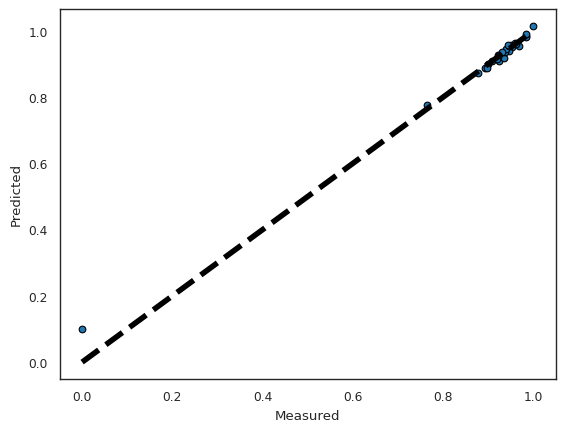

In [665]:
fig, ax = plt.subplots()
ax.scatter(y_train, y_pred, edgecolors=(0, 0, 0))
ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

Elasticity Analysis


In [666]:
coefficients_df = pd.DataFrame(pd.DataFrame(lr.params)[1:]).reset_index()
coefficients_df.columns = ['feature','coefficient']
elasticity_data = calculateElasticity(X_train_rfe, y_train, coefficients_df)

<Axes: xlabel='elasticity', ylabel='feature'>

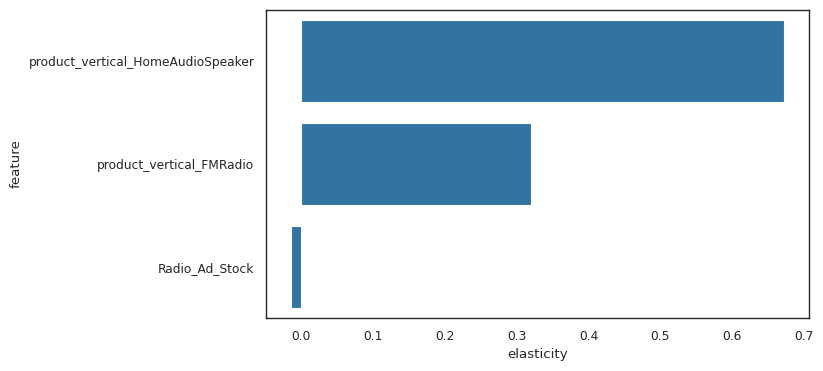

In [667]:
plt.figure(figsize = (7,4))
sns.barplot(x = 'elasticity',y ='feature',data = elasticity_data.sort_values('elasticity', ascending = False))

#Koyck Model


In [668]:
# Making copy of dataframes from the original ones
cam_koy_df = Camera_accessory_org_df.copy()
gam_koy_df = gaming_accessory_org_df.copy()
home_koy_df = Homeaudio_org_df.copy()
home_koy_df.head()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,order_payment_type_Prepaid,is_mass_market,special_sales,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_mrp,product_vertical_SoundMixer,product_vertical_VoiceRecorder,pay_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
26,1185712.00,30.67,0.00,0.00,7.00,1.95,213,793,0,24,1,334,8,541,1958.61,0,2,0,0,4.26,0.00,0.00,4.26,4.26,0.05,0.00,0.00,0.05,0.05,0.63,0.00,0.00,0.63,0.63,1.85,0.00,0.00,1.85,1.85,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.33,0.14,0.00,0.00,0.14,0.14,1.26,0.00,0.00,1.26,1.26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,28.00,12.50,20.10,0.28,2.38,4.42,0.00,4.42,0.00
27,1471962.00,30.37,0.00,0.00,6.71,1.78,243,936,297,36,0,374,19,657,2016.77,0,7,1,0,4.26,0.00,0.00,4.26,6.82,0.05,0.00,0.00,0.05,0.09,0.63,0.00,0.00,0.63,1.01,1.85,0.00,0.00,1.85,2.97,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.53,0.14,0.00,0.00,0.14,0.22,1.26,0.00,0.00,1.26,2.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,33.00,11.00,23.18,0.00,5.18,1.40,0.00,1.40,0.00
28,1275392.00,28.88,0.00,0.00,6.82,1.80,191,909,0,40,0,394,16,544,1896.30,0,1,0,0,4.26,4.26,0.00,4.26,8.36,0.05,0.05,0.00,0.05,0.11,0.63,0.63,0.00,0.63,1.24,1.85,1.85,0.00,1.85,3.63,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.65,0.14,0.14,0.00,0.14,0.27,1.26,1.26,0.00,1.26,2.46,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,31.50,14.50,23.06,0.00,5.06,1.08,0.00,1.08,0.00
29,920394.00,28.04,0.00,0.00,6.83,1.76,145,650,0,39,0,281,6,388,1919.25,0,0,1,0,4.26,4.26,0.00,4.26,9.28,0.05,0.05,0.00,0.05,0.12,0.63,0.63,0.00,0.63,1.38,1.85,1.85,0.00,1.85,4.03,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.72,0.14,0.14,0.00,0.14,0.30,1.26,1.26,0.00,1.26,2.73,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,33.50,16.00,24.57,0.00,6.57,4.63,0.00,4.63,0.00
30,2599.00,16.13,0.00,0.00,9.00,2.00,1,0,0,0,0,0,0,1,3099.00,0,0,0,0,1.01,3.18,3.61,3.54,6.58,0.00,0.04,0.04,0.04,0.07,0.26,0.51,0.56,0.55,1.08,0.21,1.31,1.53,1.49,2.63,0.00,0.00,0.00,0.00,0.00,0.03,0.23,0.27,0.26,0.46,0.01,0.10,0.11,0.11,0.19,0.50,1.01,1.11,1.09,2.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,59.99,56.40,55.68,1206.00,1186.67,1182.80,28.50,15.00,21.65,0.00,3.65,0.35,0.00,0.35,0.00


###Camera Accessory - Kyock's Model


In [669]:
def createKyockKPI(df):
    df['gmv_lag'] = df['gmv'].shift(1)
    return df.fillna(0)

In [670]:
# adding lag variable in the camera data set
df = createKyockKPI(cam_koy_df)
df.head()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,product_mrp,order_payment_type_Prepaid,is_mass_market,product_vertical_CameraAccessory,special_sales,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Telescope,pay_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),gmv_lag
26,1088715.00,45.59,0.00,0.00,6.36,2.08,1143.14,566,1734,39,0,260,349,167,7,0,0,0,0,3,70,349,0,164,8,0,263,0,0,13,4,0,0,4.26,0.00,0.00,4.26,4.26,0.05,0.00,0.00,0.05,0.05,0.63,0.00,0.00,0.63,0.63,1.85,0.00,0.00,1.85,1.85,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.33,0.14,0.00,0.00,0.14,0.14,1.26,0.00,0.00,1.26,1.26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,28.00,12.50,20.10,0.28,2.38,4.42,0.00,4.42,0.00,0.00
27,1203752.00,47.02,0.00,0.00,6.06,2.10,1197.19,649,2005,31,578,284,428,179,4,0,0,0,0,10,85,408,0,142,11,0,293,0,0,22,15,1,0,4.26,0.00,0.00,4.26,6.82,0.05,0.00,0.00,0.05,0.09,0.63,0.00,0.00,0.63,1.01,1.85,0.00,0.00,1.85,2.97,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.53,0.14,0.00,0.00,0.14,0.22,1.26,0.00,0.00,1.26,2.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,33.00,11.00,23.18,0.00,5.18,1.40,0.00,1.40,0.00,1088715.00
28,1183338.00,44.83,0.00,0.00,6.17,2.12,1162.70,606,1991,43,0,223,455,218,4,0,0,0,0,7,68,370,0,148,7,0,325,0,0,21,23,0,0,4.26,4.26,0.00,4.26,8.36,0.05,0.05,0.00,0.05,0.11,0.63,0.63,0.00,0.63,1.24,1.85,1.85,0.00,1.85,3.63,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.65,0.14,0.14,0.00,0.14,0.27,1.26,1.26,0.00,1.26,2.46,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,31.50,14.50,23.06,0.00,5.06,1.08,0.00,1.08,0.00,1203752.00
29,813136.00,44.89,0.00,0.00,6.08,2.14,1161.87,380,1342,39,0,148,296,148,2,0,0,0,0,2,52,297,0,76,9,0,181,0,0,23,11,1,0,4.26,4.26,0.00,4.26,9.28,0.05,0.05,0.00,0.05,0.12,0.63,0.63,0.00,0.63,1.38,1.85,1.85,0.00,1.85,4.03,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.72,0.14,0.14,0.00,0.14,0.30,1.26,1.26,0.00,1.26,2.73,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,33.50,16.00,24.57,0.00,6.57,4.63,0.00,4.63,0.00,1183338.00
30,1399.00,17.26,0.00,0.00,7.67,4.00,716.67,2,3,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1.01,3.18,3.61,3.54,6.58,0.00,0.04,0.04,0.04,0.07,0.26,0.51,0.56,0.55,1.08,0.21,1.31,1.53,1.49,2.63,0.00,0.00,0.00,0.00,0.00,0.03,0.23,0.27,0.26,0.46,0.01,0.10,0.11,0.11,0.19,0.50,1.01,1.11,1.09,2.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,59.99,56.40,55.68,

In [671]:
df.shape


(48, 99)

In [672]:
df.head()


,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,product_mrp,order_payment_type_Prepaid,is_mass_market,product_vertical_CameraAccessory,special_sales,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Telescope,pay_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),gmv_lag
26,1088715.00,45.59,0.00,0.00,6.36,2.08,1143.14,566,1734,39,0,260,349,167,7,0,0,0,0,3,70,349,0,164,8,0,263,0,0,13,4,0,0,4.26,0.00,0.00,4.26,4.26,0.05,0.00,0.00,0.05,0.05,0.63,0.00,0.00,0.63,0.63,1.85,0.00,0.00,1.85,1.85,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.33,0.14,0.00,0.00,0.14,0.14,1.26,0.00,0.00,1.26,1.26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,28.00,12.50,20.10,0.28,2.38,4.42,0.00,4.42,0.00,0.00
27,1203752.00,47.02,0.00,0.00,6.06,2.10,1197.19,649,2005,31,578,284,428,179,4,0,0,0,0,10,85,408,0,142,11,0,293,0,0,22,15,1,0,4.26,0.00,0.00,4.26,6.82,0.05,0.00,0.00,0.05,0.09,0.63,0.00,0.00,0.63,1.01,1.85,0.00,0.00,1.85,2.97,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.53,0.14,0.00,0.00,0.14,0.22,1.26,0.00,0.00,1.26,2.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,33.00,11.00,23.18,0.00,5.18,1.40,0.00,1.40,0.00,1088715.00
28,1183338.00,44.83,0.00,0.00,6.17,2.12,1162.70,606,1991,43,0,223,455,218,4,0,0,0,0,7,68,370,0,148,7,0,325,0,0,21,23,0,0,4.26,4.26,0.00,4.26,8.36,0.05,0.05,0.00,0.05,0.11,0.63,0.63,0.00,0.63,1.24,1.85,1.85,0.00,1.85,3.63,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.65,0.14,0.14,0.00,0.14,0.27,1.26,1.26,0.00,1.26,2.46,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,31.50,14.50,23.06,0.00,5.06,1.08,0.00,1.08,0.00,1203752.00
29,813136.00,44.89,0.00,0.00,6.08,2.14,1161.87,380,1342,39,0,148,296,148,2,0,0,0,0,2,52,297,0,76,9,0,181,0,0,23,11,1,0,4.26,4.26,0.00,4.26,9.28,0.05,0.05,0.00,0.05,0.12,0.63,0.63,0.00,0.63,1.38,1.85,1.85,0.00,1.85,4.03,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.72,0.14,0.14,0.00,0.14,0.30,1.26,1.26,0.00,1.26,2.73,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,33.50,16.00,24.57,0.00,6.57,4.63,0.00,4.63,0.00,1183338.00
30,1399.00,17.26,0.00,0.00,7.67,4.00,716.67,2,3,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1.01,3.18,3.61,3.54,6.58,0.00,0.04,0.04,0.04,0.07,0.26,0.51,0.56,0.55,1.08,0.21,1.31,1.53,1.49,2.63,0.00,0.00,0.00,0.00,0.00,0.03,0.23,0.27,0.26,0.46,0.01,0.10,0.11,0.11,0.19,0.50,1.01,1.11,1.09,2.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,59.99,56.40,55.68,

In [673]:
#Test-train split
df_train, df_test = train_test_split(df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [674]:
scaler = MinMaxScaler()


In [675]:
df.columns


Index(['gmv', 'Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'product_mrp', 'order_payment_type_Prepaid', 'is_mass_market', 'product_vertical_CameraAccessory', 'special_sales', 'product_vertical_CameraBag', 'product_vertical_CameraBattery', 'product_vertical_CameraBatteryCharger', 'product_vertical_CameraBatteryGrip', 'product_vertical_CameraEyeCup', 'product_vertical_CameraFilmRolls', 'product_vertical_CameraHousing', 'product_vertical_CameraMicrophone', 'product_vertical_CameraMount', 'product_vertical_CameraRemoteControl', 'product_vertical_CameraTripod', 'product_vertical_ExtensionTube', 'product_vertical_Filter', 'product_vertical_Flash', 'product_vertical_FlashShoeAdapter', 'product_vertical_Lens', 'product_vertical_ReflectorUmbrella', 'product_vertical_Softbox', 'product_vertical_Strap', 'product_vertical_Telescope', 'pay_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8',
    

In [676]:
num_vars=['gmv', 'Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'product_mrp', 'order_payment_type_Prepaid', 'is_mass_market', 'product_vertical_CameraAccessory', 'special_sales', 'product_vertical_CameraBag', 'product_vertical_CameraBattery', 'product_vertical_CameraBatteryCharger', 'product_vertical_CameraBatteryGrip', 'product_vertical_CameraEyeCup', 'product_vertical_CameraFilmRolls', 'product_vertical_CameraHousing', 'product_vertical_CameraMicrophone', 'product_vertical_CameraMount', 'product_vertical_CameraRemoteControl', 'product_vertical_CameraTripod', 'product_vertical_ExtensionTube', 'product_vertical_Filter', 'product_vertical_Flash', 'product_vertical_FlashShoeAdapter', 'product_vertical_Lens', 'product_vertical_ReflectorUmbrella', 'product_vertical_Softbox', 'product_vertical_Strap', 'product_vertical_Telescope', 'pay_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8',
       'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship', 'Sponsorship_SMA_3', 'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', 'Content Marketing_SMA_3', 'Content Marketing_SMA_5', 'Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock', 'Online marketing', 'Online marketing_SMA_3', 'Online marketing_SMA_5', 'Online marketing_EMA_8', 'Online_marketing_Ad_Stock', 'Affiliates', 'Affiliates_SMA_3', 'Affiliates_SMA_5', 'Affiliates_EMA_8', 'Affiliates_Ad_Stock', 'SEM', 'SEM_SMA_3', 'SEM_SMA_5', 'SEM_EMA_8', 'SEM_Ad_Stock', 'Radio', 'Radio_SMA_3', 'Radio_SMA_5', 'Radio_EMA_8', 'Radio_Ad_Stock', 'Other', 'Other_SMA_3', 'Other_SMA_5', 'Other_EMA_8', 'Other_Ad_Stock', 'NPS', 'NPS_SMA_3', 'NPS_SMA_5', 'Stock Index', 'Stock Index_SMA_3', 'Stock Index_SMA_5', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days', 'Cool Deg Days',
       'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)', 'gmv_lag']
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_test[num_vars] = scaler.fit_transform(df_test[num_vars])

In [677]:
y_train = df_train.pop('gmv')
X_train = df_train

In [678]:
# Running RFE for selecting top 20 features
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=20)             # running RFE
rfe = rfe.fit(X_train, y_train)

In [679]:
# selecting the features given by rfe
col = X_train.columns[rfe.support_]
col

Index(['Discount%', 'sla', 'is_mass_market', 'product_vertical_CameraBattery', 'product_vertical_CameraBatteryCharger', 'product_vertical_CameraFilmRolls', 'product_vertical_CameraMicrophone', 'product_vertical_CameraTripod', 'product_vertical_FlashShoeAdapter', 'product_vertical_Softbox', 'product_vertical_Telescope', 'Sponsorship', 'Online marketing', 'Affiliates', 'Radio_SMA_3', 'Mean Temp', 'Total Rain (mm)', 'Total Precip (mm)', 'Snow on Grnd (cm)', 'gmv_lag'], dtype='object')

In [680]:
# negelecting features not selected by rfe
X_train.columns[~rfe.support_]

Index(['deliverybdays', 'deliverycdays', 'product_procurement_sla', 'product_mrp', 'order_payment_type_Prepaid', 'product_vertical_CameraAccessory', 'special_sales', 'product_vertical_CameraBag', 'product_vertical_CameraBatteryGrip', 'product_vertical_CameraEyeCup', 'product_vertical_CameraHousing', 'product_vertical_CameraMount', 'product_vertical_CameraRemoteControl', 'product_vertical_ExtensionTube', 'product_vertical_Filter', 'product_vertical_Flash', 'product_vertical_Lens', 'product_vertical_ReflectorUmbrella', 'product_vertical_Strap', 'pay_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship_SMA_3', 'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', 'Content Marketing_SMA_3',
       'Content Market

In [681]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [682]:
# Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     2432.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.13e-18
Time:                        17:17:51   Log-Likelihood:                 150.22
No. Observations:                  33   AIC:                            -258.4
Df Residuals:                      12   BIC:                            -227.0
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,561.96
13,Online marketing,332.97
14,Affiliates,305.05
18,Total Precip (mm),41.16
5,product_vertical_CameraBatteryCharger,35.67
17,Total Rain (mm),35.56
3,is_mass_market,28.11
1,Discount%,20.69
4,product_vertical_CameraBattery,16.91
11,product_vertical_Telescope,16.65


In [683]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["is_mass_market"], axis = 1)

In [684]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.973
Model:                            OLS   Adj. R-squared:                  0.934
Method:                 Least Squares   F-statistic:                     24.99
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.81e-07
Time:                        17:17:52   Log-Likelihood:                 72.959
No. Observations:                  33   AIC:                            -105.9
Df Residuals:                      13   BIC:                            -75.99
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

In [685]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,430.85
12,Online marketing,310.62
13,Affiliates,295.07
17,Total Precip (mm),40.13
16,Total Rain (mm),35.18
4,product_vertical_CameraBatteryCharger,32.94
10,product_vertical_Telescope,16.65
3,product_vertical_CameraBattery,16.61
1,Discount%,14.03
15,Mean Temp,10.99


In [686]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Affiliates"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.973
Model:                            OLS   Adj. R-squared:                  0.938
Method:                 Least Squares   F-statistic:                     27.90
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           5.74e-08
Time:                        17:17:52   Log-Likelihood:                 72.665
No. Observations:                  33   AIC:                            -107.3
Df Residuals:                      14   BIC:                            -78.90
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,417.71
16,Total Precip (mm),35.91
4,product_vertical_CameraBatteryCharger,32.13
15,Total Rain (mm),30.26
3,product_vertical_CameraBattery,16.53
10,product_vertical_Telescope,16.05
1,Discount%,12.79
14,Mean Temp,10.38
12,Online marketing,8.83
2,sla,8.48


In [687]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Total Precip (mm)"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.973
Model:                            OLS   Adj. R-squared:                  0.942
Method:                 Least Squares   F-statistic:                     31.62
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           9.91e-09
Time:                        17:17:52   Log-Likelihood:                 72.651
No. Observations:                  33   AIC:                            -109.3
Df Residuals:                      15   BIC:                            -82.37
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,400.19
4,product_vertical_CameraBatteryCharger,30.85
3,product_vertical_CameraBattery,16.36
10,product_vertical_Telescope,15.46
1,Discount%,12.72
12,Online marketing,8.61
14,Mean Temp,8.58
2,sla,8.47
5,product_vertical_CameraFilmRolls,7.67
11,Sponsorship,6.45


In [688]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["sla"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.952
Model:                            OLS   Adj. R-squared:                  0.903
Method:                 Least Squares   F-statistic:                     19.68
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.42e-07
Time:                        17:17:52   Log-Likelihood:                 63.122
No. Observations:                  33   AIC:                            -92.24
Df Residuals:                      16   BIC:                            -66.80
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,112.63
3,product_vertical_CameraBatteryCharger,30.85
2,product_vertical_CameraBattery,16.03
9,product_vertical_Telescope,11.03
11,Online marketing,8.61
13,Mean Temp,8.55
4,product_vertical_CameraFilmRolls,6.75
10,Sponsorship,6.24
1,Discount%,5.10
5,product_vertical_CameraMicrophone,4.18


In [689]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Mean Temp"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.952
Model:                            OLS   Adj. R-squared:                  0.909
Method:                 Least Squares   F-statistic:                     22.29
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.90e-08
Time:                        17:17:52   Log-Likelihood:                 63.117
No. Observations:                  33   AIC:                            -94.23
Df Residuals:                      17   BIC:                            -70.29
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,31.74
3,product_vertical_CameraBatteryCharger,17.28
9,product_vertical_Telescope,10.57
2,product_vertical_CameraBattery,9.17
4,product_vertical_CameraFilmRolls,6.09
1,Discount%,4.24
10,Sponsorship,3.36
11,Online marketing,3.33
5,product_vertical_CameraMicrophone,2.79
6,product_vertical_CameraTripod,2.41


In [690]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_FlashShoeAdapter"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.928
Model:                            OLS   Adj. R-squared:                  0.872
Method:                 Least Squares   F-statistic:                     16.52
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.79e-07
Time:                        17:17:52   Log-Likelihood:                 56.510
No. Observations:                  33   AIC:                            -83.02
Df Residuals:                      18   BIC:                            -60.57
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,31.42
3,product_vertical_CameraBatteryCharger,13.55
8,product_vertical_Telescope,9.37
2,product_vertical_CameraBattery,8.39
4,product_vertical_CameraFilmRolls,5.86
1,Discount%,3.65
9,Sponsorship,2.93
10,Online marketing,2.82
5,product_vertical_CameraMicrophone,2.79
7,product_vertical_Softbox,2.32


In [691]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_CameraBatteryCharger"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.927
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                     18.46
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.58e-08
Time:                        17:17:52   Log-Likelihood:                 56.248
No. Observations:                  33   AIC:                            -84.50
Df Residuals:                      19   BIC:                            -63.54
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,31.30
7,product_vertical_Telescope,8.07
3,product_vertical_CameraFilmRolls,5.65
2,product_vertical_CameraBattery,4.72
1,Discount%,3.65
8,Sponsorship,2.87
9,Online marketing,2.82
6,product_vertical_Softbox,2.30
5,product_vertical_CameraTripod,2.10
10,Radio_SMA_3,1.92


In [692]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_CameraFilmRolls"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.925
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                     20.58
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.17e-08
Time:                        17:17:52   Log-Likelihood:                 55.905
No. Observations:                  33   AIC:                            -85.81
Df Residuals:                      20   BIC:                            -66.36
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,29.06
2,product_vertical_CameraBattery,3.41
6,product_vertical_Telescope,3.21
7,Sponsorship,2.83
8,Online marketing,2.81
1,Discount%,2.76
5,product_vertical_Softbox,2.11
9,Radio_SMA_3,1.90
3,product_vertical_CameraMicrophone,1.89
4,product_vertical_CameraTripod,1.89


In [693]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Sponsorship"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.896
Model:                            OLS   Adj. R-squared:                  0.841
Method:                 Least Squares   F-statistic:                     16.42
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           6.49e-08
Time:                        17:17:53   Log-Likelihood:                 50.467
No. Observations:                  33   AIC:                            -76.93
Df Residuals:                      21   BIC:                            -58.98
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,28.97
2,product_vertical_CameraBattery,3.38
6,product_vertical_Telescope,3.21
1,Discount%,2.75
5,product_vertical_Softbox,2.10
3,product_vertical_CameraMicrophone,1.88
4,product_vertical_CameraTripod,1.86
11,gmv_lag,1.86
7,Online marketing,1.52
8,Radio_SMA_3,1.44


In [694]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["gmv_lag"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.896
Model:                            OLS   Adj. R-squared:                  0.848
Method:                 Least Squares   F-statistic:                     18.91
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.44e-08
Time:                        17:17:53   Log-Likelihood:                 50.453
No. Observations:                  33   AIC:                            -78.91
Df Residuals:                      22   BIC:                            -62.44
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,28.31
2,product_vertical_CameraBattery,3.37
6,product_vertical_Telescope,3.17
1,Discount%,2.66
3,product_vertical_CameraMicrophone,1.88
4,product_vertical_CameraTripod,1.75
5,product_vertical_Softbox,1.63
8,Radio_SMA_3,1.42
7,Online marketing,1.31
10,Snow on Grnd (cm),1.31


In [695]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Snow on Grnd (cm)"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.893
Model:                            OLS   Adj. R-squared:                  0.851
Method:                 Least Squares   F-statistic:                     21.32
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.96e-09
Time:                        17:17:53   Log-Likelihood:                 50.013
No. Observations:                  33   AIC:                            -80.03
Df Residuals:                      23   BIC:                            -65.06
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,28.15
2,product_vertical_CameraBattery,3.37
6,product_vertical_Telescope,2.99
1,Discount%,2.57
3,product_vertical_CameraMicrophone,1.88
4,product_vertical_CameraTripod,1.74
5,product_vertical_Softbox,1.63
7,Online marketing,1.31
9,Total Rain (mm),1.24
8,Radio_SMA_3,1.22


In [696]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Discount%"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.865
Model:                            OLS   Adj. R-squared:                  0.821
Method:                 Least Squares   F-statistic:                     19.29
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.08e-08
Time:                        17:17:53   Log-Likelihood:                 46.233
No. Observations:                  33   AIC:                            -74.47
Df Residuals:                      24   BIC:                            -61.00
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,12.85
1,product_vertical_CameraBattery,3.37
5,product_vertical_Telescope,2.46
2,product_vertical_CameraMicrophone,1.88
4,product_vertical_Softbox,1.49
6,Online marketing,1.29
3,product_vertical_CameraTripod,1.28
8,Total Rain (mm),1.23
7,Radio_SMA_3,1.20


In [697]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Total Rain (mm)"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.859
Model:                            OLS   Adj. R-squared:                  0.820
Method:                 Least Squares   F-statistic:                     21.78
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.71e-09
Time:                        17:17:53   Log-Likelihood:                 45.485
No. Observations:                  33   AIC:                            -74.97
Df Residuals:                      25   BIC:                            -63.00
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,12.80
1,product_vertical_CameraBattery,2.99
5,product_vertical_Telescope,2.38
2,product_vertical_CameraMicrophone,1.88
4,product_vertical_Softbox,1.49
6,Online marketing,1.29
3,product_vertical_CameraTripod,1.27
7,Radio_SMA_3,1.20


In [698]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Radio_SMA_3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.859
Model:                            OLS   Adj. R-squared:                  0.827
Method:                 Least Squares   F-statistic:                     26.43
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           6.83e-10
Time:                        17:17:53   Log-Likelihood:                 45.482
No. Observations:                  33   AIC:                            -76.96
Df Residuals:                      26   BIC:                            -66.49
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,12.80
1,product_vertical_CameraBattery,2.99
5,product_vertical_Telescope,2.35
2,product_vertical_CameraMicrophone,1.87
4,product_vertical_Softbox,1.48
3,product_vertical_CameraTripod,1.18
6,Online marketing,1.15


In [699]:
X_train_rfe.columns

Index(['product_vertical_CameraBattery', 'product_vertical_CameraMicrophone', 'product_vertical_CameraTripod', 'product_vertical_Softbox', 'product_vertical_Telescope', 'Online marketing'], dtype='object')

In [700]:
drop_columns_list = list(set(num_vars) - set(list(X_train_rfe.columns)))
print(drop_columns_list)

['Affiliates_SMA_3', 'deliverybdays', 'Total Investment_EMA_8', 'NPS_SMA_5', 'Heat Deg Days', 'Digital', 'Total_Investment_Ad_Stock', 'Online marketing_EMA_8', 'product_vertical_FlashShoeAdapter', 'Snow on Grnd (cm)', 'NPS_SMA_3', 'product_procurement_sla', 'Sponsorship_EMA_8', 'Content Marketing_SMA_5', 'Affiliates_EMA_8', 'Total Investment', 'holiday_week', 'TV_EMA_8', 'SEM_SMA_5', 'Stock Index_SMA_5', 'is_mass_market', 'SEM_EMA_8', 'Discount%', 'Digital_SMA_5', 'Total Precip (mm)', 'SEM_SMA_3', 'order_payment_type_Prepaid', 'product_vertical_Filter', 'product_vertical_Lens', 'SEM_Ad_Stock', 'product_vertical_CameraHousing', 'SEM', 'Other_SMA_5', 'Other_SMA_3', 'Sponsorship', 'special_sales', 'Sponsorship_Ad_Stock', 'Radio_SMA_3', 'Digital_SMA_3', 'Online marketing_SMA_5', 'Stock Index', 'Radio', 'Sponsorship_SMA_3', 'Max Temp', 'Radio_SMA_5', 'Other_Ad_Stock', 'TV_SMA_5', 'Total Investment_SMA_3', 'gmv_lag', 'Online marketing_SMA_3', 'Digital_EMA_8', 'product_vertical_CameraBatteryC

In [701]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

folds = KFold(n_splits = 10, shuffle = True, random_state = 100)
lm=LinearRegression()
scores = cross_val_score(lm, X_train_rfe, y_train, scoring='r2', cv=folds)
scores

array([ -1.36377723,   0.96764232,   0.77451346,   0.88683863,
        -2.48060873,  -0.30824994,  -0.99129375,   0.82827328,
       -10.06955174,  -0.36552132])

In [702]:
y_pred = cross_val_predict(lm, X_train_rfe, y_train, cv=folds)

In [703]:
mse = mean_squared_error(y_train, y_pred)
r_squared = r2_score(y_train, y_pred)
print('Mean_Squared_Error :' ,mse)
print('r_square_value :',r_squared)

Mean_Squared_Error : 0.010714860496213483
r_square_value : 0.5940865793744604


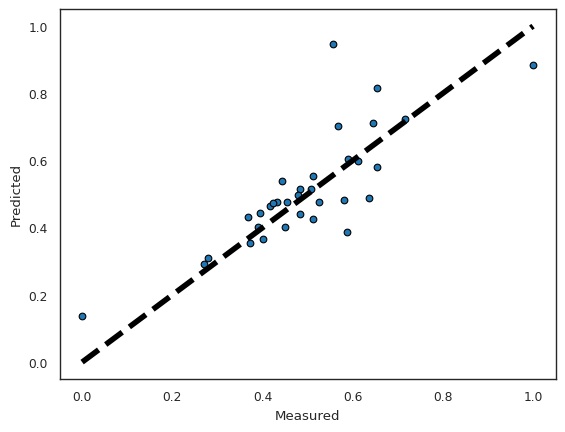

In [704]:
fig, ax = plt.subplots()
ax.scatter(y_train, y_pred, edgecolors=(0, 0, 0))
ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

Elasticity Analysis


In [705]:
coefficients_df = pd.DataFrame(pd.DataFrame(lr.params)[1:]).reset_index()
coefficients_df.columns = ['feature','coefficient']
elasticity_data = calculateElasticity(X_train_rfe, y_train, coefficients_df)

<Axes: xlabel='elasticity', ylabel='feature'>

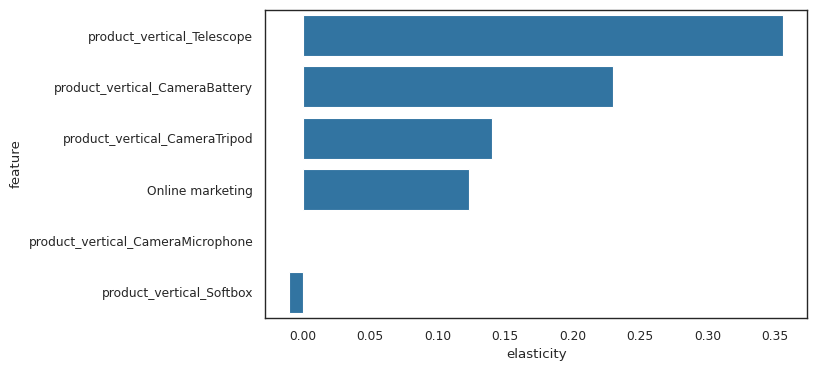

In [706]:
plt.figure(figsize = (7,4))
sns.barplot(x = 'elasticity',y ='feature',data = elasticity_data.sort_values('elasticity', ascending = False))

##Gaming Accessory - Kyock's Model

In [707]:
# adding lag variable in the camera data set
df = createKyockKPI(gam_koy_df)
df.head()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,order_payment_type_Prepaid,is_mass_market,product_vertical_GameControlMount,product_vertical_GamePad,product_mrp,special_sales,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_JoystickGamingWheel,product_vertical_MotionController,product_vertical_TVOutCableAccessory,payd_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),gmv_lag
26,1019727.00,42.15,0.00,0.00,5.52,2.48,390,1431,0,621,1169.77,0,81,37,0,108,375,26,184,40,0,4,10,66,0,0,4.26,0.00,0.00,4.26,4.26,0.05,0.00,0.00,0.05,0.05,0.63,0.00,0.00,0.63,0.63,1.85,0.00,0.00,1.85,1.85,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.33,0.14,0.00,0.00,0.14,0.14,1.26,0.00,0.00,1.26,1.26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,28.00,12.50,20.10,0.28,2.38,4.42,0.00,4.42,0.00,0.00
27,968786.36,47.07,0.00,0.00,5.12,2.46,437,1775,0,1235,860.06,512,120,37,0,95,148,24,121,29,0,7,5,82,1,0,4.26,0.00,0.00,4.26,6.82,0.05,0.00,0.00,0.05,0.09,0.63,0.00,0.00,0.63,1.01,1.85,0.00,0.00,1.85,2.97,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.53,0.14,0.00,0.00,0.14,0.22,1.26,0.00,0.00,1.26,2.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,33.00,11.00,23.18,0.00,5.18,1.40,0.00,1.40,0.00,1019727.00
28,936947.00,38.60,0.00,0.00,5.49,2.25,304,1341,0,740,1047.04,0,143,26,0,104,149,24,122,42,0,7,7,84,0,0,4.26,4.26,0.00,4.26,8.36,0.05,0.05,0.00,0.05,0.11,0.63,0.63,0.00,0.63,1.24,1.85,1.85,0.00,1.85,3.63,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.65,0.14,0.14,0.00,0.14,0.27,1.26,1.26,0.00,1.26,2.46,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,31.50,14.50,23.06,0.00,5.06,1.08,0.00,1.08,0.00,968786.36
29,711721.00,38.72,0.01,0.01,5.82,2.25,171,875,0,489,1117.11,0,93,24,0,131,62,10,77,22,1,9,6,66,1,0,4.26,4.26,0.00,4.26,9.28,0.05,0.05,0.00,0.05,0.12,0.63,0.63,0.00,0.63,1.38,1.85,1.85,0.00,1.85,4.03,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.72,0.14,0.14,0.00,0.14,0.30,1.26,1.26,0.00,1.26,2.73,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,33.50,16.00,24.57,0.00,6.57,4.63,0.00,4.63,0.00,936947.00
30,1441.00,56.28,0.00,0.00,7.00,2.67,1,3,0,2,891.67,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1.01,3.18,3.61,3.54,6.58,0.00,0.04,0.04,0.04,0.07,0.26,0.51,0.56,0.55,1.08,0.21,1.31,1.53,1.49,2.63,0.00,0.00,0.00,0.00,0.00,0.03,0.23,0.27,0.26,0.46,0.01,0.10,0.11,0.11,0.19,0.50,1.01,1.11,1.09,2.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,59.99,56.40,55.68,1206.00,1186.67,1182.80,28.50,15.00,21.65,0.00,3.65,0.35,0.00,0.35,0.00,711721.00


In [708]:
df.shape

(51, 92)

In [709]:
#Test-train split
df_train, df_test = train_test_split(df, train_size = 0.7, test_size = 0.3, random_state = 100)

scaler = MinMaxScaler()

In [710]:
df.columns

Index(['gmv', 'Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'order_payment_type_Prepaid', 'is_mass_market', 'product_vertical_GameControlMount', 'product_vertical_GamePad', 'product_mrp', 'special_sales', 'product_vertical_GamingAccessoryKit', 'product_vertical_GamingAdapter', 'product_vertical_GamingChargingStation', 'product_vertical_GamingHeadset', 'product_vertical_GamingKeyboard', 'product_vertical_GamingMemoryCard', 'product_vertical_GamingMouse', 'product_vertical_GamingMousePad', 'product_vertical_GamingSpeaker', 'product_vertical_JoystickGamingWheel', 'product_vertical_MotionController', 'product_vertical_TVOutCableAccessory', 'payd_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship',
       'Spo

In [711]:
num_vars=['gmv', 'Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'order_payment_type_Prepaid', 'is_mass_market', 'product_vertical_GameControlMount', 'product_vertical_GamePad', 'product_mrp', 'special_sales', 'product_vertical_GamingAccessoryKit', 'product_vertical_GamingAdapter', 'product_vertical_GamingChargingStation', 'product_vertical_GamingHeadset', 'product_vertical_GamingKeyboard', 'product_vertical_GamingMemoryCard', 'product_vertical_GamingMouse', 'product_vertical_GamingMousePad', 'product_vertical_GamingSpeaker', 'product_vertical_JoystickGamingWheel', 'product_vertical_MotionController', 'product_vertical_TVOutCableAccessory', 'payd_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship',
       'Sponsorship_SMA_3', 'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', 'Content Marketing_SMA_3', 'Content Marketing_SMA_5', 'Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock', 'Online marketing', 'Online marketing_SMA_3', 'Online marketing_SMA_5', 'Online marketing_EMA_8', 'Online_marketing_Ad_Stock', 'Affiliates', 'Affiliates_SMA_3', 'Affiliates_SMA_5', 'Affiliates_EMA_8', 'Affiliates_Ad_Stock', 'SEM', 'SEM_SMA_3', 'SEM_SMA_5', 'SEM_EMA_8', 'SEM_Ad_Stock', 'Radio', 'Radio_SMA_3', 'Radio_SMA_5', 'Radio_EMA_8', 'Radio_Ad_Stock', 'Other', 'Other_SMA_3', 'Other_SMA_5', 'Other_EMA_8', 'Other_Ad_Stock', 'NPS', 'NPS_SMA_3', 'NPS_SMA_5', 'Stock Index', 'Stock Index_SMA_3', 'Stock Index_SMA_5', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)', 'gmv_lag']
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_test[num_vars] = scaler.fit_transform(df_test[num_vars])

In [712]:
y_train = df_train.pop('gmv')
X_train = df_train

In [713]:
# Running RFE for selecting top 20 features
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=20)             # running RFE
rfe = rfe.fit(X_train, y_train)

In [714]:
# selecting the features given by rfe
col = X_train.columns[rfe.support_]
col

Index(['deliverycdays', 'product_procurement_sla', 'is_mass_market', 'product_vertical_GameControlMount', 'product_mrp', 'special_sales', 'product_vertical_GamingAdapter', 'product_vertical_GamingKeyboard', 'product_vertical_GamingMouse', 'product_vertical_JoystickGamingWheel', 'product_vertical_TVOutCableAccessory', 'Total Investment_SMA_3', 'TV_SMA_3', 'TV_SMA_5', 'Content Marketing_SMA_5', 'Online marketing_SMA_5', 'Affiliates_SMA_5', 'Other_SMA_3', 'Cool Deg Days', 'Total Snow (cm)'], dtype='object')

In [715]:
# negelecting features not selected by rfe
X_train.columns[~rfe.support_]

Index(['Discount%', 'deliverybdays', 'sla', 'order_payment_type_Prepaid', 'product_vertical_GamePad', 'product_vertical_GamingAccessoryKit', 'product_vertical_GamingChargingStation', 'product_vertical_GamingHeadset', 'product_vertical_GamingMemoryCard', 'product_vertical_GamingMousePad', 'product_vertical_GamingSpeaker', 'product_vertical_MotionController', 'payd_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_5', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock', 'TV', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship', 'Sponsorship_SMA_3', 'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', 'Content Marketing_SMA_3', 'Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock', 'Online marketing', 'Online marketing_SMA_3', 'Online marketing_EMA_8', 'Online_marketing_Ad_Stock', 'Affiliates', 'Affiliates_SMA_3', 'Affiliates_EMA_8', 'Affiliates_Ad_Stock', 'SEM',
   

In [716]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [717]:
# Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1757.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.81e-20
Time:                        17:17:54   Log-Likelihood:                 142.78
No. Observations:                  35   AIC:                            -243.6
Df Residuals:                      14   BIC:                            -210.9
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
17,Affiliates_SMA_5,3175.90
16,Online marketing_SMA_5,2857.64
0,const,190.38
14,TV_SMA_5,48.24
10,product_vertical_JoystickGamingWheel,47.69
15,Content Marketing_SMA_5,41.10
1,deliverycdays,33.75
9,product_vertical_GamingMouse,32.92
13,TV_SMA_3,28.76
12,Total Investment_SMA_3,23.75


In [718]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Affiliates_SMA_5"], axis = 1)


In [719]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1443.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.25e-21
Time:                        17:17:54   Log-Likelihood:                 137.23
No. Observations:                  35   AIC:                            -234.5
Df Residuals:                      15   BIC:                            -203.4
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [720]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,145.39
16,Online marketing_SMA_5,32.89
14,TV_SMA_5,28.68
13,TV_SMA_3,27.81
9,product_vertical_GamingMouse,27.38
10,product_vertical_JoystickGamingWheel,25.37
1,deliverycdays,24.52
12,Total Investment_SMA_3,23.20
3,is_mass_market,17.41
15,Content Marketing_SMA_5,11.64


In [721]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Online marketing_SMA_5"], axis = 1)

In [722]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     878.4
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.39e-20
Time:                        17:17:55   Log-Likelihood:                 126.48
No. Observations:                  35   AIC:                            -215.0
Df Residuals:                      16   BIC:                            -185.4
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [723]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,129.31
14,TV_SMA_5,28.55
13,TV_SMA_3,26.94
9,product_vertical_GamingMouse,24.91
10,product_vertical_JoystickGamingWheel,23.13
12,Total Investment_SMA_3,18.98
1,deliverycdays,18.83
3,is_mass_market,14.12
6,special_sales,11.17
15,Content Marketing_SMA_5,11.11


In [724]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["TV_SMA_3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     926.3
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           7.45e-22
Time:                        17:17:55   Log-Likelihood:                 125.35
No. Observations:                  35   AIC:                            -214.7
Df Residuals:                      17   BIC:                            -186.7
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,122.30
9,product_vertical_GamingMouse,24.56
10,product_vertical_JoystickGamingWheel,22.46
1,deliverycdays,18.72
13,TV_SMA_5,16.71
3,is_mass_market,13.72
12,Total Investment_SMA_3,12.31
6,special_sales,11.03
14,Content Marketing_SMA_5,8.93
7,product_vertical_GamingAdapter,8.52


In [725]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamingAdapter"], axis = 1)

In [726]:
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     493.3
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.84e-20
Time:                        17:17:55   Log-Likelihood:                 112.28
No. Observations:                  35   AIC:                            -190.6
Df Residuals:                      18   BIC:                            -164.1
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [727]:
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,111.94
8,product_vertical_GamingMouse,19.43
9,product_vertical_JoystickGamingWheel,18.34
1,deliverycdays,16.82
11,Total Investment_SMA_3,12.29
12,TV_SMA_5,12.22
6,special_sales,10.82
3,is_mass_market,10.31
13,Content Marketing_SMA_5,8.90
15,Cool Deg Days,7.20


In [728]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["is_mass_market"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.928
Model:                            OLS   Adj. R-squared:                  0.872
Method:                 Least Squares   F-statistic:                     16.40
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           8.55e-08
Time:                        17:17:55   Log-Likelihood:                 51.901
No. Observations:                  35   AIC:                            -71.80
Df Residuals:                      19   BIC:                            -46.92
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,111.31
8,product_vertical_JoystickGamingWheel,17.43
1,deliverycdays,16.14
7,product_vertical_GamingMouse,15.54
11,TV_SMA_5,11.82
10,Total Investment_SMA_3,11.52
5,special_sales,10.55
12,Content Marketing_SMA_5,8.42
14,Cool Deg Days,6.41
6,product_vertical_GamingKeyboard,5.37


In [729]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Cool Deg Days"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.923
Model:                            OLS   Adj. R-squared:                  0.869
Method:                 Least Squares   F-statistic:                     17.09
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.87e-08
Time:                        17:17:55   Log-Likelihood:                 50.618
No. Observations:                  35   AIC:                            -71.24
Df Residuals:                      20   BIC:                            -47.91
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,76.41
8,product_vertical_JoystickGamingWheel,17.00
1,deliverycdays,15.47
7,product_vertical_GamingMouse,14.83
10,Total Investment_SMA_3,11.46
5,special_sales,10.45
12,Content Marketing_SMA_5,8.19
11,TV_SMA_5,7.00
6,product_vertical_GamingKeyboard,4.81
4,product_mrp,4.45


In [730]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_JoystickGamingWheel"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.916
Model:                            OLS   Adj. R-squared:                  0.863
Method:                 Least Squares   F-statistic:                     17.53
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.09e-08
Time:                        17:17:55   Log-Likelihood:                 49.050
No. Observations:                  35   AIC:                            -70.10
Df Residuals:                      21   BIC:                            -48.33
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,75.38
7,product_vertical_GamingMouse,10.30
5,special_sales,10.01
9,Total Investment_SMA_3,9.91
11,Content Marketing_SMA_5,7.98
4,product_mrp,4.26
6,product_vertical_GamingKeyboard,4.20
2,product_procurement_sla,3.96
1,deliverycdays,2.84
10,TV_SMA_5,2.81


In [731]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_TVOutCableAccessory"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.878
Model:                            OLS   Adj. R-squared:                  0.811
Method:                 Least Squares   F-statistic:                     13.16
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.21e-07
Time:                        17:17:55   Log-Likelihood:                 42.553
No. Observations:                  35   AIC:                            -59.11
Df Residuals:                      22   BIC:                            -38.89
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,69.02
7,product_vertical_GamingMouse,9.94
5,special_sales,9.51
8,Total Investment_SMA_3,8.19
10,Content Marketing_SMA_5,6.86
4,product_mrp,4.24
2,product_procurement_sla,3.76
6,product_vertical_GamingKeyboard,3.75
9,TV_SMA_5,2.78
1,deliverycdays,2.72


In [732]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["deliverycdays"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.873
Model:                            OLS   Adj. R-squared:                  0.813
Method:                 Least Squares   F-statistic:                     14.44
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           7.91e-08
Time:                        17:17:55   Log-Likelihood:                 41.962
No. Observations:                  35   AIC:                            -59.92
Df Residuals:                      23   BIC:                            -41.26
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,67.01
6,product_vertical_GamingMouse,8.91
7,Total Investment_SMA_3,7.96
4,special_sales,7.67
9,Content Marketing_SMA_5,6.86
1,product_procurement_sla,3.76
3,product_mrp,3.67
5,product_vertical_GamingKeyboard,3.54
8,TV_SMA_5,2.78
11,Total Snow (cm),1.52


In [733]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamingKeyboard"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.860
Model:                            OLS   Adj. R-squared:                  0.801
Method:                 Least Squares   F-statistic:                     14.70
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           6.12e-08
Time:                        17:17:55   Log-Likelihood:                 40.141
No. Observations:                  35   AIC:                            -58.28
Df Residuals:                      24   BIC:                            -41.17
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,55.20
5,product_vertical_GamingMouse,8.05
6,Total Investment_SMA_3,7.92
4,special_sales,6.94
8,Content Marketing_SMA_5,6.53
3,product_mrp,3.57
1,product_procurement_sla,3.33
7,TV_SMA_5,2.77
10,Total Snow (cm),1.52
9,Other_SMA_3,1.17


In [734]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_procurement_sla"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.859
Model:                            OLS   Adj. R-squared:                  0.808
Method:                 Least Squares   F-statistic:                     16.94
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.48e-08
Time:                        17:17:55   Log-Likelihood:                 40.081
No. Observations:                  35   AIC:                            -60.16
Df Residuals:                      25   BIC:                            -44.61
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,12.22
5,Total Investment_SMA_3,7.89
4,product_vertical_GamingMouse,7.17
7,Content Marketing_SMA_5,6.05
3,special_sales,5.85
6,TV_SMA_5,2.72
2,product_mrp,1.93
9,Total Snow (cm),1.52
8,Other_SMA_3,1.14
1,product_vertical_GameControlMount,1.06


In [735]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Total Investment_SMA_3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.857
Model:                            OLS   Adj. R-squared:                  0.813
Method:                 Least Squares   F-statistic:                     19.52
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.74e-09
Time:                        17:17:55   Log-Likelihood:                 39.846
No. Observations:                  35   AIC:                            -61.69
Df Residuals:                      26   BIC:                            -47.69
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,12.19
4,product_vertical_GamingMouse,6.83
3,special_sales,5.37
5,TV_SMA_5,1.96
6,Content Marketing_SMA_5,1.77
2,product_mrp,1.61
7,Other_SMA_3,1.12
8,Total Snow (cm),1.06
1,product_vertical_GameControlMount,1.03


In [736]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamingMouse"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.706
Model:                            OLS   Adj. R-squared:                  0.630
Method:                 Least Squares   F-statistic:                     9.273
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           8.07e-06
Time:                        17:17:55   Log-Likelihood:                 27.219
No. Observations:                  35   AIC:                            -38.44
Df Residuals:                      27   BIC:                            -25.99
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,12.06
4,TV_SMA_5,1.85
5,Content Marketing_SMA_5,1.57
2,product_mrp,1.32
3,special_sales,1.13
6,Other_SMA_3,1.12
7,Total Snow (cm),1.04
1,product_vertical_GameControlMount,1.03


In [737]:
X_train_rfe.columns

Index(['product_vertical_GameControlMount', 'product_mrp', 'special_sales', 'TV_SMA_5', 'Content Marketing_SMA_5', 'Other_SMA_3', 'Total Snow (cm)'], dtype='object')

In [738]:
drop_columns_list = list(set(num_vars) - set(list(X_train_rfe.columns)))
print(drop_columns_list)

['Affiliates_SMA_3', 'deliverybdays', 'Total Investment_EMA_8', 'NPS_SMA_5', 'Heat Deg Days', 'product_vertical_GamingChargingStation', 'product_vertical_GamingMouse', 'Digital', 'Total_Investment_Ad_Stock', 'Online marketing_EMA_8', 'Snow on Grnd (cm)', 'product_vertical_GamingAdapter', 'product_procurement_sla', 'Sponsorship_EMA_8', 'NPS_SMA_3', 'product_vertical_TVOutCableAccessory', 'Affiliates_EMA_8', 'Total Investment', 'holiday_week', 'TV_EMA_8', 'SEM_SMA_5', 'Stock Index_SMA_5', 'is_mass_market', 'SEM_EMA_8', 'Discount%', 'Digital_SMA_5', 'Total Precip (mm)', 'SEM_SMA_3', 'order_payment_type_Prepaid', 'payd_week', 'SEM_Ad_Stock', 'Online marketing', 'SEM', 'Other_SMA_5', 'product_vertical_GamingAccessoryKit', 'Sponsorship', 'Sponsorship_Ad_Stock', 'Radio_SMA_3', 'Digital_SMA_3', 'Online marketing_SMA_5', 'Stock Index', 'Radio', 'Sponsorship_SMA_3', 'Max Temp', 'Radio_SMA_5', 'product_vertical_GamingSpeaker', 'Total Investment_SMA_3', 'Other_Ad_Stock', 'gmv_lag', 'Online marketi

In [739]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

folds = KFold(n_splits = 10, shuffle = True, random_state = 100)
lm=LinearRegression()
scores = cross_val_score(lm, X_train_rfe, y_train, scoring='r2', cv=folds)
scores

array([ 0.39446603,  0.31275026, -1.1624249 ,  0.4994517 ,  0.89118341,
       -1.7926378 ,  0.52300547,  0.55453663, -0.60916071, -2.15631616])

In [740]:
y_pred = cross_val_predict(lm, X_train_rfe, y_train, cv=folds)

In [741]:
mse = mean_squared_error(y_train, y_pred)
r_squared = r2_score(y_train, y_pred)
print('Mean_Squared_Error :' ,mse)
print('r_square_value :',r_squared)

Mean_Squared_Error : 0.022527083795032446
r_square_value : 0.46463927537914673


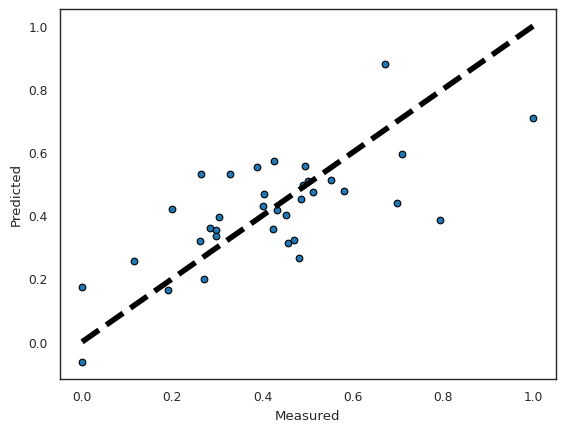

In [742]:
fig, ax = plt.subplots()
ax.scatter(y_train, y_pred, edgecolors=(0, 0, 0))
ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

Elasticity Analysis


<Axes: xlabel='elasticity', ylabel='feature'>

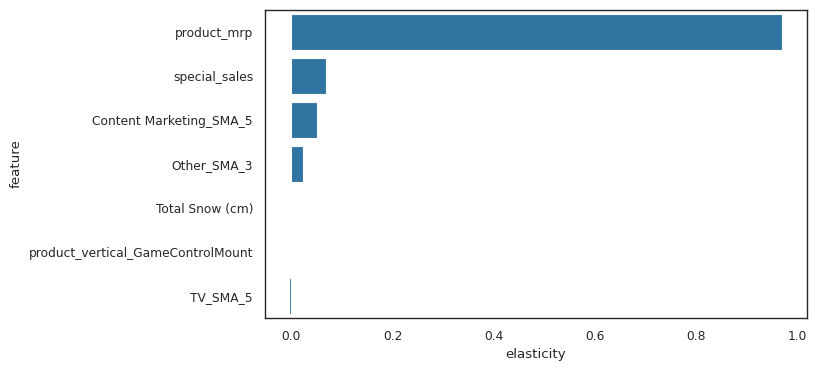

In [743]:
coefficients_df = pd.DataFrame(pd.DataFrame(lr.params)[1:]).reset_index()
coefficients_df.columns = ['feature','coefficient']
elasticity_data = calculateElasticity(X_train_rfe, y_train, coefficients_df)

plt.figure(figsize = (7,4))
sns.barplot(x = 'elasticity',y ='feature',data = elasticity_data.sort_values('elasticity', ascending = False))

##Home Audio - Kyock's Model


In [744]:
# adding lag variable in the camera data set
df = createKyockKPI(home_koy_df)
df.head()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,order_payment_type_Prepaid,is_mass_market,special_sales,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_mrp,product_vertical_SoundMixer,product_vertical_VoiceRecorder,pay_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),gmv_lag
26,1185712.00,30.67,0.00,0.00,7.00,1.95,213,793,0,24,1,334,8,541,1958.61,0,2,0,0,4.26,0.00,0.00,4.26,4.26,0.05,0.00,0.00,0.05,0.05,0.63,0.00,0.00,0.63,0.63,1.85,0.00,0.00,1.85,1.85,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.33,0.14,0.00,0.00,0.14,0.14,1.26,0.00,0.00,1.26,1.26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,28.00,12.50,20.10,0.28,2.38,4.42,0.00,4.42,0.00,0.00
27,1471962.00,30.37,0.00,0.00,6.71,1.78,243,936,297,36,0,374,19,657,2016.77,0,7,1,0,4.26,0.00,0.00,4.26,6.82,0.05,0.00,0.00,0.05,0.09,0.63,0.00,0.00,0.63,1.01,1.85,0.00,0.00,1.85,2.97,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.53,0.14,0.00,0.00,0.14,0.22,1.26,0.00,0.00,1.26,2.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,33.00,11.00,23.18,0.00,5.18,1.40,0.00,1.40,0.00,1185712.00
28,1275392.00,28.88,0.00,0.00,6.82,1.80,191,909,0,40,0,394,16,544,1896.30,0,1,0,0,4.26,4.26,0.00,4.26,8.36,0.05,0.05,0.00,0.05,0.11,0.63,0.63,0.00,0.63,1.24,1.85,1.85,0.00,1.85,3.63,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.65,0.14,0.14,0.00,0.14,0.27,1.26,1.26,0.00,1.26,2.46,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,31.50,14.50,23.06,0.00,5.06,1.08,0.00,1.08,0.00,1471962.00
29,920394.00,28.04,0.00,0.00,6.83,1.76,145,650,0,39,0,281,6,388,1919.25,0,0,1,0,4.26,4.26,0.00,4.26,9.28,0.05,0.05,0.00,0.05,0.12,0.63,0.63,0.00,0.63,1.38,1.85,1.85,0.00,1.85,4.03,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.72,0.14,0.14,0.00,0.14,0.30,1.26,1.26,0.00,1.26,2.73,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,33.50,16.00,24.57,0.00,6.57,4.63,0.00,4.63,0.00,1275392.00
30,2599.00,16.13,0.00,0.00,9.00,2.00,1,0,0,0,0,0,0,1,3099.00,0,0,0,0,1.01,3.18,3.61,3.54,6.58,0.00,0.04,0.04,0.04,0.07,0.26,0.51,0.56,0.55,1.08,0.21,1.31,1.53,1.49,2.63,0.00,0.00,0.00,0.00,0.00,0.03,0.23,0.27,0.26,0.46,0.01,0.10,0.11,0.11,0.19,0.50,1.01,1.11,1.09,2.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,59.99,56.40,55.68,1206.00,1186.67,1182.80,28.50,15.00,21.65,0.00,3.65,0.35,0.00,0.35,0.00,920394.00


In [745]:
df.shape

(48, 85)

In [746]:
#Test-train split
df_train, df_test = train_test_split(df, train_size = 0.7, test_size = 0.3, random_state = 100)

scaler = MinMaxScaler()

In [747]:
df.columns

Index(['gmv', 'Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'order_payment_type_Prepaid', 'is_mass_market', 'special_sales', 'product_vertical_Dock', 'product_vertical_DockingStation', 'product_vertical_FMRadio', 'product_vertical_HiFiSystem', 'product_vertical_HomeAudioSpeaker', 'product_mrp', 'product_vertical_SoundMixer', 'product_vertical_VoiceRecorder', 'pay_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship', 'Sponsorship_SMA_3', 'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', 'Content Marketing_SMA_3', 'Content Marketing_SMA_5', 'Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock', 'Online marketing', 'Online marketing_SMA_3', 'Online marketing_SMA_5',
    

In [748]:
num_vars=['gmv', 'Discount%', 'deliverybdays', 'deliverycdays', 'sla', 'product_procurement_sla', 'order_payment_type_Prepaid', 'is_mass_market', 'special_sales', 'product_vertical_Dock', 'product_vertical_DockingStation', 'product_vertical_FMRadio', 'product_vertical_HiFiSystem', 'product_vertical_HomeAudioSpeaker', 'product_mrp', 'product_vertical_SoundMixer', 'product_vertical_VoiceRecorder', 'pay_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', 'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship', 'Sponsorship_SMA_3', 'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', 'Content Marketing_SMA_3', 'Content Marketing_SMA_5', 'Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock', 'Online marketing', 'Online marketing_SMA_3', 'Online marketing_SMA_5',
       'Online marketing_EMA_8', 'Online_marketing_Ad_Stock', 'Affiliates', 'Affiliates_SMA_3', 'Affiliates_SMA_5', 'Affiliates_EMA_8', 'Affiliates_Ad_Stock', 'SEM', 'SEM_SMA_3', 'SEM_SMA_5', 'SEM_EMA_8', 'SEM_Ad_Stock', 'Radio', 'Radio_SMA_3', 'Radio_SMA_5', 'Radio_EMA_8', 'Radio_Ad_Stock', 'Other', 'Other_SMA_3', 'Other_SMA_5', 'Other_EMA_8', 'Other_Ad_Stock', 'NPS', 'NPS_SMA_3', 'NPS_SMA_5', 'Stock Index', 'Stock Index_SMA_3', 'Stock Index_SMA_5', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)', 'gmv_lag']
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_test[num_vars] = scaler.fit_transform(df_test[num_vars])

In [749]:
y_train = df_train.pop('gmv')
X_train = df_train

In [750]:
# Running RFE for selecting top 20 features
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=20)             # running RFE
rfe = rfe.fit(X_train, y_train)

In [751]:
# selecting the features given by rfe
col = X_train.columns[rfe.support_]
col

Index(['sla', 'product_vertical_FMRadio', 'product_vertical_HiFiSystem', 'product_vertical_HomeAudioSpeaker', 'product_mrp', 'product_vertical_VoiceRecorder', 'Total Investment_SMA_5', 'Digital', 'Digital_SMA_3', 'Sponsorship', 'Sponsorship_SMA_5', 'Content Marketing_SMA_3', 'Content Marketing_SMA_5', 'Online marketing', 'Online marketing_SMA_3', 'Online marketing_SMA_5', 'Affiliates_SMA_5', 'Radio_EMA_8', 'Stock Index_SMA_5', 'Max Temp'], dtype='object')

In [752]:
# neglecting features not selected by rfe
X_train.columns[~rfe.support_]

Index(['Discount%', 'deliverybdays', 'deliverycdays', 'product_procurement_sla', 'order_payment_type_Prepaid', 'is_mass_market', 'special_sales', 'product_vertical_Dock', 'product_vertical_DockingStation', 'product_vertical_SoundMixer', 'pay_week', 'holiday_week', 'Total Investment', 'Total Investment_SMA_3', 'Total Investment_EMA_8', 'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship_SMA_3', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', 'Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock', 'Online marketing_EMA_8', 'Online_marketing_Ad_Stock', 'Affiliates', 'Affiliates_SMA_3', 'Affiliates_EMA_8', 'Affiliates_Ad_Stock', 'SEM', 'SEM_SMA_3', 'SEM_SMA_5', 'SEM_EMA_8', 'SEM_Ad_Stock', 'Radio', 'Radio_SMA_3', 'Radio_SMA_5', 'Radio_Ad_Stock', 'Other', 'Other_SMA_3', 'Other_SMA_5', 'Other_EMA_8', 'Other_Ad_Stock', 'NPS', 'NPS_SMA_3', 'NPS_SMA_5', 'Stock Index',
       '

In [753]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [754]:
# Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     811.1
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           8.12e-16
Time:                        17:17:57   Log-Likelihood:                 127.62
No. Observations:                  33   AIC:                            -213.2
Df Residuals:                      12   BIC:                            -181.8
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
17,Affiliates_SMA_5,2244.11
16,Online marketing_SMA_5,1874.42
7,Total Investment_SMA_5,815.33
0,const,533.57
11,Sponsorship_SMA_5,350.15
13,Content Marketing_SMA_5,173.31
15,Online marketing_SMA_3,132.03
12,Content Marketing_SMA_3,93.72
9,Digital_SMA_3,55.09
14,Online marketing,40.33


In [755]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Online marketing_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     905.0
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.98e-17
Time:                        17:17:57   Log-Likelihood:                 127.27
No. Observations:                  33   AIC:                            -214.5
Df Residuals:                      13   BIC:                            -184.6
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,531.37
7,Total Investment_SMA_5,514.41
11,Sponsorship_SMA_5,221.18
16,Affiliates_SMA_5,168.27
15,Online marketing_SMA_3,127.16
12,Content Marketing_SMA_3,88.42
13,Content Marketing_SMA_5,78.50
9,Digital_SMA_3,41.13
10,Sponsorship,26.32
14,Online marketing,26.22


In [756]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Total Investment_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     257.7
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.41e-14
Time:                        17:17:57   Log-Likelihood:                 104.46
No. Observations:                  33   AIC:                            -170.9
Df Residuals:                      14   BIC:                            -142.5
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,517.48
14,Online marketing_SMA_3,118.34
15,Affiliates_SMA_5,83.92
11,Content Marketing_SMA_3,83.89
12,Content Marketing_SMA_5,35.44
8,Digital_SMA_3,31.87
13,Online marketing,25.86
9,Sponsorship,15.48
5,product_mrp,15.08
2,product_vertical_FMRadio,14.19


In [757]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Radio_EMA_8"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     209.1
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           9.67e-15
Time:                        17:17:57   Log-Likelihood:                 98.955
No. Observations:                  33   AIC:                            -161.9
Df Residuals:                      15   BIC:                            -135.0
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,358.29
14,Online marketing_SMA_3,117.20
15,Affiliates_SMA_5,81.06
11,Content Marketing_SMA_3,67.04
12,Content Marketing_SMA_5,34.80
13,Online marketing,25.11
8,Digital_SMA_3,22.18
9,Sponsorship,14.92
5,product_mrp,14.14
2,product_vertical_FMRadio,13.70


In [758]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Online marketing_SMA_3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     208.5
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.68e-15
Time:                        17:17:57   Log-Likelihood:                 96.847
No. Observations:                  33   AIC:                            -159.7
Df Residuals:                      16   BIC:                            -134.3
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,358.28
11,Content Marketing_SMA_3,37.08
12,Content Marketing_SMA_5,30.56
14,Affiliates_SMA_5,28.18
8,Digital_SMA_3,20.33
13,Online marketing,19.15
9,Sponsorship,13.93
2,product_vertical_FMRadio,13.70
5,product_mrp,13.50
10,Sponsorship_SMA_5,9.71


In [759]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Digital"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     235.9
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.08e-16
Time:                        17:17:57   Log-Likelihood:                 96.818
No. Observations:                  33   AIC:                            -161.6
Df Residuals:                      17   BIC:                            -137.7
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,313.89
10,Content Marketing_SMA_3,32.97
11,Content Marketing_SMA_5,28.48
13,Affiliates_SMA_5,27.65
7,Digital_SMA_3,20.16
12,Online marketing,19.11
2,product_vertical_FMRadio,13.35
5,product_mrp,11.49
9,Sponsorship_SMA_5,9.09
8,Sponsorship,8.44


In [760]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_mrp"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     267.5
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           6.40e-18
Time:                        17:17:57   Log-Likelihood:                 96.812
No. Observations:                  33   AIC:                            -163.6
Df Residuals:                      18   BIC:                            -141.2
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,290.00
9,Content Marketing_SMA_3,32.74
10,Content Marketing_SMA_5,28.38
12,Affiliates_SMA_5,27.36
6,Digital_SMA_3,19.33
11,Online marketing,17.23
8,Sponsorship_SMA_5,9.07
7,Sponsorship,8.44
14,Max Temp,7.50
4,product_vertical_HomeAudioSpeaker,6.74


In [761]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Content Marketing_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     278.0
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           8.27e-19
Time:                        17:17:57   Log-Likelihood:                 95.340
No. Observations:                  33   AIC:                            -162.7
Df Residuals:                      19   BIC:                            -141.7
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,283.22
9,Content Marketing_SMA_3,26.49
11,Affiliates_SMA_5,23.87
6,Digital_SMA_3,18.49
10,Online marketing,15.58
13,Max Temp,7.47
8,Sponsorship_SMA_5,7.03
4,product_vertical_HomeAudioSpeaker,6.73
7,Sponsorship,5.28
2,product_vertical_FMRadio,3.79


In [762]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Affiliates_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     317.0
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.49e-20
Time:                        17:17:57   Log-Likelihood:                 95.340
No. Observations:                  33   AIC:                            -164.7
Df Residuals:                      20   BIC:                            -145.2
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,187.98
9,Content Marketing_SMA_3,25.73
6,Digital_SMA_3,18.47
10,Online marketing,11.58
4,product_vertical_HomeAudioSpeaker,6.42
8,Sponsorship_SMA_5,5.69
12,Max Temp,4.92
2,product_vertical_FMRadio,3.74
7,Sponsorship,3.43
3,product_vertical_HiFiSystem,3.38


In [763]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Sponsorship_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     356.3
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.77e-21
Time:                        17:17:57   Log-Likelihood:                 95.029
No. Observations:                  33   AIC:                            -166.1
Df Residuals:                      21   BIC:                            -148.1
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,182.42
8,Content Marketing_SMA_3,25.72
6,Digital_SMA_3,17.10
9,Online marketing,9.83
4,product_vertical_HomeAudioSpeaker,6.20
11,Max Temp,4.60
3,product_vertical_HiFiSystem,3.38
7,Sponsorship,3.38
2,product_vertical_FMRadio,3.30
10,Stock Index_SMA_5,2.58


In [764]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Stock Index_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     379.5
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.12e-22
Time:                        17:17:57   Log-Likelihood:                 93.738
No. Observations:                  33   AIC:                            -165.5
Df Residuals:                      22   BIC:                            -149.0
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,151.64
8,Content Marketing_SMA_3,24.40
6,Digital_SMA_3,16.62
9,Online marketing,9.54
4,product_vertical_HomeAudioSpeaker,4.98
10,Max Temp,4.55
7,Sponsorship,3.37
3,product_vertical_HiFiSystem,3.34
2,product_vertical_FMRadio,3.30
5,product_vertical_VoiceRecorder,1.93


In [765]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Digital_SMA_3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     380.4
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           7.69e-23
Time:                        17:17:57   Log-Likelihood:                 91.318
No. Observations:                  33   AIC:                            -162.6
Df Residuals:                      23   BIC:                            -147.7
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,122.45
8,Online marketing,5.99
9,Max Temp,4.34
4,product_vertical_HomeAudioSpeaker,4.22
2,product_vertical_FMRadio,3.30
6,Sponsorship,2.89
3,product_vertical_HiFiSystem,2.76
7,Content Marketing_SMA_3,2.60
5,product_vertical_VoiceRecorder,1.92
1,sla,1.70


In [766]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Sponsorship"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     402.7
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.19e-23
Time:                        17:17:58   Log-Likelihood:                 89.624
No. Observations:                  33   AIC:                            -161.2
Df Residuals:                      24   BIC:                            -147.8
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,94.40
4,product_vertical_HomeAudioSpeaker,4.22
7,Online marketing,3.41
8,Max Temp,3.15
2,product_vertical_FMRadio,3.06
3,product_vertical_HiFiSystem,2.75
6,Content Marketing_SMA_3,2.60
5,product_vertical_VoiceRecorder,1.82
1,sla,1.57


In [767]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Max Temp"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     450.9
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.11e-24
Time:                        17:17:58   Log-Likelihood:                 88.621
No. Observations:                  33   AIC:                            -161.2
Df Residuals:                      25   BIC:                            -149.3
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,26.55
4,product_vertical_HomeAudioSpeaker,3.50
3,product_vertical_HiFiSystem,2.74
6,Content Marketing_SMA_3,2.49
2,product_vertical_FMRadio,2.41
7,Online marketing,1.88
5,product_vertical_VoiceRecorder,1.74
1,sla,1.20


In [768]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Content Marketing_SMA_3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     492.7
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.74e-25
Time:                        17:17:58   Log-Likelihood:                 86.909
No. Observations:                  33   AIC:                            -159.8
Df Residuals:                      26   BIC:                            -149.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,22.38
4,product_vertical_HomeAudioSpeaker,3.21
3,product_vertical_HiFiSystem,2.33
2,product_vertical_FMRadio,2.09
5,product_vertical_VoiceRecorder,1.39
6,Online marketing,1.21
1,sla,1.18


In [769]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_HiFiSystem"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     579.2
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.44e-26
Time:                        17:17:58   Log-Likelihood:                 85.955
No. Observations:                  33   AIC:                            -159.9
Df Residuals:                      27   BIC:                            -150.9
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,22.12
2,product_vertical_FMRadio,2.09
3,product_vertical_HomeAudioSpeaker,1.99
4,product_vertical_VoiceRecorder,1.37
5,Online marketing,1.21
1,sla,1.17


In [770]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["sla"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     590.2
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.37e-26
Time:                        17:17:58   Log-Likelihood:                 82.026
No. Observations:                  33   AIC:                            -154.1
Df Residuals:                      28   BIC:                            -146.6
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,13.66
1,product_vertical_FMRadio,2.04
2,product_vertical_HomeAudioSpeaker,1.99
4,Online marketing,1.20
3,product_vertical_VoiceRecorder,1.19


In [771]:
X_train_rfe.columns

Index(['product_vertical_FMRadio', 'product_vertical_HomeAudioSpeaker', 'product_vertical_VoiceRecorder', 'Online marketing'], dtype='object')

In [772]:
drop_columns_list = list(set(num_vars) - set(list(X_train_rfe.columns)))
print(drop_columns_list)

['Affiliates_SMA_3', 'deliverybdays', 'Total Investment_EMA_8', 'NPS_SMA_5', 'Heat Deg Days', 'Digital', 'Total_Investment_Ad_Stock', 'Online marketing_EMA_8', 'Snow on Grnd (cm)', 'NPS_SMA_3', 'product_procurement_sla', 'Sponsorship_EMA_8', 'Content Marketing_SMA_5', 'Affiliates_EMA_8', 'Total Investment', 'holiday_week', 'TV_EMA_8', 'SEM_SMA_5', 'Stock Index_SMA_5', 'is_mass_market', 'SEM_EMA_8', 'Discount%', 'Digital_SMA_5', 'Total Precip (mm)', 'SEM_SMA_3', 'order_payment_type_Prepaid', 'SEM_Ad_Stock', 'SEM', 'Other_SMA_5', 'Other_SMA_3', 'Sponsorship', 'special_sales', 'Sponsorship_Ad_Stock', 'Radio_SMA_3', 'Digital_SMA_3', 'Online marketing_SMA_5', 'Stock Index', 'Radio', 'Sponsorship_SMA_3', 'Max Temp', 'Radio_SMA_5', 'Other_Ad_Stock', 'TV_SMA_5', 'Total Investment_SMA_3', 'gmv_lag', 'Online marketing_SMA_3', 'Digital_EMA_8', 'product_vertical_DockingStation', 'Stock Index_SMA_3', 'Content Marketing_SMA_3', 'Total Snow (cm)', 'sla', 'Total Investment_SMA_5', 'Other_EMA_8', 'prod

In [773]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

folds = KFold(n_splits = 10, shuffle = True, random_state = 100)
lm=LinearRegression()
scores = cross_val_score(lm, X_train_rfe, y_train, scoring='r2', cv=folds)
scores

array([0.871315  , 0.98382029, 0.97502082, 0.98585554, 0.75975003,
       0.95856173, 0.8761622 , 0.98188524, 0.9911729 , 0.97023877])

In [774]:
y_pred = cross_val_predict(lm, X_train_rfe, y_train, cv=folds)

In [775]:
mse = mean_squared_error(y_train, y_pred)
r_squared = r2_score(y_train, y_pred)
print('Mean_Squared_Error :' ,mse)
print('r_square_value :',r_squared)

Mean_Squared_Error : 0.0006011872838844346
r_square_value : 0.9826445841567986


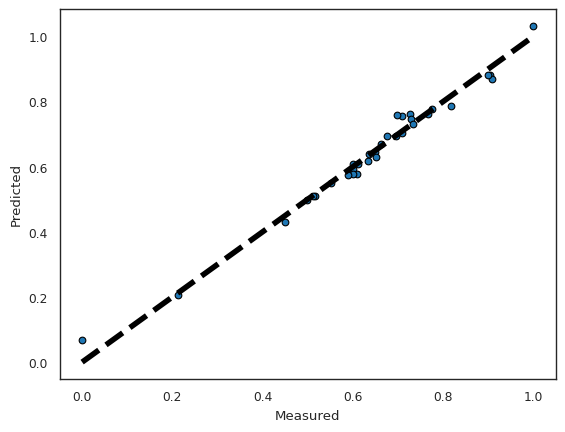

In [776]:
fig, ax = plt.subplots()
ax.scatter(y_train, y_pred, edgecolors=(0, 0, 0))
ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

Elasticity Analysis


<Axes: xlabel='elasticity', ylabel='feature'>

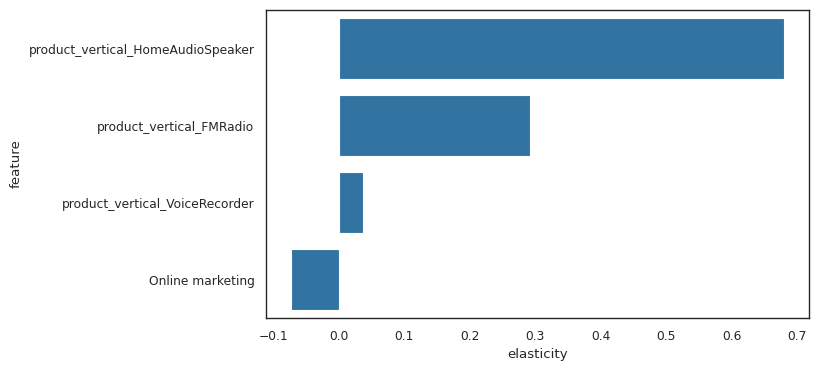

In [777]:
coefficients_df = pd.DataFrame(pd.DataFrame(lr.params)[1:]).reset_index()
coefficients_df.columns = ['feature','coefficient']
elasticity_data = calculateElasticity(X_train_rfe, y_train, coefficients_df)

plt.figure(figsize = (7,4))
sns.barplot(x = 'elasticity',y ='feature',data = elasticity_data.sort_values('elasticity', ascending = False))

#Distributed Lag Model (Additive)


*The Distributive Lag Model(Additive) helped us capture the not only the current, but also the carry-over effect of all the variables(depedent and independent).

Yt = α+ µ1Yt-1 + µ2Yt-2 + µ3Yt-3 + .... + β1X1t + β1X1t-1 + β1X1t-2 + .... + β2X2t + β2X2t-1 + β2X2t-2 + ....+ β3X3t + β3X3t-1 + β3X3t-2 + ....+ β4X4t + β4X4t-1 + β4X4t-2 + ....+ β5X5t + β5X5t-1 + β5X5t-2 + ....+ ϵ*


In [778]:
# Making copy of dataframes from the original ones
cam_dis_df = Camera_accessory_org_df.copy()
gam_dis_df = gaming_accessory_org_df.copy()
home_dis_df = Homeaudio_org_df.copy()
home_dis_df.head()


,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,order_payment_type_Prepaid,is_mass_market,special_sales,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_mrp,product_vertical_SoundMixer,product_vertical_VoiceRecorder,pay_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
26,1185712.00,30.67,0.00,0.00,7.00,1.95,213,793,0,24,1,334,8,541,1958.61,0,2,0,0,4.26,0.00,0.00,4.26,4.26,0.05,0.00,0.00,0.05,0.05,0.63,0.00,0.00,0.63,0.63,1.85,0.00,0.00,1.85,1.85,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.33,0.14,0.00,0.00,0.14,0.14,1.26,0.00,0.00,1.26,1.26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,28.00,12.50,20.10,0.28,2.38,4.42,0.00,4.42,0.00
27,1471962.00,30.37,0.00,0.00,6.71,1.78,243,936,297,36,0,374,19,657,2016.77,0,7,1,0,4.26,0.00,0.00,4.26,6.82,0.05,0.00,0.00,0.05,0.09,0.63,0.00,0.00,0.63,1.01,1.85,0.00,0.00,1.85,2.97,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.53,0.14,0.00,0.00,0.14,0.22,1.26,0.00,0.00,1.26,2.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,33.00,11.00,23.18,0.00,5.18,1.40,0.00,1.40,0.00
28,1275392.00,28.88,0.00,0.00,6.82,1.80,191,909,0,40,0,394,16,544,1896.30,0,1,0,0,4.26,4.26,0.00,4.26,8.36,0.05,0.05,0.00,0.05,0.11,0.63,0.63,0.00,0.63,1.24,1.85,1.85,0.00,1.85,3.63,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.65,0.14,0.14,0.00,0.14,0.27,1.26,1.26,0.00,1.26,2.46,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,31.50,14.50,23.06,0.00,5.06,1.08,0.00,1.08,0.00
29,920394.00,28.04,0.00,0.00,6.83,1.76,145,650,0,39,0,281,6,388,1919.25,0,0,1,0,4.26,4.26,0.00,4.26,9.28,0.05,0.05,0.00,0.05,0.12,0.63,0.63,0.00,0.63,1.38,1.85,1.85,0.00,1.85,4.03,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.72,0.14,0.14,0.00,0.14,0.30,1.26,1.26,0.00,1.26,2.73,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,33.50,16.00,24.57,0.00,6.57,4.63,0.00,4.63,0.00
30,2599.00,16.13,0.00,0.00,9.00,2.00,1,0,0,0,0,0,0,1,3099.00,0,0,0,0,1.01,3.18,3.61,3.54,6.58,0.00,0.04,0.04,0.04,0.07,0.26,0.51,0.56,0.55,1.08,0.21,1.31,1.53,1.49,2.63,0.00,0.00,0.00,0.00,0.00,0.03,0.23,0.27,0.26,0.46,0.01,0.10,0.11,0.11,0.19,0.50,1.01,1.11,1.09,2.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,59.99,56.40,55.68,1206.00,1186.67,1182.80,28.50,15.00,21.65,0.00,3.65,0.35,0.00,0.35,0.00


In [779]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(home_dis_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(home_dis_df.isnull().sum()/home_dis_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
gmv,0,0.00
Affiliates_Ad_Stock,0,0.00
Radio_SMA_5,0,0.00
Radio_SMA_3,0,0.00
Radio,0,0.00


In [780]:
cam_dis_df.head()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,product_mrp,order_payment_type_Prepaid,is_mass_market,product_vertical_CameraAccessory,special_sales,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Telescope,pay_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
26,1088715.00,45.59,0.00,0.00,6.36,2.08,1143.14,566,1734,39,0,260,349,167,7,0,0,0,0,3,70,349,0,164,8,0,263,0,0,13,4,0,0,4.26,0.00,0.00,4.26,4.26,0.05,0.00,0.00,0.05,0.05,0.63,0.00,0.00,0.63,0.63,1.85,0.00,0.00,1.85,1.85,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.33,0.14,0.00,0.00,0.14,0.14,1.26,0.00,0.00,1.26,1.26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,28.00,12.50,20.10,0.28,2.38,4.42,0.00,4.42,0.00
27,1203752.00,47.02,0.00,0.00,6.06,2.10,1197.19,649,2005,31,578,284,428,179,4,0,0,0,0,10,85,408,0,142,11,0,293,0,0,22,15,1,0,4.26,0.00,0.00,4.26,6.82,0.05,0.00,0.00,0.05,0.09,0.63,0.00,0.00,0.63,1.01,1.85,0.00,0.00,1.85,2.97,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.53,0.14,0.00,0.00,0.14,0.22,1.26,0.00,0.00,1.26,2.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,33.00,11.00,23.18,0.00,5.18,1.40,0.00,1.40,0.00
28,1183338.00,44.83,0.00,0.00,6.17,2.12,1162.70,606,1991,43,0,223,455,218,4,0,0,0,0,7,68,370,0,148,7,0,325,0,0,21,23,0,0,4.26,4.26,0.00,4.26,8.36,0.05,0.05,0.00,0.05,0.11,0.63,0.63,0.00,0.63,1.24,1.85,1.85,0.00,1.85,3.63,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.65,0.14,0.14,0.00,0.14,0.27,1.26,1.26,0.00,1.26,2.46,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,31.50,14.50,23.06,0.00,5.06,1.08,0.00,1.08,0.00
29,813136.00,44.89,0.00,0.00,6.08,2.14,1161.87,380,1342,39,0,148,296,148,2,0,0,0,0,2,52,297,0,76,9,0,181,0,0,23,11,1,0,4.26,4.26,0.00,4.26,9.28,0.05,0.05,0.00,0.05,0.12,0.63,0.63,0.00,0.63,1.38,1.85,1.85,0.00,1.85,4.03,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.72,0.14,0.14,0.00,0.14,0.30,1.26,1.26,0.00,1.26,2.73,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,33.50,16.00,24.57,0.00,6.57,4.63,0.00,4.63,0.00
30,1399.00,17.26,0.00,0.00,7.67,4.00,716.67,2,3,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1.01,3.18,3.61,3.54,6.58,0.00,0.04,0.04,0.04,0.07,0.26,0.51,0.56,0.55,1.08,0.21,1.31,1.53,1.49,2.63,0.00,0.00,0.00,0.00,0.00,0.03,0.23,0.27,0.26,0.46,0.01,0.10,0.11,0.11,0.19,0.50,1.01,1.11,1.09,2.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,59.99,56.40,55.68,1206.00,1186.67,1182.80,28.50,15.00,21.65,0.00

###### Create a new variable which is the Lag of 1 week




In [781]:
GMV_Lag = ['gmv']

In [782]:
def lag_variables(df,var,n):
    for i in var:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_lag'+np.str_(n),value=df[i].shift(n))
    return df

###### Create a new lag(Lag of 3 weeks) variables for the dependent variable (GMV) as well as independent variables

In [783]:
cam_dis_df_columns = cam_dis_df.columns
gam_dis_df_columns = gam_dis_df.columns
home_dis_df_columns = home_dis_df.columns

In [784]:
cam_dis_df = lag_variables(cam_dis_df,cam_dis_df_columns,3)
gam_dis_df = lag_variables(gam_dis_df,gam_dis_df_columns,3)
home_dis_df = lag_variables(home_dis_df,home_dis_df_columns,3)
home_dis_df.head()

,gmv,gmv_lag3,Discount%,Discount%_lag3,deliverybdays,deliverybdays_lag3,deliverycdays,deliverycdays_lag3,sla,sla_lag3,product_procurement_sla,product_procurement_sla_lag3,order_payment_type_Prepaid,order_payment_type_Prepaid_lag3,is_mass_market,is_mass_market_lag3,special_sales,special_sales_lag3,product_vertical_Dock,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag3,product_mrp,product_mrp_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag3,pay_week,pay_week_lag3,holiday_week,holiday_week_lag3,Total Investment,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag3,TV,TV_lag3,TV_SMA_3,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag3,Digital,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag3,Online marketing,Online marketing_lag3,Online marketing_SMA_3,Online marketing_SMA_3_lag3,Online marketing_SMA_5,Online marketing_SMA_5_lag3,Online marketing_EMA_8,Online marketing_EMA_8_lag3,Online_marketing_Ad_Stock,Online_marketing_Ad_Stock_lag3,Affiliates,Affiliates_lag3,Affiliates_SMA_3,Affiliates_SMA_3_lag3,Affiliates_SMA_5,Affiliates_SMA_5_lag3,Affiliates_EMA_8,Affiliates_EMA_8_lag3,Affiliates_Ad_Stock,Affiliates_Ad_Stock_lag3,SEM,SEM_lag3,SEM_SMA_3,SEM_SMA_3_lag3,SEM_SMA_5,SEM_SMA_5_lag3,SEM_EMA_8,SEM_EMA_8_lag3,SEM_Ad_Stock,SEM_Ad_Stock_lag3,Radio,Radio_lag3,Radio_SMA_3,Radio_SMA_3_lag3,Radio_SMA_5,Radio_SMA_5_lag3,Radio_EMA_8,Radio_EMA_8_lag3,Radio_Ad_Stock,Radio_Ad_Stock_lag3,Other,Other_lag3,Other_SMA_3,Other_SMA_3_lag3,Other_SMA_5,Other_SMA_5_lag3,Other_EMA_8,Other_EMA_8_lag3,Other_Ad_Stock,Other_Ad_Stock_lag3,NPS,NPS_lag3,NPS_SMA_3,NPS_SMA_3_lag3,NPS_SMA_5,NPS_SMA_5_lag3,Stock Index,Stock Index_lag3,Stock Index_SMA_3,Stock Index_SMA_3_lag3,Stock Index_SMA_5,Stock Index_SMA_5_lag3,Max Temp,Max Temp_lag3,Min Temp,Min Temp_lag3,Mean Temp,Mean Temp_lag3,Heat Deg Days,Heat Deg Days_lag3,Cool Deg Days,Cool Deg Days_lag3,Total Rain (mm),Total Rain (mm)_lag3,Total Snow (cm),Total Snow (cm)_lag3,Total Precip (mm),Total Precip (mm)_lag3,Snow on Grnd (cm),Snow on Grnd (cm)_lag3
26,1185712.00,NaN,30.67,NaN,0.00,NaN,0.00,NaN,7.00,NaN,1.95,NaN,213,NaN,793,NaN,0,NaN,24,NaN,1,NaN,334,NaN,8,NaN,541,NaN,1958.61,NaN,0,NaN,2,NaN,0,NaN,0,NaN,4.26,NaN,0.00,NaN,0.00,NaN,4.26,NaN,4.26,NaN,0.05,NaN,0.00,NaN,0.00,NaN,0.05,NaN,0.05,NaN,0.63,NaN,0.00,NaN,0.00,NaN,0.63,NaN,0.63,NaN,1.85,NaN,0.00,NaN,0.00,NaN,1.85,NaN,1.85,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.33,NaN,0.00,NaN,0.00,NaN,0.33,NaN,0.33,NaN,0.14,NaN,0.00,NaN,0.00,NaN,0.14,NaN,0.14,NaN,1.26,NaN,0.00,NaN,0.00,NaN,1.26,NaN,1.26,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,54.60,None,0.00,NaN,0.00,NaN,1177.00,None,0.00,NaN,0.00,NaN,28.00,NaN,12.50,NaN,20.10,NaN,0.28,NaN,2.38,NaN,4.42,NaN,0.00,NaN,4.42,NaN,0.00,NaN
27,1471962.00,NaN,30.37,NaN,0.00,NaN,0.00,NaN,6.71,NaN,1.78,NaN,243,NaN,936,NaN,297,NaN,36,NaN,0,NaN,374,NaN,19,NaN,657,NaN,2016.77,NaN,0,NaN,7,NaN,1,NaN,0,

###### Create a new lag(Lag of 2 weeks) variables for the dependent variable (GMV) as well as independent variables

In [785]:
cam_dis_df = lag_variables(cam_dis_df,cam_dis_df_columns,2)
gam_dis_df = lag_variables(gam_dis_df,gam_dis_df_columns,2)
home_dis_df = lag_variables(home_dis_df,home_dis_df_columns,2)
home_dis_df.head()

,gmv,gmv_lag2,gmv_lag3,Discount%,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag2,product_procurement_sla_lag3,order_payment_type_Prepaid,order_payment_type_Prepaid_lag2,order_payment_type_Prepaid_lag3,is_mass_market,is_mass_market_lag2,is_mass_market_lag3,special_sales,special_sales_lag2,special_sales_lag3,product_vertical_Dock,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_mrp,product_mrp_lag2,product_mrp_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,pay_week,pay_week_lag2,pay_week_lag3,holiday_week,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online marketing,Online marketing_lag2,Online marketing_lag3,Online marketing_SMA_3,Online marketing_SMA_3_lag2,Online marketing_SMA_3_lag3,Online marketing_SMA_5,Online marketing_SMA_5_lag2,Online marketing_SMA_5_lag3,Online marketing_EMA_8,Online marketing_EMA_8_lag2,Online marketing_EMA_8_lag3,Online_marketing_Ad_Stock,Online_marketing_Ad_Stock_lag2,Online_marketing_Ad_Stock_lag3,Affiliates,Affiliates_lag2,Affiliates_lag3,Affiliates_SMA_3,Affiliates_SMA_3_lag2,Affiliates_SMA_3_lag3,Affiliates_SMA_5,Affiliates_SMA_5_lag2,Affiliates_SMA_5_lag3,Affiliates_EMA_8,Affiliates_EMA_8_lag2,Affiliates_EMA_8_lag3,Affiliates_Ad_Stock,Affiliates_Ad_Stock_lag2,Affiliates_Ad_Stock_lag3,SEM,SEM_lag2,SEM_lag3,SEM_SMA_3,SEM_SMA_3_lag2,SEM_SMA_3_lag3,SEM_SMA_5,SEM_SMA_5_lag2,SEM_SMA_5_lag3,SEM_EMA_8,SEM_EMA_8_lag2,SEM_EMA_8_lag3,SEM_Ad_Stock,SEM_Ad_Stock_lag2,SEM_Ad_Stock_lag3,Radio,Radio_lag2,Radio_lag3,Radio_SMA_3,Radio_SMA_3_lag2,Radio_SMA_3_lag3,Radio_SMA_5,Radio_SMA_5_lag2,Radio_SMA_5_lag3,Radio_EMA_8,Radio_EMA_8_lag2,Radio_EMA_8_lag3,Radio_Ad_Stock,Radio_Ad_Stock_lag2,Radio_Ad_Stock_lag3,Other,Other_lag2,Other_lag3,Other_SMA_3,Other_SMA_3_lag2,Other_SMA_3_lag3,Other_SMA_5,Other_SMA_5_lag2,Other_S

##### Create new lag(Lag of 1 week) variables

In [786]:
cam_dis_df = lag_variables(cam_dis_df,cam_dis_df_columns,1)
gam_dis_df = lag_variables(gam_dis_df,gam_dis_df_columns,1)
home_dis_df = lag_variables(home_dis_df,home_dis_df_columns,1)
home_dis_df.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,order_payment_type_Prepaid,order_payment_type_Prepaid_lag1,order_payment_type_Prepaid_lag2,order_payment_type_Prepaid_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,special_sales,special_sales_lag1,special_sales_lag2,special_sales_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,pay_week,pay_week_lag1,pay_week_lag2,pay_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online marketing,Online marketing_lag1,Online marketing_lag2,Online marketing_lag3,Online marketing_SMA_3,Online marketing_SMA_3_lag1,Online marketing_SMA_3_lag2,Online marketing_SMA_3_lag3,Online ma

Impute null values with 0

In [787]:
# Imputing all null values with 0
cam_dis_df.fillna(value=0, inplace=True)
gam_dis_df.fillna(value=0, inplace=True)
home_dis_df.fillna(value=0, inplace=True)
home_dis_df.head(10)

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,order_payment_type_Prepaid,order_payment_type_Prepaid_lag1,order_payment_type_Prepaid_lag2,order_payment_type_Prepaid_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,special_sales,special_sales_lag1,special_sales_lag2,special_sales_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,pay_week,pay_week_lag1,pay_week_lag2,pay_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online marketing,Online marketing_lag1,Online marketing_lag2,Online marketing_lag3,Online marketing_SMA_3,Online marketing_SMA_3_lag1,Online marketing_SMA_3_lag2,Online marketing_SMA_3_lag3,Online ma

## Distributed Lag Model(Additive) for Camera Accessory

##### Splitting the Dataframe into Training and Testing Set

In [788]:
# We specify this so that the train and test data set always have the same rows, respectively
df_train, df_test = train_test_split(cam_dis_df, train_size = 0.7, test_size = 0.3, random_state = 100)

Rescaling the Features

In [789]:
scaler = MinMaxScaler()


In [790]:
num_vars=cam_dis_df.columns


In [791]:
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_test[num_vars] = scaler.fit_transform(df_test[num_vars])

In [792]:
y_train = df_train.pop('gmv')
X_train = df_train

In [793]:
# Running RFE for selecting top 20 features
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=20)             # running RFE
rfe = rfe.fit(X_train, y_train)

In [794]:
# selecting the features given by rfe
col = X_train.columns[rfe.support_]
col

Index(['order_payment_type_Prepaid', 'product_vertical_CameraAccessory', 'special_sales_lag1', 'special_sales_lag3', 'product_vertical_CameraBattery', 'product_vertical_CameraBatteryGrip', 'product_vertical_CameraMount', 'product_vertical_CameraTripod', 'product_vertical_ExtensionTube_lag1', 'product_vertical_ExtensionTube_lag2', 'product_vertical_Flash', 'product_vertical_FlashShoeAdapter_lag1', 'product_vertical_Lens', 'product_vertical_Softbox_lag1', 'product_vertical_Telescope', 'Sponsorship_lag1', 'Online marketing_lag2', 'Mean Temp_lag3', 'Cool Deg Days_lag1', 'Snow on Grnd (cm)'], dtype='object')

In [795]:
# neglecting features not selected by rfe
X_train.columns[~rfe.support_]

Index(['gmv_lag1', 'gmv_lag2', 'gmv_lag3', 'Discount%', 'Discount%_lag1', 'Discount%_lag2', 'Discount%_lag3', 'deliverybdays', 'deliverybdays_lag1', 'deliverybdays_lag2',
       ...
       'Total Snow (cm)_lag1', 'Total Snow (cm)_lag2', 'Total Snow (cm)_lag3', 'Total Precip (mm)', 'Total Precip (mm)_lag1', 'Total Precip (mm)_lag2', 'Total Precip (mm)_lag3', 'Snow on Grnd (cm)_lag1', 'Snow on Grnd (cm)_lag2', 'Snow on Grnd (cm)_lag3'], dtype='object', length=371)

In [796]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [797]:
# Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     216.7
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.17e-12
Time:                        17:18:02   Log-Likelihood:                 110.36
No. Observations:                  33   AIC:                            -178.7
Df Residuals:                      12   BIC:                            -147.3
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,93.22
13,product_vertical_Lens,15.49
11,product_vertical_Flash,10.22
15,product_vertical_Telescope,10.13
5,product_vertical_CameraBattery,9.08
7,product_vertical_CameraMount,7.60
17,Online marketing_lag2,6.56
19,Cool Deg Days_lag1,6.48
14,product_vertical_Softbox_lag1,4.66
10,product_vertical_ExtensionTube_lag2,4.60


In [798]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["special_sales_lag3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     238.5
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.68e-13
Time:                        17:18:02   Log-Likelihood:                 109.78
No. Observations:                  33   AIC:                            -179.6
Df Residuals:                      13   BIC:                            -149.6
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,88.62
12,product_vertical_Lens,13.78
14,product_vertical_Telescope,9.17
4,product_vertical_CameraBattery,9.02
10,product_vertical_Flash,8.52
6,product_vertical_CameraMount,7.60
18,Cool Deg Days_lag1,6.15
16,Online marketing_lag2,5.31
13,product_vertical_Softbox_lag1,4.61
9,product_vertical_ExtensionTube_lag2,4.54


In [799]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Snow on Grnd (cm)"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     244.7
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.02e-14
Time:                        17:18:02   Log-Likelihood:                 108.09
No. Observations:                  33   AIC:                            -178.2
Df Residuals:                      14   BIC:                            -149.8
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,85.71
12,product_vertical_Lens,10.35
14,product_vertical_Telescope,9.16
4,product_vertical_CameraBattery,8.99
10,product_vertical_Flash,7.81
6,product_vertical_CameraMount,7.16
18,Cool Deg Days_lag1,5.24
16,Online marketing_lag2,4.59
9,product_vertical_ExtensionTube_lag2,4.54
13,product_vertical_Softbox_lag1,4.22


In [800]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Mean Temp_lag3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     245.7
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.91e-15
Time:                        17:18:02   Log-Likelihood:                 106.09
No. Observations:                  33   AIC:                            -176.2
Df Residuals:                      15   BIC:                            -149.2
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,63.63
12,product_vertical_Lens,10.16
14,product_vertical_Telescope,9.16
4,product_vertical_CameraBattery,8.85
10,product_vertical_Flash,7.80
6,product_vertical_CameraMount,6.63
17,Cool Deg Days_lag1,4.73
9,product_vertical_ExtensionTube_lag2,4.52
16,Online marketing_lag2,4.41
13,product_vertical_Softbox_lag1,4.04


In [801]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_Softbox_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     261.8
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.76e-16
Time:                        17:18:02   Log-Likelihood:                 105.07
No. Observations:                  33   AIC:                            -176.1
Df Residuals:                      16   BIC:                            -150.7
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,53.19
13,product_vertical_Telescope,9.14
4,product_vertical_CameraBattery,8.37
10,product_vertical_Flash,7.48
12,product_vertical_Lens,6.80
6,product_vertical_CameraMount,4.69
9,product_vertical_ExtensionTube_lag2,4.35
15,Online marketing_lag2,4.34
16,Cool Deg Days_lag1,4.07
8,product_vertical_ExtensionTube_lag1,2.87


In [802]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_ExtensionTube_lag2"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     275.3
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.92e-17
Time:                        17:18:02   Log-Likelihood:                 103.84
No. Observations:                  33   AIC:                            -175.7
Df Residuals:                      17   BIC:                            -151.7
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,52.22
12,product_vertical_Telescope,7.86
11,product_vertical_Lens,6.56
4,product_vertical_CameraBattery,5.32
9,product_vertical_Flash,4.83
14,Online marketing_lag2,4.34
6,product_vertical_CameraMount,4.09
15,Cool Deg Days_lag1,4.05
1,order_payment_type_Prepaid,2.59
8,product_vertical_ExtensionTube_lag1,2.59


In [803]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Online marketing_lag2"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     282.8
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.89e-18
Time:                        17:18:02   Log-Likelihood:                 102.21
No. Observations:                  33   AIC:                            -174.4
Df Residuals:                      18   BIC:                            -152.0
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,38.19
12,product_vertical_Telescope,7.10
4,product_vertical_CameraBattery,5.31
11,product_vertical_Lens,5.08
9,product_vertical_Flash,4.38
6,product_vertical_CameraMount,4.08
14,Cool Deg Days_lag1,2.97
1,order_payment_type_Prepaid,2.40
8,product_vertical_ExtensionTube_lag1,2.27
2,product_vertical_CameraAccessory,1.91


In [804]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_Telescope"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     285.0
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           6.54e-19
Time:                        17:18:02   Log-Likelihood:                 100.23
No. Observations:                  33   AIC:                            -172.5
Df Residuals:                      19   BIC:                            -151.5
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,35.58
4,product_vertical_CameraBattery,4.18
6,product_vertical_CameraMount,4.03
11,product_vertical_Lens,3.46
9,product_vertical_Flash,3.27
13,Cool Deg Days_lag1,2.70
1,order_payment_type_Prepaid,2.39
8,product_vertical_ExtensionTube_lag1,2.22
7,product_vertical_CameraTripod,1.88
2,product_vertical_CameraAccessory,1.87


In [805]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_CameraMount"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     281.7
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.45e-19
Time:                        17:18:02   Log-Likelihood:                 97.888
No. Observations:                  33   AIC:                            -169.8
Df Residuals:                      20   BIC:                            -150.3
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,34.58
4,product_vertical_CameraBattery,3.06
8,product_vertical_Flash,2.64
10,product_vertical_Lens,2.59
1,order_payment_type_Prepaid,2.38
12,Cool Deg Days_lag1,2.26
7,product_vertical_ExtensionTube_lag1,2.16
6,product_vertical_CameraTripod,1.88
9,product_vertical_FlashShoeAdapter_lag1,1.76
5,product_vertical_CameraBatteryGrip,1.64


In [806]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_CameraBattery"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.971
Model:                            OLS   Adj. R-squared:                  0.955
Method:                 Least Squares   F-statistic:                     62.97
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.55e-13
Time:                        17:18:02   Log-Likelihood:                 71.322
No. Observations:                  33   AIC:                            -118.6
Df Residuals:                      21   BIC:                            -100.7
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,33.08
9,product_vertical_Lens,2.58
7,product_vertical_Flash,2.51
1,order_payment_type_Prepaid,2.23
11,Cool Deg Days_lag1,2.12
6,product_vertical_ExtensionTube_lag1,1.96
5,product_vertical_CameraTripod,1.87
8,product_vertical_FlashShoeAdapter_lag1,1.71
2,product_vertical_CameraAccessory,1.38
10,Sponsorship_lag1,1.34


In [807]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_ExtensionTube_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.968
Model:                            OLS   Adj. R-squared:                  0.954
Method:                 Least Squares   F-statistic:                     67.35
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.85e-14
Time:                        17:18:03   Log-Likelihood:                 70.129
No. Observations:                  33   AIC:                            -118.3
Df Residuals:                      22   BIC:                            -101.8
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,25.05
6,product_vertical_Flash,2.51
8,product_vertical_Lens,2.19
1,order_payment_type_Prepaid,2.10
7,product_vertical_FlashShoeAdapter_lag1,1.71
5,product_vertical_CameraTripod,1.53
10,Cool Deg Days_lag1,1.48
2,product_vertical_CameraAccessory,1.37
9,Sponsorship_lag1,1.31
4,product_vertical_CameraBatteryGrip,1.25


In [808]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["special_sales_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.966
Model:                            OLS   Adj. R-squared:                  0.953
Method:                 Least Squares   F-statistic:                     73.09
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           8.85e-15
Time:                        17:18:03   Log-Likelihood:                 69.042
No. Observations:                  33   AIC:                            -118.1
Df Residuals:                      23   BIC:                            -103.1
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,24.29
5,product_vertical_Flash,2.50
7,product_vertical_Lens,2.18
1,order_payment_type_Prepaid,2.03
6,product_vertical_FlashShoeAdapter_lag1,1.70
4,product_vertical_CameraTripod,1.51
9,Cool Deg Days_lag1,1.37
2,product_vertical_CameraAccessory,1.36
8,Sponsorship_lag1,1.28
3,product_vertical_CameraBatteryGrip,1.25


In [809]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_FlashShoeAdapter_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.958
Model:                            OLS   Adj. R-squared:                  0.944
Method:                 Least Squares   F-statistic:                     67.88
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.33e-14
Time:                        17:18:03   Log-Likelihood:                 65.323
No. Observations:                  33   AIC:                            -112.6
Df Residuals:                      24   BIC:                            -99.18
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,21.63
5,product_vertical_Flash,2.50
6,product_vertical_Lens,2.01
1,order_payment_type_Prepaid,1.67
4,product_vertical_CameraTripod,1.47
2,product_vertical_CameraAccessory,1.36
8,Cool Deg Days_lag1,1.35
7,Sponsorship_lag1,1.26
3,product_vertical_CameraBatteryGrip,1.25


In [810]:
X_train_rfe.columns

Index(['order_payment_type_Prepaid', 'product_vertical_CameraAccessory', 'product_vertical_CameraBatteryGrip', 'product_vertical_CameraTripod', 'product_vertical_Flash', 'product_vertical_Lens', 'Sponsorship_lag1', 'Cool Deg Days_lag1'], dtype='object')

In [811]:
drop_columns_list = list(set(num_vars) - set(list(X_train_rfe.columns)))
print(drop_columns_list)

['Radio_EMA_8_lag3', 'product_vertical_Lens_lag1', 'Sponsorship_SMA_5_lag2', 'Digital_lag2', 'Online marketing_EMA_8_lag2', 'NPS_SMA_5', 'product_vertical_Filter_lag2', 'product_vertical_ExtensionTube_lag3', 'Online marketing_SMA_3_lag1', 'Cool Deg Days_lag2', 'TV_SMA_5_lag3', 'Max Temp_lag1', 'SEM_lag3', 'Affiliates_EMA_8', 'Total Investment', 'Affiliates_SMA_3_lag2', 'product_vertical_Strap_lag3', 'product_vertical_FlashShoeAdapter_lag2', 'Stock Index_SMA_5', 'Discount%', 'product_vertical_FlashShoeAdapter_lag1', 'Radio_SMA_5_lag2', 'Total Investment_lag2', 'Other_Ad_Stock_lag3', 'product_vertical_CameraBattery', 'Total Investment_SMA_3_lag1', 'Digital_SMA_3_lag2', 'Online marketing', 'SEM', 'Sponsorship_EMA_8_lag2', 'TV_Ad_Stock_lag3', 'Total_Investment_Ad_Stock_lag1', 'Sponsorship_lag3', 'Online marketing_SMA_5', 'Affiliates_SMA_5_lag3', 'Content Marketing_SMA_3_lag1', 'Radio_SMA_5', 'is_mass_market_lag2', 'Total Investment_SMA_5_lag2', 'Digital_SMA_5_lag3', 'Online marketing_SMA_3

In [812]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

folds = KFold(n_splits = 10, shuffle = True, random_state = 100)
lm=LinearRegression()
scores = cross_val_score(lm, X_train_rfe, y_train, scoring='r2', cv=folds)
scores

array([ 0.81584597,  0.98943605,  0.68903073,  0.93134921, -0.50322754,
        0.61014813,  0.93359856,  0.87126182, -2.82860002, -0.28405213])

In [813]:
y_pred = cross_val_predict(lm, X_train_rfe, y_train, cv=folds)

In [814]:
mse = mean_squared_error(y_train, y_pred)
r_squared = r2_score(y_train, y_pred)
print('Mean_Squared_Error :' ,mse)
print('r_square_value :',r_squared)

Mean_Squared_Error : 0.003795962531956267
r_square_value : 0.8561967151642089


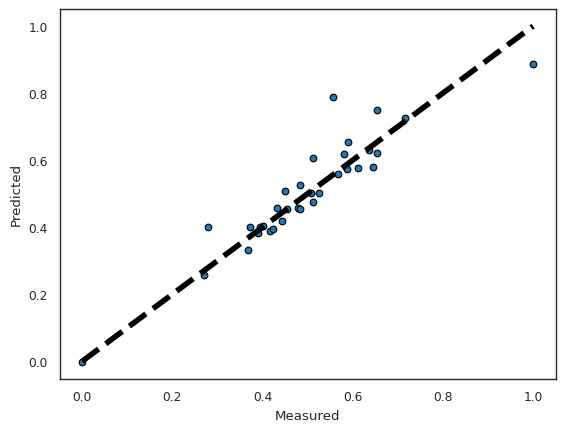

In [815]:
fig, ax = plt.subplots()
ax.scatter(y_train, y_pred, edgecolors=(0, 0, 0))
ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

Elasticity

In [816]:
coefficients_df = pd.DataFrame(pd.DataFrame(lr.params)[1:]).reset_index()
coefficients_df.columns = ['feature','coefficient']
elasticity_data = calculateElasticity(X_train_rfe, y_train, coefficients_df)

<Axes: xlabel='elasticity', ylabel='feature'>

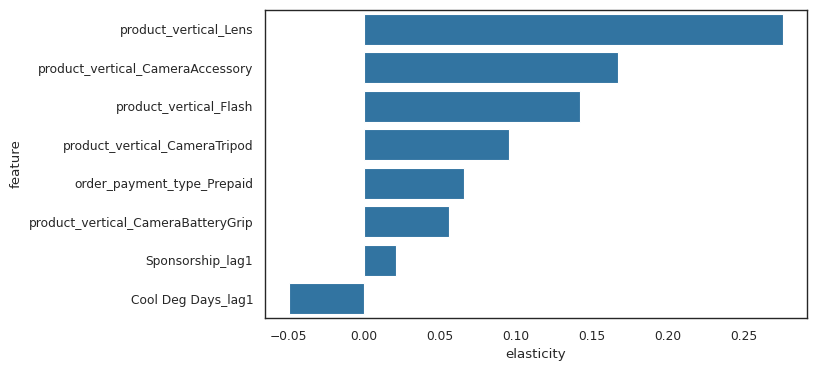

In [817]:
plt.figure(figsize = (7,4))
sns.barplot(x = 'elasticity',y ='feature',data = elasticity_data.sort_values('elasticity', ascending = False))

##Distributed Lag Model(Additive) for Gaming Accessory


Splitting the Dataframe into Training and Testing Set


In [818]:
# We specify this so that the train and test data set always have the same rows, respectively
df_train, df_test = train_test_split(gam_dis_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [819]:
scaler = MinMaxScaler()

In [820]:
num_vars=gam_dis_df.columns

In [821]:
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_test[num_vars] = scaler.fit_transform(df_test[num_vars])

In [822]:
y_train = df_train.pop('gmv')
X_train = df_train

In [823]:
# Running RFE for selecting top 20 features
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=20)             # running RFE
rfe = rfe.fit(X_train, y_train)

In [824]:
# selecting the features given by rfe
col = X_train.columns[rfe.support_]
col

Index(['deliverycdays_lag3', 'order_payment_type_Prepaid', 'product_vertical_GameControlMount', 'product_vertical_GamePad', 'product_mrp', 'special_sales', 'product_vertical_GamingAccessoryKit', 'product_vertical_GamingAdapter', 'product_vertical_GamingChargingStation', 'product_vertical_GamingHeadset', 'product_vertical_GamingMouse', 'product_vertical_GamingMousePad', 'product_vertical_GamingSpeaker_lag2', 'product_vertical_MotionController', 'TV_lag3', 'Digital_lag2', 'Content Marketing_lag1', 'Online marketing_SMA_5_lag1', 'Max Temp_lag1', 'Total Snow (cm)_lag1'], dtype='object')

In [825]:
# neglecting features not selected by rfe
X_train.columns[~rfe.support_]

Index(['gmv_lag1', 'gmv_lag2', 'gmv_lag3', 'Discount%', 'Discount%_lag1', 'Discount%_lag2', 'Discount%_lag3', 'deliverybdays', 'deliverybdays_lag1', 'deliverybdays_lag2',
       ...
       'Total Snow (cm)_lag2', 'Total Snow (cm)_lag3', 'Total Precip (mm)', 'Total Precip (mm)_lag1', 'Total Precip (mm)_lag2', 'Total Precip (mm)_lag3', 'Snow on Grnd (cm)', 'Snow on Grnd (cm)_lag1', 'Snow on Grnd (cm)_lag2', 'Snow on Grnd (cm)_lag3'], dtype='object', length=343)

In [826]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [827]:
# Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     838.0
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.21e-18
Time:                        17:18:10   Log-Likelihood:                 129.83
No. Observations:                  35   AIC:                            -217.7
Df Residuals:                      14   BIC:                            -185.0
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,250.10
18,Online marketing_SMA_5_lag1,43.73
11,product_vertical_GamingMouse,36.04
17,Content Marketing_lag1,33.42
6,special_sales,22.78
19,Max Temp_lag1,17.95
16,Digital_lag2,17.62
1,deliverycdays_lag3,15.94
10,product_vertical_GamingHeadset,15.85
8,product_vertical_GamingAdapter,15.46


In [828]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamingHeadset"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     146.8
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.10e-13
Time:                        17:18:10   Log-Likelihood:                 97.319
No. Observations:                  35   AIC:                            -154.6
Df Residuals:                      15   BIC:                            -123.5
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,191.18
17,Online marketing_SMA_5_lag1,43.62
10,product_vertical_GamingMouse,34.86
16,Content Marketing_lag1,29.55
6,special_sales,21.70
15,Digital_lag2,16.05
8,product_vertical_GamingAdapter,15.46
7,product_vertical_GamingAccessoryKit,14.06
18,Max Temp_lag1,12.44
1,deliverycdays_lag3,9.61


In [829]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Online marketing_SMA_5_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     161.5
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           9.97e-15
Time:                        17:18:10   Log-Likelihood:                 96.918
No. Observations:                  35   AIC:                            -155.8
Df Residuals:                      16   BIC:                            -126.3
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,125.22
10,product_vertical_GamingMouse,30.69
16,Content Marketing_lag1,20.61
6,special_sales,18.18
15,Digital_lag2,13.48
7,product_vertical_GamingAccessoryKit,12.99
8,product_vertical_GamingAdapter,9.96
1,deliverycdays_lag3,8.43
17,Max Temp_lag1,8.32
4,product_vertical_GamePad,6.88


In [830]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["deliverycdays_lag3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.985
Model:                            OLS   Adj. R-squared:                  0.970
Method:                 Least Squares   F-statistic:                     65.68
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.54e-12
Time:                        17:18:10   Log-Likelihood:                 79.280
No. Observations:                  35   AIC:                            -122.6
Df Residuals:                      17   BIC:                            -94.56
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,77.88
9,product_vertical_GamingMouse,21.97
15,Content Marketing_lag1,18.35
5,special_sales,12.89
14,Digital_lag2,12.76
6,product_vertical_GamingAccessoryKit,11.51
7,product_vertical_GamingAdapter,9.29
10,product_vertical_GamingMousePad,6.53
3,product_vertical_GamePad,6.25
16,Max Temp_lag1,6.08


In [831]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamingMouse"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.970
Model:                            OLS   Adj. R-squared:                  0.944
Method:                 Least Squares   F-statistic:                     36.81
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.68e-10
Time:                        17:18:10   Log-Likelihood:                 67.347
No. Observations:                  35   AIC:                            -100.7
Df Residuals:                      18   BIC:                            -74.25
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,64.95
14,Content Marketing_lag1,12.93
13,Digital_lag2,10.22
7,product_vertical_GamingAdapter,7.48
6,product_vertical_GamingAccessoryKit,7.33
9,product_vertical_GamingMousePad,6.53
3,product_vertical_GamePad,5.62
5,special_sales,5.49
15,Max Temp_lag1,4.93
12,TV_lag3,4.51


In [832]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamingAdapter"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.968
Model:                            OLS   Adj. R-squared:                  0.943
Method:                 Least Squares   F-statistic:                     38.56
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.85e-11
Time:                        17:18:10   Log-Likelihood:                 66.122
No. Observations:                  35   AIC:                            -100.2
Df Residuals:                      19   BIC:                            -75.36
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,56.09
13,Content Marketing_lag1,12.75
12,Digital_lag2,10.06
8,product_vertical_GamingMousePad,6.44
3,product_vertical_GamePad,5.59
5,special_sales,5.42
6,product_vertical_GamingAccessoryKit,5.42
11,TV_lag3,4.43
14,Max Temp_lag1,3.94
1,order_payment_type_Prepaid,3.65


In [833]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamePad"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.968
Model:                            OLS   Adj. R-squared:                  0.946
Method:                 Least Squares   F-statistic:                     43.35
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           7.33e-12
Time:                        17:18:10   Log-Likelihood:                 66.071
No. Observations:                  35   AIC:                            -102.1
Df Residuals:                      20   BIC:                            -78.81
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,44.84
12,Content Marketing_lag1,12.25
11,Digital_lag2,9.31
7,product_vertical_GamingMousePad,6.42
4,special_sales,5.36
13,Max Temp_lag1,3.67
5,product_vertical_GamingAccessoryKit,3.29
10,TV_lag3,3.24
3,product_mrp,2.92
6,product_vertical_GamingChargingStation,2.76


In [834]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Content Marketing_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.948
Model:                            OLS   Adj. R-squared:                  0.916
Method:                 Least Squares   F-statistic:                     29.58
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.47e-10
Time:                        17:18:10   Log-Likelihood:                 57.595
No. Observations:                  35   AIC:                            -87.19
Df Residuals:                      21   BIC:                            -65.42
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,44.74
7,product_vertical_GamingMousePad,6.28
12,Max Temp_lag1,3.52
5,product_vertical_GamingAccessoryKit,3.26
4,special_sales,3.10
10,TV_lag3,3.07
3,product_mrp,2.87
6,product_vertical_GamingChargingStation,2.70
1,order_payment_type_Prepaid,2.44
11,Digital_lag2,1.97


In [835]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Digital_lag2"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.948
Model:                            OLS   Adj. R-squared:                  0.920
Method:                 Least Squares   F-statistic:                     33.46
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.54e-11
Time:                        17:18:10   Log-Likelihood:                 57.538
No. Observations:                  35   AIC:                            -89.08
Df Residuals:                      22   BIC:                            -68.86
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,44.15
7,product_vertical_GamingMousePad,4.80
11,Max Temp_lag1,3.50
4,special_sales,2.84
6,product_vertical_GamingChargingStation,2.70
3,product_mrp,2.54
5,product_vertical_GamingAccessoryKit,2.49
10,TV_lag3,2.41
1,order_payment_type_Prepaid,2.37
9,product_vertical_MotionController,1.84


In [836]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamingMousePad"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.947
Model:                            OLS   Adj. R-squared:                  0.921
Method:                 Least Squares   F-statistic:                     36.99
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           5.53e-12
Time:                        17:18:10   Log-Likelihood:                 57.022
No. Observations:                  35   AIC:                            -90.04
Df Residuals:                      23   BIC:                            -71.38
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,43.65
10,Max Temp_lag1,3.50
6,product_vertical_GamingChargingStation,2.51
3,product_mrp,2.48
9,TV_lag3,2.40
5,product_vertical_GamingAccessoryKit,1.98
1,order_payment_type_Prepaid,1.97
8,product_vertical_MotionController,1.80
7,product_vertical_GamingSpeaker_lag2,1.69
4,special_sales,1.51


In [837]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamingChargingStation"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.945
Model:                            OLS   Adj. R-squared:                  0.922
Method:                 Least Squares   F-statistic:                     41.17
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.15e-12
Time:                        17:18:10   Log-Likelihood:                 56.511
No. Observations:                  35   AIC:                            -91.02
Df Residuals:                      24   BIC:                            -73.91
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,32.29
3,product_mrp,2.44
8,TV_lag3,2.39
9,Max Temp_lag1,1.95
5,product_vertical_GamingAccessoryKit,1.84
1,order_payment_type_Prepaid,1.83
7,product_vertical_MotionController,1.75
6,product_vertical_GamingSpeaker_lag2,1.59
4,special_sales,1.49
10,Total Snow (cm)_lag1,1.20


In [838]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GameControlMount"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.945
Model:                            OLS   Adj. R-squared:                  0.925
Method:                 Least Squares   F-statistic:                     47.53
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.65e-13
Time:                        17:18:10   Log-Likelihood:                 56.471
No. Observations:                  35   AIC:                            -92.94
Df Residuals:                      25   BIC:                            -77.39
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,32.13
2,product_mrp,2.41
7,TV_lag3,2.37
8,Max Temp_lag1,1.93
4,product_vertical_GamingAccessoryKit,1.84
1,order_payment_type_Prepaid,1.83
6,product_vertical_MotionController,1.72
5,product_vertical_GamingSpeaker_lag2,1.58
3,special_sales,1.49
9,Total Snow (cm)_lag1,1.18


In [839]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Max Temp_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.904
Model:                            OLS   Adj. R-squared:                  0.875
Method:                 Least Squares   F-statistic:                     30.71
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.39e-11
Time:                        17:18:11   Log-Likelihood:                 46.847
No. Observations:                  35   AIC:                            -75.69
Df Residuals:                      26   BIC:                            -61.70
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,12.76
2,product_mrp,2.28
7,TV_lag3,1.93
4,product_vertical_GamingAccessoryKit,1.82
1,order_payment_type_Prepaid,1.74
6,product_vertical_MotionController,1.72
5,product_vertical_GamingSpeaker_lag2,1.47
3,special_sales,1.46
8,Total Snow (cm)_lag1,1.06


In [840]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamingSpeaker_lag2"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.895
Model:                            OLS   Adj. R-squared:                  0.868
Method:                 Least Squares   F-statistic:                     33.00
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.23e-11
Time:                        17:18:11   Log-Likelihood:                 45.281
No. Observations:                  35   AIC:                            -74.56
Df Residuals:                      27   BIC:                            -62.12
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,12.07
2,product_mrp,1.98
4,product_vertical_GamingAccessoryKit,1.81
1,order_payment_type_Prepaid,1.73
5,product_vertical_MotionController,1.72
6,TV_lag3,1.72
3,special_sales,1.42
7,Total Snow (cm)_lag1,1.05


In [841]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["TV_lag3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.894
Model:                            OLS   Adj. R-squared:                  0.872
Method:                 Least Squares   F-statistic:                     39.50
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.11e-12
Time:                        17:18:11   Log-Likelihood:                 45.113
No. Observations:                  35   AIC:                            -76.23
Df Residuals:                      28   BIC:                            -65.34
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,11.87
2,product_mrp,1.84
4,product_vertical_GamingAccessoryKit,1.81
1,order_payment_type_Prepaid,1.43
5,product_vertical_MotionController,1.42
3,special_sales,1.40
6,Total Snow (cm)_lag1,1.05


In [842]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_MotionController"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.884
Model:                            OLS   Adj. R-squared:                  0.865
Method:                 Least Squares   F-statistic:                     44.39
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.02e-12
Time:                        17:18:11   Log-Likelihood:                 43.546
No. Observations:                  35   AIC:                            -75.09
Df Residuals:                      29   BIC:                            -65.76
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,11.86
4,product_vertical_GamingAccessoryKit,1.75
2,product_mrp,1.70
1,order_payment_type_Prepaid,1.40
3,special_sales,1.25
5,Total Snow (cm)_lag1,1.04


In [843]:
X_train_rfe.columns

Index(['order_payment_type_Prepaid', 'product_mrp', 'special_sales', 'product_vertical_GamingAccessoryKit', 'Total Snow (cm)_lag1'], dtype='object')

In [844]:
drop_columns_list = list(set(num_vars) - set(list(X_train_rfe.columns)))
print(drop_columns_list)

['Radio_EMA_8_lag3', 'Sponsorship_SMA_5_lag2', 'Digital_lag2', 'Online marketing_EMA_8_lag2', 'NPS_SMA_5', 'product_vertical_TVOutCableAccessory_lag3', 'Online marketing_SMA_3_lag1', 'Cool Deg Days_lag2', 'TV_SMA_5_lag3', 'Max Temp_lag1', 'SEM_lag3', 'product_vertical_GameControlMount_lag2', 'Affiliates_EMA_8', 'Total Investment', 'Affiliates_SMA_3_lag2', 'Stock Index_SMA_5', 'Discount%', 'Radio_SMA_5_lag2', 'Total Investment_lag2', 'Other_Ad_Stock_lag3', 'Total Investment_SMA_3_lag1', 'Digital_SMA_3_lag2', 'product_vertical_GamingAdapter_lag1', 'Online marketing', 'SEM', 'Sponsorship_EMA_8_lag2', 'TV_Ad_Stock_lag3', 'Total_Investment_Ad_Stock_lag1', 'Sponsorship_lag3', 'Online marketing_SMA_5', 'Affiliates_SMA_5_lag3', 'Content Marketing_SMA_3_lag1', 'Radio_SMA_5', 'is_mass_market_lag2', 'Total Investment_SMA_5_lag2', 'Digital_SMA_5_lag3', 'Online marketing_SMA_3', 'deliverycdays_lag2', 'Sponsorship_SMA_3_lag1', 'product_vertical_GamingKeyboard', 'Other_SMA_5_lag1', 'NPS_SMA_5_lag2', 

In [845]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

folds = KFold(n_splits = 10, shuffle = True, random_state = 100)
lm=LinearRegression()
scores = cross_val_score(lm, X_train_rfe, y_train, scoring='r2', cv=folds)
scores

array([ 0.74159967,  0.77518446,  0.32287189,  0.85272313,  0.78051888,
        0.12814124, -0.10008855,  0.56824488,  0.84669283, -0.09735218])

In [846]:
y_pred = cross_val_predict(lm, X_train_rfe, y_train, cv=folds)

In [847]:
mse = mean_squared_error(y_train, y_pred)
r_squared = r2_score(y_train, y_pred)
print('Mean_Squared_Error :' ,mse)
print('r_square_value :',r_squared)

Mean_Squared_Error : 0.007506890807598283
r_square_value : 0.8215972143144571


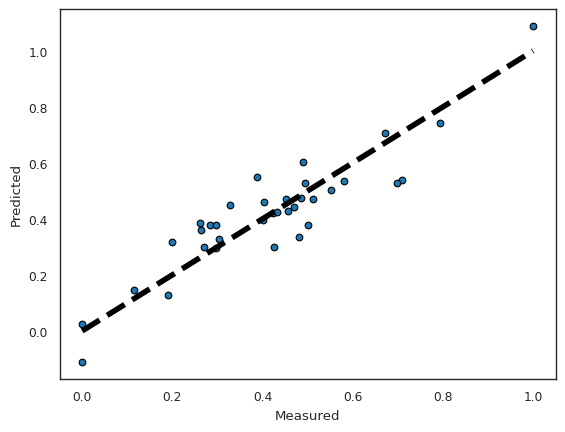

In [848]:
fig, ax = plt.subplots()
ax.scatter(y_train, y_pred, edgecolors=(0, 0, 0))
ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

Elasticity Analysis


<Axes: xlabel='elasticity', ylabel='feature'>

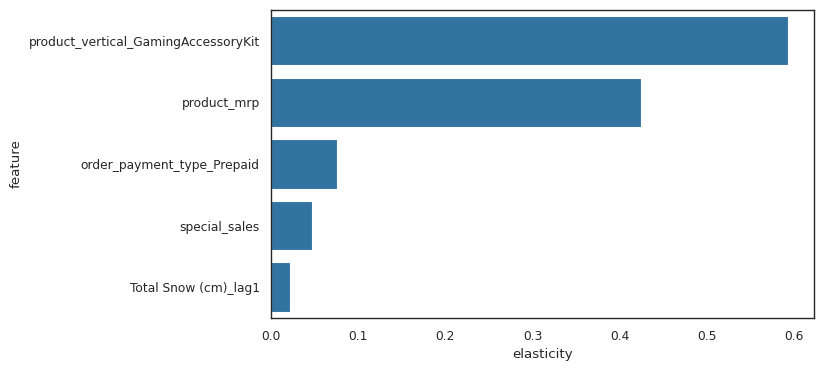

In [849]:
coefficients_df = pd.DataFrame(pd.DataFrame(lr.params)[1:]).reset_index()
coefficients_df.columns = ['feature','coefficient']
elasticity_data = calculateElasticity(X_train_rfe, y_train, coefficients_df)

plt.figure(figsize = (7,4))
sns.barplot(x = 'elasticity',y ='feature',data = elasticity_data.sort_values('elasticity', ascending = False))

##Distributed Lag Model(Additive) for Home Audio


Splitting the Dataframe into Training and Testing Set

In [850]:
# We specify this so that the train and test data set always have the same rows, respectively
df_train, df_test = train_test_split(home_dis_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [851]:
scaler = MinMaxScaler()

In [852]:
num_vars=home_dis_df.columns

In [853]:
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_test[num_vars] = scaler.fit_transform(df_test[num_vars])

In [854]:
y_train = df_train.pop('gmv')
X_train = df_train

In [855]:
# Running RFE for selecting top 20 features
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=20)             # running RFE
rfe = rfe.fit(X_train, y_train)

In [856]:
# selecting the features given by rfe
col = X_train.columns[rfe.support_]
col

Index(['sla_lag3', 'product_procurement_sla_lag1', 'product_vertical_Dock', 'product_vertical_FMRadio', 'product_vertical_HiFiSystem', 'product_vertical_HiFiSystem_lag1', 'product_vertical_HomeAudioSpeaker', 'product_vertical_SoundMixer', 'product_vertical_VoiceRecorder', 'holiday_week', 'holiday_week_lag3', 'TV', 'Digital_lag1', 'Sponsorship_EMA_8_lag3', 'Content Marketing_SMA_3_lag1', 'SEM_lag1', 'NPS_SMA_3_lag3', 'NPS_SMA_5', 'Max Temp_lag1', 'Total Snow (cm)_lag2'], dtype='object')

In [857]:
# neglecting features not selected by rfe
X_train.columns[~rfe.support_]

Index(['gmv_lag1', 'gmv_lag2', 'gmv_lag3', 'Discount%', 'Discount%_lag1', 'Discount%_lag2', 'Discount%_lag3', 'deliverybdays', 'deliverybdays_lag1', 'deliverybdays_lag2',
       ...
       'Total Snow (cm)_lag1', 'Total Snow (cm)_lag3', 'Total Precip (mm)', 'Total Precip (mm)_lag1', 'Total Precip (mm)_lag2', 'Total Precip (mm)_lag3', 'Snow on Grnd (cm)', 'Snow on Grnd (cm)_lag1', 'Snow on Grnd (cm)_lag2', 'Snow on Grnd (cm)_lag3'], dtype='object', length=315)

In [858]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [859]:
# Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     641.4
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.31e-15
Time:                        17:18:13   Log-Likelihood:                 123.76
No. Observations:                  33   AIC:                            -205.5
Df Residuals:                      12   BIC:                            -174.1
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,346.42
16,SEM_lag1,91.72
13,Digital_lag1,90.38
7,product_vertical_HomeAudioSpeaker,21.14
15,Content Marketing_SMA_3_lag1,17.46
17,NPS_SMA_3_lag3,15.25
3,product_vertical_Dock,11.59
4,product_vertical_FMRadio,9.92
18,NPS_SMA_5,9.86
5,product_vertical_HiFiSystem,9.08


In [860]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_HiFiSystem"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     292.4
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.51e-14
Time:                        17:18:13   Log-Likelihood:                 108.65
No. Observations:                  33   AIC:                            -177.3
Df Residuals:                      13   BIC:                            -147.4
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,305.62
15,SEM_lag1,85.11
12,Digital_lag1,83.14
16,NPS_SMA_3_lag3,14.68
6,product_vertical_HomeAudioSpeaker,13.68
14,Content Marketing_SMA_3_lag1,13.53
3,product_vertical_Dock,11.06
4,product_vertical_FMRadio,9.89
17,NPS_SMA_5,7.50
8,product_vertical_VoiceRecorder,7.22


In [861]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_SoundMixer"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     181.1
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.64e-13
Time:                        17:18:13   Log-Likelihood:                 98.658
No. Observations:                  33   AIC:                            -159.3
Df Residuals:                      14   BIC:                            -130.9
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,299.61
11,Digital_lag1,73.22
14,SEM_lag1,72.82
15,NPS_SMA_3_lag3,14.67
13,Content Marketing_SMA_3_lag1,13.44
6,product_vertical_HomeAudioSpeaker,13.14
3,product_vertical_Dock,10.39
4,product_vertical_FMRadio,8.89
16,NPS_SMA_5,7.16
7,product_vertical_VoiceRecorder,5.94


In [862]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Sponsorship_EMA_8_lag3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     205.4
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.11e-14
Time:                        17:18:14   Log-Likelihood:                 98.655
No. Observations:                  33   AIC:                            -161.3
Df Residuals:                      15   BIC:                            -134.4
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,221.16
13,SEM_lag1,72.61
11,Digital_lag1,70.41
14,NPS_SMA_3_lag3,14.61
6,product_vertical_HomeAudioSpeaker,11.29
3,product_vertical_Dock,10.06
4,product_vertical_FMRadio,8.73
15,NPS_SMA_5,6.93
7,product_vertical_VoiceRecorder,5.61
2,product_procurement_sla_lag1,5.24


In [863]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Content Marketing_SMA_3_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     228.5
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           8.14e-16
Time:                        17:18:14   Log-Likelihood:                 98.352
No. Observations:                  33   AIC:                            -162.7
Df Residuals:                      16   BIC:                            -137.3
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,218.15
12,SEM_lag1,71.52
11,Digital_lag1,70.05
13,NPS_SMA_3_lag3,14.57
6,product_vertical_HomeAudioSpeaker,11.09
3,product_vertical_Dock,9.38
4,product_vertical_FMRadio,8.05
14,NPS_SMA_5,6.92
7,product_vertical_VoiceRecorder,5.24
2,product_procurement_sla_lag1,5.21


In [864]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Total Snow (cm)_lag2"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     196.1
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           5.10e-16
Time:                        17:18:14   Log-Likelihood:                 93.790
No. Observations:                  33   AIC:                            -155.6
Df Residuals:                      17   BIC:                            -131.6
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,187.30
11,Digital_lag1,62.27
12,SEM_lag1,61.07
13,NPS_SMA_3_lag3,13.60
4,product_vertical_FMRadio,7.69
3,product_vertical_Dock,7.61
6,product_vertical_HomeAudioSpeaker,7.32
14,NPS_SMA_5,6.92
7,product_vertical_VoiceRecorder,5.22
2,product_procurement_sla_lag1,4.71


In [865]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["holiday_week"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     222.5
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.31e-17
Time:                        17:18:14   Log-Likelihood:                 93.789
No. Observations:                  33   AIC:                            -157.6
Df Residuals:                      18   BIC:                            -135.1
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,139.54
10,Digital_lag1,59.62
11,SEM_lag1,55.71
12,NPS_SMA_3_lag3,13.54
4,product_vertical_FMRadio,7.67
13,NPS_SMA_5,6.81
3,product_vertical_Dock,5.45
6,product_vertical_HomeAudioSpeaker,5.01
7,product_vertical_VoiceRecorder,4.91
2,product_procurement_sla_lag1,4.70


In [866]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["holiday_week_lag3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     250.8
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.18e-18
Time:                        17:18:14   Log-Likelihood:                 93.651
No. Observations:                  33   AIC:                            -159.3
Df Residuals:                      19   BIC:                            -138.4
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,121.18
9,Digital_lag1,54.89
10,SEM_lag1,51.45
11,NPS_SMA_3_lag3,12.63
4,product_vertical_FMRadio,7.36
12,NPS_SMA_5,6.62
3,product_vertical_Dock,5.30
7,product_vertical_VoiceRecorder,4.81
2,product_procurement_sla_lag1,4.59
6,product_vertical_HomeAudioSpeaker,4.52


In [867]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Max Temp_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     278.4
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.63e-19
Time:                        17:18:14   Log-Likelihood:                 93.210
No. Observations:                  33   AIC:                            -160.4
Df Residuals:                      20   BIC:                            -141.0
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,64.60
9,Digital_lag1,53.96
10,SEM_lag1,51.15
11,NPS_SMA_3_lag3,12.63
4,product_vertical_FMRadio,7.36
12,NPS_SMA_5,6.56
7,product_vertical_VoiceRecorder,4.75
2,product_procurement_sla_lag1,4.27
3,product_vertical_Dock,4.20
1,sla_lag3,2.84


In [868]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_Dock"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     308.3
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.25e-20
Time:                        17:18:14   Log-Likelihood:                 92.654
No. Observations:                  33   AIC:                            -161.3
Df Residuals:                      21   BIC:                            -143.3
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,63.28
8,Digital_lag1,52.47
9,SEM_lag1,50.28
10,NPS_SMA_3_lag3,12.14
11,NPS_SMA_5,6.55
2,product_procurement_sla_lag1,4.26
3,product_vertical_FMRadio,4.13
6,product_vertical_VoiceRecorder,4.01
1,sla_lag3,2.62
5,product_vertical_HomeAudioSpeaker,2.26


In [869]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["NPS_SMA_3_lag3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     337.1
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.14e-21
Time:                        17:18:14   Log-Likelihood:                 91.794
No. Observations:                  33   AIC:                            -161.6
Df Residuals:                      22   BIC:                            -145.1
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,52.69
9,SEM_lag1,35.85
8,Digital_lag1,33.24
10,NPS_SMA_5,3.48
6,product_vertical_VoiceRecorder,3.11
1,sla_lag3,2.52
2,product_procurement_sla_lag1,2.46
3,product_vertical_FMRadio,2.46
5,product_vertical_HomeAudioSpeaker,2.22
7,TV,1.59


In [870]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["TV"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     284.0
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.14e-21
Time:                        17:18:14   Log-Likelihood:                 86.535
No. Observations:                  33   AIC:                            -153.1
Df Residuals:                      23   BIC:                            -138.1
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,51.45
8,SEM_lag1,35.45
7,Digital_lag1,33.03
9,NPS_SMA_5,3.46
6,product_vertical_VoiceRecorder,3.11
1,sla_lag3,2.44
2,product_procurement_sla_lag1,2.41
3,product_vertical_FMRadio,2.39
5,product_vertical_HomeAudioSpeaker,2.22
4,product_vertical_HiFiSystem_lag1,1.34


In [871]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["SEM_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     309.0
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.77e-22
Time:                        17:18:14   Log-Likelihood:                 85.292
No. Observations:                  33   AIC:                            -152.6
Df Residuals:                      24   BIC:                            -139.1
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,33.28
8,NPS_SMA_5,3.15
6,product_vertical_VoiceRecorder,2.95
2,product_procurement_sla_lag1,2.41
1,sla_lag3,2.37
3,product_vertical_FMRadio,2.37
5,product_vertical_HomeAudioSpeaker,2.12
7,Digital_lag1,1.62
4,product_vertical_HiFiSystem_lag1,1.34


In [872]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Digital_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     356.5
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.03e-23
Time:                        17:18:15   Log-Likelihood:                 84.780
No. Observations:                  33   AIC:                            -153.6
Df Residuals:                      25   BIC:                            -141.6
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

,Features,VIF
0,const,31.10
7,NPS_SMA_5,3.14
6,product_vertical_VoiceRecorder,2.53
2,product_procurement_sla_lag1,2.38
1,sla_lag3,2.37
3,product_vertical_FMRadio,2.24
5,product_vertical_HomeAudioSpeaker,2.09
4,product_vertical_HiFiSystem_lag1,1.16


In [873]:
X_train_rfe.columns

Index(['sla_lag3', 'product_procurement_sla_lag1', 'product_vertical_FMRadio', 'product_vertical_HiFiSystem_lag1', 'product_vertical_HomeAudioSpeaker', 'product_vertical_VoiceRecorder', 'NPS_SMA_5'], dtype='object')

In [874]:
drop_columns_list = list(set(num_vars) - set(list(X_train_rfe.columns)))
print(drop_columns_list)

['Radio_EMA_8_lag3', 'Sponsorship_SMA_5_lag2', 'Digital_lag2', 'Online marketing_EMA_8_lag2', 'Online marketing_SMA_3_lag1', 'Cool Deg Days_lag2', 'TV_SMA_5_lag3', 'Max Temp_lag1', 'SEM_lag3', 'Affiliates_EMA_8', 'Total Investment', 'product_vertical_HomeAudioSpeaker_lag2', 'Affiliates_SMA_3_lag2', 'Stock Index_SMA_5', 'Discount%', 'Radio_SMA_5_lag2', 'Total Investment_lag2', 'Other_Ad_Stock_lag3', 'Total Investment_SMA_3_lag1', 'Digital_SMA_3_lag2', 'Online marketing', 'SEM', 'Sponsorship_EMA_8_lag2', 'TV_Ad_Stock_lag3', 'Total_Investment_Ad_Stock_lag1', 'product_vertical_HiFiSystem_lag2', 'Sponsorship_lag3', 'Online marketing_SMA_5', 'Affiliates_SMA_5_lag3', 'Content Marketing_SMA_3_lag1', 'Radio_SMA_5', 'is_mass_market_lag2', 'Total Investment_SMA_5_lag2', 'Digital_SMA_5_lag3', 'Online marketing_SMA_3', 'deliverycdays_lag2', 'Sponsorship_SMA_3_lag1', 'Other_SMA_5_lag1', 'NPS_SMA_5_lag2', 'NPS_lag1', 'Radio_SMA_5_lag3', 'Sponsorship_EMA_8_lag3', 'Total Snow (cm)', 'product_vertical_D

In [875]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

folds = KFold(n_splits = 10, shuffle = True, random_state = 100)
lm=LinearRegression()
scores = cross_val_score(lm, X_train_rfe, y_train, scoring='r2', cv=folds)
scores

array([0.85795197, 0.70790535, 0.96000004, 0.98365659, 0.84968675,
       0.92444134, 0.87931732, 0.9994025 , 0.9677785 , 0.96610165])

In [876]:
y_pred = cross_val_predict(lm, X_train_rfe, y_train, cv=folds)

In [877]:
mse = mean_squared_error(y_train, y_pred)
r_squared = r2_score(y_train, y_pred)
print('Mean_Squared_Error :' ,mse)
print('r_square_value :',r_squared)

Mean_Squared_Error : 0.0006972153076653457
r_square_value : 0.9798723926451117


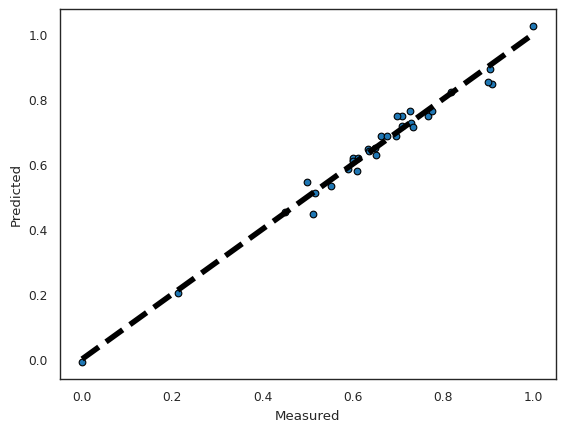

In [878]:
fig, ax = plt.subplots()
ax.scatter(y_train, y_pred, edgecolors=(0, 0, 0))
ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

Elasticity Analysis


<Axes: xlabel='elasticity', ylabel='feature'>

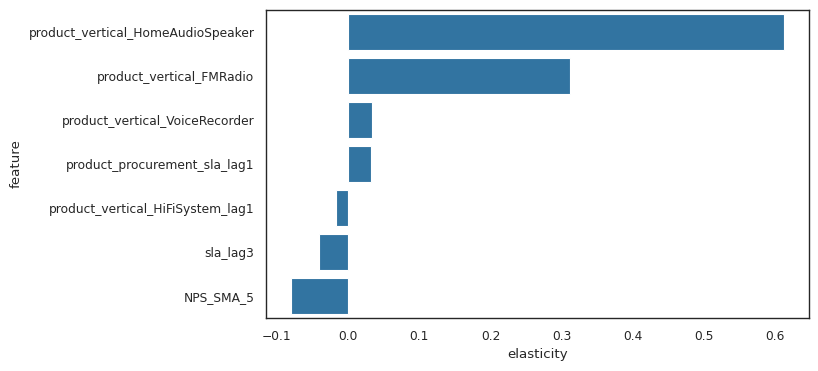

In [879]:
coefficients_df = pd.DataFrame(pd.DataFrame(lr.params)[1:]).reset_index()
coefficients_df.columns = ['feature','coefficient']
elasticity_data = calculateElasticity(X_train_rfe, y_train, coefficients_df)



plt.figure(figsize = (7,4))
sns.barplot(x = 'elasticity',y ='feature',data = elasticity_data.sort_values('elasticity', ascending = False))

# Distributed Lag Model (Multiplicative)

The Distributive Lag Model(Multiplicative) will now help us capture current-to-current interactions and carry over KPIs effects.

Take data logarithms (on both sides of the model) to fit a multiplicative model, then analyze the log data as before.

Yt = α+ µ1ln(Yt-1) + µ2ln(Yt-2) + µ3ln(Yt-3) + ....+ β1ln(X1t) + β1ln(X1t-1) + β1ln(X1t-2) + ....+ β2ln(X2t) + β2ln(X2t-1) + β2ln(X2t-2) + ....+ β3ln(X3t) + β3ln(X3t-1) + β3ln(X3t-2) + ....+ β4ln(X4t) + β4ln(X4t-1) + β4ln(X4t-2) + ....+ β5ln(X5t) + β5ln(X5t-1) + β5ln(X5t-2) + ....+ ϵ'

In [880]:
# Making copy of dataframes from the original ones
cam_dis_mul_df = Camera_accessory_org_df.copy()
gam_dis_mul_df = gaming_accessory_org_df.copy()
home_dis_mul_df = Homeaudio_org_df.copy()
home_dis_mul_df.head()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,order_payment_type_Prepaid,is_mass_market,special_sales,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_mrp,product_vertical_SoundMixer,product_vertical_VoiceRecorder,pay_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
26,1185712.00,30.67,0.00,0.00,7.00,1.95,213,793,0,24,1,334,8,541,1958.61,0,2,0,0,4.26,0.00,0.00,4.26,4.26,0.05,0.00,0.00,0.05,0.05,0.63,0.00,0.00,0.63,0.63,1.85,0.00,0.00,1.85,1.85,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.33,0.14,0.00,0.00,0.14,0.14,1.26,0.00,0.00,1.26,1.26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,28.00,12.50,20.10,0.28,2.38,4.42,0.00,4.42,0.00
27,1471962.00,30.37,0.00,0.00,6.71,1.78,243,936,297,36,0,374,19,657,2016.77,0,7,1,0,4.26,0.00,0.00,4.26,6.82,0.05,0.00,0.00,0.05,0.09,0.63,0.00,0.00,0.63,1.01,1.85,0.00,0.00,1.85,2.97,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.33,0.53,0.14,0.00,0.00,0.14,0.22,1.26,0.00,0.00,1.26,2.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,0.00,0.00,1177.00,0.00,0.00,33.00,11.00,23.18,0.00,5.18,1.40,0.00,1.40,0.00
28,1275392.00,28.88,0.00,0.00,6.82,1.80,191,909,0,40,0,394,16,544,1896.30,0,1,0,0,4.26,4.26,0.00,4.26,8.36,0.05,0.05,0.00,0.05,0.11,0.63,0.63,0.00,0.63,1.24,1.85,1.85,0.00,1.85,3.63,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.65,0.14,0.14,0.00,0.14,0.27,1.26,1.26,0.00,1.26,2.46,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,31.50,14.50,23.06,0.00,5.06,1.08,0.00,1.08,0.00
29,920394.00,28.04,0.00,0.00,6.83,1.76,145,650,0,39,0,281,6,388,1919.25,0,0,1,0,4.26,4.26,0.00,4.26,9.28,0.05,0.05,0.00,0.05,0.12,0.63,0.63,0.00,0.63,1.38,1.85,1.85,0.00,1.85,4.03,0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.00,0.33,0.72,0.14,0.14,0.00,0.14,0.30,1.26,1.26,0.00,1.26,2.73,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.60,54.60,0.00,1177.00,1177.00,0.00,33.50,16.00,24.57,0.00,6.57,4.63,0.00,4.63,0.00
30,2599.00,16.13,0.00,0.00,9.00,2.00,1,0,0,0,0,0,0,1,3099.00,0,0,0,0,1.01,3.18,3.61,3.54,6.58,0.00,0.04,0.04,0.04,0.07,0.26,0.51,0.56,0.55,1.08,0.21,1.31,1.53,1.49,2.63,0.00,0.00,0.00,0.00,0.00,0.03,0.23,0.27,0.26,0.46,0.01,0.10,0.11,0.11,0.19,0.50,1.01,1.11,1.09,2.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,59.99,56.40,55.68,1206.00,1186.67,1182.80,28.50,15.00,21.65,0.00,3.65,0.35,0.00,0.35,0.00


In [881]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(home_dis_mul_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(home_dis_mul_df.isnull().sum()/home_dis_mul_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
gmv,0,0.00
Affiliates_Ad_Stock,0,0.00
Radio_SMA_5,0,0.00
Radio_SMA_3,0,0.00
Radio,0,0.00


Create new lag(Lag of 3 weeks) variables for the dependent variable (GMV) as well as independent variables


In [882]:
cam_dis_mul_df_columns = cam_dis_mul_df.columns
gam_dis_mul_df_columns = gam_dis_mul_df.columns
home_dis_mul_df_columns = home_dis_mul_df.columns

In [883]:
cam_dis_mul_df = lag_variables(cam_dis_mul_df,cam_dis_mul_df_columns,3)
gam_dis_mul_df = lag_variables(gam_dis_mul_df,gam_dis_mul_df_columns,3)
home_dis_mul_df = lag_variables(home_dis_mul_df,home_dis_mul_df_columns,3)
home_dis_mul_df.head()

,gmv,gmv_lag3,Discount%,Discount%_lag3,deliverybdays,deliverybdays_lag3,deliverycdays,deliverycdays_lag3,sla,sla_lag3,product_procurement_sla,product_procurement_sla_lag3,order_payment_type_Prepaid,order_payment_type_Prepaid_lag3,is_mass_market,is_mass_market_lag3,special_sales,special_sales_lag3,product_vertical_Dock,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag3,product_mrp,product_mrp_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag3,pay_week,pay_week_lag3,holiday_week,holiday_week_lag3,Total Investment,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag3,TV,TV_lag3,TV_SMA_3,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag3,Digital,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag3,Online marketing,Online marketing_lag3,Online marketing_SMA_3,Online marketing_SMA_3_lag3,Online marketing_SMA_5,Online marketing_SMA_5_lag3,Online marketing_EMA_8,Online marketing_EMA_8_lag3,Online_marketing_Ad_Stock,Online_marketing_Ad_Stock_lag3,Affiliates,Affiliates_lag3,Affiliates_SMA_3,Affiliates_SMA_3_lag3,Affiliates_SMA_5,Affiliates_SMA_5_lag3,Affiliates_EMA_8,Affiliates_EMA_8_lag3,Affiliates_Ad_Stock,Affiliates_Ad_Stock_lag3,SEM,SEM_lag3,SEM_SMA_3,SEM_SMA_3_lag3,SEM_SMA_5,SEM_SMA_5_lag3,SEM_EMA_8,SEM_EMA_8_lag3,SEM_Ad_Stock,SEM_Ad_Stock_lag3,Radio,Radio_lag3,Radio_SMA_3,Radio_SMA_3_lag3,Radio_SMA_5,Radio_SMA_5_lag3,Radio_EMA_8,Radio_EMA_8_lag3,Radio_Ad_Stock,Radio_Ad_Stock_lag3,Other,Other_lag3,Other_SMA_3,Other_SMA_3_lag3,Other_SMA_5,Other_SMA_5_lag3,Other_EMA_8,Other_EMA_8_lag3,Other_Ad_Stock,Other_Ad_Stock_lag3,NPS,NPS_lag3,NPS_SMA_3,NPS_SMA_3_lag3,NPS_SMA_5,NPS_SMA_5_lag3,Stock Index,Stock Index_lag3,Stock Index_SMA_3,Stock Index_SMA_3_lag3,Stock Index_SMA_5,Stock Index_SMA_5_lag3,Max Temp,Max Temp_lag3,Min Temp,Min Temp_lag3,Mean Temp,Mean Temp_lag3,Heat Deg Days,Heat Deg Days_lag3,Cool Deg Days,Cool Deg Days_lag3,Total Rain (mm),Total Rain (mm)_lag3,Total Snow (cm),Total Snow (cm)_lag3,Total Precip (mm),Total Precip (mm)_lag3,Snow on Grnd (cm),Snow on Grnd (cm)_lag3
26,1185712.00,NaN,30.67,NaN,0.00,NaN,0.00,NaN,7.00,NaN,1.95,NaN,213,NaN,793,NaN,0,NaN,24,NaN,1,NaN,334,NaN,8,NaN,541,NaN,1958.61,NaN,0,NaN,2,NaN,0,NaN,0,NaN,4.26,NaN,0.00,NaN,0.00,NaN,4.26,NaN,4.26,NaN,0.05,NaN,0.00,NaN,0.00,NaN,0.05,NaN,0.05,NaN,0.63,NaN,0.00,NaN,0.00,NaN,0.63,NaN,0.63,NaN,1.85,NaN,0.00,NaN,0.00,NaN,1.85,NaN,1.85,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.33,NaN,0.00,NaN,0.00,NaN,0.33,NaN,0.33,NaN,0.14,NaN,0.00,NaN,0.00,NaN,0.14,NaN,0.14,NaN,1.26,NaN,0.00,NaN,0.00,NaN,1.26,NaN,1.26,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,54.60,None,0.00,NaN,0.00,NaN,1177.00,None,0.00,NaN,0.00,NaN,28.00,NaN,12.50,NaN,20.10,NaN,0.28,NaN,2.38,NaN,4.42,NaN,0.00,NaN,4.42,NaN,0.00,NaN
27,1471962.00,NaN,30.37,NaN,0.00,NaN,0.00,NaN,6.71,NaN,1.78,NaN,243,NaN,936,NaN,297,NaN,36,NaN,0,NaN,374,NaN,19,NaN,657,NaN,2016.77,NaN,0,NaN,7,NaN,1,NaN,0,

Create new lag(Lag of 2 weeks) variables for the dependent variable (GMV) as well as independent variables


In [884]:
cam_dis_mul_df = lag_variables(cam_dis_mul_df,cam_dis_mul_df_columns,2)
gam_dis_mul_df = lag_variables(gam_dis_mul_df,gam_dis_mul_df_columns,2)
home_dis_mul_df = lag_variables(home_dis_mul_df,home_dis_mul_df_columns,2)
home_dis_mul_df.head()

,gmv,gmv_lag2,gmv_lag3,Discount%,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag2,product_procurement_sla_lag3,order_payment_type_Prepaid,order_payment_type_Prepaid_lag2,order_payment_type_Prepaid_lag3,is_mass_market,is_mass_market_lag2,is_mass_market_lag3,special_sales,special_sales_lag2,special_sales_lag3,product_vertical_Dock,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_mrp,product_mrp_lag2,product_mrp_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,pay_week,pay_week_lag2,pay_week_lag3,holiday_week,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online marketing,Online marketing_lag2,Online marketing_lag3,Online marketing_SMA_3,Online marketing_SMA_3_lag2,Online marketing_SMA_3_lag3,Online marketing_SMA_5,Online marketing_SMA_5_lag2,Online marketing_SMA_5_lag3,Online marketing_EMA_8,Online marketing_EMA_8_lag2,Online marketing_EMA_8_lag3,Online_marketing_Ad_Stock,Online_marketing_Ad_Stock_lag2,Online_marketing_Ad_Stock_lag3,Affiliates,Affiliates_lag2,Affiliates_lag3,Affiliates_SMA_3,Affiliates_SMA_3_lag2,Affiliates_SMA_3_lag3,Affiliates_SMA_5,Affiliates_SMA_5_lag2,Affiliates_SMA_5_lag3,Affiliates_EMA_8,Affiliates_EMA_8_lag2,Affiliates_EMA_8_lag3,Affiliates_Ad_Stock,Affiliates_Ad_Stock_lag2,Affiliates_Ad_Stock_lag3,SEM,SEM_lag2,SEM_lag3,SEM_SMA_3,SEM_SMA_3_lag2,SEM_SMA_3_lag3,SEM_SMA_5,SEM_SMA_5_lag2,SEM_SMA_5_lag3,SEM_EMA_8,SEM_EMA_8_lag2,SEM_EMA_8_lag3,SEM_Ad_Stock,SEM_Ad_Stock_lag2,SEM_Ad_Stock_lag3,Radio,Radio_lag2,Radio_lag3,Radio_SMA_3,Radio_SMA_3_lag2,Radio_SMA_3_lag3,Radio_SMA_5,Radio_SMA_5_lag2,Radio_SMA_5_lag3,Radio_EMA_8,Radio_EMA_8_lag2,Radio_EMA_8_lag3,Radio_Ad_Stock,Radio_Ad_Stock_lag2,Radio_Ad_Stock_lag3,Other,Other_lag2,Other_lag3,Other_SMA_3,Other_SMA_3_lag2,Other_SMA_3_lag3,Other_SMA_5,Other_SMA_5_lag2,Other_S

Create new lag(Lag of 1 week) variables for the dependent variable (GMV) as well as independent variables


In [885]:
cam_dis_mul_df = lag_variables(cam_dis_mul_df,cam_dis_mul_df_columns,1)
gam_dis_mul_df = lag_variables(gam_dis_mul_df,gam_dis_mul_df_columns,1)
home_dis_mul_df = lag_variables(home_dis_mul_df,home_dis_mul_df_columns,1)
home_dis_mul_df.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,order_payment_type_Prepaid,order_payment_type_Prepaid_lag1,order_payment_type_Prepaid_lag2,order_payment_type_Prepaid_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,special_sales,special_sales_lag1,special_sales_lag2,special_sales_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,pay_week,pay_week_lag1,pay_week_lag2,pay_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online marketing,Online marketing_lag1,Online marketing_lag2,Online marketing_lag3,Online marketing_SMA_3,Online marketing_SMA_3_lag1,Online marketing_SMA_3_lag2,Online marketing_SMA_3_lag3,Online ma

Imputing all null values with 0


In [886]:
# Imputing all null values with 0
cam_dis_mul_df.fillna(value=0, inplace=True)
gam_dis_mul_df.fillna(value=0, inplace=True)
home_dis_mul_df.fillna(value=0, inplace=True)
home_dis_mul_df.head(10)

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,order_payment_type_Prepaid,order_payment_type_Prepaid_lag1,order_payment_type_Prepaid_lag2,order_payment_type_Prepaid_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,special_sales,special_sales_lag1,special_sales_lag2,special_sales_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,pay_week,pay_week_lag1,pay_week_lag2,pay_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online marketing,Online marketing_lag1,Online marketing_lag2,Online marketing_lag3,Online marketing_SMA_3,Online marketing_SMA_3_lag1,Online marketing_SMA_3_lag2,Online marketing_SMA_3_lag3,Online ma

Taking Logarithm of both the Dependent and the independent variables


After taking log, all 0 values will be transformed to inf. Retransforming these values to 0.



In [887]:
cam_dis_mul_df = cam_dis_mul_df.applymap(lambda x: np.log(x))
cam_dis_mul_df = cam_dis_mul_df.replace([np.inf, -np.inf], 0)
cam_dis_mul_df = cam_dis_mul_df.replace(np.nan, 0)

gam_dis_mul_df = gam_dis_mul_df.applymap(lambda x: np.log(x))
gam_dis_mul_df = gam_dis_mul_df.replace([np.inf, -np.inf], 0)
gam_dis_mul_df = gam_dis_mul_df.replace(np.nan, 0)

home_dis_mul_df = home_dis_mul_df.applymap(lambda x: np.log(x))
home_dis_mul_df = home_dis_mul_df.replace([np.inf, -np.inf], 0)
home_dis_mul_df = home_dis_mul_df.replace(np.nan, 0)

home_dis_mul_df.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,order_payment_type_Prepaid,order_payment_type_Prepaid_lag1,order_payment_type_Prepaid_lag2,order_payment_type_Prepaid_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,special_sales,special_sales_lag1,special_sales_lag2,special_sales_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,pay_week,pay_week_lag1,pay_week_lag2,pay_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online marketing,Online marketing_lag1,Online marketing_lag2,Online marketing_lag3,Online marketing_SMA_3,Online marketing_SMA_3_lag1,Online marketing_SMA_3_lag2,Online marketing_SMA_3_lag3,Online ma

In [888]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(home_dis_mul_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(home_dis_mul_df.isnull().sum()/home_dis_mul_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
gmv,0,0.00
SEM_SMA_3_lag1,0,0.00
SEM_EMA_8_lag1,0,0.00
SEM_EMA_8,0,0.00
SEM_SMA_5_lag3,0,0.00


##Distributed Lag Model(Multiplicative) for Camera Accessory


Splitting the Dataframe into Training and Testing Set


In [889]:
# We specify this so that the train and test data set always have the same rows, respectively
df_train, df_test = train_test_split(cam_dis_mul_df, train_size = 0.7, test_size = 0.3, random_state = 100)

Rescaling the Features


In [890]:
scaler = MinMaxScaler()

In [891]:
num_vars =cam_dis_mul_df.columns

In [892]:
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_test[num_vars] = scaler.fit_transform(df_test[num_vars])

In [893]:
y_train = df_train.pop('gmv')
X_train = df_train

In [894]:
# Running RFE for selecting top 20 features
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=20)             # running RFE
rfe = rfe.fit(X_train, y_train)

In [895]:
# selecting the features given by rfe
col = X_train.columns[rfe.support_]
col

Index(['Discount%', 'is_mass_market', 'product_vertical_CameraBattery', 'product_vertical_CameraBatteryCharger', 'product_vertical_CameraMicrophone_lag2', 'product_vertical_CameraMount_lag3', 'product_vertical_CameraRemoteControl', 'product_vertical_CameraTripod', 'product_vertical_Filter', 'product_vertical_Lens', 'product_vertical_Strap', 'TV', 'Content Marketing', 'Online marketing', 'NPS_SMA_3_lag2', 'NPS_SMA_3_lag3', 'NPS_SMA_5', 'NPS_SMA_5_lag1', 'NPS_SMA_5_lag2', 'NPS_SMA_5_lag3'], dtype='object')

In [896]:
# neglecting features not selected by rfe
X_train.columns[~rfe.support_]

Index(['gmv_lag1', 'gmv_lag2', 'gmv_lag3', 'Discount%_lag1', 'Discount%_lag2', 'Discount%_lag3', 'deliverybdays', 'deliverybdays_lag1', 'deliverybdays_lag2', 'deliverybdays_lag3',
       ...
       'Total Snow (cm)_lag2', 'Total Snow (cm)_lag3', 'Total Precip (mm)', 'Total Precip (mm)_lag1', 'Total Precip (mm)_lag2', 'Total Precip (mm)_lag3', 'Snow on Grnd (cm)', 'Snow on Grnd (cm)_lag1', 'Snow on Grnd (cm)_lag2', 'Snow on Grnd (cm)_lag3'], dtype='object', length=371)

In [897]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [898]:
# Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     9579.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.02e-22
Time:                        17:18:23   Log-Likelihood:                 173.48
No. Observations:                  33   AIC:                            -305.0
Df Residuals:                      12   BIC:                            -273.5
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
19,NPS_SMA_5_lag2,62607.29
18,NPS_SMA_5_lag1,44205.56
16,NPS_SMA_3_lag3,36604.69
20,NPS_SMA_5_lag3,30057.10
15,NPS_SMA_3_lag2,29110.85
17,NPS_SMA_5,28660.50
0,const,1509.92
2,is_mass_market,383.72
14,Online marketing,211.53
9,product_vertical_Filter,93.99


In [899]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["NPS_SMA_5_lag2"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     9912.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           5.26e-24
Time:                        17:18:23   Log-Likelihood:                 171.88
No. Observations:                  33   AIC:                            -303.8
Df Residuals:                      13   BIC:                            -273.8
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
16,NPS_SMA_3_lag3,33507.51
17,NPS_SMA_5,16899.68
15,NPS_SMA_3_lag2,16769.53
19,NPS_SMA_5_lag3,16744.24
18,NPS_SMA_5_lag1,9468.03
0,const,1497.15
2,is_mass_market,324.97
14,Online marketing,211.13
9,product_vertical_Filter,92.55
1,Discount%,83.94


In [900]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["NPS_SMA_3_lag3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     7097.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.22e-24
Time:                        17:18:23   Log-Likelihood:                 164.25
No. Observations:                  33   AIC:                            -290.5
Df Residuals:                      14   BIC:                            -262.1
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
15,NPS_SMA_3_lag2,9745.36
16,NPS_SMA_5,9572.80
17,NPS_SMA_5_lag1,4475.50
18,NPS_SMA_5_lag3,3561.99
0,const,1442.29
2,is_mass_market,323.96
14,Online marketing,209.90
9,product_vertical_Filter,84.29
3,product_vertical_CameraBattery,83.81
1,Discount%,78.27


In [901]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["NPS_SMA_5_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     8040.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.33e-26
Time:                        17:18:23   Log-Likelihood:                 164.23
No. Observations:                  33   AIC:                            -292.5
Df Residuals:                      15   BIC:                            -265.5
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
15,NPS_SMA_3_lag2,9571.47
16,NPS_SMA_5,9503.26
0,const,1427.07
17,NPS_SMA_5_lag3,428.54
2,is_mass_market,319.65
14,Online marketing,146.09
9,product_vertical_Filter,83.84
3,product_vertical_CameraBattery,78.96
1,Discount%,78.11
4,product_vertical_CameraBatteryCharger,68.24


In [902]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["NPS_SMA_5_lag3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     7205.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           8.84e-28
Time:                        17:18:23   Log-Likelihood:                 160.36
No. Observations:                  33   AIC:                            -286.7
Df Residuals:                      16   BIC:                            -261.3
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
16,NPS_SMA_5,9318.74
15,NPS_SMA_3_lag2,8977.66
0,const,528.14
2,is_mass_market,293.57
9,product_vertical_Filter,81.53
4,product_vertical_CameraBatteryCharger,64.45
14,Online marketing,64.45
10,product_vertical_Lens,64.26
3,product_vertical_CameraBattery,64.20
1,Discount%,46.16


In [903]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["is_mass_market"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     666.1
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.66e-20
Time:                        17:18:23   Log-Likelihood:                 119.03
No. Observations:                  33   AIC:                            -206.1
Df Residuals:                      17   BIC:                            -182.1
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
15,NPS_SMA_5,9316.48
14,NPS_SMA_3_lag2,8970.85
0,const,501.17
8,product_vertical_Filter,77.37
3,product_vertical_CameraBatteryCharger,60.17
13,Online marketing,58.65
9,product_vertical_Lens,58.64
2,product_vertical_CameraBattery,52.49
10,product_vertical_Strap,39.79
11,TV,27.79


In [904]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["TV"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     746.0
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           6.55e-22
Time:                        17:18:23   Log-Likelihood:                 118.82
No. Observations:                  33   AIC:                            -207.6
Df Residuals:                      18   BIC:                            -185.2
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
14,NPS_SMA_5,8006.43
13,NPS_SMA_3_lag2,7663.90
0,const,490.05
8,product_vertical_Filter,69.51
9,product_vertical_Lens,58.26
3,product_vertical_CameraBatteryCharger,54.95
2,product_vertical_CameraBattery,49.67
12,Online marketing,32.87
10,product_vertical_Strap,30.14
6,product_vertical_CameraRemoteControl,23.43


In [905]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["NPS_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     846.9
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.20e-23
Time:                        17:18:23   Log-Likelihood:                 118.80
No. Observations:                  33   AIC:                            -209.6
Df Residuals:                      19   BIC:                            -188.6
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,424.48
8,product_vertical_Filter,66.71
9,product_vertical_Lens,57.93
3,product_vertical_CameraBatteryCharger,49.33
2,product_vertical_CameraBattery,49.16
12,Online marketing,31.50
10,product_vertical_Strap,26.03
7,product_vertical_CameraTripod,22.26
1,Discount%,19.66
6,product_vertical_CameraRemoteControl,17.88


In [906]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_CameraBatteryCharger"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     934.9
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           9.49e-25
Time:                        17:18:23   Log-Likelihood:                 118.26
No. Observations:                  33   AIC:                            -210.5
Df Residuals:                      20   BIC:                            -191.1
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,398.96
7,product_vertical_Filter,66.70
8,product_vertical_Lens,56.26
11,Online marketing,30.68
9,product_vertical_Strap,25.57
2,product_vertical_CameraBattery,22.92
6,product_vertical_CameraTripod,20.73
5,product_vertical_CameraRemoteControl,17.74
1,Discount%,17.11
12,NPS_SMA_3_lag2,14.42


In [907]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_Filter"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     1047.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.56e-26
Time:                        17:18:23   Log-Likelihood:                 117.88
No. Observations:                  33   AIC:                            -211.8
Df Residuals:                      21   BIC:                            -193.8
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

,Features,VIF
0,const,379.27
7,product_vertical_Lens,41.93
10,Online marketing,28.03
8,product_vertical_Strap,25.03
2,product_vertical_CameraBattery,22.20
6,product_vertical_CameraTripod,18.76
5,product_vertical_CameraRemoteControl,16.00
1,Discount%,15.87
11,NPS_SMA_3_lag2,13.94
9,Content Marketing,5.56


In [908]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_CameraMicrophone_lag2"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     835.1
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           5.57e-26
Time:                        17:18:23   Log-Likelihood:                 111.83
No. Observations:                  33   AIC:                            -201.7
Df Residuals:                      22   BIC:                            -185.2
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,219.57
6,product_vertical_Lens,27.58
2,product_vertical_CameraBattery,21.95
7,product_vertical_Strap,20.21
9,Online marketing,19.32
5,product_vertical_CameraTripod,18.56
1,Discount%,15.79
4,product_vertical_CameraRemoteControl,14.57
10,NPS_SMA_3_lag2,11.17
3,product_vertical_CameraMount_lag3,4.02


In [909]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_CameraMount_lag3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     965.4
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.82e-27
Time:                        17:18:24   Log-Likelihood:                 111.75
No. Observations:                  33   AIC:                            -203.5
Df Residuals:                      23   BIC:                            -188.5
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,218.89
5,product_vertical_Lens,24.55
2,product_vertical_CameraBattery,20.66
8,Online marketing,19.32
4,product_vertical_CameraTripod,17.79
6,product_vertical_Strap,16.28
1,Discount%,15.62
3,product_vertical_CameraRemoteControl,14.03
9,NPS_SMA_3_lag2,9.87
7,Content Marketing,3.10


In [910]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_Lens"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     455.5
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.75e-24
Time:                        17:18:24   Log-Likelihood:                 96.776
No. Observations:                  33   AIC:                            -175.6
Df Residuals:                      24   BIC:                            -162.1
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,185.30
2,product_vertical_CameraBattery,19.79
5,product_vertical_Strap,16.28
7,Online marketing,15.53
4,product_vertical_CameraTripod,14.37
1,Discount%,11.99
3,product_vertical_CameraRemoteControl,8.61
8,NPS_SMA_3_lag2,8.24
6,Content Marketing,2.98


In [911]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_CameraTripod"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     522.6
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.79e-25
Time:                        17:18:24   Log-Likelihood:                 96.170
No. Observations:                  33   AIC:                            -176.3
Df Residuals:                      25   BIC:                            -164.4
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,183.41
2,product_vertical_CameraBattery,18.63
4,product_vertical_Strap,13.92
6,Online marketing,13.29
1,Discount%,8.64
7,NPS_SMA_3_lag2,7.58
3,product_vertical_CameraRemoteControl,7.11
5,Content Marketing,2.87


In [912]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Content Marketing"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     513.9
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.01e-25
Time:                        17:18:24   Log-Likelihood:                 92.728
No. Observations:                  33   AIC:                            -171.5
Df Residuals:                      26   BIC:                            -161.0
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,83.31
2,product_vertical_CameraBattery,18.35
4,product_vertical_Strap,11.96
5,Online marketing,10.69
1,Discount%,7.95
3,product_vertical_CameraRemoteControl,7.09
6,NPS_SMA_3_lag2,5.35


In [913]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_Strap"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     594.4
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.02e-26
Time:                        17:18:24   Log-Likelihood:                 91.509
No. Observations:                  33   AIC:                            -171.0
Df Residuals:                      27   BIC:                            -162.0
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,78.08
2,product_vertical_CameraBattery,11.47
4,Online marketing,9.78
3,product_vertical_CameraRemoteControl,6.96
5,NPS_SMA_3_lag2,4.90
1,Discount%,4.62


In [914]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["NPS_SMA_3_lag2"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     579.0
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.79e-26
Time:                        17:18:24   Log-Likelihood:                 86.843
No. Observations:                  33   AIC:                            -163.7
Df Residuals:                      28   BIC:                            -156.2
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,30.85
2,product_vertical_CameraBattery,8.19
3,product_vertical_CameraRemoteControl,6.53
1,Discount%,4.47
4,Online marketing,2.24


In [915]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_CameraBattery"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.964
Model:                            OLS   Adj. R-squared:                  0.960
Method:                 Least Squares   F-statistic:                     255.7
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           5.99e-21
Time:                        17:18:24   Log-Likelihood:                 68.447
No. Observations:                  33   AIC:                            -128.9
Df Residuals:                      29   BIC:                            -122.9
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,30.14
2,product_vertical_CameraRemoteControl,3.47
1,Discount%,3.43
3,Online marketing,2.24


In [916]:
X_train_rfe.columns

Index(['Discount%', 'product_vertical_CameraRemoteControl', 'Online marketing'], dtype='object')

In [917]:
drop_columns_list = list(set(num_vars) - set(list(X_train_rfe.columns)))
print(drop_columns_list)

['Radio_EMA_8_lag3', 'product_vertical_Lens_lag1', 'Sponsorship_SMA_5_lag2', 'Digital_lag2', 'Online marketing_EMA_8_lag2', 'NPS_SMA_5', 'product_vertical_Filter_lag2', 'product_vertical_ExtensionTube_lag3', 'Online marketing_SMA_3_lag1', 'Cool Deg Days_lag2', 'TV_SMA_5_lag3', 'Max Temp_lag1', 'SEM_lag3', 'Affiliates_EMA_8', 'Total Investment', 'Affiliates_SMA_3_lag2', 'product_vertical_Strap_lag3', 'product_vertical_FlashShoeAdapter_lag2', 'Stock Index_SMA_5', 'product_vertical_FlashShoeAdapter_lag1', 'Radio_SMA_5_lag2', 'Total Investment_lag2', 'Other_Ad_Stock_lag3', 'product_vertical_CameraBattery', 'Total Investment_SMA_3_lag1', 'Digital_SMA_3_lag2', 'SEM', 'Sponsorship_EMA_8_lag2', 'TV_Ad_Stock_lag3', 'Total_Investment_Ad_Stock_lag1', 'Sponsorship_lag3', 'Online marketing_SMA_5', 'Affiliates_SMA_5_lag3', 'Content Marketing_SMA_3_lag1', 'Radio_SMA_5', 'is_mass_market_lag2', 'Total Investment_SMA_5_lag2', 'Digital_SMA_5_lag3', 'Online marketing_SMA_3', 'deliverycdays_lag2', 'Sponsor

In [918]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

folds = KFold(n_splits = 10, shuffle = True, random_state = 100)
lm=LinearRegression()
scores = cross_val_score(lm, X_train_rfe, y_train, scoring='r2', cv=folds)
scores

array([ -2.17598032,   0.40787456,   0.31105232,   0.42468982,
       -17.99900325,  -0.94869979,  -0.40263034,   0.4412509 ,
        -8.73533071,  -0.39164415])

In [919]:
y_pred = cross_val_predict(lm, X_train_rfe, y_train, cv=folds)

In [920]:
mse = mean_squared_error(y_train, y_pred)
r_squared = r2_score(y_train, y_pred)
print('Mean_Squared_Error :' ,mse)
print('r_square_value :',r_squared)

Mean_Squared_Error : 0.00961202135509972
r_square_value : 0.6212895601784901


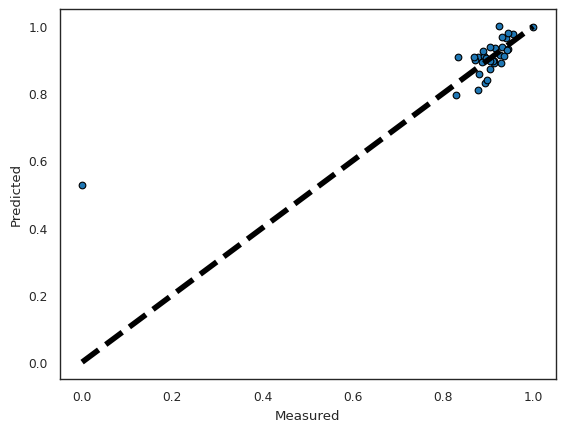

In [921]:
fig, ax = plt.subplots()
ax.scatter(y_train, y_pred, edgecolors=(0, 0, 0))
ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()


Elasticity for Camera Accessory


<Axes: xlabel='elasticity', ylabel='feature'>

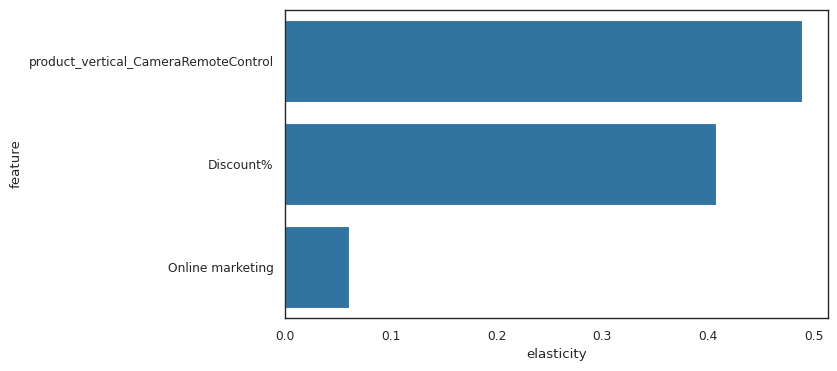

In [922]:
coefficients_df = pd.DataFrame(pd.DataFrame(lr.params)[1:]).reset_index()
coefficients_df.columns = ['feature','coefficient']
elasticity_data = calculateElasticity(X_train_rfe, y_train, coefficients_df)


plt.figure(figsize = (7,4))
sns.barplot(x = 'elasticity',y ='feature',data = elasticity_data.sort_values('elasticity', ascending = False))

##Distributed Lag Model(Multiplicative) for Gaming Accessory


Splitting the Dataframe into Training and Testing Set


In [923]:
# We specify this so that the train and test data set always have the same rows, respectively
df_train, df_test = train_test_split(gam_dis_mul_df, train_size = 0.7, test_size = 0.3, random_state = 100)

Rescaling the Features

In [924]:
scaler = MinMaxScaler()

In [925]:
num_vars= gam_dis_mul_df.columns

In [926]:
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_test[num_vars] = scaler.fit_transform(df_test[num_vars])

In [927]:
y_train = df_train.pop('gmv')
X_train = df_train

In [928]:
# Running RFE for selecting top 20 features
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=20)             # running RFE
rfe = rfe.fit(X_train, y_train)

In [929]:
# selecting the features given by rfe
col = X_train.columns[rfe.support_]
col

Index(['deliverybdays_lag1', 'sla', 'sla_lag1', 'product_procurement_sla_lag1', 'product_vertical_GamePad', 'product_mrp', 'product_vertical_GamingAccessoryKit', 'product_vertical_GamingAdapter', 'product_vertical_GamingHeadset', 'product_vertical_GamingKeyboard', 'product_vertical_GamingMousePad_lag3', 'Total Investment_SMA_3_lag2', 'Online marketing', 'Affiliates', 'SEM_SMA_5_lag3', 'NPS_SMA_3_lag3', 'NPS_SMA_5', 'Stock Index_SMA_3_lag3', 'Stock Index_SMA_5', 'Min Temp'], dtype='object')

In [930]:
# neglecting features not selected by rfe
X_train.columns[~rfe.support_]

Index(['gmv_lag1', 'gmv_lag2', 'gmv_lag3', 'Discount%', 'Discount%_lag1', 'Discount%_lag2', 'Discount%_lag3', 'deliverybdays', 'deliverybdays_lag2', 'deliverybdays_lag3',
       ...
       'Total Snow (cm)_lag2', 'Total Snow (cm)_lag3', 'Total Precip (mm)', 'Total Precip (mm)_lag1', 'Total Precip (mm)_lag2', 'Total Precip (mm)_lag3', 'Snow on Grnd (cm)', 'Snow on Grnd (cm)_lag1', 'Snow on Grnd (cm)_lag2', 'Snow on Grnd (cm)_lag3'], dtype='object', length=343)

In [931]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [932]:
# Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     3692.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.00e-22
Time:                        17:18:27   Log-Likelihood:                 156.16
No. Observations:                  35   AIC:                            -270.3
Df Residuals:                      14   BIC:                            -237.6
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
19,Stock Index_SMA_5,12224.99
17,NPS_SMA_5,12139.13
16,NPS_SMA_3_lag3,5051.24
18,Stock Index_SMA_3_lag3,4976.79
13,Online marketing,3404.37
14,Affiliates,3358.65
0,const,514.55
5,product_vertical_GamePad,270.88
7,product_vertical_GamingAccessoryKit,165.06
9,product_vertical_GamingHeadset,55.38


In [933]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Stock Index_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     4043.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.88e-24
Time:                        17:18:27   Log-Likelihood:                 155.64
No. Observations:                  35   AIC:                            -271.3
Df Residuals:                      15   BIC:                            -240.2
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
14,Affiliates,1886.88
13,Online marketing,1792.27
16,NPS_SMA_3_lag3,1611.23
18,Stock Index_SMA_3_lag3,1609.64
0,const,455.34
5,product_vertical_GamePad,270.88
7,product_vertical_GamingAccessoryKit,157.17
9,product_vertical_GamingHeadset,52.42
8,product_vertical_GamingAdapter,47.57
17,NPS_SMA_5,41.46


In [934]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamingAccessoryKit"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     2096.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.34e-23
Time:                        17:18:27   Log-Likelihood:                 142.07
No. Observations:                  35   AIC:                            -246.1
Df Residuals:                      16   BIC:                            -216.6
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
13,Affiliates,1877.12
12,Online marketing,1790.37
15,NPS_SMA_3_lag3,1611.17
17,Stock Index_SMA_3_lag3,1599.37
0,const,381.70
5,product_vertical_GamePad,115.51
8,product_vertical_GamingHeadset,52.18
7,product_vertical_GamingAdapter,47.31
16,NPS_SMA_5,28.57
9,product_vertical_GamingKeyboard,18.10


In [935]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Online marketing"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1661.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           5.24e-24
Time:                        17:18:27   Log-Likelihood:                 135.94
No. Observations:                  35   AIC:                            -235.9
Df Residuals:                      17   BIC:                            -207.9
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
14,NPS_SMA_3_lag3,1551.82
16,Stock Index_SMA_3_lag3,1530.78
0,const,380.27
5,product_vertical_GamePad,112.23
7,product_vertical_GamingAdapter,46.96
8,product_vertical_GamingHeadset,41.89
12,Affiliates,26.03
15,NPS_SMA_5,25.95
9,product_vertical_GamingKeyboard,17.00
11,Total Investment_SMA_3_lag2,12.67


In [936]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Stock Index_SMA_3_lag3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1758.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.04e-25
Time:                        17:18:27   Log-Likelihood:                 134.87
No. Observations:                  35   AIC:                            -235.7
Df Residuals:                      18   BIC:                            -209.3
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,363.98
5,product_vertical_GamePad,103.64
7,product_vertical_GamingAdapter,44.54
8,product_vertical_GamingHeadset,41.04
14,NPS_SMA_3_lag3,35.55
15,NPS_SMA_5,25.66
12,Affiliates,19.34
9,product_vertical_GamingKeyboard,16.38
11,Total Investment_SMA_3_lag2,11.03
3,sla_lag1,9.72


In [937]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamePad"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     650.3
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.71e-22
Time:                        17:18:28   Log-Likelihood:                 115.42
No. Observations:                  35   AIC:                            -198.8
Df Residuals:                      19   BIC:                            -173.9
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,354.11
13,NPS_SMA_3_lag3,35.52
7,product_vertical_GamingHeadset,30.77
14,NPS_SMA_5,24.64
6,product_vertical_GamingAdapter,24.09
8,product_vertical_GamingKeyboard,14.72
11,Affiliates,12.22
10,Total Investment_SMA_3_lag2,7.17
4,product_procurement_sla_lag1,6.94
5,product_mrp,6.80


In [938]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamingAdapter"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     356.6
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           8.02e-21
Time:                        17:18:28   Log-Likelihood:                 102.83
No. Observations:                  35   AIC:                            -175.7
Df Residuals:                      20   BIC:                            -152.3
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,354.00
12,NPS_SMA_3_lag3,29.17
6,product_vertical_GamingHeadset,28.06
13,NPS_SMA_5,18.38
10,Affiliates,12.01
7,product_vertical_GamingKeyboard,11.52
4,product_procurement_sla_lag1,6.89
5,product_mrp,6.62
9,Total Investment_SMA_3_lag2,5.98
8,product_vertical_GamingMousePad_lag3,5.74


In [939]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["sla_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.983
Method:                 Least Squares   F-statistic:                     149.5
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.17e-17
Time:                        17:18:28   Log-Likelihood:                 85.589
No. Observations:                  35   AIC:                            -143.2
Df Residuals:                      21   BIC:                            -121.4
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,353.87
5,product_vertical_GamingHeadset,22.75
11,NPS_SMA_3_lag3,12.56
6,product_vertical_GamingKeyboard,11.21
12,NPS_SMA_5,10.31
9,Affiliates,9.91
4,product_mrp,6.26
8,Total Investment_SMA_3_lag2,5.96
7,product_vertical_GamingMousePad_lag3,5.70
3,product_procurement_sla_lag1,5.07


In [940]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["NPS_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.983
Method:                 Least Squares   F-statistic:                     169.3
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           8.84e-19
Time:                        17:18:28   Log-Likelihood:                 85.555
No. Observations:                  35   AIC:                            -145.1
Df Residuals:                      22   BIC:                            -124.9
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,291.08
5,product_vertical_GamingHeadset,22.74
6,product_vertical_GamingKeyboard,10.06
9,Affiliates,8.68
4,product_mrp,5.88
8,Total Investment_SMA_3_lag2,5.70
7,product_vertical_GamingMousePad_lag3,5.69
3,product_procurement_sla_lag1,4.92
11,NPS_SMA_3_lag3,4.57
10,SEM_SMA_5_lag3,3.54


In [941]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamingMousePad_lag3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     191.2
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           6.90e-20
Time:                        17:18:28   Log-Likelihood:                 85.380
No. Observations:                  35   AIC:                            -146.8
Df Residuals:                      23   BIC:                            -128.1
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,241.53
5,product_vertical_GamingHeadset,20.31
6,product_vertical_GamingKeyboard,9.16
8,Affiliates,7.33
4,product_mrp,5.68
10,NPS_SMA_3_lag3,4.09
3,product_procurement_sla_lag1,4.06
7,Total Investment_SMA_3_lag2,3.58
9,SEM_SMA_5_lag3,3.49
11,Min Temp,2.96


In [942]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_vertical_GamingHeadset"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.966
Model:                            OLS   Adj. R-squared:                  0.952
Method:                 Least Squares   F-statistic:                     68.02
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.93e-15
Time:                        17:18:28   Log-Likelihood:                 65.297
No. Observations:                  35   AIC:                            -108.6
Df Residuals:                      24   BIC:                            -91.48
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,186.37
7,Affiliates,6.57
3,product_procurement_sla_lag1,3.69
6,Total Investment_SMA_3_lag2,3.56
4,product_mrp,3.28
5,product_vertical_GamingKeyboard,3.05
10,Min Temp,2.83
9,NPS_SMA_3_lag3,2.52
8,SEM_SMA_5_lag3,2.11
2,sla,1.67


In [943]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["sla"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.966
Model:                            OLS   Adj. R-squared:                  0.954
Method:                 Least Squares   F-statistic:                     78.64
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.32e-16
Time:                        17:18:28   Log-Likelihood:                 65.278
No. Observations:                  35   AIC:                            -110.6
Df Residuals:                      25   BIC:                            -95.00
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,109.78
6,Affiliates,6.55
5,Total Investment_SMA_3_lag2,3.55
2,product_procurement_sla_lag1,3.45
3,product_mrp,3.28
9,Min Temp,2.70
8,NPS_SMA_3_lag3,2.51
4,product_vertical_GamingKeyboard,2.42
7,SEM_SMA_5_lag3,2.10
1,deliverybdays_lag1,1.66


In [944]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["deliverybdays_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.966
Model:                            OLS   Adj. R-squared:                  0.955
Method:                 Least Squares   F-statistic:                     91.68
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.51e-17
Time:                        17:18:28   Log-Likelihood:                 65.218
No. Observations:                  35   AIC:                            -112.4
Df Residuals:                      26   BIC:                            -98.44
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,99.46
5,Affiliates,5.12
4,Total Investment_SMA_3_lag2,3.01
1,product_procurement_sla_lag1,2.95
2,product_mrp,2.87
8,Min Temp,2.64
3,product_vertical_GamingKeyboard,2.30
7,NPS_SMA_3_lag3,2.12
6,SEM_SMA_5_lag3,2.10


In [945]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["NPS_SMA_3_lag3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.965
Model:                            OLS   Adj. R-squared:                  0.956
Method:                 Least Squares   F-statistic:                     105.7
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           5.98e-18
Time:                        17:18:28   Log-Likelihood:                 64.736
No. Observations:                  35   AIC:                            -113.5
Df Residuals:                      27   BIC:                            -101.0
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,99.46
5,Affiliates,3.77
2,product_mrp,2.87
7,Min Temp,2.61
4,Total Investment_SMA_3_lag2,2.53
1,product_procurement_sla_lag1,2.52
6,SEM_SMA_5_lag3,2.09
3,product_vertical_GamingKeyboard,2.05


In [946]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Total Investment_SMA_3_lag2"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.963
Model:                            OLS   Adj. R-squared:                  0.955
Method:                 Least Squares   F-statistic:                     121.4
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.02e-18
Time:                        17:18:28   Log-Likelihood:                 63.846
No. Observations:                  35   AIC:                            -113.7
Df Residuals:                      28   BIC:                            -102.8
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,95.18
4,Affiliates,3.48
2,product_mrp,2.85
6,Min Temp,2.55
1,product_procurement_sla_lag1,2.29
3,product_vertical_GamingKeyboard,2.03
5,SEM_SMA_5_lag3,1.98


In [947]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["product_procurement_sla_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.912
Model:                            OLS   Adj. R-squared:                  0.897
Method:                 Least Squares   F-statistic:                     60.18
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.02e-14
Time:                        17:18:29   Log-Likelihood:                 48.715
No. Observations:                  35   AIC:                            -85.43
Df Residuals:                      29   BIC:                            -76.10
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,41.63
3,Affiliates,2.67
1,product_mrp,2.29
5,Min Temp,2.14
2,product_vertical_GamingKeyboard,1.85
4,SEM_SMA_5_lag3,1.68


In [948]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Min Temp"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.907
Model:                            OLS   Adj. R-squared:                  0.895
Method:                 Least Squares   F-statistic:                     73.39
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.70e-15
Time:                        17:18:29   Log-Likelihood:                 47.784
No. Observations:                  35   AIC:                            -85.57
Df Residuals:                      30   BIC:                            -77.79
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,18.49
3,Affiliates,2.37
1,product_mrp,2.25
2,product_vertical_GamingKeyboard,1.84
4,SEM_SMA_5_lag3,1.19


In [949]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["SEM_SMA_5_lag3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.901
Model:                            OLS   Adj. R-squared:                  0.892
Method:                 Least Squares   F-statistic:                     94.46
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.10e-15
Time:                        17:18:29   Log-Likelihood:                 46.706
No. Observations:                  35   AIC:                            -85.41
Df Residuals:                      31   BIC:                            -79.19
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,16.47
1,product_mrp,2.13
3,Affiliates,2.00
2,product_vertical_GamingKeyboard,1.83


In [950]:
X_train_rfe.columns

Index(['product_mrp', 'product_vertical_GamingKeyboard', 'Affiliates'], dtype='object')

In [951]:
drop_columns_list = list(set(num_vars) - set(list(X_train_rfe.columns)))
print(drop_columns_list)

['Radio_EMA_8_lag3', 'Sponsorship_SMA_5_lag2', 'Digital_lag2', 'Online marketing_EMA_8_lag2', 'NPS_SMA_5', 'product_vertical_TVOutCableAccessory_lag3', 'Online marketing_SMA_3_lag1', 'Cool Deg Days_lag2', 'TV_SMA_5_lag3', 'Max Temp_lag1', 'SEM_lag3', 'product_vertical_GameControlMount_lag2', 'Affiliates_EMA_8', 'Total Investment', 'Affiliates_SMA_3_lag2', 'Stock Index_SMA_5', 'Discount%', 'Radio_SMA_5_lag2', 'Total Investment_lag2', 'Other_Ad_Stock_lag3', 'Total Investment_SMA_3_lag1', 'Digital_SMA_3_lag2', 'product_vertical_GamingAdapter_lag1', 'Online marketing', 'SEM', 'Sponsorship_EMA_8_lag2', 'TV_Ad_Stock_lag3', 'Total_Investment_Ad_Stock_lag1', 'Sponsorship_lag3', 'Online marketing_SMA_5', 'Affiliates_SMA_5_lag3', 'Content Marketing_SMA_3_lag1', 'Radio_SMA_5', 'is_mass_market_lag2', 'Total Investment_SMA_5_lag2', 'Digital_SMA_5_lag3', 'Online marketing_SMA_3', 'deliverycdays_lag2', 'Sponsorship_SMA_3_lag1', 'Other_SMA_5_lag1', 'NPS_SMA_5_lag2', 'NPS_lag1', 'Radio_SMA_5_lag3', 'pr

In [952]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

folds = KFold(n_splits = 10, shuffle = True, random_state = 100)
lm=LinearRegression()
scores = cross_val_score(lm, X_train_rfe, y_train, scoring='r2', cv=folds)
scores

array([-9.41503561,  0.4444627 , -3.68972847,  0.94804502,  0.89503683,
       -1.42945183, -2.27908621,  0.04839926, -3.03483445, -6.55887491])

In [953]:
y_pred = cross_val_predict(lm, X_train_rfe, y_train, cv=folds)

In [954]:
mse = mean_squared_error(y_train, y_pred)
r_squared = r2_score(y_train, y_pred)
print('Mean_Squared_Error :' ,mse)
print('r_square_value :',r_squared)

Mean_Squared_Error : 0.007809535078642298
r_square_value : 0.81028935088674


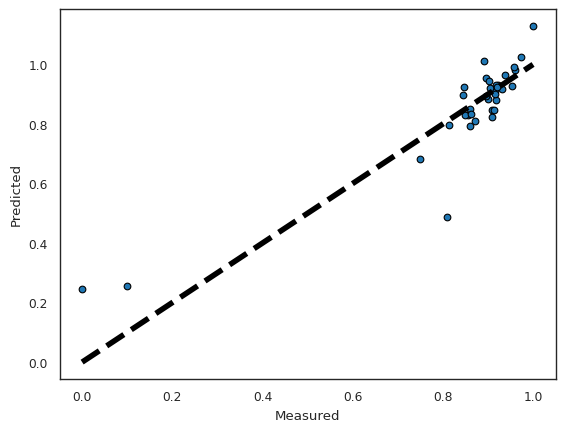

In [955]:
fig, ax = plt.subplots()
ax.scatter(y_train, y_pred, edgecolors=(0, 0, 0))
ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

Elasticity


<Axes: xlabel='elasticity', ylabel='feature'>

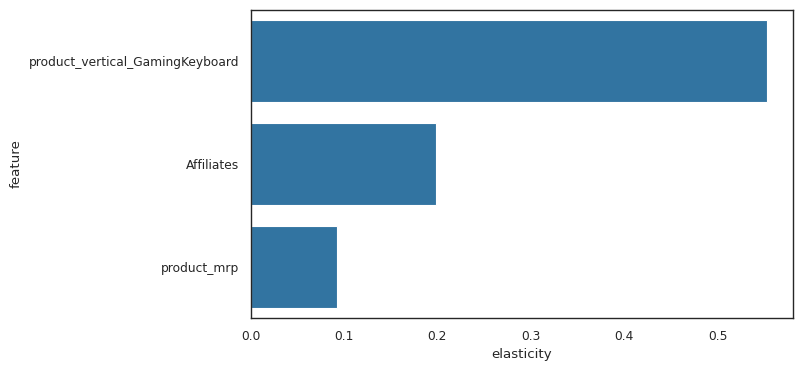

In [956]:
coefficients_df = pd.DataFrame(pd.DataFrame(lr.params)[1:]).reset_index()
coefficients_df.columns = ['feature','coefficient']
elasticity_data = calculateElasticity(X_train_rfe, y_train, coefficients_df)


plt.figure(figsize = (7,4))
sns.barplot(x = 'elasticity',y ='feature',data = elasticity_data.sort_values('elasticity', ascending = False))

## Distributed Lag Model(Multiplicative) for Home Audio


Splitting the Dataframe into Training and Testing Set

In [957]:
# We specify this so that the train and test data set always have the same rows, respectively
df_train, df_test = train_test_split(home_dis_mul_df, train_size = 0.7, test_size = 0.3, random_state = 100)

Rescaling the Features

In [958]:
scaler = MinMaxScaler()

In [959]:
num_vars= home_dis_mul_df.columns

In [960]:
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_test[num_vars] = scaler.fit_transform(df_test[num_vars])

In [961]:
y_train = df_train.pop('gmv')
X_train = df_train

In [962]:
# Running RFE for selecting top 20 features
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=20)             # running RFE
rfe = rfe.fit(X_train, y_train)

In [963]:
# selecting the features given by rfe
col = X_train.columns[rfe.support_]
col

Index(['order_payment_type_Prepaid', 'is_mass_market', 'product_mrp', 'Total Investment_SMA_3_lag2', 'Total Investment_SMA_5', 'TV_SMA_5', 'TV_SMA_5_lag1', 'Digital_lag1', 'Digital_Ad_Stock_lag3', 'Content Marketing', 'Content_Marketing_Ad_Stock_lag3', 'Online marketing_SMA_3_lag1', 'Online marketing_SMA_5', 'Online marketing_EMA_8_lag1', 'Affiliates_SMA_3_lag2', 'Radio_lag3', 'Radio_SMA_3_lag3', 'NPS', 'Stock Index_SMA_5', 'Cool Deg Days'], dtype='object')

In [964]:
# neglecting features not selected by rfe
X_train.columns[~rfe.support_]

Index(['gmv_lag1', 'gmv_lag2', 'gmv_lag3', 'Discount%', 'Discount%_lag1', 'Discount%_lag2', 'Discount%_lag3', 'deliverybdays', 'deliverybdays_lag1', 'deliverybdays_lag2',
       ...
       'Total Snow (cm)_lag2', 'Total Snow (cm)_lag3', 'Total Precip (mm)', 'Total Precip (mm)_lag1', 'Total Precip (mm)_lag2', 'Total Precip (mm)_lag3', 'Snow on Grnd (cm)', 'Snow on Grnd (cm)_lag1', 'Snow on Grnd (cm)_lag2', 'Snow on Grnd (cm)_lag3'], dtype='object', length=315)

In [965]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [966]:
# Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     2592.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           7.67e-19
Time:                        17:18:31   Log-Likelihood:                 150.76
No. Observations:                  33   AIC:                            -259.5
Df Residuals:                      12   BIC:                            -228.1
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,8889.95
5,Total Investment_SMA_5,751.60
4,Total Investment_SMA_3_lag2,465.97
14,Online marketing_EMA_8_lag1,365.62
13,Online marketing_SMA_5,327.70
2,is_mass_market,305.83
19,Stock Index_SMA_5,246.15
6,TV_SMA_5,142.60
1,order_payment_type_Prepaid,126.14
7,TV_SMA_5_lag1,112.61


In [967]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Stock Index_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     2953.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.38e-20
Time:                        17:18:32   Log-Likelihood:                 150.74
No. Observations:                  33   AIC:                            -261.5
Df Residuals:                      13   BIC:                            -231.5
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,4093.05
5,Total Investment_SMA_5,682.07
4,Total Investment_SMA_3_lag2,465.84
2,is_mass_market,256.79
13,Online marketing_SMA_5,236.64
14,Online marketing_EMA_8_lag1,189.96
6,TV_SMA_5,140.95
1,order_payment_type_Prepaid,110.97
15,Affiliates_SMA_3_lag2,109.40
7,TV_SMA_5_lag1,105.20


In [968]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Digital_Ad_Stock_lag3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     3194.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.26e-22
Time:                        17:18:32   Log-Likelihood:                 149.92
No. Observations:                  33   AIC:                            -261.8
Df Residuals:                      14   BIC:                            -233.4
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,4003.88
5,Total Investment_SMA_5,681.96
4,Total Investment_SMA_3_lag2,458.51
2,is_mass_market,255.06
12,Online marketing_SMA_5,234.52
13,Online marketing_EMA_8_lag1,176.41
6,TV_SMA_5,138.41
14,Affiliates_SMA_3_lag2,109.18
1,order_payment_type_Prepaid,109.13
7,TV_SMA_5_lag1,89.25


In [969]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Total Investment_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1621.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.17e-21
Time:                        17:18:32   Log-Likelihood:                 136.65
No. Observations:                  33   AIC:                            -237.3
Df Residuals:                      15   BIC:                            -210.4
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,838.09
2,is_mass_market,237.28
11,Online marketing_SMA_5,228.25
5,TV_SMA_5,135.32
12,Online marketing_EMA_8_lag1,104.93
6,TV_SMA_5_lag1,88.50
1,order_payment_type_Prepaid,87.93
14,Radio_lag3,29.62
10,Online marketing_SMA_3_lag1,28.88
3,product_mrp,26.24


In [970]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["NPS"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1834.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.99e-23
Time:                        17:18:32   Log-Likelihood:                 136.62
No. Observations:                  33   AIC:                            -239.2
Df Residuals:                      16   BIC:                            -213.8
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,669.76
11,Online marketing_SMA_5,212.84
2,is_mass_market,211.02
12,Online marketing_EMA_8_lag1,104.78
5,TV_SMA_5,104.61
1,order_payment_type_Prepaid,87.87
6,TV_SMA_5_lag1,68.43
10,Online marketing_SMA_3_lag1,26.07
3,product_mrp,24.31
14,Radio_lag3,23.53


In [971]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["TV_SMA_5_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     1238.
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           8.65e-23
Time:                        17:18:32   Log-Likelihood:                 128.07
No. Observations:                  33   AIC:                            -224.1
Df Residuals:                      17   BIC:                            -200.2
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,658.44
10,Online marketing_SMA_5,205.95
2,is_mass_market,132.98
11,Online marketing_EMA_8_lag1,103.76
1,order_payment_type_Prepaid,85.79
9,Online marketing_SMA_3_lag1,23.09
4,Total Investment_SMA_3_lag2,22.52
5,TV_SMA_5,20.51
3,product_mrp,18.53
15,Cool Deg Days,13.81


In [972]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["is_mass_market"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     147.5
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.29e-15
Time:                        17:18:32   Log-Likelihood:                 91.017
No. Observations:                  33   AIC:                            -152.0
Df Residuals:                      18   BIC:                            -129.6
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,658.44
9,Online marketing_SMA_5,148.17
10,Online marketing_EMA_8_lag1,96.35
8,Online marketing_SMA_3_lag1,22.24
1,order_payment_type_Prepaid,17.12
3,Total Investment_SMA_3_lag2,12.52
2,product_mrp,12.40
4,TV_SMA_5,11.18
14,Cool Deg Days,10.62
6,Content Marketing,6.44


In [973]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Online marketing_SMA_3_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     157.0
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.78e-16
Time:                        17:18:32   Log-Likelihood:                 89.942
No. Observations:                  33   AIC:                            -151.9
Df Residuals:                      19   BIC:                            -130.9
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,653.71
8,Online marketing_SMA_5,140.95
9,Online marketing_EMA_8_lag1,95.89
1,order_payment_type_Prepaid,15.82
2,product_mrp,12.39
3,Total Investment_SMA_3_lag2,10.96
13,Cool Deg Days,10.47
4,TV_SMA_5,10.34
6,Content Marketing,6.31
11,Radio_lag3,4.33


In [974]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Online marketing_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     117.2
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           8.27e-16
Time:                        17:18:32   Log-Likelihood:                 83.037
No. Observations:                  33   AIC:                            -140.1
Df Residuals:                      20   BIC:                            -120.6
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,652.05
8,Online marketing_EMA_8_lag1,14.03
1,order_payment_type_Prepaid,12.55
12,Cool Deg Days,9.25
3,Total Investment_SMA_3_lag2,8.87
4,TV_SMA_5,8.65
2,product_mrp,8.46
10,Radio_lag3,4.33
11,Radio_SMA_3_lag3,4.01
9,Affiliates_SMA_3_lag2,3.42


In [975]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Digital_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     131.7
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           8.42e-17
Time:                        17:18:32   Log-Likelihood:                 82.720
No. Observations:                  33   AIC:                            -141.4
Df Residuals:                      21   BIC:                            -123.5
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

,Features,VIF
0,const,620.21
7,Online marketing_EMA_8_lag1,14.01
1,order_payment_type_Prepaid,11.90
11,Cool Deg Days,9.19
4,TV_SMA_5,8.64
3,Total Investment_SMA_3_lag2,8.19
2,product_mrp,8.02
9,Radio_lag3,4.32
10,Radio_SMA_3_lag3,3.89
8,Affiliates_SMA_3_lag2,3.34


In [976]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Content_Marketing_Ad_Stock_lag3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.979
Model:                            OLS   Adj. R-squared:                  0.969
Method:                 Least Squares   F-statistic:                     102.2
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           4.59e-16
Time:                        17:18:32   Log-Likelihood:                 76.315
No. Observations:                  33   AIC:                            -130.6
Df Residuals:                      22   BIC:                            -114.2
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,608.01
6,Online marketing_EMA_8_lag1,13.83
1,order_payment_type_Prepaid,11.73
10,Cool Deg Days,9.13
4,TV_SMA_5,8.53
3,Total Investment_SMA_3_lag2,8.17
2,product_mrp,8.01
8,Radio_lag3,4.31
7,Affiliates_SMA_3_lag2,3.34
9,Radio_SMA_3_lag3,3.20


In [977]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Online marketing_EMA_8_lag1"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.969
Model:                            OLS   Adj. R-squared:                  0.958
Method:                 Least Squares   F-statistic:                     81.21
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.77e-15
Time:                        17:18:32   Log-Likelihood:                 70.209
No. Observations:                  33   AIC:                            -120.4
Df Residuals:                      23   BIC:                            -105.5
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,421.57
1,order_payment_type_Prepaid,11.73
4,TV_SMA_5,6.83
3,Total Investment_SMA_3_lag2,6.81
9,Cool Deg Days,5.50
2,product_mrp,5.44
7,Radio_lag3,3.99
8,Radio_SMA_3_lag3,2.94
6,Affiliates_SMA_3_lag2,2.89
5,Content Marketing,2.63


In [978]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Radio_SMA_3_lag3"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.969
Model:                            OLS   Adj. R-squared:                  0.959
Method:                 Least Squares   F-statistic:                     95.18
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           2.77e-16
Time:                        17:18:32   Log-Likelihood:                 70.184
No. Observations:                  33   AIC:                            -122.4
Df Residuals:                      24   BIC:                            -108.9
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,377.68
1,order_payment_type_Prepaid,9.75
3,Total Investment_SMA_3_lag2,6.81
4,TV_SMA_5,6.02
8,Cool Deg Days,5.28
2,product_mrp,4.80
7,Radio_lag3,2.86
6,Affiliates_SMA_3_lag2,2.84
5,Content Marketing,2.63


In [979]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Affiliates_SMA_3_lag2"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.951
Model:                            OLS   Adj. R-squared:                  0.937
Method:                 Least Squares   F-statistic:                     69.30
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           8.71e-15
Time:                        17:18:32   Log-Likelihood:                 62.387
No. Observations:                  33   AIC:                            -108.8
Df Residuals:                      25   BIC:                            -96.80
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,343.95
1,order_payment_type_Prepaid,9.20
4,TV_SMA_5,5.26
7,Cool Deg Days,4.12
2,product_mrp,4.11
3,Total Investment_SMA_3_lag2,3.89
6,Radio_lag3,2.80
5,Content Marketing,2.59


In [980]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Cool Deg Days"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.935
Model:                            OLS   Adj. R-squared:                  0.920
Method:                 Least Squares   F-statistic:                     62.58
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.27e-14
Time:                        17:18:32   Log-Likelihood:                 57.788
No. Observations:                  33   AIC:                            -101.6
Df Residuals:                      26   BIC:                            -91.10
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,219.14
1,order_payment_type_Prepaid,8.99
4,TV_SMA_5,5.01
2,product_mrp,3.86
5,Content Marketing,2.55
3,Total Investment_SMA_3_lag2,1.96
6,Radio_lag3,1.83


In [981]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Content Marketing"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.914
Model:                            OLS   Adj. R-squared:                  0.898
Method:                 Least Squares   F-statistic:                     57.18
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.62e-13
Time:                        17:18:33   Log-Likelihood:                 53.054
No. Observations:                  33   AIC:                            -94.11
Df Residuals:                      27   BIC:                            -85.13
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,185.38
1,order_payment_type_Prepaid,7.55
4,TV_SMA_5,4.19
2,product_mrp,3.84
3,Total Investment_SMA_3_lag2,1.55
5,Radio_lag3,1.47


In [982]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["TV_SMA_5"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.910
Model:                            OLS   Adj. R-squared:                  0.897
Method:                 Least Squares   F-statistic:                     70.91
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           3.07e-14
Time:                        17:18:33   Log-Likelihood:                 52.388
No. Observations:                  33   AIC:                            -94.78
Df Residuals:                      28   BIC:                            -87.29
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,155.24
2,product_mrp,3.48
1,order_payment_type_Prepaid,3.15
3,Total Investment_SMA_3_lag2,1.27
4,Radio_lag3,1.09


In [983]:
# drop feature  with higest p-value
X_train_rfe =X_train_rfe.drop(["Total Investment_SMA_3_lag2"], axis = 1)
 # Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

lr.params
print(lr.summary())
vif = pd.DataFrame()
vif['Features'] = X_train_lm .columns
vif['VIF'] = [variance_inflation_factor(X_train_lm .values, i) for i in range(X_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.899
Model:                            OLS   Adj. R-squared:                  0.888
Method:                 Least Squares   F-statistic:                     85.73
Date:                Sun, 16 Mar 2025   Prob (F-statistic):           1.61e-14
Time:                        17:18:33   Log-Likelihood:                 50.402
No. Observations:                  33   AIC:                            -92.80
Df Residuals:                      29   BIC:                            -86.82
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const               

,Features,VIF
0,const,124.19
1,order_payment_type_Prepaid,3.05
2,product_mrp,2.98
3,Radio_lag3,1.05


In [984]:
X_train_rfe.columns

Index(['order_payment_type_Prepaid', 'product_mrp', 'Radio_lag3'], dtype='object')

In [985]:
drop_columns_list = list(set(num_vars) - set(list(X_train_rfe.columns)))
print(drop_columns_list)

['Radio_EMA_8_lag3', 'Sponsorship_SMA_5_lag2', 'Digital_lag2', 'Online marketing_EMA_8_lag2', 'NPS_SMA_5', 'Online marketing_SMA_3_lag1', 'Cool Deg Days_lag2', 'TV_SMA_5_lag3', 'Max Temp_lag1', 'SEM_lag3', 'Affiliates_EMA_8', 'Total Investment', 'product_vertical_HomeAudioSpeaker_lag2', 'product_vertical_FMRadio', 'Affiliates_SMA_3_lag2', 'Stock Index_SMA_5', 'Discount%', 'Radio_SMA_5_lag2', 'Total Investment_lag2', 'Other_Ad_Stock_lag3', 'Total Investment_SMA_3_lag1', 'Digital_SMA_3_lag2', 'Online marketing', 'SEM', 'Sponsorship_EMA_8_lag2', 'TV_Ad_Stock_lag3', 'Total_Investment_Ad_Stock_lag1', 'product_vertical_HiFiSystem_lag2', 'Sponsorship_lag3', 'Online marketing_SMA_5', 'Affiliates_SMA_5_lag3', 'Content Marketing_SMA_3_lag1', 'Radio_SMA_5', 'is_mass_market_lag2', 'Total Investment_SMA_5_lag2', 'Digital_SMA_5_lag3', 'Online marketing_SMA_3', 'deliverycdays_lag2', 'Sponsorship_SMA_3_lag1', 'Other_SMA_5_lag1', 'NPS_SMA_5_lag2', 'NPS_lag1', 'Radio_SMA_5_lag3', 'Sponsorship_EMA_8_lag3

In [986]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

folds = KFold(n_splits = 10, shuffle = True, random_state = 100)
lm=LinearRegression()
scores = cross_val_score(lm, X_train_rfe, y_train, scoring='r2', cv=folds)
scores

array([ -7.01982666, -12.75882431,  -8.66414604,  -3.02124816,
        -6.39744303,  -4.29855238,  -1.21566234,  -0.33954862,
       -20.2638535 ,  -1.39072163])

In [987]:
y_pred = cross_val_predict(lm, X_train_rfe, y_train, cv=folds)

In [988]:
mse = mean_squared_error(y_train, y_pred)
r_squared = r2_score(y_train, y_pred)
print('Mean_Squared_Error :' ,mse)
print('r_square_value :',r_squared)

Mean_Squared_Error : 0.02364168813664625
r_square_value : 0.13197936333331906


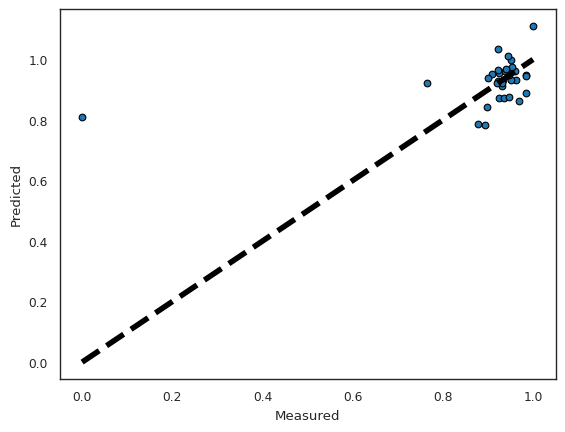

In [989]:
fig, ax = plt.subplots()
ax.scatter(y_train, y_pred, edgecolors=(0, 0, 0))
ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

Elasticity Analysis - Home Audio - Distributed Lag Model (Multiplicative)


<Axes: xlabel='elasticity', ylabel='feature'>

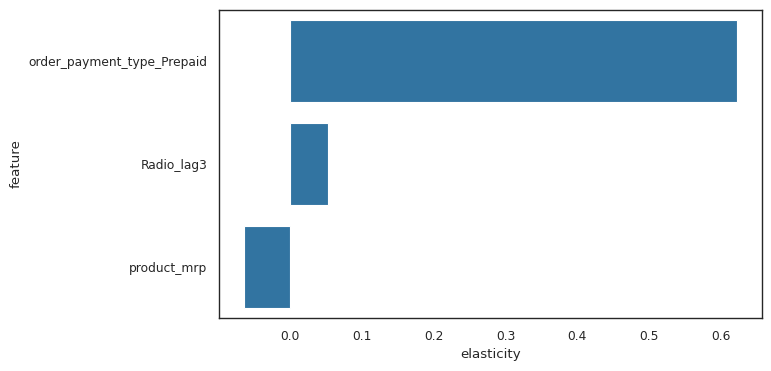

In [990]:
coefficients_df = pd.DataFrame(pd.DataFrame(lr.params)[1:]).reset_index()
coefficients_df.columns = ['feature','coefficient']
elasticity_data = calculateElasticity(X_train_rfe, y_train, coefficients_df)


plt.figure(figsize = (7,4))
sns.barplot(x = 'elasticity',y ='feature',data = elasticity_data.sort_values('elasticity', ascending = False))

# Step 5: Recommendations and Results

**Camera Accessory**
1.   Multiplicative Model is selected as the best model based on the high Adjusted R-square = 0.985 and low MSE = 0.00336 values.
2.   ElecKart should focus more on the Camera filters, accessories and Flash through Affiliate. The company can promote these products or pitch in more products in these categories


**Gaming Accessory**


1.   Multiplicative Model is selected as the best model based on high R-square = 0.968 and low MSE values= 0.00166
2.   The sale of GamingAccessoryKit through order payment type Prepaid has positive impact on the GMV value & try to keep up the SLA for the same



**Home Audio**


1.   Multiplicative Model is selected as the best model based highest R- square = 0.999 and low MSE values = 0.00035.
2.   The sale of HomeAudioSpeaker and FMRadio has positive impact on the GMV value. Hence, the company should promote these products or pitch in more products in these categories.



------
## A Project by Aloke KR Das | Rayees Daanish Syed | Jai Ganesh G | Latika Khandelwal
------